# Developed CNN Architecture (No Improving CNN Architecture + Bicubic Grayscale PNG + 5-Fold))

### 1.1 Libraries

In [3]:
%%time

import os
#import gc
import optuna
import pickle
import shutil
import numpy as np
import pandas as pd
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import math
from tqdm import tqdm

# Importar librerias de tensorflow
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model
#from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.layers import BatchNormalization, Dropout
from tensorflow.keras import models, layers, optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.regularizers import l2

from optuna.visualization.matplotlib import plot_optimization_history, plot_param_importances

from sklearn.model_selection import StratifiedKFold
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import MinMaxScaler

CPU times: user 1.17 ms, sys: 625 µs, total: 1.8 ms
Wall time: 1.65 ms


In [4]:
!nvidia-smi

Wed Jul 16 02:04:56 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.107.02             Driver Version: 550.107.02     CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA RTX A5500               Off |   00000000:1A:00.0 Off |                  Off |
| 30%   27C    P8             16W /  230W |       4MiB /  24564MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [5]:
import tensorflow as tf
print(tf.config.list_physical_devices('GPU'))
print(tf.config.experimental.get_visible_devices())


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


### 1.2. Sound and Source

In [6]:
from IPython.display import Audio
import time

def sound():
    beep_07a_path = '/notebooks/beep-07a.wav'
    beep_08b_path = '/notebooks/beep-08b.wav'

    for _ in range(2):
        sound_beep_07a = Audio(beep_07a_path, autoplay=True)
        display(sound_beep_07a)
        time.sleep(0.3)
        sound_beep_08b = Audio(beep_08b_path, autoplay=True)
        display(sound_beep_08b)
        time.sleep(0.3)
sound()

### 1.3. Create a dictionary to store samples by malware families

In [7]:
source = '/notebooks/train3/'
# Inicializar un diccionario para almacenar la cantidad de muestras por familia
malware_families_train, malware_families_valid, malware_families_test, malware_families = {}, {}, {}, {}
train_data_dir = os.path.join(source, 'centum_1500/train/')
valid_data_dir = os.path.join(source, 'centum_1500/valid/')
test_data_dir = os.path.join(source, 'centum_1500/test/')
# Recorrer los directorios de las familias de malware
for familia in os.listdir(train_data_dir):
    # Comprobar si es un directorio
    if os.path.isdir(os.path.join(train_data_dir, familia)):
        # Contar la cantidad de archivos en el directorio de la familia
        cantidad_muestras_train = len(os.listdir(os.path.join(train_data_dir, familia)))
        cantidad_muestras_valid = len(os.listdir(os.path.join(valid_data_dir, familia)))
        cantidad_muestras_test = len(os.listdir(os.path.join(test_data_dir, familia)))
        # Agregar la cantidad al diccionario con el nombre de la familia como clave
        malware_families_train[familia] = cantidad_muestras_train
        malware_families_valid[familia] = cantidad_muestras_valid
        malware_families_test[familia] = cantidad_muestras_test

for d in (malware_families_train, malware_families_valid, malware_families_test):
    for key, value in d.items():
        if key in malware_families:
            malware_families[key] += value
        else:
            malware_families[key] = value

# Ordenar las familias de mayor a menor según la cantidad de muestras
sorted_families = sorted(malware_families.items(), key=lambda x: x[1], reverse=True)
# Imprimir el diccionario resultante
sorted_families

[('sfone', 1500),
 ('sillyp2p', 1500),
 ('Allaple.A', 1500),
 ('Ramnit', 1500),
 ('wabot', 1500),
 ('mira', 1500),
 ('Kelihos_ver3', 1500),
 ('ganelp', 1500),
 ('Allaple.L', 1500),
 ('wacatac', 1500),
 ('dinwod', 1500),
 ('Lollipop', 1500),
 ('berbew', 1500),
 ('small', 1500),
 ('upatre', 1500)]

### 1.3. Create a dictionary to store samples by malware families

In [8]:
%%time

def copy_malware_families(source, num_experiments, sorted_families):
    
    # Crea el directorio que contendrá el malware
    experiment_dir = os.path.join(source, "all_malware", str(num_experiments))
    os.makedirs(experiment_dir, exist_ok=True)

    # Ordenar las familias de mayor a menor según la cantidad de muestras
    #sorted_families = sorted(malware_families.items(), key=lambda x: x[1], reverse=True)

    # Crear directorios train, test, y valid del experimento
    for data_type in ['train', 'test', 'valid']:
        data_dir = os.path.join(experiment_dir, data_type)
        os.makedirs(data_dir, exist_ok=True)
        
        # Copiar las familias correspondientes
        for j in range(num_experiments):
            family_name, num_samples = sorted_families[j]
            family_dir = os.path.join(data_dir, family_name)
            os.makedirs(family_dir, exist_ok=True)
            source_dir = os.path.join(source, 'centum_1500', data_type, family_name)
            
            # Copiar las num_samples muestras de cada familia
            for filename in os.listdir(source_dir)[:num_samples]:
                source_path = os.path.join(source_dir, filename)
                dest_path = os.path.join(family_dir, filename)
                shutil.copy(source_path, dest_path)
    print("Familias de malware copiadas")
    #sound()

def delete_experiment_dir(source, num_experiments):
    experiment_dir = os.path.join(source, "all_malware", str(num_experiments))
    shutil.rmtree(experiment_dir)
    print(f"La carpeta {str(num_experiments)} fue eliminada.")

CPU times: user 11 µs, sys: 6 µs, total: 17 µs
Wall time: 31 µs


## 2. Convolutional Neural Network Decay Evaluation Metrics by Increase in Malware Families

### 2.1. Calculate Weights by Class

In [9]:
%%time

def weights_by_class(train_generator):
    # Calculate class weights using compute_class_weight
    class_weights = compute_class_weight(class_weight = 'balanced',
                         classes = np.unique(train_generator.classes), 
                         y = train_generator.classes)
    # Create a dictionary of class weights
    class_weight_dict = dict(enumerate(class_weights))
    # Print class weights
    print("Class Weights:", class_weight_dict)
    return class_weight_dict

CPU times: user 8 µs, sys: 4 µs, total: 12 µs
Wall time: 18.6 µs


### 2.2. Image generator (Training, validation, and testing)

In [10]:
%%time

def data_gen(source_cnn, train_data_dir, validation_data_dir, test_data_dir):
    # Settings for Data Generator
    train_datagen = ImageDataGenerator(rescale=1./255)
    validation_datagen = ImageDataGenerator(rescale=1./255)
    test_datagen = ImageDataGenerator(rescale=1./255)

    train_generator = train_datagen.flow_from_directory(
            train_data_dir,
            target_size=(img_width, img_height),
            batch_size=batch_size,
            class_mode='categorical')

    validation_generator = validation_datagen.flow_from_directory(
            validation_data_dir,
            target_size=(img_width, img_height),
            batch_size=batch_size,
            class_mode='categorical')

    test_generator = test_datagen.flow_from_directory(
            test_data_dir,
            target_size=(img_width, img_height),
            batch_size=batch_size,
            class_mode='categorical')
    return (train_generator, validation_generator, test_generator)

CPU times: user 6 µs, sys: 3 µs, total: 9 µs
Wall time: 15.3 µs


### 2.3. Creation of the Model Based on the Architecture
Descongelamos 5 capas de MobileNet para esta versión, pero para más adelante, version optimizada,podemos desconger 10 capas.

In [11]:
%time

def new_model(num_classes, best_params=None):
    if best_params is None:
        best_params = {
            'learning_rate': 0.001,
            'dropout_rate1': 0.4,
            'dropout_rate2': 0.3,
            'l2_reg': 0.001,
            'units_dense1': 512,
            'units_dense2': 128,
            'batch_size': 32,
            'num_dense_layers': 2,  # Nueva variable
            'units_dense3': 64,    # Nueva variable
            'dropout_rate3': 0.2,    # Nueva variable
            'unfreeze_layers': 5  # Valor por defecto
        }
    
    base_model = MobileNet(weights='imagenet',
                         include_top=False,
                         input_shape=(img_width, img_height, 3))

    # Congelar todas las capas primero
    for layer in base_model.layers:
        layer.trainable = False

    # Descongelar las últimas N capas según best_params
    if 'unfreeze_layers' in best_params:
        num_layers_to_unfreeze = best_params['unfreeze_layers']
        # Asegurarnos de no exceder el número de capas del modelo
        num_layers_to_unfreeze = min(num_layers_to_unfreeze, len(base_model.layers))
        
        for layer in base_model.layers[-num_layers_to_unfreeze:]:
            layer.trainable = True
    else:
        # Valor por defecto si no está en best_params (últimas 5 capas)
        for layer in base_model.layers[-5:]:
            layer.trainable = True

    x = base_model.output
    x = layers.GlobalAveragePooling2D()(x)
    
    # Primera capa densa
    x = layers.Dense(best_params['units_dense1'], activation='relu', 
                    kernel_regularizer=l2(best_params['l2_reg']))(x)
    x = BatchNormalization()(x)
    x = Dropout(best_params['dropout_rate1'])(x)
    
    # Segunda capa densa
    x = layers.Dense(best_params['units_dense2'], activation='relu', 
                    kernel_regularizer=l2(best_params['l2_reg']))(x)
    x = Dropout(best_params['dropout_rate2'])(x)
    
    # Capas adicionales condicionales
    if best_params.get('num_dense_layers', 2) >= 3:
        x = layers.Dense(best_params['units_dense3'], activation='relu',
                        kernel_regularizer=l2(best_params['l2_reg']))(x)
        x = Dropout(best_params['dropout_rate3'])(x)
    
    predictions = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs=base_model.input, outputs=predictions)
    
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=best_params['learning_rate']),
                loss='categorical_crossentropy',
                metrics=['accuracy'])
    
    # Calculate the total # parameters
    total_params = model.count_params()
    trainable_params = sum([tf.keras.backend.count_params(w) for w in model.trainable_weights])
    non_trainable_params = total_params - trainable_params
    # Print request info paramers
    print("Total params: {}".format(total_params))
    print("Trainable params: {}".format(trainable_params))
    print("Non-trainable params: {}".format(non_trainable_params))
    
    return model

CPU times: user 2 µs, sys: 1 µs, total: 3 µs
Wall time: 5.96 µs


### 2.4. Evaluate the model and graphs

#### 2.4.1. Get the accuracy and log loss of the model (Train, Validation and Test)

In [12]:
%%time

def prediction(model, train_generator, validation_generator, test_generator):
    # Obtener la precisión y la pérdida en el conjunto de datos de entrenamiento
    train_loss, train_acc = model.evaluate(train_generator, verbose=1)
    print('Train Accuracy:', train_acc)
    print('Train Log Loss:', train_loss)

    # Obtener la precisión y la pérdida en el conjunto de datos de validación
    val_loss, val_acc = model.evaluate(validation_generator, verbose=1)
    print('Validation Accuracy:', val_acc)
    print('Validation Log Loss:', val_loss)

    # Obtener la precisión y la pérdida en el conjunto de datos de prueba
    test_loss, test_acc = model.evaluate(test_generator, verbose=1)
    print('Test Accuracy:', test_acc)
    print('Test Log Loss:', test_loss)
    
    # Return test_loss and test_acc
    return(test_acc, test_loss)

CPU times: user 6 µs, sys: 3 µs, total: 9 µs
Wall time: 13.6 µs


#### 2.4.2. Precision, Recall, Confusion Matrix and  AUC

In [13]:
%%time

def confu_matrix(model, test_generator):
# Get the total number of samples in the test builder
    total_samples = len(test_generator)
    print(f"Test labels: {test_generator.class_indices}")

    # Get test builder batch size
    batch_size = test_generator.batch_size

    # Create lists to store the actual and predicted labels
    true_labels = []
    predicted_labels = []

    # Iterate over all batches in the test builder
    for batch_index in range(total_samples):
        # Get a batch of data from the test builder
        batch_images, batch_labels = test_generator[batch_index]

        # Make predictions on the current batch
        batch_predictions = model.predict_on_batch(batch_images)

        # Get the actual labels of the current batch
        true_labels.extend(np.argmax(batch_labels, axis=1))

        # Get the predicted labels of the current batch
        predicted_labels.extend(np.argmax(batch_predictions, axis=1))

    # Convert lists of labels to numpy arrays
    true_labels = np.array(true_labels)
    predicted_labels = np.array(predicted_labels)

    # Calculate the confusion matrix
    confusion_mtx = confusion_matrix(true_labels, predicted_labels)

    print("\nMatriz de Confusión:")
    print(confusion_mtx)
    print(f"True labels: {len(true_labels)}")
    print(f"Predicted labels: len(predicted_labels)")

    # Get the classification report
    class_report = classification_report(true_labels, predicted_labels)

    # Print the classification report
    print('\nClassification report:')
    print(class_report)

    # Get the predictions for the test dataset
    y_test_pred = model.predict(test_generator)

    # Get the AUC
    #test_auc = roc_auc_score(true_labels, y_test_pred, multi_class='ovr')
    #print('AUC:', test_auc)
    
    # Normalize the confusion matrix
    cm_norm = confusion_mtx.astype('float') / confusion_mtx.sum(axis=1)[:, np.newaxis]

    # Set up plot with 12x12 inch figure
    plt.figure(figsize=(12, 12))
    sns.heatmap(cm_norm, annot=True, cmap='Blues', fmt='.2f')
    plt.show()
    
    crd = classification_report(true_labels, predicted_labels, output_dict=True)
    
    return crd['macro avg']['precision'], crd['macro avg']['recall'], crd['macro avg']['f1-score']
    

CPU times: user 6 µs, sys: 3 µs, total: 9 µs
Wall time: 15 µs


## 3. Decay Evaluation Metrics by Increase in Malware Families

### 3.1. Settings (Configurar)

In [14]:
%%time

# Experiment dir 
source = '/notebooks/train3/'

# Model names to use for save'
nombre_modelo = 'MobileNet_tf_1500'
save_model = source + 'layer_contribution/MobileNet_tf_optimized/'
os.makedirs(save_model, exist_ok=True)

# Resize all images to 224x224
img_width, img_height = 224, 224

# Configuring the hyperparameters
batch_size = 32
num_epochs = 50
learning_rate = 0.0001
num_folds = 5

test_acc_list_all = []
test_loss_list_all = []
precision_list_all = []
recall_list_all = []
f1_score_list_all = []

sound()


CPU times: user 17.9 ms, sys: 985 µs, total: 18.9 ms
Wall time: 1.22 s


In [15]:
%%time

def calculate_layer_importance21(model, train_generator, confidence_level=0.95, margin_error=0.05, verbose=True):
    """
    Calcula la importancia de cada capa (incluyendo capas personalizadas) observando los gradientes de sus pesos respecto a la pérdida.
    
    Args:
        model: Modelo de Keras (incluye base MobileNet y capas personalizadas)
        train_generator: Generador de datos de entrenamiento
        confidence_level: Nivel de confianza para el muestreo (0.95 por defecto)
        margin_error: Margen de error para el muestreo (0.05 por defecto)
        verbose: Si True, muestra información detallada del proceso
    
    Returns:
        Lista de tuplas (nombre_capa, importancia) ordenadas por importancia descendente
    """

    def calculate_sample_size(population, confidence_level=0.95, margin_error=0.05):
        """Calcula el tamaño de muestra necesario usando la fórmula de Cochran."""
        if confidence_level == 1.0 or margin_error == 0.0:
            return population
        z_values = {0.90: 1.645, 0.95: 1.96, 0.99: 2.576}
        z = z_values.get(confidence_level, 1.96)
        p = 0.5  # Proporción conservadora
        n0 = (z**2 * p * (1 - p)) / (margin_error**2)
        return math.ceil(n0 / (1 + (n0 - 1) / population))

    # Asegurar que todas las capas sean entrenables
    for layer in model.layers:
        layer.trainable = True

    # Calcular tamaño de muestra
    population_size = train_generator.samples
    sample_size = calculate_sample_size(population_size, confidence_level, margin_error)

    if verbose:
        print(f"\nCalculando importancia con {sample_size} muestras ({confidence_level*100:.0f}% confianza, ±{margin_error*100:.0f}% error)")
        print(f"Incluyendo {len(model.layers)} capas (base + personalizadas)")

    k = max(1, population_size // sample_size)
    train_generator.reset()

    # Diccionario para acumular importancia por capa
    layer_importance = {}
    processed_samples = 0

    # Obtener nombres descriptivos para capas personalizadas
    def get_layer_descriptive_name(layer):
        if 'dense' in layer.name:
            return f"{layer.name}_units{layer.units}"
        elif 'batch_normalization' in layer.name:
            return f"{layer.name}_bn"
        elif 'dropout' in layer.name:
            return f"{layer.name}_drop{layer.rate}"
        return layer.name

    # Barra de progreso opcional
    progress_bar = tqdm(total=sample_size, disable=not verbose)

    for batch_idx in range(len(train_generator)):
        if processed_samples >= sample_size:
            break

        x_batch, y_batch = train_generator[batch_idx]

        for i in range(0, len(x_batch), k):
            if processed_samples >= sample_size:
                break

            img = tf.convert_to_tensor(x_batch[i:i+1], dtype=tf.float32)
            label = tf.convert_to_tensor(y_batch[i:i+1], dtype=tf.float32)

            with tf.GradientTape(persistent=True) as tape:
                predictions = model(img, training=False)
                loss = tf.reduce_mean(tf.keras.losses.categorical_crossentropy(label, predictions))

            # Calcular gradientes para todos los pesos entrenables
            grads = tape.gradient(loss, model.trainable_weights)

            for weight, grad in zip(model.trainable_weights, grads):
                if grad is None:
                    continue
                
                # Obtener nombre de capa y hacerlo más descriptivo
                layer_name_parts = weight.name.split('/')
                base_layer_name = layer_name_parts[0]
                
                # Buscar la capa correspondiente en el modelo
                layer = next((l for l in model.layers if l.name == base_layer_name), None)
                
                if layer is not None:
                    # Nombre descriptivo para la capa
                    descriptive_name = get_layer_descriptive_name(layer)
                    
                    # Calcular importancia (valor absoluto medio del gradiente)
                    score = tf.reduce_mean(tf.abs(grad)).numpy()
                    
                    # Acumular importancia
                    if descriptive_name in layer_importance:
                        layer_importance[descriptive_name].append(score)
                    else:
                        layer_importance[descriptive_name] = [score]

            del tape  # Liberar memoria de la cinta
            processed_samples += 1
            progress_bar.update(1)

    progress_bar.close()

    # Calcular promedio de importancia para cada capa
    final_importance = {
        name: np.mean(scores) if scores else 0.0
        for name, scores in layer_importance.items()
    }

    # Ordenar capas por importancia descendente
    sorted_layers = sorted(final_importance.items(), key=lambda x: x[1], reverse=True)

    if verbose:
        print("\nResultados de importancia de capas (incluyendo personalizadas):")
        print("-" * 70)
        print(f"{'Pos.':<5} | {'Nombre de Capa':<40} | {'Importancia':<15}")
        print("-" * 70)
        for i, (name, importance) in enumerate(sorted_layers):
            print(f"{i+1:<5} | {name:<40} | {importance:.7f}")
        print("-" * 70)

    return sorted_layers
    

CPU times: user 8 µs, sys: 0 ns, total: 8 µs
Wall time: 11.2 µs


In [16]:
%time

def objective(trial, num_classes, layers_to_train, source=10, pretrained_model_path=None):
    try:
        # 1. Configuración inicial y verificación de directorios
        source2 = os.path.join(source, 'all_malware', str(num_classes))
        if not os.path.exists(source2):
            raise FileNotFoundError(f"Directory {source2} does not exist")
            
        # Hiperparámetros a optimizar
        params = {
            'learning_rate': trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True),
            'dropout_rate1': trial.suggest_float('dropout_rate1', 0.2, 0.6),
            'dropout_rate2': trial.suggest_float('dropout_rate2', 0.1, 0.5),
            'l2_reg': trial.suggest_float('l2_reg', 1e-5, 1e-2, log=True),
            'units_dense1': trial.suggest_categorical('units_dense1', [256, 512, 1024]),
            'units_dense2': trial.suggest_categorical('units_dense2', [64, 128, 256]),
            #'batch_size': trial.suggest_categorical('batch_size', [16, 32, 64]),
            #'epochs': trial.suggest_int('epochs', 30, 70),
            'num_dense_layers': trial.suggest_int('num_dense_layers', 2, 3),
            'unfreeze_layers': trial.suggest_int('unfreeze_layers', 5, 15),
            'early_stopping_patience': trial.suggest_int('early_stopping_patience', 10, 20),
            'reduce_lr_patience': trial.suggest_int('reduce_lr_patience', 8, 15),
            'fine_tune_learning_rate': trial.suggest_float('fine_tune_learning_rate', 1e-6, 1e-4, log=True)
        }
    
        # Añadir parámetros condicionales para la tercera capa
        if params['num_dense_layers'] >= 3:
            params['units_dense3'] = trial.suggest_categorical('units_dense3', [32, 64, 128])
            params['dropout_rate3'] = trial.suggest_float('dropout_rate3', 0.1, 0.4)
        
        # 3. Cargar modelo pre-entrenado si está disponible
        if pretrained_model_path and os.path.exists(pretrained_model_path):
            print(f"\nLoading pretrained model from {pretrained_model_path}")
            try:
                # Cargar modelo pre-entrenado
                model = load_model(pretrained_model_path, compile=False)

                # Configurar capas entrenables según nombre o por posición (últimas N capas)
                for layer in model.layers:
                    # Entrenable si está en la lista o si es una de las últimas N capas
                    layer.trainable = (layer.name in layers_to_train) or (layer in model.layers[-params['unfreeze_layers']:])

                # Recompilar con nuevos parámetros de optimización
                model.compile(
                    optimizer=tf.keras.optimizers.Adam(
                        learning_rate=params['fine_tune_learning_rate']  # LR más bajo para fine-tuning
                    ),
                    loss='categorical_crossentropy',
                    metrics=['accuracy']
                )
                
                print("Successfully loaded and modified pretrained model")

            except Exception as e:
                print(f"Error loading pretrained model: {e}. Creating new model...")
                model = new_model(num_classes, params)

        # 4. Preparar generadores de datos
        train_generator, validation_generator, _ = data_gen(
            source2, 
            os.path.join(source2, 'train'), 
            os.path.join(source2, 'valid'), 
            os.path.join(source2, 'test')
        )

        # 5. Callbacks
        callbacks = [
            EarlyStopping(
                monitor='val_loss',
                patience=params['early_stopping_patience'],
                restore_best_weights=True
            ),
            ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.2,
                patience=params['reduce_lr_patience'],
                min_lr=1e-6
            ),
            tf.keras.callbacks.TerminateOnNaN()
        ]
        
        # 6. Entrenamiento
        #print("\nIniciamos entrenamiento de la función objective")
        history = model.fit(
            train_generator,
            steps_per_epoch=train_generator.samples // batch_size,
            epochs=num_epochs,
            validation_data=validation_generator,
            validation_steps=validation_generator.samples // batch_size,
            callbacks=callbacks,
            verbose=0,
            #verbose=1 if trial.number % 5 == 0 else 0  # Mostrar progreso cada 5 trials
        )
        
        # 7. Limpieza de memoria
        #tf.keras.backend.clear_session()
        #gc.collect()
        
        return max(history.history['val_accuracy']), min(history.history['val_loss'])
        
    except Exception as e:
        print(f"Error in trial {trial.number}: {str(e)}")
        #tf.keras.backend.clear_session()
        #gc.collect()
        return 0.0, float('inf')


def optimize_hyperparameters(num_classes, source, layers_to_train, n_trials=0, pretrained_model_path=None):
    # Crear estudio multi-objetivo
    study = optuna.create_study(
        directions=['maximize', 'minimize'],  # Primero accuracy, luego loss
        study_name=f"malware_classification_{num_classes}classes"
        #sampler=TPESampler(),
        #pruner=HyperbandPruner()
    )
    
    # Ejecutar optimización
    study.optimize(
        lambda trial: objective(trial, num_classes, layers_to_train, source, pretrained_model_path),
        n_trials=n_trials,
        timeout=3600 * 3  # 3 horas de timeout opcional
    )
    
    # Visualizaciones
    print("Mejores trials para cada objetivo:")
    for i, best_trial in enumerate(study.best_trials):
        print(f"  Trial {best_trial.number}:")
        print(f"    val_accuracy: {best_trial.values[0]:.4f}")
        print(f"    val_loss: {best_trial.values[1]:.4f}")
        print("    Parámetros:", best_trial.params)

    # Gráfico 1: Optimization History (Accuracy) - Figura individual
    plt.figure(figsize=(7, 5))
    plot_optimization_history(
        study,
        target=lambda trial: trial.values[0],
        target_name="val_accuracy"
    )
    plt.title("Optimization History (Accuracy)")
    plt.tight_layout()
    plt.show()
    
    # Gráfico 2: Optimization History (Loss) - Figura individual
    plt.figure(figsize=(7, 5))
    plot_optimization_history(
        study,
        target=lambda trial: trial.values[1],
        target_name="val_loss"
    )
    plt.title("Optimization History (Loss)")
    plt.tight_layout()
    plt.show()
    
    # # Gráfico 3: Parameter Importances - Figura individual
    # plt.figure(figsize=(7, 5))
    # if len(study.trials) > 1:
    #     try:
    #         plot_param_importances(
    #             study,
    #             target=lambda trial: trial.values[0],
    #             target_name="val_accuracy"
    #         )
    #         plt.title("Parameter Importances (Accuracy)")
    #     except ValueError as e:
    #         plt.text(0.5, 0.5, "Not enough trials\nfor importance analysis", 
    #                 ha='center', va='center')
    #         plt.title("Parameter Importances\n(Not available)")
    # else:
    #     plt.text(0.5, 0.5, "Need at least 2 trials\nfor importance analysis", 
    #             ha='center', va='center')
    #     plt.title("Parameter Importances\n(Not available)")
    
    # plt.tight_layout()
    # plt.show()

    # Gráfico 3: Parameter Importances - Con manejo mejorado de errores
    plt.figure(figsize=(7, 5))
    if len(study.trials) > 1:
        try:
            # Verificar si hay variación en los valores objetivo
            accuracy_values = [t.values[0] for t in study.trials if t.values]
            if len(set(accuracy_values)) > 1:  # Solo si hay variación
                plot_param_importances(
                    study,
                    target=lambda trial: trial.values[0],
                    target_name="val_accuracy"
                )
                plt.title("Parameter Importances (Accuracy)")
            else:
                plt.text(0.5, 0.5, "No variation in accuracy values\nCannot compute importances", 
                        ha='center', va='center')
                plt.title("Parameter Importances\n(No variation)")
        except Exception as e:
            plt.text(0.5, 0.5, f"Error computing importances:\n{str(e)}", 
                    ha='center', va='center')
            plt.title("Parameter Importances\n(Error)")
    else:
        plt.text(0.5, 0.5, "Need at least 2 trials\nfor importance analysis", 
                ha='center', va='center')
        plt.title("Parameter Importances\n(Not available)")
    
    plt.tight_layout()
    plt.show()

    
    best_trial = study.best_trials[0]
    
    return best_trial.params

CPU times: user 1e+03 ns, sys: 1e+03 ns, total: 2 µs
Wall time: 3.81 µs


In [21]:
%%time

def exp(num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, 
        precission_list_all, recall_list_all, f1_score_list_all):
    
    # 1. Copiar las familias a ser clasificadas
    copy_malware_families(source, num_classes, sorted_families)

    # 2. Configuración de directorios y generadores
    source2 = os.path.join(source, 'all_malware',str(num_classes))
    print(f"source2: {source2}")
    name_save_model = nombre_modelo + str(num_classes)
    print(f"name_save_model: {name_save_model}")

    # 4. Preparar generadores de datos
    train_generator, validation_generator, test_generator = data_gen(
        source2,
        os.path.join(source2, 'train'),
        os.path.join(source2, 'valid'),
        os.path.join(source2, 'test')
    )

    # Print the familias to be classified
    print("Lista de clases de malware a ser analizadas:")
    source_dir = os.path.join(source2, 'train/')
    for  dir in os.listdir(source_dir):
        print("- "+dir)

    # 3. Optimización de hiperparámetros
    model_path = os.path.join(save_model, f'{name_save_model}_best.h5')
    print(f'model_path: {model_path}')
    
    if not os.path.exists(model_path):
        print("No pre-trained model found. Stopping execution...")
        return test_acc_list_all, test_loss_list_all, precission_list_all, recall_list_all, f1_score_list_all

    print("Loading pre-trained model...")
    try:
        model = load_model(model_path, compile=False)
        print("Model loaded successfully.")
        
        # Calcular importancia de capas solo una vez
        print("\nCalculating layer importance (once for all folds)...")

        layer_importance = calculate_layer_importance21(model, train_generator, confidence_level=1.0, margin_error=0.0, verbose=True)

        if layer_importance is None:
            print("Error crítico: No se pudo calcular importancia de capas.")
            top_3_layers = []
        else:
            # Obtener las 3 capas más importantes
            top_3_layers = [name for name, imp in layer_importance[:3]]
        
        # Obtener las últimas 7 capas del modelo completo
        #last_7_layers = [layer.name for layer in model.layers[-7:]]
        last_7_layers = []
        
        # Combinar ambos conjuntos (eliminando duplicados)
        layers_to_train = list(set(top_3_layers + last_7_layers))
        
        if top_3_layers:
            print("\nTop 3 capas más importantes:")
            for i, name in enumerate(top_3_layers):
                print(f"  {i+1}. {name}")
        
        print(f"\nTotal capas a entrenar: {len(layers_to_train)}")
                
    except Exception as e:
        print(f"Error loading model: {e}. Stopping execution...")
        return test_acc_list_all, test_loss_list_all, precission_list_all, recall_list_all, f1_score_list_all
        
    
    best_params = optimize_hyperparameters(num_classes, source, layers_to_train, 5, model_path, )


    # 5. Configuración de entrenamiento
    # num_epochs = best_params['epochs']
    # batch_size = best_params['batch_size']
    learning_rate = best_params['learning_rate']
    unfreeze_layers = best_params.get('unfreeze_layers', 5)

    # Callbacks mejorados
    callbacks = [
        EarlyStopping(
            monitor='val_accuracy',
            patience=best_params.get('early_stopping_patience', 15),
            restore_best_weights=True,
            verbose=1
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.2,
            patience=best_params.get('reduce_lr_patience', 10),
            min_lr=1e-6,
            verbose=1
        )
    ]

    # 6. Validación cruzada
    num_folds = 5
    # Split the data set into folds
    skf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

    # Lists to store the metrics of each fold
    fold_train_histories, fold_val_histories = [], []
    test_loss_list, test_acc_list = [], []
    precision_list, recall_list, f1_score_list = [], [], []
    
    # Variables to track the best fold
    best_val_accuracy = 0
    best_fold_idx = 0

    for fold_idx, (train_index, val_index) in enumerate(skf.split(train_generator.filenames, train_generator.classes)):
        print('')
        print('=' * 100)
        print(f'TRAINING AND EVALUATING FOLD {fold_idx + 1}/{num_folds}...\n')

        # 7. Try to load pre-trained model or stop the execution
        if os.path.exists(model_path):
            print(f"Loading pre-trained model from {model_path}")
            try:
                model = load_model(model_path, compile=False)
                print("Model loaded successfully.")
                #print("Model loaded successfully. Summary:")
                #model.summary()

                for layer in model.layers:
                    layer.trainable = (layer.name in layers_to_train) or (layer in model.layers[-unfreeze_layers:])

                # Reporte de capas entrenables
                print("\nCapas configuradas como entrenables:")
                trainable_layers = [layer.name for layer in model.layers if layer.trainable]
                for name in trainable_layers:
                    print(f"- {name}")
                print(f"Total: {len(trainable_layers)}/{len(model.layers)} capas entrenables")
                
                # Recompile the model with the same optimizer settings
                model.compile(
                    optimizer=Adam(learning_rate=learning_rate * 0.1),  # LR más bajo para fine-tuning
                    loss='categorical_crossentropy',
                    metrics=['accuracy']
                )
                print("Model loaded and recompiled for fine-tuning")
            except Exception as e:
                print(f"Error loading model: {e}. Creating new model...")
                return test_acc_list_all, test_loss_list_all, precission_list_all, recall_list_all, f1_score_list_all
        else:
            print("No pre-trained model found. Stoping execution...")
            return test_acc_list_all, test_loss_list_all, precission_list_all, recall_list_all, f1_score_list_all

        # Training the pre-trained model
        history_model = model.fit(
            train_generator,
            steps_per_epoch=train_generator.samples // batch_size,
            epochs=num_epochs,
            validation_data=validation_generator,
            validation_steps=validation_generator.samples // batch_size,
            callbacks=callbacks,
        )

        sound()

        # Check if this fold is the best one
        current_val_accuracy = max(history_model.history['val_accuracy'])
        if current_val_accuracy > best_val_accuracy:
            best_val_accuracy = current_val_accuracy
            best_fold_idx = fold_idx + 1

        ##### SAVE HISTORY #####
        history_filename = f'c8_base_more_50_epochs_and_cbks_{name_save_model}_{fold_idx + 1}.pkl'
        with open(os.path.join(save_model, history_filename), 'wb') as file:
            pickle.dump(history_model.history, file)
        print(f"History for fold {fold_idx + 1} saved as {history_filename}")

        # Store training and validation metrics for this fold
        fold_train_histories.append(history_model.history['accuracy'])
        fold_val_histories.append(history_model.history['val_accuracy'])

        # Store Metrics
        test_acc, test_loss = prediction(model, train_generator, validation_generator, test_generator)
        test_acc_list.append(test_acc)
        test_loss_list.append(test_loss)
        precision, recall, f1_score = confu_matrix(model, test_generator)
        precision_list.append(precision)
        recall_list.append(recall)
        f1_score_list.append(f1_score)

    print(f"\nBest fold was {best_fold_idx} with val_accuracy: {best_val_accuracy:.4f}")

    # Calcula el promedio de las métricas de todos los pliegues
    avg_train_accuracy = sum([max(hist) for hist in fold_train_histories]) / num_folds
    avg_val_accuracy = sum([max(hist) for hist in fold_val_histories]) / num_folds
    # Imprime el promedio de las métricas de entrenamiento y validación
    print(f'Average training accuracy in {num_folds}-fold: {avg_train_accuracy}')
    print(f'Average validation precision in {num_folds}-fold: {avg_val_accuracy}')

    print("\nTest Metrics")
    print(f"test_acc_list: {test_acc_list}")
    print(f'Average Test Accuracy with {num_folds}-fold: {sum(test_acc_list)/len(test_acc_list)}')
    print(f"test_loss_list: {test_loss_list}")
    print(f'Average Test Log Loss with {num_folds}-fold: {sum(test_loss_list)/len(test_loss_list)}')
    print(f'\nPrecision List: {precision_list}')
    print(f'Average Precision List with {num_folds}-fold: {sum(precision_list)/len(precision_list)}')
    print(f'Recall List: {recall_list}')
    print(f'Average Recall List with {num_folds}-fold: {sum(recall_list)/len(recall_list)}')
    print(f'F1 Score List: {f1_score_list}')
    print(f'Average F1 Score List with {num_folds}-fold: {sum(f1_score_list)/len(f1_score_list)}')

    print("\nMetrics List Store")
    test_acc_list_all.append(sum(test_acc_list)/len(test_acc_list))
    print(f'\ntest_acc_list_all = {test_acc_list_all}')
    test_loss_list_all.append(sum(test_loss_list)/len(test_loss_list))
    print(f'test_loss_list_all = {test_loss_list_all}')
    precission_list_all.append(sum(precision_list)/len(precision_list))
    print(f'precision_list_all = {precission_list_all}')
    recall_list_all.append(sum(recall_list)/len(recall_list))
    print(f'recall_list_all = {recall_list_all}')
    f1_score_list_all.append(sum(f1_score_list)/len(f1_score_list))
    print(f'f1_score_list_all = {f1_score_list_all}')

    # Eliminamos el directorio del experimento
    delete_experiment_dir(source, num_classes)

    return test_acc_list_all, test_loss_list_all, precission_list_all, recall_list_all, f1_score_list_all


CPU times: user 9 µs, sys: 5 µs, total: 14 µs
Wall time: 23.6 µs


## 4. Experiments

Familias de malware copiadas
source2: /notebooks/train3/all_malware/2
name_save_model: MobileNet_tf_15002
Found 2100 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15002_best.h5
Loading pre-trained model...
Model loaded successfully.

Calculating layer importance (once for all folds)...

Calculando importancia con 2100 muestras (100% confianza, ±0% error)
Incluyendo 93 capas (base + personalizadas)


100%|██████████| 2100/2100 [04:27<00:00,  7.86it/s]
[I 2025-07-16 02:16:02,903] A new study created in memory with name: malware_classification_2classes



Resultados de importancia de capas (incluyendo personalizadas):
----------------------------------------------------------------------
Pos.  | Nombre de Capa                           | Importancia    
----------------------------------------------------------------------
1     | conv_dw_1                                | 0.0000267
2     | conv_pw_1                                | 0.0000258
3     | conv_pw_3                                | 0.0000170
4     | conv_dw_1_bn                             | 0.0000164
5     | conv_dw_2_bn                             | 0.0000118
6     | conv_pw_2                                | 0.0000111
7     | conv_dw_3_bn                             | 0.0000098
8     | conv_dw_3                                | 0.0000083
9     | conv1_bn                                 | 0.0000079
10    | conv_pw_3_bn                             | 0.0000078
11    | conv_pw_1_bn                             | 0.0000077
12    | conv_dw_4_bn                             | 0.00

2025-07-16 02:16:08.146873: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f6398adf1d0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-07-16 02:16:08.146922: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA RTX A5500, Compute Capability 8.6
2025-07-16 02:16:08.163104: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1752632168.305772     341 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
[I 2025-07-16 02:20:00,624] Trial 0 finished with values: [1.0, 0.01760544627904892] and parameters: {'learning_rate': 0.0017887238479420556, 'dropout_rate1': 0.5474364297359788, 'dropout_rate2': 0.2556925358106155, 'l2_reg': 0.0032864491551009433, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 2, 'unfre


Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15002_best.h5
Successfully loaded and modified pretrained model
Found 2100 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Found 450 images belonging to 2 classes.


[I 2025-07-16 02:23:56,116] Trial 1 finished with values: [1.0, 0.004096608143299818] and parameters: {'learning_rate': 0.0005756690908901109, 'dropout_rate1': 0.5044586514311578, 'dropout_rate2': 0.19048901040713806, 'l2_reg': 0.0011573497690428281, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 9, 'early_stopping_patience': 11, 'reduce_lr_patience': 15, 'fine_tune_learning_rate': 2.2176073497889794e-05, 'units_dense3': 64, 'dropout_rate3': 0.20118787297837415}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15002_best.h5
Successfully loaded and modified pretrained model
Found 2100 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Found 450 images belonging to 2 classes.


[I 2025-07-16 02:27:49,970] Trial 2 finished with values: [1.0, 0.07095513492822647] and parameters: {'learning_rate': 3.1783356304550755e-05, 'dropout_rate1': 0.2787358549292247, 'dropout_rate2': 0.2883191174730455, 'l2_reg': 0.00020027788878949654, 'units_dense1': 1024, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 13, 'early_stopping_patience': 18, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 1.3594792101911142e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15002_best.h5
Successfully loaded and modified pretrained model
Found 2100 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Found 450 images belonging to 2 classes.


[I 2025-07-16 02:31:41,663] Trial 3 finished with values: [1.0, 0.01071532629430294] and parameters: {'learning_rate': 6.23196930000457e-05, 'dropout_rate1': 0.23899241345800318, 'dropout_rate2': 0.45393012044054004, 'l2_reg': 0.004420447105727651, 'units_dense1': 512, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 8, 'early_stopping_patience': 20, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 7.940894423806513e-05, 'units_dense3': 32, 'dropout_rate3': 0.334004296837232}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15002_best.h5
Successfully loaded and modified pretrained model
Found 2100 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Found 450 images belonging to 2 classes.


[I 2025-07-16 02:35:35,145] Trial 4 finished with values: [1.0, 0.015999531373381615] and parameters: {'learning_rate': 0.0018692485711402907, 'dropout_rate1': 0.4643523683945019, 'dropout_rate2': 0.4070400616416715, 'l2_reg': 0.005881707595670144, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 11, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 7.76730620571371e-06}.


Mejores trials para cada objetivo:
  Trial 1:
    val_accuracy: 1.0000
    val_loss: 0.0041
    Parámetros: {'learning_rate': 0.0005756690908901109, 'dropout_rate1': 0.5044586514311578, 'dropout_rate2': 0.19048901040713806, 'l2_reg': 0.0011573497690428281, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 9, 'early_stopping_patience': 11, 'reduce_lr_patience': 15, 'fine_tune_learning_rate': 2.2176073497889794e-05, 'units_dense3': 64, 'dropout_rate3': 0.20118787297837415}


/tmp/ipykernel_29/980747374.py:135: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

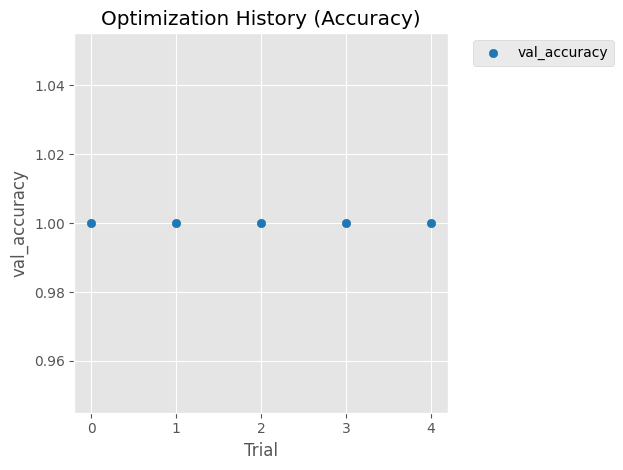

/tmp/ipykernel_29/980747374.py:146: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

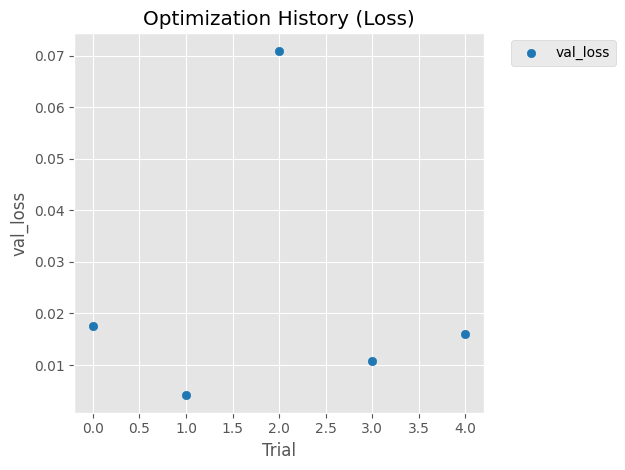

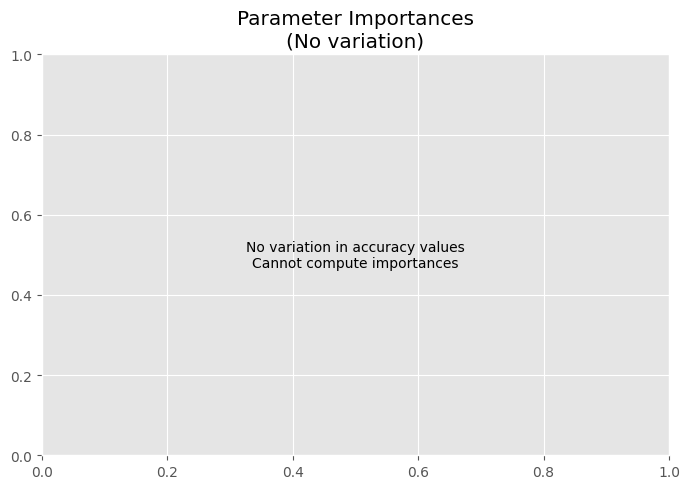


TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15002_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d
- dense
- batch_normalization
- dropout
- dense_1
- dropout_1
- dense_2
Total: 12/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
65/65 [==============================] - 9s 79ms/step - loss: 0.0860 - accuracy: 1.0000 - val_loss: 0.0718 - val_accuracy: 1.0000 - lr: 5.7567e-05
Epoch 2/50
65/65 [==============================] - 5s 73ms/step - loss: 0.0627 - accuracy: 1.0000 - val_loss: 0.0587 - val_accuracy: 0.9978 - lr: 5.7567e-05
Epoch 3/50
65/65 [==============================] - 5s 69ms/step - loss: 0.0518 - accuracy: 1.0000 - val_loss: 0.0484 - val_accuracy: 1.0000 - lr: 5.7567e-05
Epoch 4/50
65/65 [==============================] - 5s 73ms/s

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15002_1.pkl
66/66 [==============================] - 4s 60ms/step - loss: 0.0718 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.07179103046655655
15/15 [==============================] - 1s 59ms/step - loss: 0.0718 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 0.07184287160634995
15/15 [==============================] - 1s 54ms/step - loss: 0.0718 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.07179237902164459
Test labels: {'sfone': 0, 'sillyp2p': 1}

Matriz de Confusión:
[[225   0]
 [  0 225]]
True labels: 450
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00   

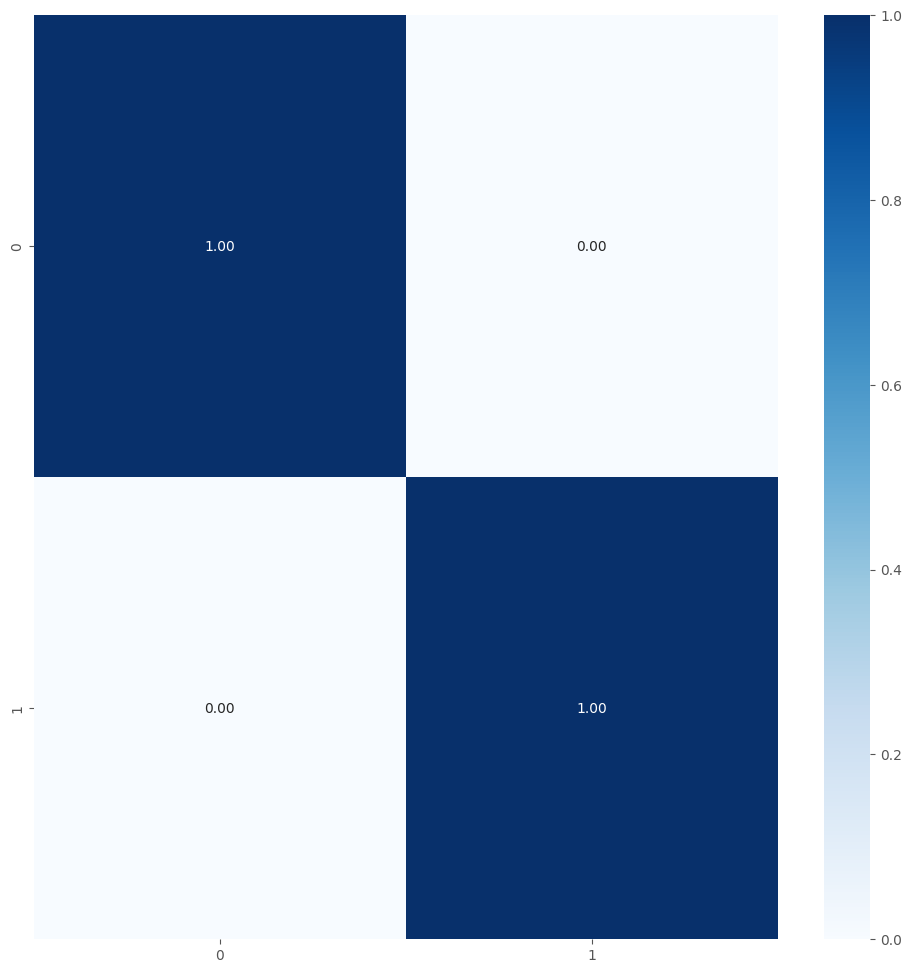


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15002_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d
- dense
- batch_normalization
- dropout
- dense_1
- dropout_1
- dense_2
Total: 12/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
65/65 [==============================] - 9s 84ms/step - loss: 0.0870 - accuracy: 1.0000 - val_loss: 0.0749 - val_accuracy: 1.0000 - lr: 5.7567e-05
Epoch 2/50
65/65 [==============================] - 5s 70ms/step - loss: 0.0660 - accuracy: 1.0000 - val_loss: 0.0580 - val_accuracy: 1.0000 - lr: 5.7567e-05
Epoch 3/50
65/65 [==============================] - 5s 72ms/step - loss: 0.0516 - accuracy: 1.0000 - val_loss: 0.0456 - val_accuracy: 1.0000 - lr: 5.7567e-05
Epoch 4/50
65/65 [==============================] - 5s 70ms/s

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15002_2.pkl
66/66 [==============================] - 4s 55ms/step - loss: 0.0748 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.07482805848121643
15/15 [==============================] - 1s 56ms/step - loss: 0.0749 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 0.07486668974161148
15/15 [==============================] - 1s 55ms/step - loss: 0.0748 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.07482823729515076
Test labels: {'sfone': 0, 'sillyp2p': 1}

Matriz de Confusión:
[[225   0]
 [  0 225]]
True labels: 450
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00   

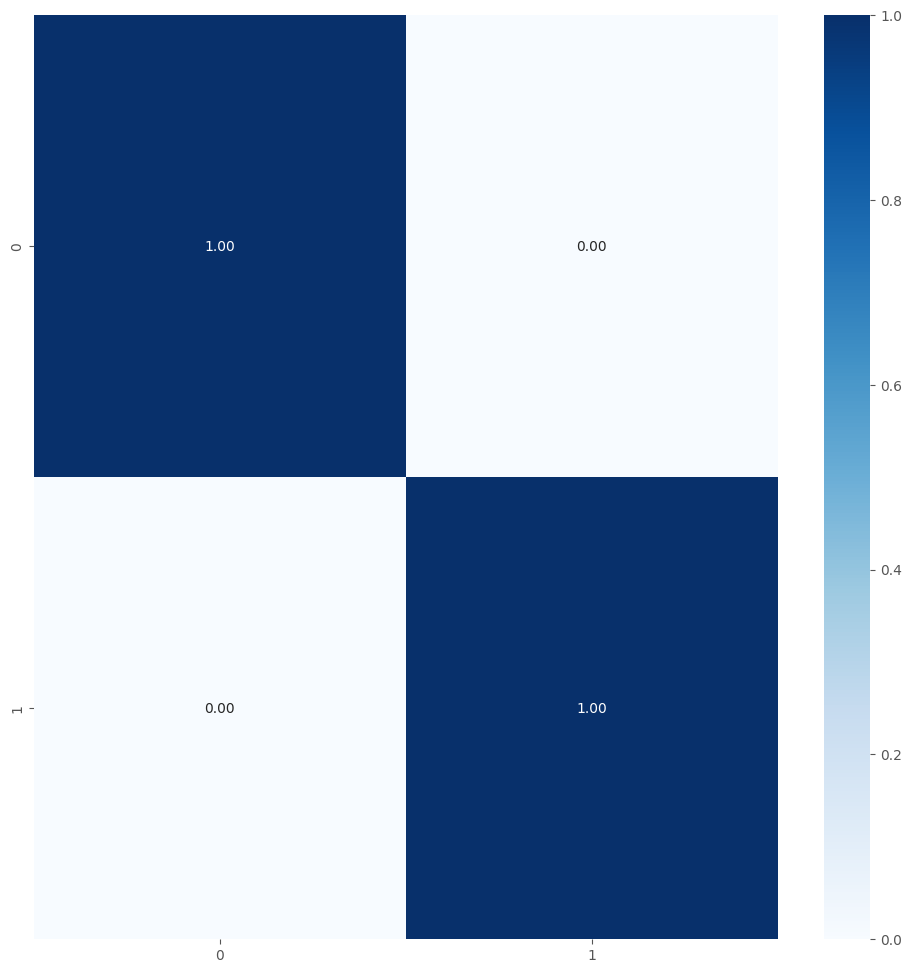


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15002_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d
- dense
- batch_normalization
- dropout
- dense_1
- dropout_1
- dense_2
Total: 12/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
65/65 [==============================] - 9s 84ms/step - loss: 0.0871 - accuracy: 1.0000 - val_loss: 0.0746 - val_accuracy: 1.0000 - lr: 5.7567e-05
Epoch 2/50
65/65 [==============================] - 5s 72ms/step - loss: 0.0649 - accuracy: 1.0000 - val_loss: 0.0557 - val_accuracy: 1.0000 - lr: 5.7567e-05
Epoch 3/50
65/65 [==============================] - 4s 68ms/step - loss: 0.0485 - accuracy: 1.0000 - val_loss: 0.0418 - val_accuracy: 1.0000 - lr: 5.7567e-05
Epoch 4/50
65/65 [==============================] - 5s 69ms/s

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15002_3.pkl
66/66 [==============================] - 4s 55ms/step - loss: 0.0746 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.07460996508598328
15/15 [==============================] - 1s 51ms/step - loss: 0.0746 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 0.07462801784276962
15/15 [==============================] - 1s 53ms/step - loss: 0.0746 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.07461010664701462
Test labels: {'sfone': 0, 'sillyp2p': 1}

Matriz de Confusión:
[[225   0]
 [  0 225]]
True labels: 450
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00   

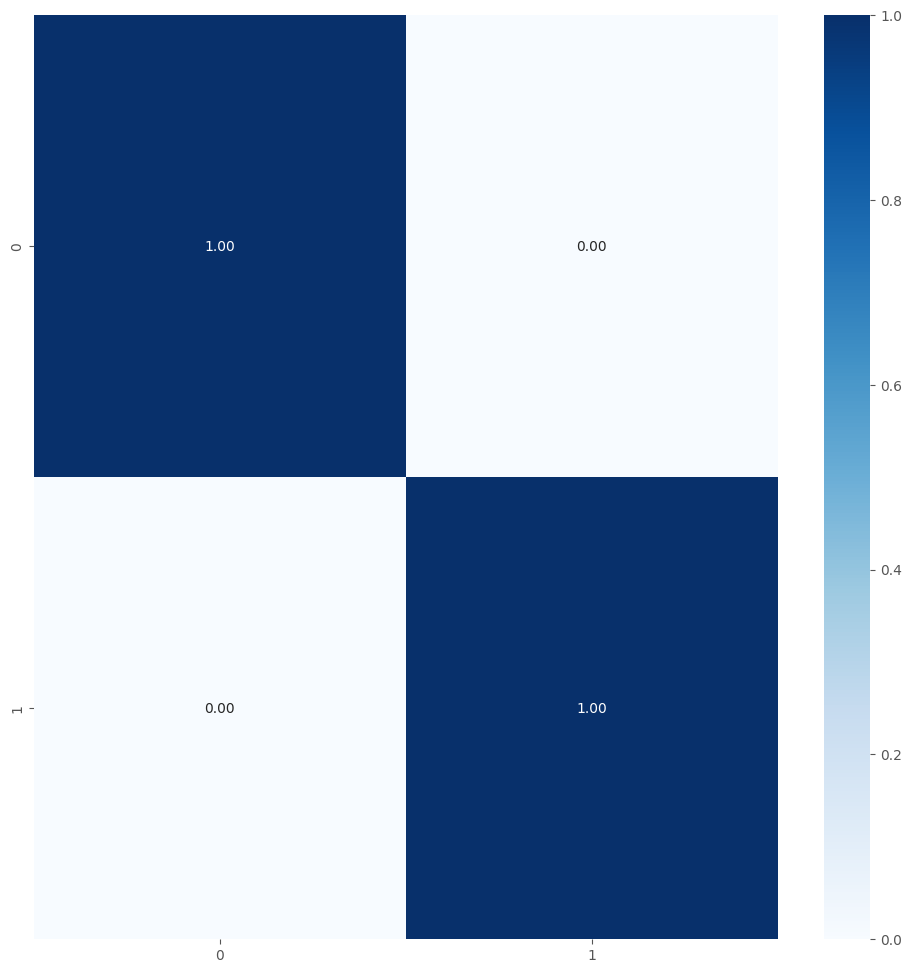


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15002_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d
- dense
- batch_normalization
- dropout
- dense_1
- dropout_1
- dense_2
Total: 12/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
65/65 [==============================] - 8s 80ms/step - loss: 0.0863 - accuracy: 1.0000 - val_loss: 0.0728 - val_accuracy: 1.0000 - lr: 5.7567e-05
Epoch 2/50
65/65 [==============================] - 5s 72ms/step - loss: 0.0630 - accuracy: 1.0000 - val_loss: 0.0539 - val_accuracy: 1.0000 - lr: 5.7567e-05
Epoch 3/50
65/65 [==============================] - 5s 70ms/step - loss: 0.0467 - accuracy: 1.0000 - val_loss: 0.0402 - val_accuracy: 1.0000 - lr: 5.7567e-05
Epoch 4/50
65/65 [==============================] - 5s 72ms/s

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15002_4.pkl
66/66 [==============================] - 4s 58ms/step - loss: 0.0727 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.07267975807189941
15/15 [==============================] - 1s 53ms/step - loss: 0.0728 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 0.07278212904930115
15/15 [==============================] - 1s 51ms/step - loss: 0.0727 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.07268621027469635
Test labels: {'sfone': 0, 'sillyp2p': 1}

Matriz de Confusión:
[[225   0]
 [  0 225]]
True labels: 450
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00   

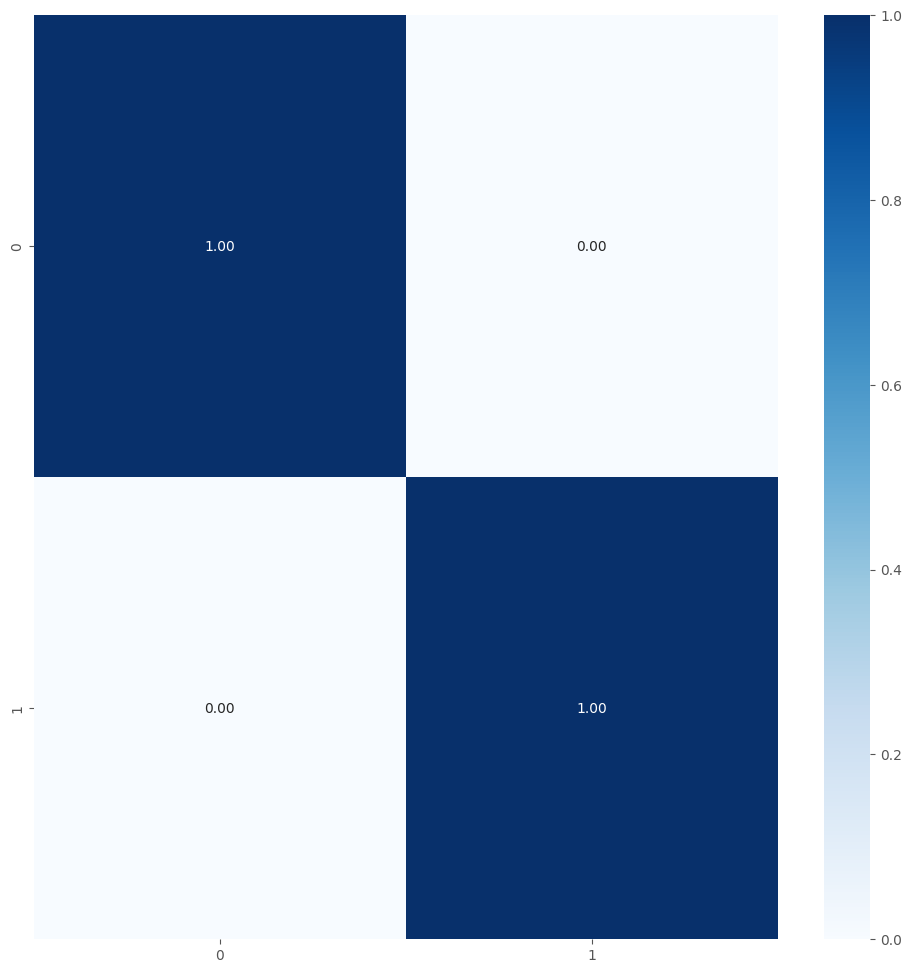


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15002_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d
- dense
- batch_normalization
- dropout
- dense_1
- dropout_1
- dense_2
Total: 12/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
65/65 [==============================] - 8s 82ms/step - loss: 0.0868 - accuracy: 1.0000 - val_loss: 0.0750 - val_accuracy: 1.0000 - lr: 5.7567e-05
Epoch 2/50
65/65 [==============================] - 5s 69ms/step - loss: 0.0668 - accuracy: 1.0000 - val_loss: 0.0598 - val_accuracy: 1.0000 - lr: 5.7567e-05
Epoch 3/50
65/65 [==============================] - 5s 69ms/step - loss: 0.0537 - accuracy: 1.0000 - val_loss: 0.0479 - val_accuracy: 1.0000 - lr: 5.7567e-05
Epoch 4/50
65/65 [==============================] - 4s 68ms/s

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15002_5.pkl
66/66 [==============================] - 4s 54ms/step - loss: 0.0749 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.0749250054359436
15/15 [==============================] - 1s 55ms/step - loss: 0.0750 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 0.07497288286685944
15/15 [==============================] - 1s 55ms/step - loss: 0.0749 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.07491974532604218
Test labels: {'sfone': 0, 'sillyp2p': 1}

Matriz de Confusión:
[[225   0]
 [  0 225]]
True labels: 450
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00    

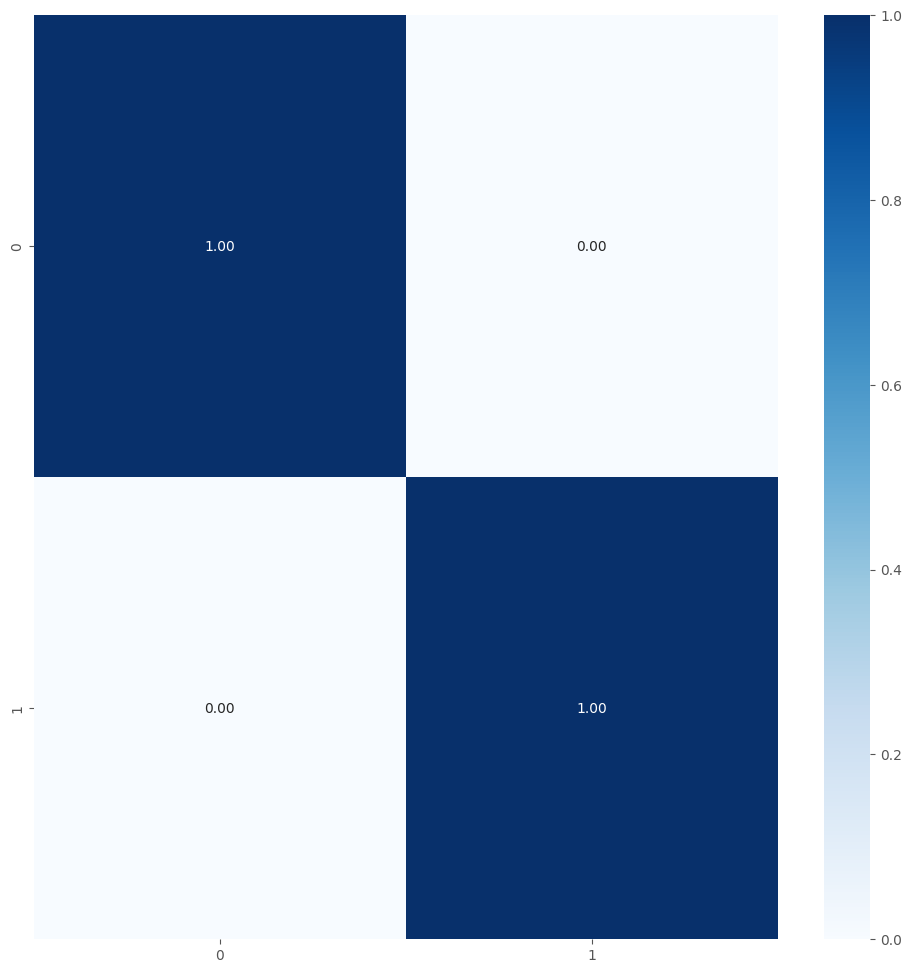


Best fold was 1 with val_accuracy: 1.0000
Average training accuracy in 5-fold: 1.0
Average validation precision in 5-fold: 1.0

Test Metrics
test_acc_list: [1.0, 1.0, 1.0, 1.0, 1.0]
Average Test Accuracy with 5-fold: 1.0
test_loss_list: [0.07179237902164459, 0.07482823729515076, 0.07461010664701462, 0.07268621027469635, 0.07491974532604218]
Average Test Log Loss with 5-fold: 0.07376733571290969

Precision List: [1.0, 1.0, 1.0, 1.0, 1.0]
Average Precision List with 5-fold: 1.0
Recall List: [1.0, 1.0, 1.0, 1.0, 1.0]
Average Recall List with 5-fold: 1.0
F1 Score List: [1.0, 1.0, 1.0, 1.0, 1.0]
Average F1 Score List with 5-fold: 1.0

Metrics List Store

test_acc_list_all = [1.0]
test_loss_list_all = [0.07376733571290969]
precision_list_all = [1.0]
recall_list_all = [1.0]
f1_score_list_all = [1.0]
La carpeta 2 fue eliminada.
CPU times: user 45min, sys: 1min 54s, total: 46min 54s
Wall time: 30min 2s


In [22]:
%%time

num_classes = 2
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, 
    precision_list_all, recall_list_all, f1_score_list_all)

Familias de malware copiadas
source2: /notebooks/train3/all_malware/3
name_save_model: MobileNet_tf_15003
Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Loading pre-trained model...
Model loaded successfully.

Calculating layer importance (once for all folds)...

Calculando importancia con 3150 muestras (100% confianza, ±0% error)
Incluyendo 93 capas (base + personalizadas)


100%|██████████| 3150/3150 [06:38<00:00,  7.91it/s]
[I 2025-07-16 02:48:55,925] A new study created in memory with name: malware_classification_3classes



Resultados de importancia de capas (incluyendo personalizadas):
----------------------------------------------------------------------
Pos.  | Nombre de Capa                           | Importancia    
----------------------------------------------------------------------
1     | conv_pw_1                                | 0.0000466
2     | conv_dw_1                                | 0.0000436
3     | conv_pw_3                                | 0.0000333
4     | conv_dw_1_bn                             | 0.0000298
5     | conv_pw_2                                | 0.0000203
6     | conv_dw_2_bn                             | 0.0000193
7     | conv_dw_3_bn                             | 0.0000187
8     | conv_dw_3                                | 0.0000156
9     | conv_pw_3_bn                             | 0.0000153
10    | conv1_bn                                 | 0.0000148
11    | conv_pw_1_bn                             | 0.0000144
12    | conv_dw_4_bn                             | 0.00

[I 2025-07-16 02:54:09,233] Trial 0 finished with values: [1.0, 0.00637757359072566] and parameters: {'learning_rate': 0.00019623965916273052, 'dropout_rate1': 0.45608330477286924, 'dropout_rate2': 0.32013489087069436, 'l2_reg': 0.0011623675366181172, 'units_dense1': 1024, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 6, 'early_stopping_patience': 15, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 8.263717545803593e-06, 'units_dense3': 128, 'dropout_rate3': 0.27821402993611377}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Successfully loaded and modified pretrained model
Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.


[I 2025-07-16 03:00:02,752] Trial 1 finished with values: [0.9985119104385376, 0.018665436655282974] and parameters: {'learning_rate': 3.426842458409816e-05, 'dropout_rate1': 0.3287817152812986, 'dropout_rate2': 0.13703867637713296, 'l2_reg': 0.00011458523983045229, 'units_dense1': 1024, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 14, 'early_stopping_patience': 20, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 1.6491605844441608e-06, 'units_dense3': 32, 'dropout_rate3': 0.18525327771038924}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Successfully loaded and modified pretrained model
Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.


[I 2025-07-16 03:05:55,291] Trial 2 finished with values: [1.0, 0.0019587536808103323] and parameters: {'learning_rate': 1.89847907216663e-05, 'dropout_rate1': 0.5990826390525461, 'dropout_rate2': 0.13462182666456324, 'l2_reg': 0.003814597523024021, 'units_dense1': 512, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 7, 'early_stopping_patience': 16, 'reduce_lr_patience': 15, 'fine_tune_learning_rate': 1.1209648881080563e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Successfully loaded and modified pretrained model
Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.


[I 2025-07-16 03:11:46,632] Trial 3 finished with values: [1.0, 0.0008907270967029035] and parameters: {'learning_rate': 1.8010642184663924e-05, 'dropout_rate1': 0.3907609614615658, 'dropout_rate2': 0.18252664277981087, 'l2_reg': 1.0543960248826457e-05, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 6, 'early_stopping_patience': 15, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 2.0782841700940522e-05, 'units_dense3': 64, 'dropout_rate3': 0.10117398516751423}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Successfully loaded and modified pretrained model
Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.


[I 2025-07-16 03:16:55,151] Trial 4 finished with values: [1.0, 0.019935015588998795] and parameters: {'learning_rate': 1.2331634846870368e-05, 'dropout_rate1': 0.3734324867368335, 'dropout_rate2': 0.4241909560378708, 'l2_reg': 1.7419360992758073e-05, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 11, 'early_stopping_patience': 13, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 1.3798280714834413e-06}.


Mejores trials para cada objetivo:
  Trial 3:
    val_accuracy: 1.0000
    val_loss: 0.0009
    Parámetros: {'learning_rate': 1.8010642184663924e-05, 'dropout_rate1': 0.3907609614615658, 'dropout_rate2': 0.18252664277981087, 'l2_reg': 1.0543960248826457e-05, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 6, 'early_stopping_patience': 15, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 2.0782841700940522e-05, 'units_dense3': 64, 'dropout_rate3': 0.10117398516751423}


/tmp/ipykernel_29/980747374.py:135: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

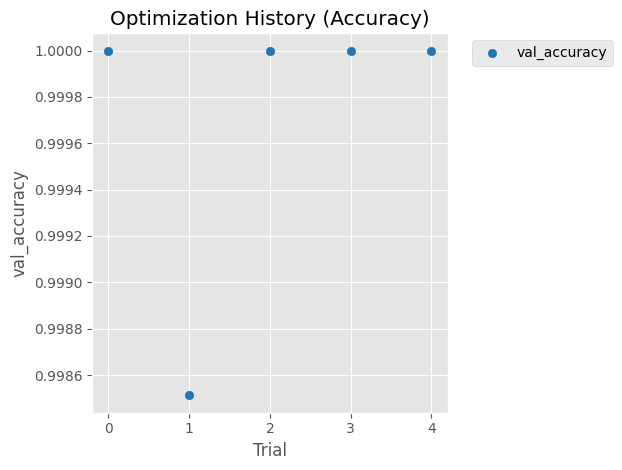

/tmp/ipykernel_29/980747374.py:146: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

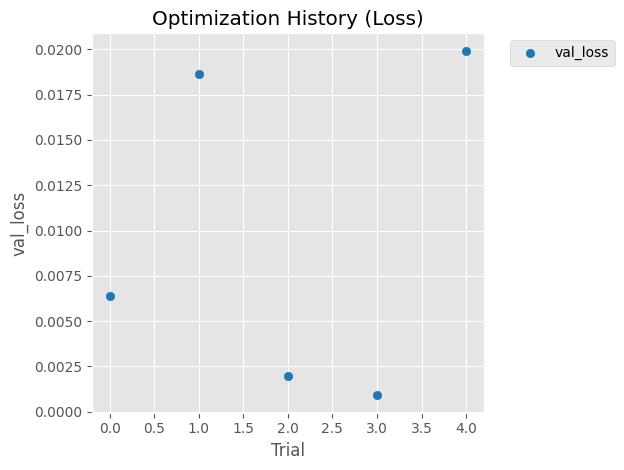

/tmp/ipykernel_29/980747374.py:184: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

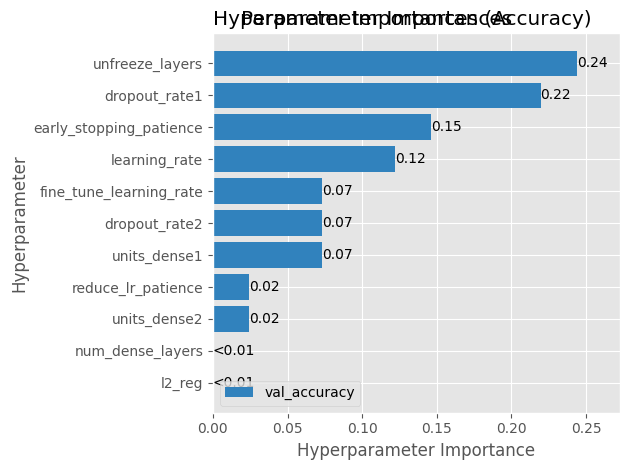


TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- dense_15
- batch_normalization_5
- dropout_10
- dense_16
- dropout_11
- dense_17
Total: 9/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
98/98 [==============================] - 11s 78ms/step - loss: 0.0313 - accuracy: 1.0000 - val_loss: 0.0350 - val_accuracy: 0.9985 - lr: 1.8011e-06
Epoch 2/50
98/98 [==============================] - 7s 73ms/step - loss: 0.0308 - accuracy: 1.0000 - val_loss: 0.0341 - val_accuracy: 0.9985 - lr: 1.8011e-06
Epoch 3/50
98/98 [==============================] - 7s 70ms/step - loss: 0.0302 - accuracy: 1.0000 - val_loss: 0.0334 - val_accuracy: 0.9985 - lr: 1.8011e-06
Epoch 4/50
98/98 [==============================] - 7s 70ms/step - loss: 0.0297 - accuracy: 1.0000 - val_loss: 

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15003_1.pkl
99/99 [==============================] - 6s 59ms/step - loss: 0.0308 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.030816391110420227
22/22 [==============================] - 1s 58ms/step - loss: 0.0350 - accuracy: 0.9985
Validation Accuracy: 0.9985185265541077
Validation Log Loss: 0.03499959781765938
22/22 [==============================] - 1s 56ms/step - loss: 0.0308 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.030818212777376175
Test labels: {'Allaple.A': 0, 'sfone': 1, 'sillyp2p': 2}

Matriz de Confusión:
[[225   0   0]
 [  0 225   0]
 [  0   0 225]]
True labels: 675
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225
           2       1.00      1.00      1.00       225

    accuracy                      

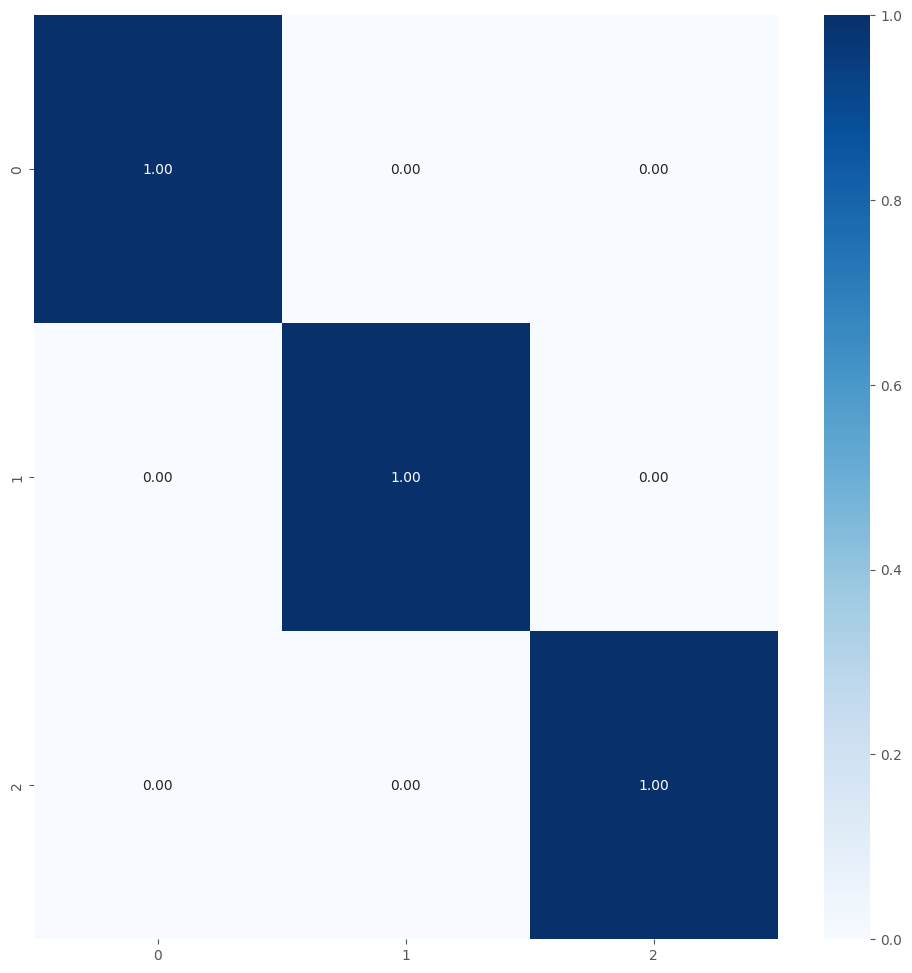


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- dense_15
- batch_normalization_5
- dropout_10
- dense_16
- dropout_11
- dense_17
Total: 9/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
98/98 [==============================] - 10s 76ms/step - loss: 0.0315 - accuracy: 1.0000 - val_loss: 0.0356 - val_accuracy: 0.9985 - lr: 1.8011e-06
Epoch 2/50
98/98 [==============================] - 7s 72ms/step - loss: 0.0309 - accuracy: 1.0000 - val_loss: 0.0348 - val_accuracy: 0.9985 - lr: 1.8011e-06
Epoch 3/50
98/98 [==============================] - 7s 74ms/step - loss: 0.0304 - accuracy: 1.0000 - val_loss: 0.0340 - val_accuracy: 0.9985 - lr: 1.8011e-06
Epoch 4/50
98/98 [==============================] - 7s 72ms/step - loss: 0.0299 - accuracy: 1.0000 - val_loss: 

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15003_2.pkl
99/99 [==============================] - 6s 59ms/step - loss: 0.0311 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.03107568435370922
22/22 [==============================] - 1s 56ms/step - loss: 0.0356 - accuracy: 0.9985
Validation Accuracy: 0.9985185265541077
Validation Log Loss: 0.03560137748718262
22/22 [==============================] - 1s 57ms/step - loss: 0.0311 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.031077468767762184
Test labels: {'Allaple.A': 0, 'sfone': 1, 'sillyp2p': 2}

Matriz de Confusión:
[[225   0   0]
 [  0 225   0]
 [  0   0 225]]
True labels: 675
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225
           2       1.00      1.00      1.00       225

    accuracy                       

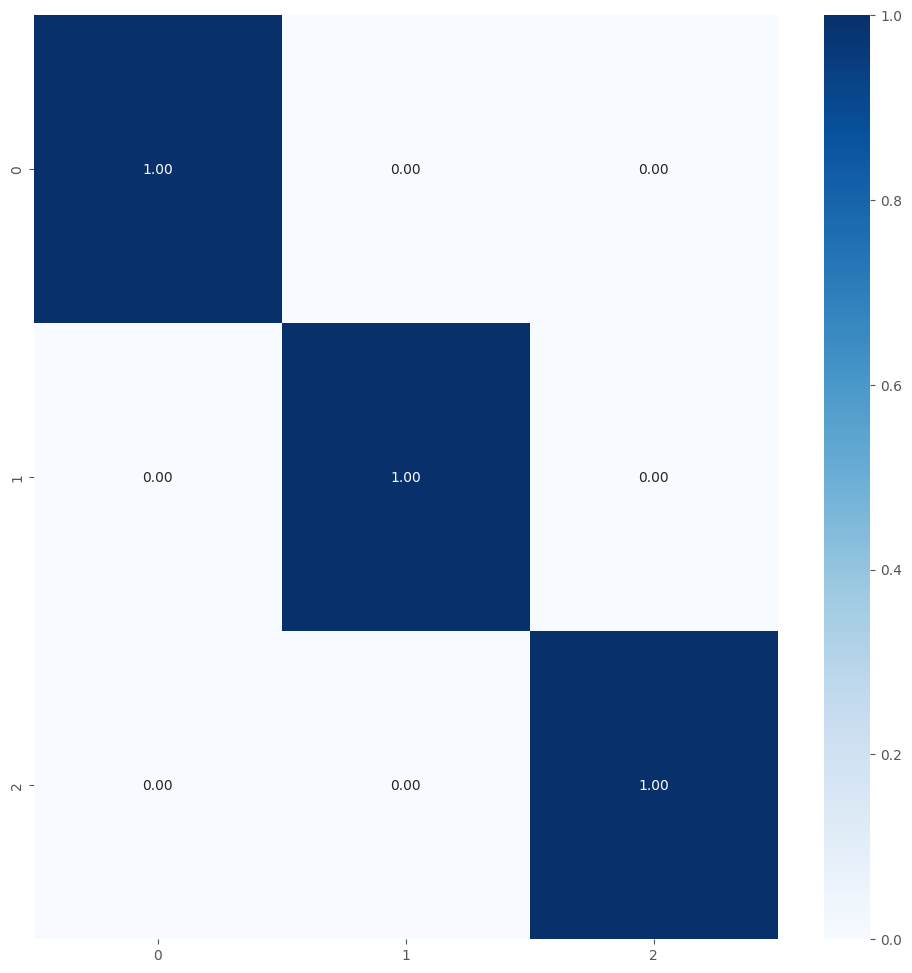


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- dense_15
- batch_normalization_5
- dropout_10
- dense_16
- dropout_11
- dense_17
Total: 9/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
98/98 [==============================] - 11s 77ms/step - loss: 0.0313 - accuracy: 1.0000 - val_loss: 0.0353 - val_accuracy: 0.9985 - lr: 1.8011e-06
Epoch 2/50
98/98 [==============================] - 7s 73ms/step - loss: 0.0306 - accuracy: 1.0000 - val_loss: 0.0345 - val_accuracy: 0.9985 - lr: 1.8011e-06
Epoch 3/50
98/98 [==============================] - 7s 74ms/step - loss: 0.0299 - accuracy: 1.0000 - val_loss: 0.0339 - val_accuracy: 0.9985 - lr: 1.8011e-06
Epoch 4/50
98/98 [==============================] - 7s 73ms/step - loss: 0.0293 - accuracy: 1.0000 - val_loss: 

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15003_3.pkl
99/99 [==============================] - 6s 58ms/step - loss: 0.0308 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.030814724043011665
22/22 [==============================] - 1s 57ms/step - loss: 0.0353 - accuracy: 0.9985
Validation Accuracy: 0.9985185265541077
Validation Log Loss: 0.0352967269718647
22/22 [==============================] - 1s 56ms/step - loss: 0.0308 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.030817091464996338
Test labels: {'Allaple.A': 0, 'sfone': 1, 'sillyp2p': 2}

Matriz de Confusión:
[[225   0   0]
 [  0 225   0]
 [  0   0 225]]
True labels: 675
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225
           2       1.00      1.00      1.00       225

    accuracy                       

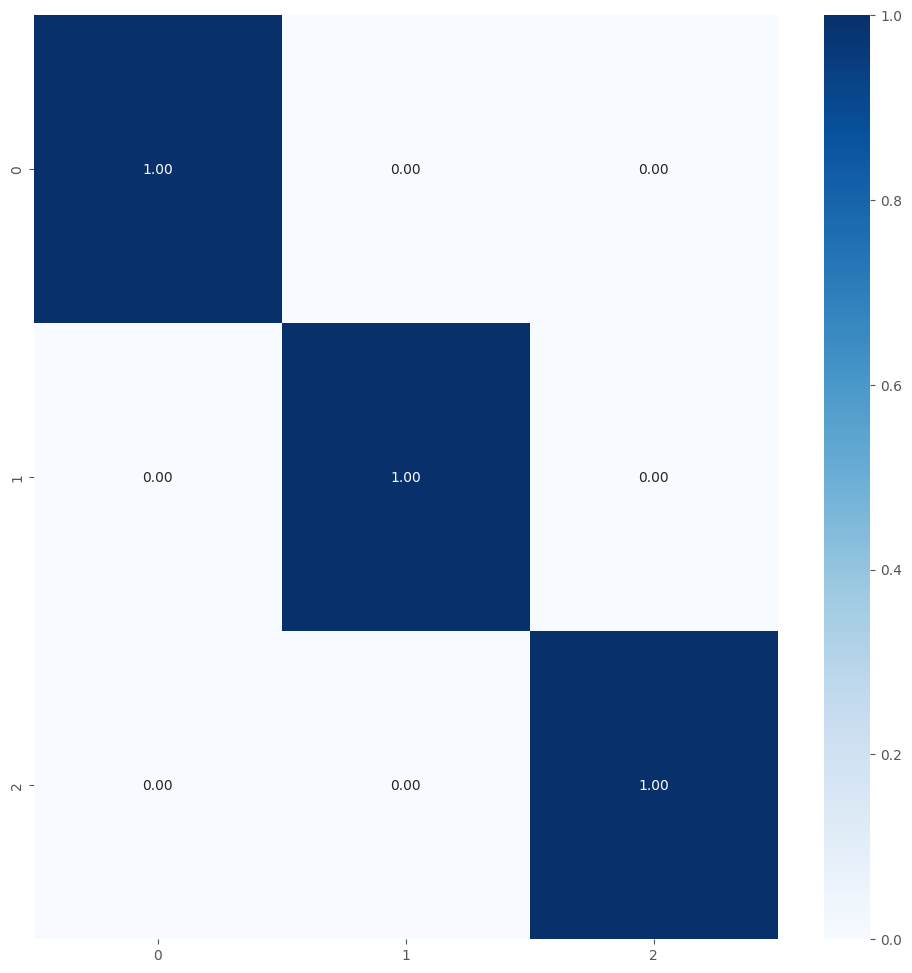


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- dense_15
- batch_normalization_5
- dropout_10
- dense_16
- dropout_11
- dense_17
Total: 9/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
98/98 [==============================] - 12s 80ms/step - loss: 0.0313 - accuracy: 1.0000 - val_loss: 0.0354 - val_accuracy: 0.9985 - lr: 1.8011e-06
Epoch 2/50
98/98 [==============================] - 7s 74ms/step - loss: 0.0306 - accuracy: 1.0000 - val_loss: 0.0345 - val_accuracy: 0.9985 - lr: 1.8011e-06
Epoch 3/50
98/98 [==============================] - 7s 73ms/step - loss: 0.0300 - accuracy: 1.0000 - val_loss: 0.0331 - val_accuracy: 0.9985 - lr: 1.8011e-06
Epoch 4/50
98/98 [==============================] - 7s 71ms/step - loss: 0.0293 - accuracy: 1.0000 - val_loss: 

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15003_4.pkl
99/99 [==============================] - 6s 57ms/step - loss: 0.0308 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.03081894852221012
22/22 [==============================] - 1s 58ms/step - loss: 0.0354 - accuracy: 0.9985
Validation Accuracy: 0.9985185265541077
Validation Log Loss: 0.03537845239043236
22/22 [==============================] - 1s 55ms/step - loss: 0.0308 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.030820610001683235
Test labels: {'Allaple.A': 0, 'sfone': 1, 'sillyp2p': 2}

Matriz de Confusión:
[[225   0   0]
 [  0 225   0]
 [  0   0 225]]
True labels: 675
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225
           2       1.00      1.00      1.00       225

    accuracy                       

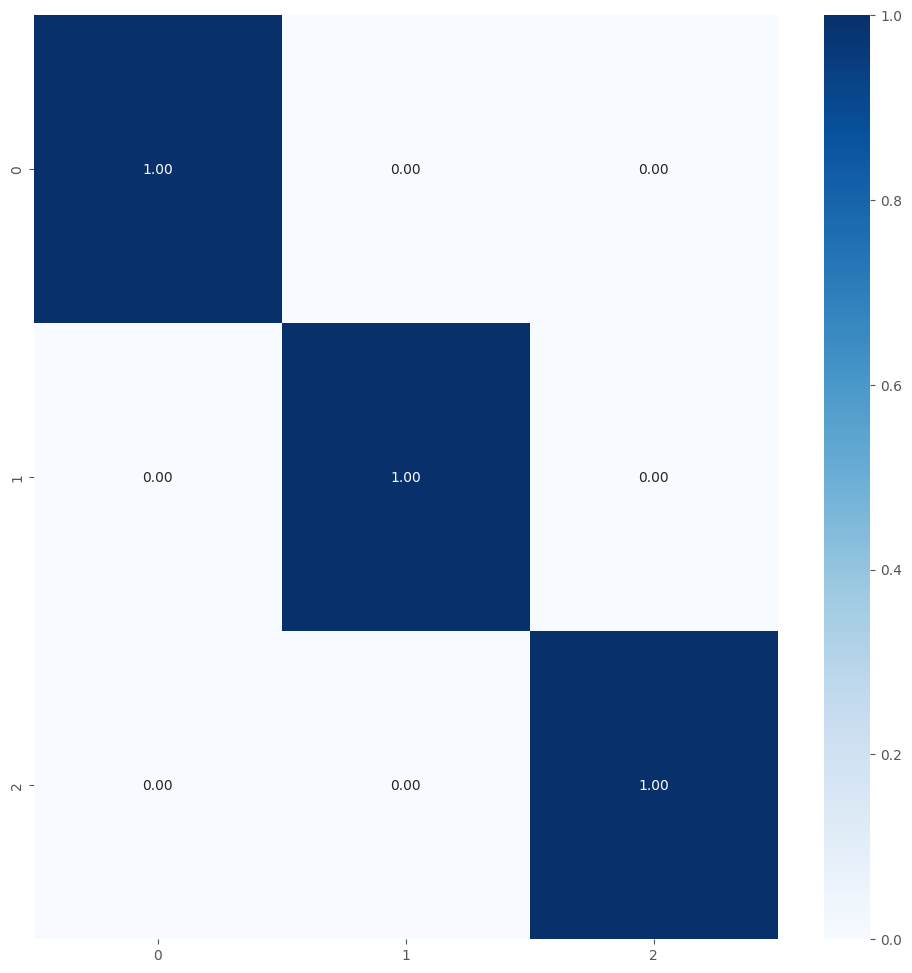


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- dense_15
- batch_normalization_5
- dropout_10
- dense_16
- dropout_11
- dense_17
Total: 9/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
98/98 [==============================] - 11s 81ms/step - loss: 0.0314 - accuracy: 1.0000 - val_loss: 0.0358 - val_accuracy: 0.9985 - lr: 1.8011e-06
Epoch 2/50
98/98 [==============================] - 7s 73ms/step - loss: 0.0308 - accuracy: 1.0000 - val_loss: 0.0348 - val_accuracy: 0.9985 - lr: 1.8011e-06
Epoch 3/50
98/98 [==============================] - 7s 69ms/step - loss: 0.0301 - accuracy: 1.0000 - val_loss: 0.0342 - val_accuracy: 0.9985 - lr: 1.8011e-06
Epoch 4/50
98/98 [==============================] - 7s 70ms/step - loss: 0.0296 - accuracy: 1.0000 - val_loss: 

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15003_5.pkl
99/99 [==============================] - 6s 58ms/step - loss: 0.0309 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.030867386609315872
22/22 [==============================] - 1s 58ms/step - loss: 0.0357 - accuracy: 0.9985
Validation Accuracy: 0.9985185265541077
Validation Log Loss: 0.035736944526433945
22/22 [==============================] - 1s 57ms/step - loss: 0.0309 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.03086920827627182
Test labels: {'Allaple.A': 0, 'sfone': 1, 'sillyp2p': 2}

Matriz de Confusión:
[[225   0   0]
 [  0 225   0]
 [  0   0 225]]
True labels: 675
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225
           2       1.00      1.00      1.00       225

    accuracy                      

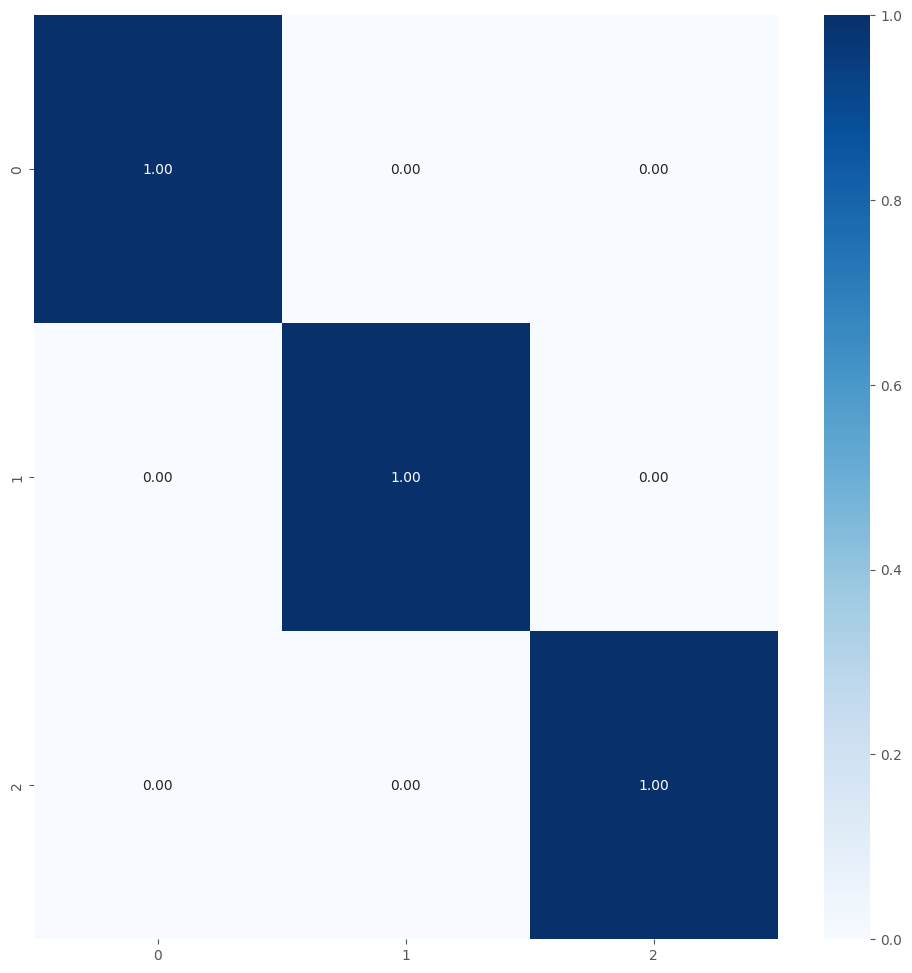


Best fold was 1 with val_accuracy: 0.9985
Average training accuracy in 5-fold: 1.0
Average validation precision in 5-fold: 0.9985119104385376

Test Metrics
test_acc_list: [1.0, 1.0, 1.0, 1.0, 1.0]
Average Test Accuracy with 5-fold: 1.0
test_loss_list: [0.030818212777376175, 0.031077468767762184, 0.030817091464996338, 0.030820610001683235, 0.03086920827627182]
Average Test Log Loss with 5-fold: 0.03088051825761795

Precision List: [1.0, 1.0, 1.0, 1.0, 1.0]
Average Precision List with 5-fold: 1.0
Recall List: [1.0, 1.0, 1.0, 1.0, 1.0]
Average Recall List with 5-fold: 1.0
F1 Score List: [1.0, 1.0, 1.0, 1.0, 1.0]
Average F1 Score List with 5-fold: 1.0

Metrics List Store

test_acc_list_all = [1.0, 1.0]
test_loss_list_all = [0.07376733571290969, 0.03088051825761795]
precision_list_all = [1.0, 1.0]
recall_list_all = [1.0, 1.0]
f1_score_list_all = [1.0, 1.0]
La carpeta 3 fue eliminada.
CPU times: user 1h 8min 58s, sys: 2min 37s, total: 1h 11min 35s
Wall time: 45min 48s


In [23]:
%%time

num_classes = 3
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, 
    precision_list_all, recall_list_all, f1_score_list_all)

Familias de malware copiadas
source2: /notebooks/train3/all_malware/4
name_save_model: MobileNet_tf_15004
Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15004_best.h5
Loading pre-trained model...
Model loaded successfully.

Calculating layer importance (once for all folds)...

Calculando importancia con 4200 muestras (100% confianza, ±0% error)
Incluyendo 93 capas (base + personalizadas)


100%|██████████| 4200/4200 [08:47<00:00,  7.96it/s]
[I 2025-07-16 03:36:53,310] A new study created in memory with name: malware_classification_4classes



Resultados de importancia de capas (incluyendo personalizadas):
----------------------------------------------------------------------
Pos.  | Nombre de Capa                           | Importancia    
----------------------------------------------------------------------
1     | conv_pw_1                                | 0.0000518
2     | conv_dw_1                                | 0.0000503
3     | conv_pw_3                                | 0.0000386
4     | conv_dw_1_bn                             | 0.0000346
5     | conv_pw_2                                | 0.0000239
6     | conv_dw_2_bn                             | 0.0000226
7     | conv_dw_3_bn                             | 0.0000209
8     | conv1_bn                                 | 0.0000192
9     | conv_pw_3_bn                             | 0.0000182
10    | conv_pw_1_bn                             | 0.0000177
11    | conv_dw_3                                | 0.0000175
12    | conv_dw_4_bn                             | 0.00

[I 2025-07-16 03:44:48,045] Trial 0 finished with values: [0.9966517686843872, 0.03366469591856003] and parameters: {'learning_rate': 1.33157784626252e-05, 'dropout_rate1': 0.2249311090079118, 'dropout_rate2': 0.3847956673306583, 'l2_reg': 5.562879343023838e-05, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 15, 'reduce_lr_patience': 8, 'fine_tune_learning_rate': 3.020216092694985e-06, 'units_dense3': 128, 'dropout_rate3': 0.26374544871865435}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15004_best.h5
Successfully loaded and modified pretrained model
Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.


[I 2025-07-16 03:52:31,333] Trial 1 finished with values: [0.9977678656578064, 0.015857217833399773] and parameters: {'learning_rate': 0.0010227077353909054, 'dropout_rate1': 0.4818697125349214, 'dropout_rate2': 0.42214759406770475, 'l2_reg': 0.00015449210423259662, 'units_dense1': 512, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 13, 'early_stopping_patience': 19, 'reduce_lr_patience': 15, 'fine_tune_learning_rate': 5.6461967231544e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15004_best.h5
Successfully loaded and modified pretrained model
Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.


[I 2025-07-16 04:00:06,187] Trial 2 finished with values: [0.9977678656578064, 0.0294314157217741] and parameters: {'learning_rate': 0.00018773614205169257, 'dropout_rate1': 0.4029667361796711, 'dropout_rate2': 0.3181269244343837, 'l2_reg': 4.671247806497966e-05, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 12, 'early_stopping_patience': 12, 'reduce_lr_patience': 8, 'fine_tune_learning_rate': 7.283425074153407e-06, 'units_dense3': 128, 'dropout_rate3': 0.27728514631663126}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15004_best.h5
Successfully loaded and modified pretrained model
Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.


[I 2025-07-16 04:08:01,150] Trial 3 finished with values: [0.9977678656578064, 0.020366210490465164] and parameters: {'learning_rate': 4.0696929083670165e-05, 'dropout_rate1': 0.23601011884473003, 'dropout_rate2': 0.4176046821998006, 'l2_reg': 0.0014984189203971104, 'units_dense1': 1024, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 7, 'early_stopping_patience': 19, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 2.8693535181110534e-06, 'units_dense3': 64, 'dropout_rate3': 0.2893147649902086}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15004_best.h5
Successfully loaded and modified pretrained model
Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.


[I 2025-07-16 04:10:55,754] Trial 4 finished with values: [0.9977678656578064, 0.023906279355287552] and parameters: {'learning_rate': 0.0020210734900424584, 'dropout_rate1': 0.414332731994522, 'dropout_rate2': 0.10924928985801713, 'l2_reg': 0.0014142110532442637, 'units_dense1': 512, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 12, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 1.5799362388398294e-05, 'units_dense3': 32, 'dropout_rate3': 0.3330357592474725}.


Mejores trials para cada objetivo:
  Trial 1:
    val_accuracy: 0.9978
    val_loss: 0.0159
    Parámetros: {'learning_rate': 0.0010227077353909054, 'dropout_rate1': 0.4818697125349214, 'dropout_rate2': 0.42214759406770475, 'l2_reg': 0.00015449210423259662, 'units_dense1': 512, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 13, 'early_stopping_patience': 19, 'reduce_lr_patience': 15, 'fine_tune_learning_rate': 5.6461967231544e-06}


/tmp/ipykernel_29/980747374.py:135: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

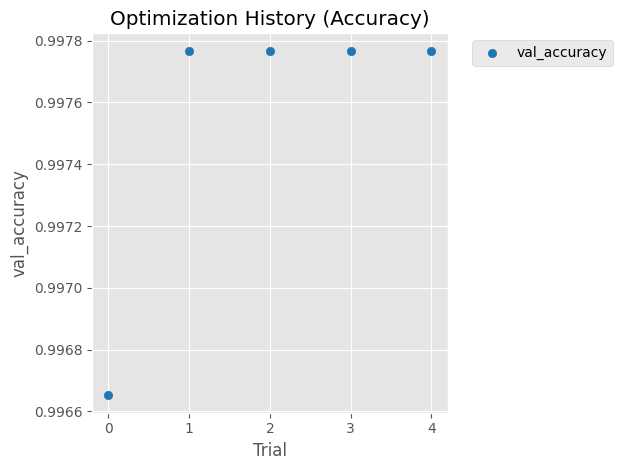

/tmp/ipykernel_29/980747374.py:146: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

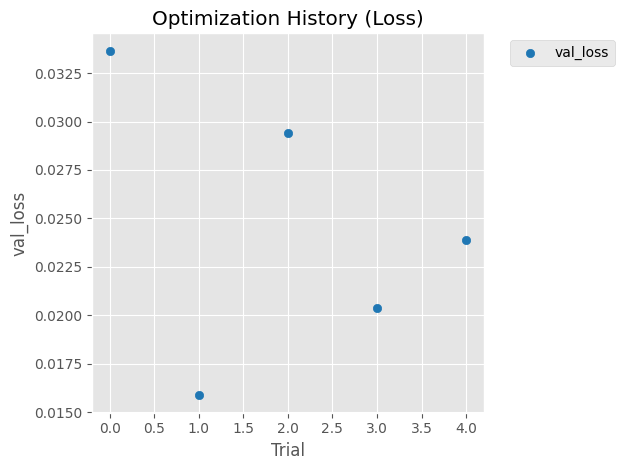

/tmp/ipykernel_29/980747374.py:184: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

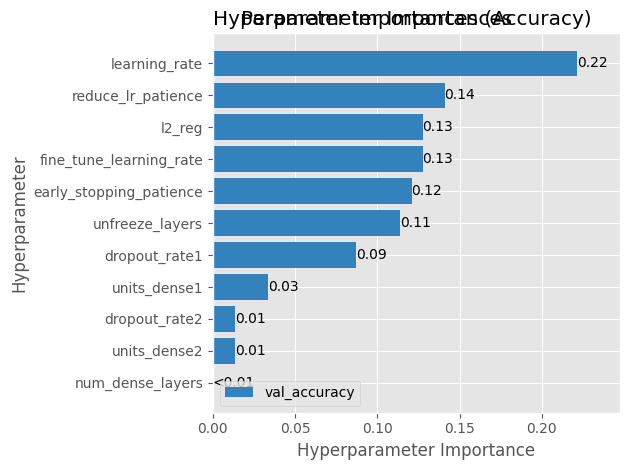


TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15004_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_dw_13
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_10
- dense_30
- batch_normalization_10
- dropout_20
- dense_31
- dropout_21
- dense_32
Total: 16/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
131/131 [==============================] - 14s 79ms/step - loss: 0.0259 - accuracy: 0.9964 - val_loss: 0.0357 - val_accuracy: 0.9944 - lr: 1.0227e-04
Epoch 2/50
131/131 [==============================] - 10s 72ms/step - loss: 0.0191 - accuracy: 0.9990 - val_loss: 0.0321 - val_accuracy: 0.9944 - lr: 1.0227e-04
Epoch 3/50
131/131 [==============================] - 10s 74ms/step - loss: 0.0132 - accuracy: 0.9995 - val_loss: 0.0408 - val_accuracy: 0

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15004_1.pkl
132/132 [==============================] - 8s 60ms/step - loss: 0.0138 - accuracy: 0.9995
Train Accuracy: 0.9995238184928894
Train Log Loss: 0.013835239224135876
29/29 [==============================] - 2s 60ms/step - loss: 0.0407 - accuracy: 0.9978
Validation Accuracy: 0.9977777600288391
Validation Log Loss: 0.04070282354950905
29/29 [==============================] - 2s 58ms/step - loss: 0.0437 - accuracy: 0.9978
Test Accuracy: 0.9977777600288391
Test Log Loss: 0.043669942766427994
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3}

Matriz de Confusión:
[[225   0   0   0]
 [  0 225   0   0]
 [  0   0 225   0]
 [  0   2   0 223]]
True labels: 900
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      1.00      1.00       225
           2 

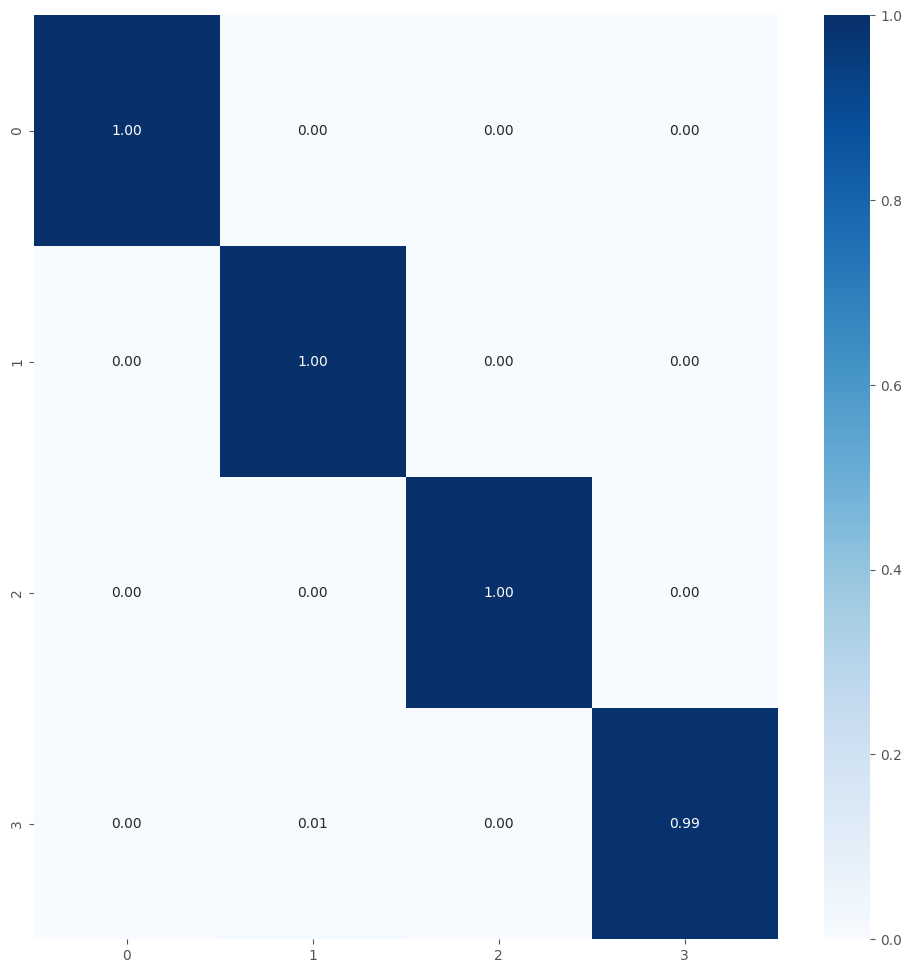


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15004_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_dw_13
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_10
- dense_30
- batch_normalization_10
- dropout_20
- dense_31
- dropout_21
- dense_32
Total: 16/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
131/131 [==============================] - 14s 78ms/step - loss: 0.0171 - accuracy: 0.9990 - val_loss: 0.0407 - val_accuracy: 0.9967 - lr: 1.0227e-04
Epoch 2/50
131/131 [==============================] - 9s 72ms/step - loss: 0.0150 - accuracy: 0.9993 - val_loss: 1.3573 - val_accuracy: 0.7500 - lr: 1.0227e-04
Epoch 3/50
131/131 [==============================] - 10s 73ms/step - loss: 0.0169 - accuracy: 0.9988 - val_loss: 0.1005 - val_accuracy: 0.

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15004_2.pkl
132/132 [==============================] - 8s 59ms/step - loss: 0.0124 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.012377007864415646
29/29 [==============================] - 2s 55ms/step - loss: 0.0376 - accuracy: 0.9978
Validation Accuracy: 0.9977777600288391
Validation Log Loss: 0.037623848766088486
29/29 [==============================] - 2s 60ms/step - loss: 0.0331 - accuracy: 0.9978
Test Accuracy: 0.9977777600288391
Test Log Loss: 0.03311115875840187
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3}

Matriz de Confusión:
[[225   0   0   0]
 [  0 225   0   0]
 [  0   0 225   0]
 [  0   2   0 223]]
True labels: 900
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      1.00      1.00       225
           2       1.00     

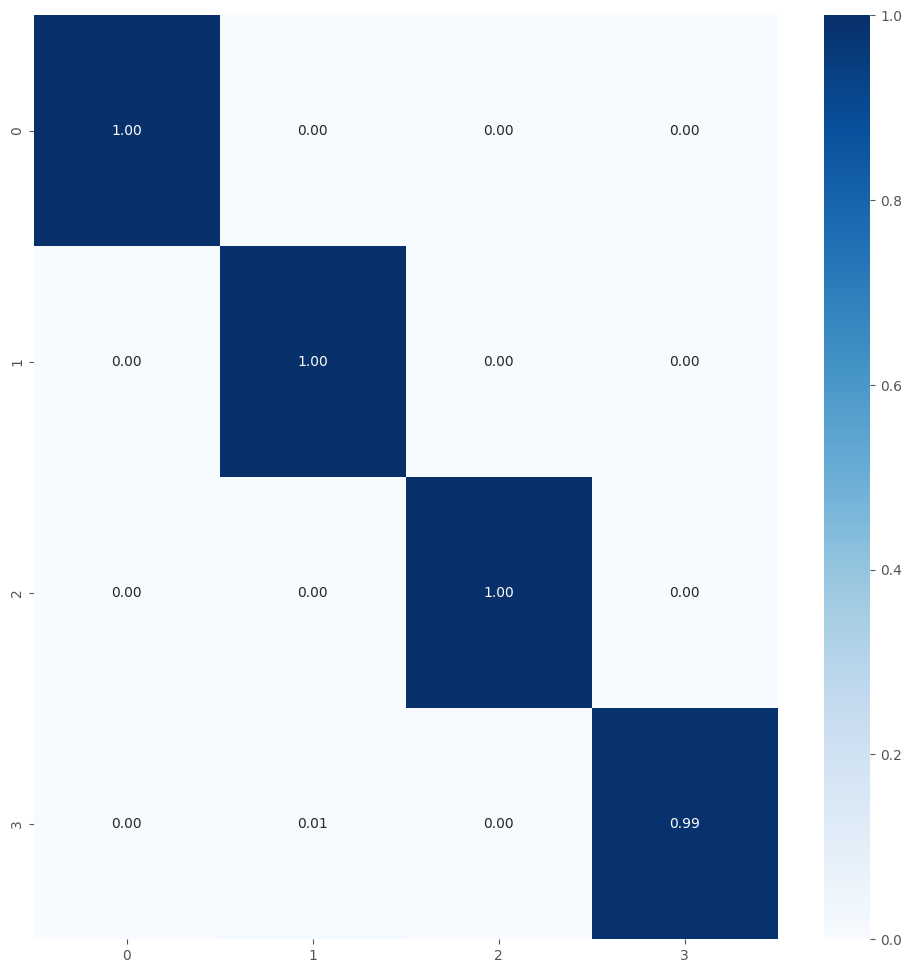


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15004_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_dw_13
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_10
- dense_30
- batch_normalization_10
- dropout_20
- dense_31
- dropout_21
- dense_32
Total: 16/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
131/131 [==============================] - 15s 78ms/step - loss: 0.0173 - accuracy: 0.9990 - val_loss: 0.0587 - val_accuracy: 0.9944 - lr: 1.0227e-04
Epoch 2/50
131/131 [==============================] - 10s 73ms/step - loss: 0.0258 - accuracy: 0.9964 - val_loss: 0.0464 - val_accuracy: 0.9978 - lr: 1.0227e-04
Epoch 3/50
131/131 [==============================] - 10s 73ms/step - loss: 0.0157 - accuracy: 0.9993 - val_loss: 0.0254 - val_accuracy: 0

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15004_3.pkl
132/132 [==============================] - 8s 59ms/step - loss: 0.0141 - accuracy: 0.9995
Train Accuracy: 0.9995238184928894
Train Log Loss: 0.014135945588350296
29/29 [==============================] - 2s 59ms/step - loss: 0.0463 - accuracy: 0.9978
Validation Accuracy: 0.9977777600288391
Validation Log Loss: 0.04627685248851776
29/29 [==============================] - 2s 59ms/step - loss: 0.0441 - accuracy: 0.9978
Test Accuracy: 0.9977777600288391
Test Log Loss: 0.04412014037370682
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3}

Matriz de Confusión:
[[225   0   0   0]
 [  0 225   0   0]
 [  0   0 225   0]
 [  0   2   0 223]]
True labels: 900
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      1.00      1.00       225
           2  

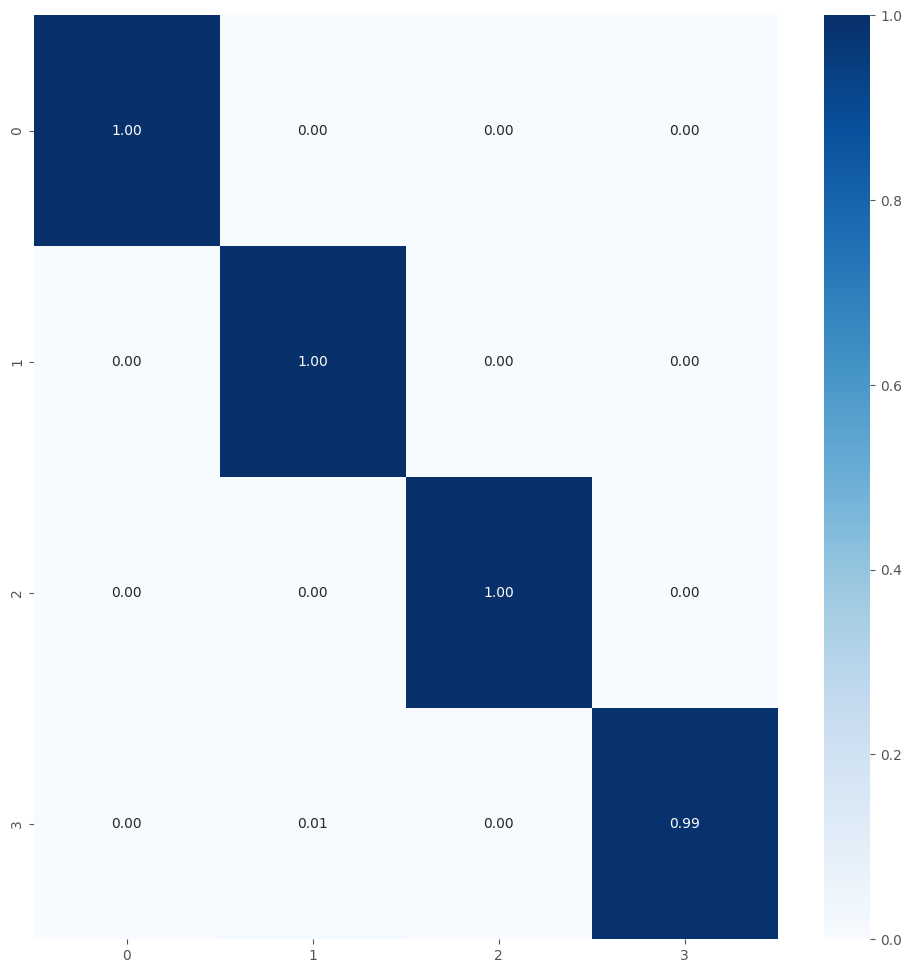


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15004_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_dw_13
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_10
- dense_30
- batch_normalization_10
- dropout_20
- dense_31
- dropout_21
- dense_32
Total: 16/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
131/131 [==============================] - 14s 77ms/step - loss: 0.0168 - accuracy: 0.9986 - val_loss: 0.0265 - val_accuracy: 0.9978 - lr: 1.0227e-04
Epoch 2/50
131/131 [==============================] - 10s 73ms/step - loss: 0.0168 - accuracy: 0.9990 - val_loss: 0.0279 - val_accuracy: 0.9967 - lr: 1.0227e-04
Epoch 3/50
131/131 [==============================] - 9s 72ms/step - loss: 0.0125 - accuracy: 1.0000 - val_loss: 0.0378 - val_accuracy: 0.

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15004_4.pkl
132/132 [==============================] - 8s 57ms/step - loss: 0.0158 - accuracy: 0.9990
Train Accuracy: 0.9990476369857788
Train Log Loss: 0.01578722707927227
29/29 [==============================] - 2s 57ms/step - loss: 0.0265 - accuracy: 0.9978
Validation Accuracy: 0.9977777600288391
Validation Log Loss: 0.02647087536752224
29/29 [==============================] - 2s 58ms/step - loss: 0.0196 - accuracy: 0.9978
Test Accuracy: 0.9977777600288391
Test Log Loss: 0.01959378272294998
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3}

Matriz de Confusión:
[[225   0   0   0]
 [  0 225   0   0]
 [  0   0 225   0]
 [  0   2   0 223]]
True labels: 900
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      1.00      1.00       225
           2   

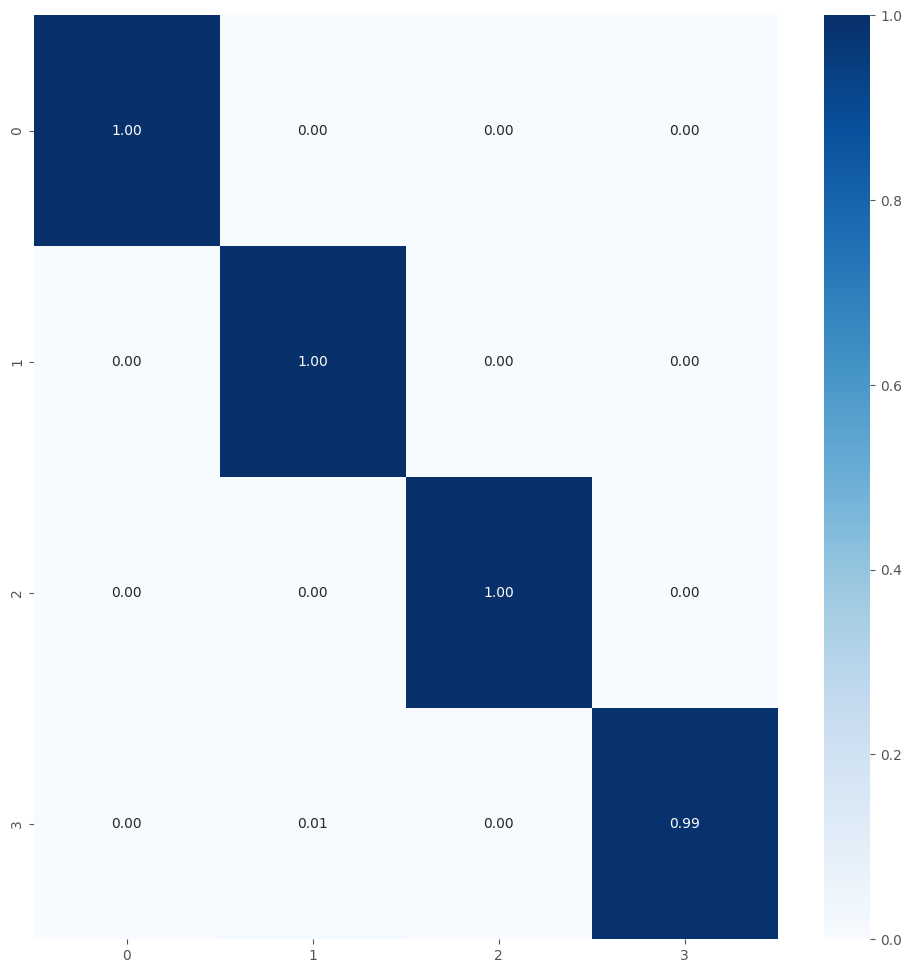


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15004_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_dw_13
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_10
- dense_30
- batch_normalization_10
- dropout_20
- dense_31
- dropout_21
- dense_32
Total: 16/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
131/131 [==============================] - 14s 78ms/step - loss: 0.0186 - accuracy: 0.9988 - val_loss: 0.0397 - val_accuracy: 0.9967 - lr: 1.0227e-04
Epoch 2/50
131/131 [==============================] - 9s 72ms/step - loss: 0.0175 - accuracy: 0.9988 - val_loss: 0.0447 - val_accuracy: 0.9933 - lr: 1.0227e-04
Epoch 3/50
131/131 [==============================] - 10s 72ms/step - loss: 0.0179 - accuracy: 0.9986 - val_loss: 0.0340 - val_accuracy: 0.

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15004_5.pkl
132/132 [==============================] - 8s 60ms/step - loss: 0.0096 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.009594482369720936
29/29 [==============================] - 2s 56ms/step - loss: 0.0304 - accuracy: 0.9978
Validation Accuracy: 0.9977777600288391
Validation Log Loss: 0.030350960791110992
29/29 [==============================] - 2s 58ms/step - loss: 0.0199 - accuracy: 0.9978
Test Accuracy: 0.9977777600288391
Test Log Loss: 0.019948501139879227
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3}

Matriz de Confusión:
[[225   0   0   0]
 [  0 225   0   0]
 [  0   0 225   0]
 [  0   2   0 223]]
True labels: 900
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      1.00      1.00       225
           2       1.00    

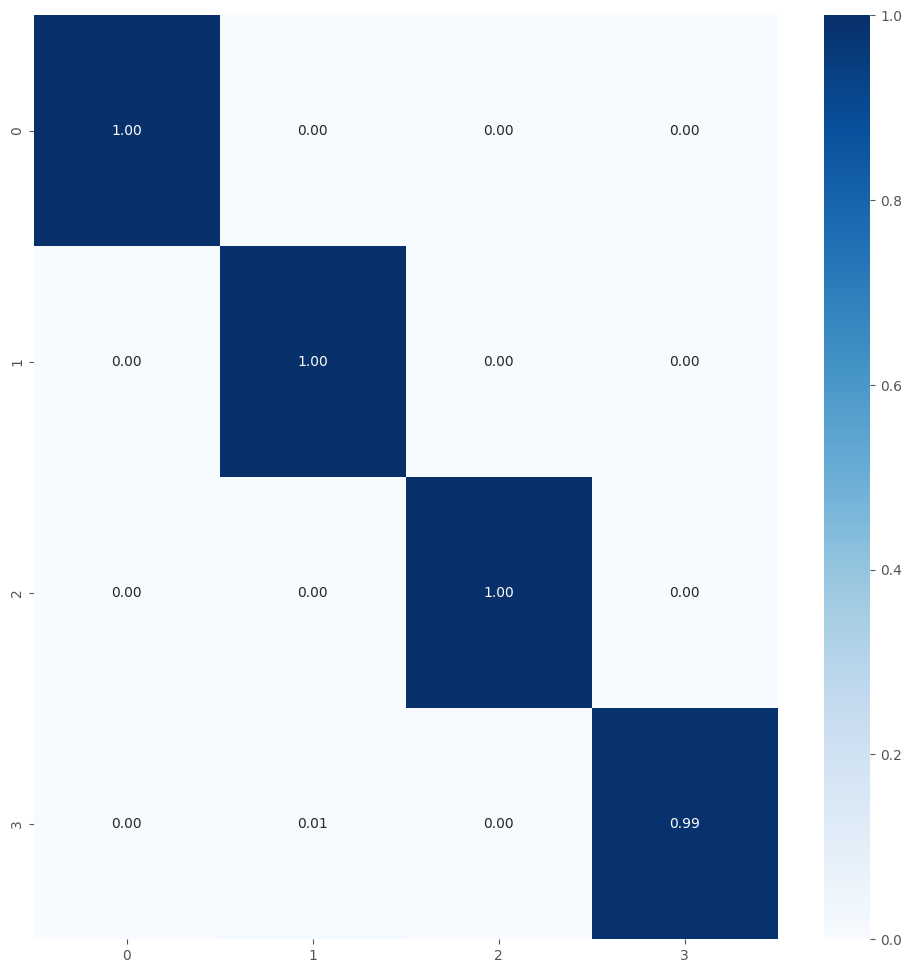


Best fold was 1 with val_accuracy: 0.9978
Average training accuracy in 5-fold: 1.0
Average validation precision in 5-fold: 0.9977678656578064

Test Metrics
test_acc_list: [0.9977777600288391, 0.9977777600288391, 0.9977777600288391, 0.9977777600288391, 0.9977777600288391]
Average Test Accuracy with 5-fold: 0.9977777600288391
test_loss_list: [0.043669942766427994, 0.03311115875840187, 0.04412014037370682, 0.01959378272294998, 0.019948501139879227]
Average Test Log Loss with 5-fold: 0.032088705152273175

Precision List: [0.9977973568281938, 0.9977973568281938, 0.9977973568281938, 0.9977973568281938, 0.9977973568281938]
Average Precision List with 5-fold: 0.9977973568281937
Recall List: [0.9977777777777778, 0.9977777777777778, 0.9977777777777778, 0.9977777777777778, 0.9977777777777778]
Average Recall List with 5-fold: 0.9977777777777778
F1 Score List: [0.9977777338811631, 0.9977777338811631, 0.9977777338811631, 0.9977777338811631, 0.9977777338811631]
Average F1 Score List with 5-fold: 0.9

In [24]:
%%time

num_classes = 4
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, 
    precision_list_all, recall_list_all, f1_score_list_all)

Familias de malware copiadas
source2: /notebooks/train3/all_malware/5
name_save_model: MobileNet_tf_15005
Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15005_best.h5
Loading pre-trained model...
Model loaded successfully.

Calculating layer importance (once for all folds)...

Calculando importancia con 5250 muestras (100% confianza, ±0% error)
Incluyendo 93 capas (base + personalizadas)


100%|██████████| 5250/5250 [11:00<00:00,  7.95it/s]
[I 2025-07-16 04:44:32,526] A new study created in memory with name: malware_classification_5classes



Resultados de importancia de capas (incluyendo personalizadas):
----------------------------------------------------------------------
Pos.  | Nombre de Capa                           | Importancia    
----------------------------------------------------------------------
1     | conv_pw_1                                | 0.0951261
2     | conv_pw_3                                | 0.0856717
3     | conv_dw_1                                | 0.0690956
4     | conv_dw_1_bn                             | 0.0670038
5     | conv_dw_2_bn                             | 0.0468136
6     | conv_pw_3_bn                             | 0.0464843
7     | conv_pw_2                                | 0.0449725
8     | conv1_bn                                 | 0.0447459
9     | conv_dw_4_bn                             | 0.0442691
10    | conv_dw_3_bn                             | 0.0405267
11    | conv_pw_1_bn                             | 0.0403949
12    | conv_pw_4                                | 0.03

[I 2025-07-16 04:54:30,861] Trial 0 finished with values: [0.9964285492897034, 0.14146876335144043] and parameters: {'learning_rate': 0.0012928511078011955, 'dropout_rate1': 0.30514582053493045, 'dropout_rate2': 0.37800504508370836, 'l2_reg': 0.0009057112003634496, 'units_dense1': 512, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 5, 'early_stopping_patience': 15, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 4.8391281504730176e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15005_best.h5
Successfully loaded and modified pretrained model
Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.


[I 2025-07-16 05:04:27,665] Trial 1 finished with values: [0.9973214268684387, 0.07306597381830215] and parameters: {'learning_rate': 0.0014464005723700596, 'dropout_rate1': 0.3350399862810765, 'dropout_rate2': 0.11509018419686844, 'l2_reg': 3.992014411977474e-05, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 8, 'early_stopping_patience': 10, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 3.197413169824892e-05, 'units_dense3': 64, 'dropout_rate3': 0.3256577235676045}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15005_best.h5
Successfully loaded and modified pretrained model
Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.


[I 2025-07-16 05:14:24,119] Trial 2 finished with values: [0.9964285492897034, 0.12455189228057861] and parameters: {'learning_rate': 0.0007373066312843413, 'dropout_rate1': 0.3386700856639787, 'dropout_rate2': 0.31587621072686056, 'l2_reg': 0.003060048130935983, 'units_dense1': 512, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 14, 'early_stopping_patience': 12, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 3.563784341734863e-06, 'units_dense3': 64, 'dropout_rate3': 0.37915939347364747}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15005_best.h5
Successfully loaded and modified pretrained model
Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.


[I 2025-07-16 05:24:20,996] Trial 3 finished with values: [0.9955357313156128, 0.12971177697181702] and parameters: {'learning_rate': 0.0005640088380899471, 'dropout_rate1': 0.4910401722569698, 'dropout_rate2': 0.4608707419805914, 'l2_reg': 0.00022911650316235897, 'units_dense1': 512, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 15, 'early_stopping_patience': 18, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 6.559711338241879e-06, 'units_dense3': 32, 'dropout_rate3': 0.17475581638026066}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15005_best.h5
Successfully loaded and modified pretrained model
Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.


[I 2025-07-16 05:34:16,275] Trial 4 finished with values: [0.9955357313156128, 0.1374700516462326] and parameters: {'learning_rate': 2.9159784229224603e-05, 'dropout_rate1': 0.254809371052229, 'dropout_rate2': 0.48751790199300793, 'l2_reg': 0.0011495790251784316, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 9, 'early_stopping_patience': 18, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 2.001235325095016e-06}.


Mejores trials para cada objetivo:
  Trial 1:
    val_accuracy: 0.9973
    val_loss: 0.0731
    Parámetros: {'learning_rate': 0.0014464005723700596, 'dropout_rate1': 0.3350399862810765, 'dropout_rate2': 0.11509018419686844, 'l2_reg': 3.992014411977474e-05, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 8, 'early_stopping_patience': 10, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 3.197413169824892e-05, 'units_dense3': 64, 'dropout_rate3': 0.3256577235676045}


/tmp/ipykernel_29/980747374.py:135: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

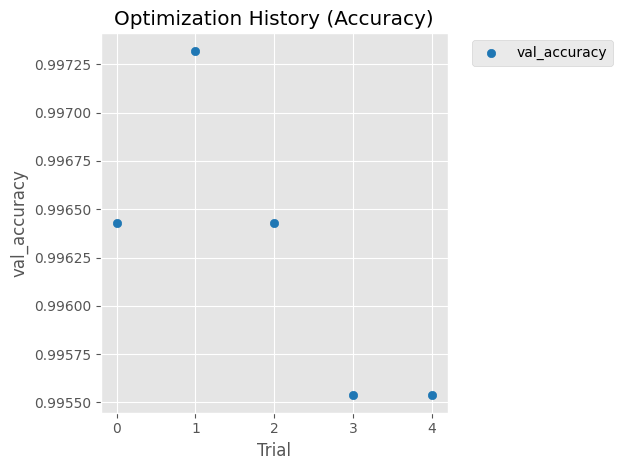

/tmp/ipykernel_29/980747374.py:146: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

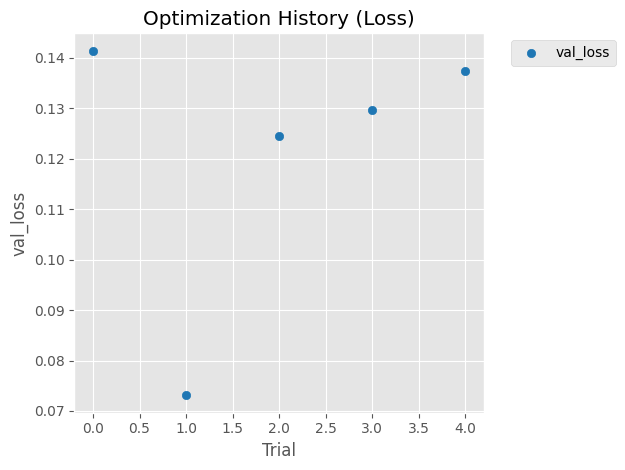

/tmp/ipykernel_29/980747374.py:184: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

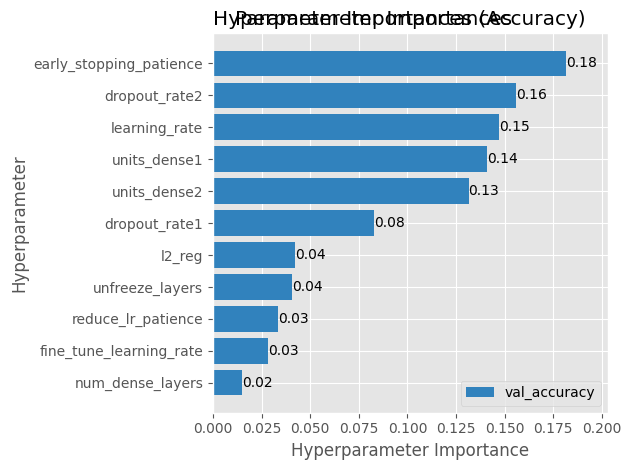


TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15005_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_relu
- global_average_pooling2d_15
- dense_45
- batch_normalization_15
- dropout_30
- dense_46
- dropout_31
- dense_47
Total: 11/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
164/164 [==============================] - 15s 76ms/step - loss: 0.1574 - accuracy: 0.9874 - val_loss: 0.1485 - val_accuracy: 0.9857 - lr: 1.4464e-04
Epoch 2/50
164/164 [==============================] - 12s 73ms/step - loss: 0.1230 - accuracy: 0.9950 - val_loss: 0.1356 - val_accuracy: 0.9937 - lr: 1.4464e-04
Epoch 3/50
164/164 [==============================] - 12s 74ms/step - loss: 0.1067 - accuracy: 0.9975 - val_loss: 0.1343 - val_accuracy: 0.9929 - lr: 1.4464e-04
Epoch 4/50
164/164 [==============================] -

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15005_1.pkl
165/165 [==============================] - 10s 61ms/step - loss: 0.0660 - accuracy: 0.9981
Train Accuracy: 0.9980952143669128
Train Log Loss: 0.0660296082496643
36/36 [==============================] - 2s 60ms/step - loss: 0.0891 - accuracy: 0.9964
Validation Accuracy: 0.9964444637298584
Validation Log Loss: 0.08912043273448944
36/36 [==============================] - 2s 60ms/step - loss: 0.1002 - accuracy: 0.9947
Test Accuracy: 0.9946666955947876
Test Log Loss: 0.10019791126251221
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3, 'wabot': 4}

Matriz de Confusión:
[[225   0   0   0   0]
 [  0 224   1   0   0]
 [  0   0 224   0   1]
 [  0   2   0 223   0]
 [  0   1   1   0 223]]
True labels: 1125
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1     

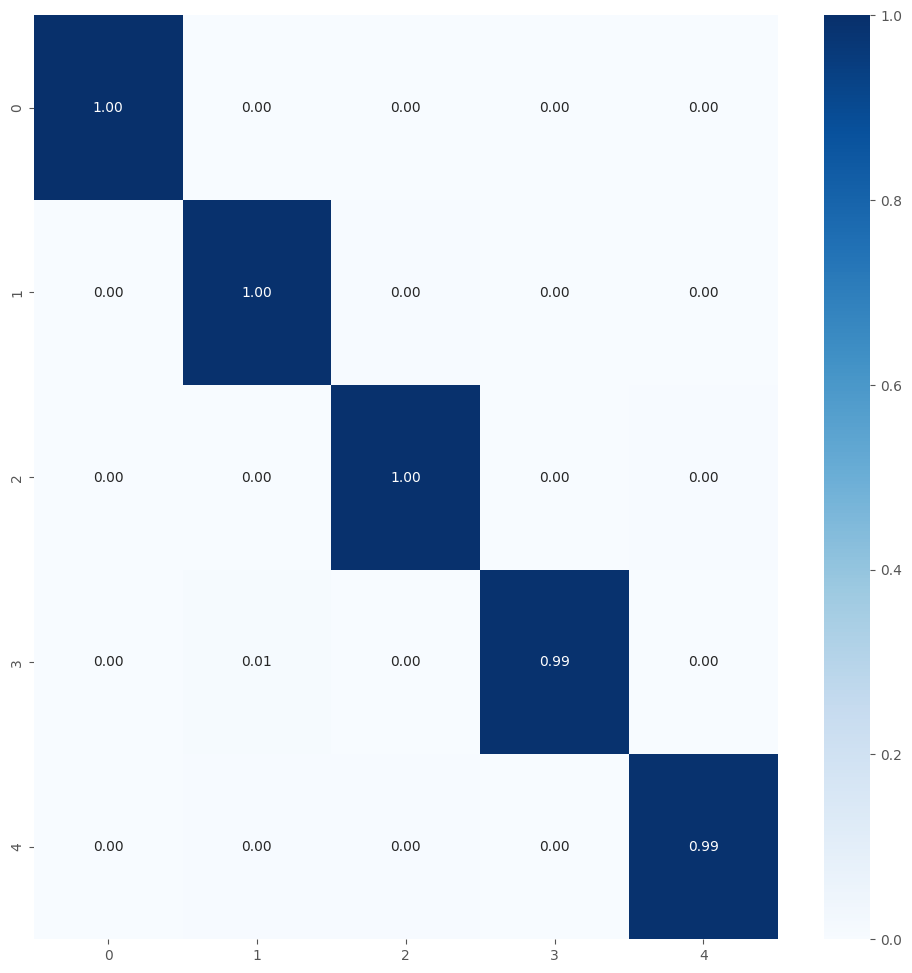


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15005_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_relu
- global_average_pooling2d_15
- dense_45
- batch_normalization_15
- dropout_30
- dense_46
- dropout_31
- dense_47
Total: 11/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
164/164 [==============================] - 16s 77ms/step - loss: 0.1447 - accuracy: 0.9925 - val_loss: 0.1537 - val_accuracy: 0.9866 - lr: 1.4464e-04
Epoch 2/50
164/164 [==============================] - 12s 74ms/step - loss: 0.1302 - accuracy: 0.9914 - val_loss: 0.1485 - val_accuracy: 0.9929 - lr: 1.4464e-04
Epoch 3/50
164/164 [==============================] - 12s 74ms/step - loss: 0.1160 - accuracy: 0.9952 - val_loss: 0.1604 - val_accuracy: 0.9875 - lr: 1.4464e-04
Epoch 4/50
164/164 [==============================] -

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15005_2.pkl
165/165 [==============================] - 10s 61ms/step - loss: 0.0879 - accuracy: 0.9994
Train Accuracy: 0.9994285702705383
Train Log Loss: 0.08794336766004562
36/36 [==============================] - 2s 58ms/step - loss: 0.1067 - accuracy: 0.9973
Validation Accuracy: 0.9973333477973938
Validation Log Loss: 0.10665354132652283
36/36 [==============================] - 2s 59ms/step - loss: 0.1202 - accuracy: 0.9920
Test Accuracy: 0.9919999837875366
Test Log Loss: 0.12018278241157532
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3, 'wabot': 4}

Matriz de Confusión:
[[225   0   0   0   0]
 [  0 225   0   0   0]
 [  0   0 223   0   2]
 [  0   2   0 223   0]
 [  0   1   4   0 220]]
True labels: 1125
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1    

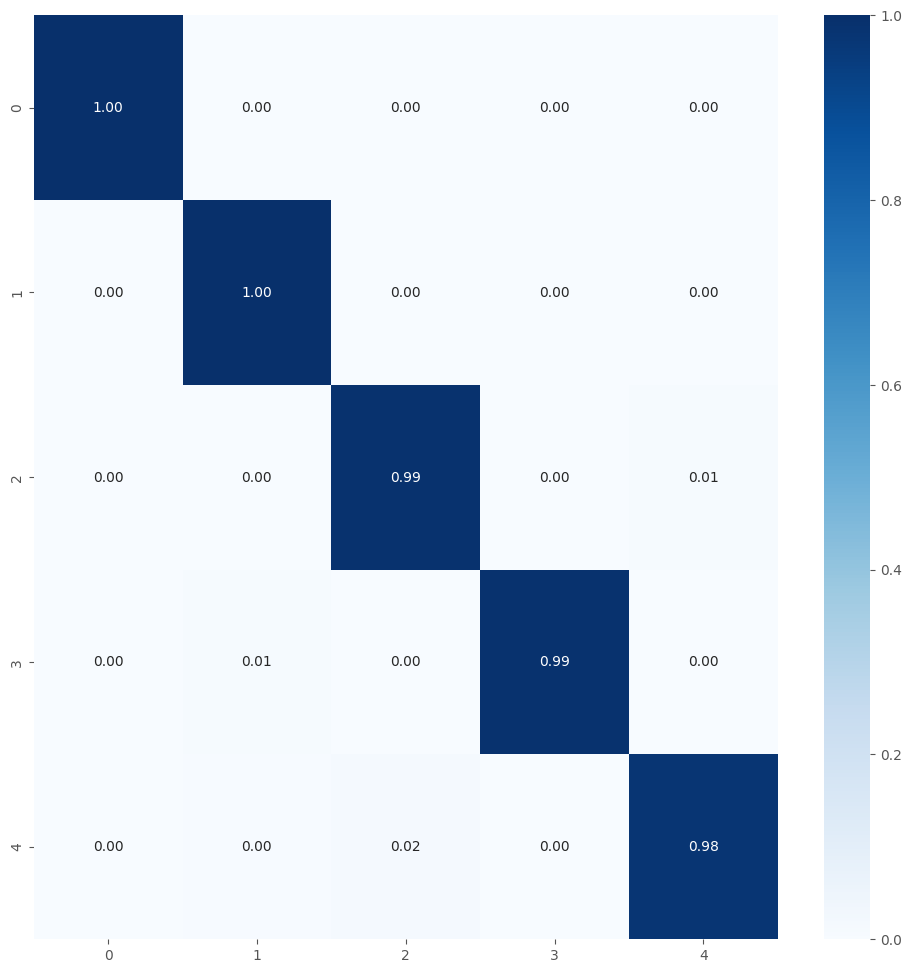


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15005_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_relu
- global_average_pooling2d_15
- dense_45
- batch_normalization_15
- dropout_30
- dense_46
- dropout_31
- dense_47
Total: 11/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
164/164 [==============================] - 16s 77ms/step - loss: 0.1479 - accuracy: 0.9927 - val_loss: 0.1417 - val_accuracy: 0.9920 - lr: 1.4464e-04
Epoch 2/50
164/164 [==============================] - 12s 75ms/step - loss: 0.1399 - accuracy: 0.9923 - val_loss: 0.1290 - val_accuracy: 0.9964 - lr: 1.4464e-04
Epoch 3/50
164/164 [==============================] - 12s 72ms/step - loss: 0.1149 - accuracy: 0.9960 - val_loss: 0.4078 - val_accuracy: 0.9268 - lr: 1.4464e-04
Epoch 4/50
164/164 [==============================] -

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15005_3.pkl
165/165 [==============================] - 10s 61ms/step - loss: 0.0951 - accuracy: 0.9987
Train Accuracy: 0.9986666440963745
Train Log Loss: 0.09508591145277023
36/36 [==============================] - 2s 58ms/step - loss: 0.1072 - accuracy: 0.9973
Validation Accuracy: 0.9973333477973938
Validation Log Loss: 0.1072114109992981
36/36 [==============================] - 2s 61ms/step - loss: 0.1202 - accuracy: 0.9929
Test Accuracy: 0.992888867855072
Test Log Loss: 0.12021568417549133
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3, 'wabot': 4}

Matriz de Confusión:
[[225   0   0   0   0]
 [  0 224   0   1   0]
 [  0   1 222   0   2]
 [  0   2   0 223   0]
 [  0   1   1   0 223]]
True labels: 1125
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1      

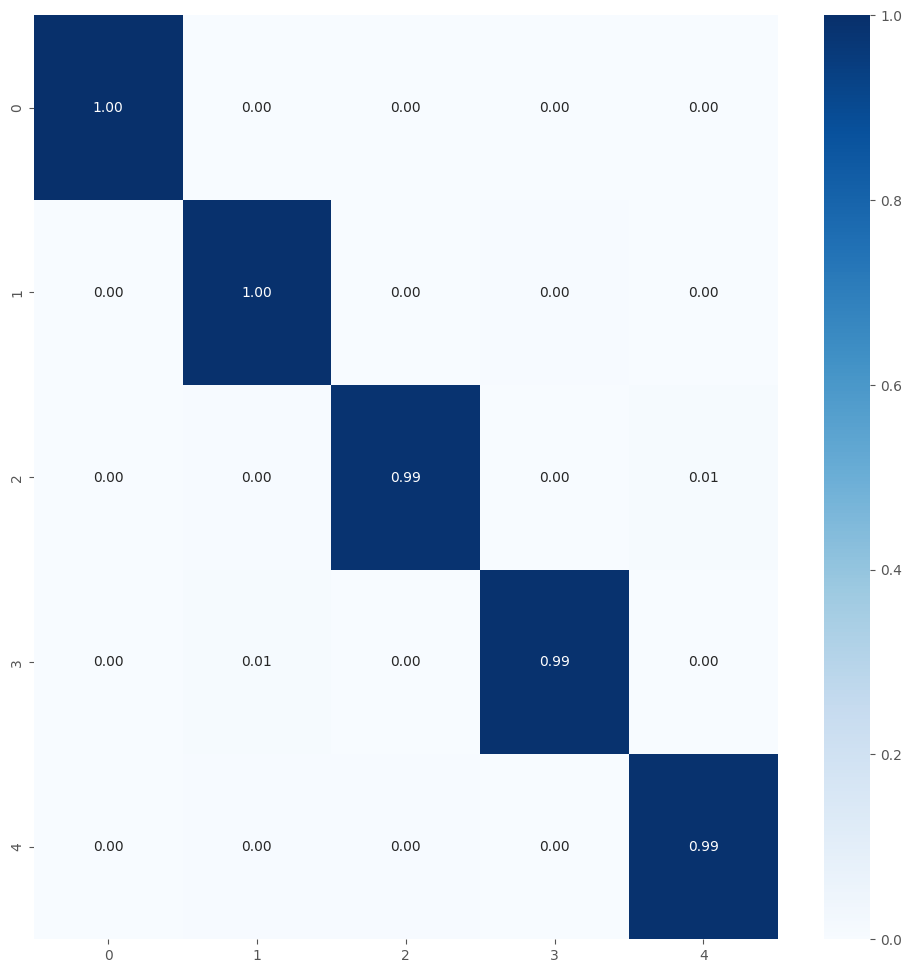


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15005_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_relu
- global_average_pooling2d_15
- dense_45
- batch_normalization_15
- dropout_30
- dense_46
- dropout_31
- dense_47
Total: 11/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
164/164 [==============================] - 17s 85ms/step - loss: 0.1487 - accuracy: 0.9902 - val_loss: 0.1387 - val_accuracy: 0.9955 - lr: 1.4464e-04
Epoch 2/50
164/164 [==============================] - 12s 74ms/step - loss: 0.1300 - accuracy: 0.9933 - val_loss: 0.2102 - val_accuracy: 0.9643 - lr: 1.4464e-04
Epoch 3/50
164/164 [==============================] - 12s 73ms/step - loss: 0.1179 - accuracy: 0.9952 - val_loss: 0.1292 - val_accuracy: 0.9955 - lr: 1.4464e-04
Epoch 4/50
164/164 [==============================] -

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15005_4.pkl
165/165 [==============================] - 10s 61ms/step - loss: 0.1131 - accuracy: 0.9990
Train Accuracy: 0.9990476369857788
Train Log Loss: 0.11307130008935928
36/36 [==============================] - 2s 60ms/step - loss: 0.1386 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.13857047259807587
36/36 [==============================] - 2s 59ms/step - loss: 0.1459 - accuracy: 0.9929
Test Accuracy: 0.992888867855072
Test Log Loss: 0.14588703215122223
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3, 'wabot': 4}

Matriz de Confusión:
[[225   0   0   0   0]
 [  0 224   0   1   0]
 [  0   0 224   0   1]
 [  0   2   0 223   0]
 [  0   0   4   0 221]]
True labels: 1125
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1      

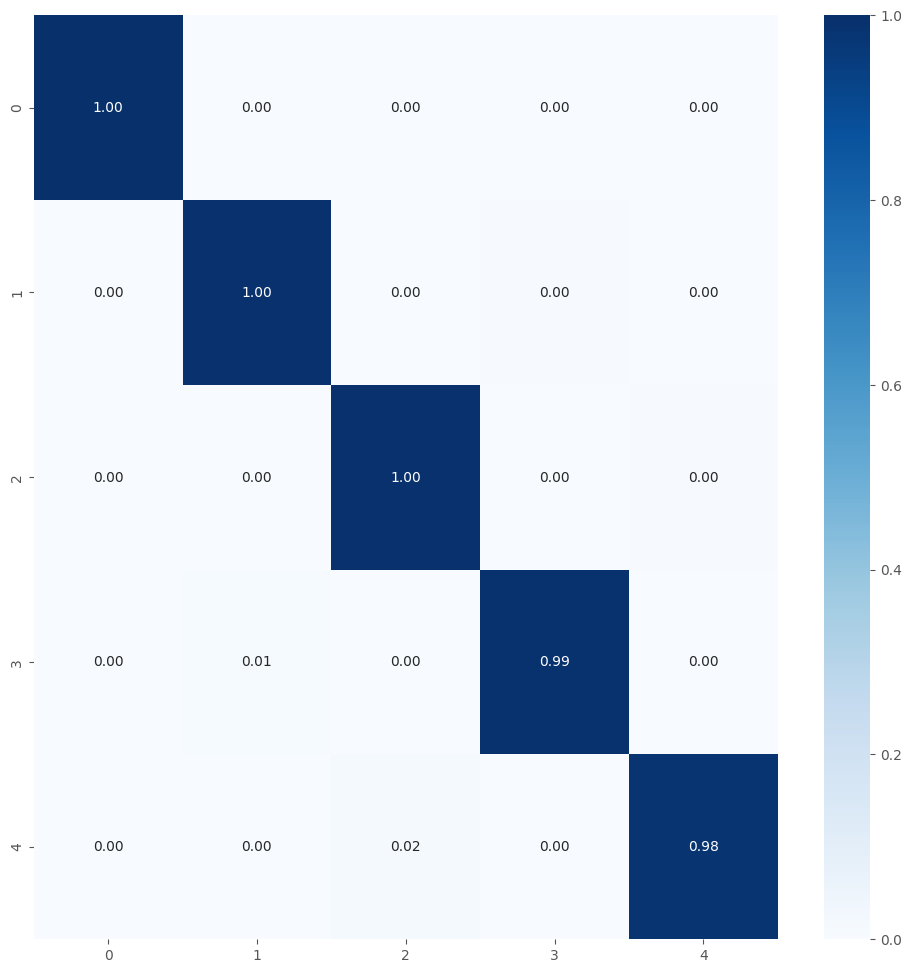


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15005_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_relu
- global_average_pooling2d_15
- dense_45
- batch_normalization_15
- dropout_30
- dense_46
- dropout_31
- dense_47
Total: 11/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
164/164 [==============================] - 16s 77ms/step - loss: 0.1566 - accuracy: 0.9910 - val_loss: 0.1810 - val_accuracy: 0.9786 - lr: 1.4464e-04
Epoch 2/50
164/164 [==============================] - 12s 75ms/step - loss: 0.1599 - accuracy: 0.9837 - val_loss: 0.1289 - val_accuracy: 0.9946 - lr: 1.4464e-04
Epoch 3/50
164/164 [==============================] - 12s 73ms/step - loss: 0.1259 - accuracy: 0.9958 - val_loss: 0.1269 - val_accuracy: 0.9946 - lr: 1.4464e-04
Epoch 4/50
164/164 [==============================] -

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15005_5.pkl
165/165 [==============================] - 10s 60ms/step - loss: 0.1000 - accuracy: 0.9981
Train Accuracy: 0.9980952143669128
Train Log Loss: 0.1000000610947609
36/36 [==============================] - 2s 59ms/step - loss: 0.1229 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.12293557077646255
36/36 [==============================] - 2s 58ms/step - loss: 0.1264 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.12636739015579224
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3, 'wabot': 4}

Matriz de Confusión:
[[225   0   0   0   0]
 [  0 225   0   0   0]
 [  0   0 224   0   1]
 [  0   2   0 223   0]
 [  0   1   1   0 223]]
True labels: 1125
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       

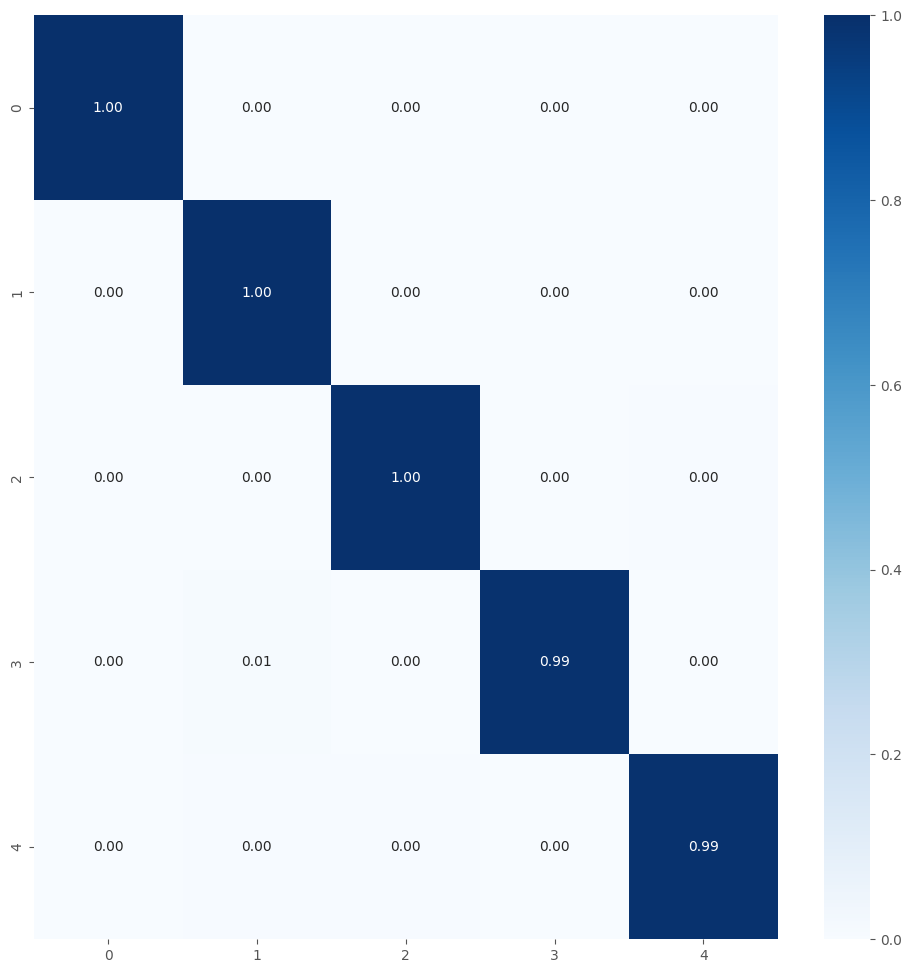


Best fold was 2 with val_accuracy: 0.9973
Average training accuracy in 5-fold: 0.9978535890579223
Average validation precision in 5-fold: 0.9966071367263794

Test Metrics
test_acc_list: [0.9946666955947876, 0.9919999837875366, 0.992888867855072, 0.992888867855072, 0.995555579662323]
Average Test Accuracy with 5-fold: 0.9935999989509583
test_loss_list: [0.10019791126251221, 0.12018278241157532, 0.12021568417549133, 0.14588703215122223, 0.12636739015579224]
Average Test Log Loss with 5-fold: 0.12257016003131867

Precision List: [0.9946940595465508, 0.9920423901759399, 0.9929237321629936, 0.9929275585219927, 0.9955866750208855]
Average Precision List with 5-fold: 0.9936348830856725
Recall List: [0.9946666666666667, 0.992, 0.9928888888888888, 0.9928888888888888, 0.9955555555555555]
Average Recall List with 5-fold: 0.9936
F1 Score List: [0.994670551517262, 0.9919957812377932, 0.9928926995224213, 0.9928886781804559, 0.9955574477616727]
Average F1 Score List with 5-fold: 0.993601031643921

M

In [25]:
%%time

num_classes = 5
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

Familias de malware copiadas
source2: /notebooks/train3/all_malware/6
name_save_model: MobileNet_tf_15006
Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15006_best.h5
Loading pre-trained model...
Model loaded successfully.

Calculating layer importance (once for all folds)...

Calculando importancia con 6300 muestras (100% confianza, ±0% error)
Incluyendo 93 capas (base + personalizadas)


100%|██████████| 6300/6300 [13:21<00:00,  7.86it/s]
[I 2025-07-16 06:06:39,092] A new study created in memory with name: malware_classification_6classes



Resultados de importancia de capas (incluyendo personalizadas):
----------------------------------------------------------------------
Pos.  | Nombre de Capa                           | Importancia    
----------------------------------------------------------------------
1     | conv_pw_1                                | 0.0261496
2     | conv_dw_1                                | 0.0233169
3     | conv_pw_3                                | 0.0231685
4     | conv_dw_1_bn                             | 0.0180338
5     | conv_dw_2_bn                             | 0.0128415
6     | conv_pw_2                                | 0.0128342
7     | conv_pw_3_bn                             | 0.0117803
8     | conv_dw_3_bn                             | 0.0109534
9     | conv_dw_4_bn                             | 0.0107876
10    | conv1_bn                                 | 0.0103366
11    | conv_pw_1_bn                             | 0.0101895
12    | conv_pw_4                                | 0.00

[I 2025-07-16 06:18:26,912] Trial 0 finished with values: [0.996279776096344, 0.024158963933587074] and parameters: {'learning_rate': 0.0027616420664442025, 'dropout_rate1': 0.3709318642516805, 'dropout_rate2': 0.35550640212647744, 'l2_reg': 6.087317271575613e-05, 'units_dense1': 1024, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 18, 'reduce_lr_patience': 15, 'fine_tune_learning_rate': 2.0858990770175987e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15006_best.h5
Successfully loaded and modified pretrained model
Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.


[I 2025-07-16 06:30:29,356] Trial 1 finished with values: [0.9955357313156128, 0.04414604604244232] and parameters: {'learning_rate': 1.040126883213873e-05, 'dropout_rate1': 0.3547549134757861, 'dropout_rate2': 0.4672738276605639, 'l2_reg': 1.4485382950014923e-05, 'units_dense1': 1024, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 16, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 4.486326432130433e-05, 'units_dense3': 64, 'dropout_rate3': 0.25023443206035256}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15006_best.h5
Successfully loaded and modified pretrained model
Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.


[I 2025-07-16 06:42:01,067] Trial 2 finished with values: [0.9955357313156128, 0.03616378828883171] and parameters: {'learning_rate': 6.485837580039739e-05, 'dropout_rate1': 0.5344304354676743, 'dropout_rate2': 0.3311042649537331, 'l2_reg': 0.00022404345676665222, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 19, 'reduce_lr_patience': 14, 'fine_tune_learning_rate': 2.0516363737795914e-05, 'units_dense3': 128, 'dropout_rate3': 0.3107633890633166}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15006_best.h5
Successfully loaded and modified pretrained model
Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.


[I 2025-07-16 06:53:58,732] Trial 3 finished with values: [0.9955357313156128, 0.038024142384529114] and parameters: {'learning_rate': 0.00010771306999847665, 'dropout_rate1': 0.2859956383117864, 'dropout_rate2': 0.3048107408201753, 'l2_reg': 0.00048295286200720117, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 20, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 5.036942678214625e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15006_best.h5
Successfully loaded and modified pretrained model
Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.


[I 2025-07-16 07:05:57,950] Trial 4 finished with values: [0.996279776096344, 0.03709207847714424] and parameters: {'learning_rate': 2.7419946568558266e-05, 'dropout_rate1': 0.3231635400742509, 'dropout_rate2': 0.2642631859882253, 'l2_reg': 0.00043489855757532095, 'units_dense1': 1024, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 8, 'early_stopping_patience': 18, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 2.0577872936700145e-06}.


Mejores trials para cada objetivo:
  Trial 0:
    val_accuracy: 0.9963
    val_loss: 0.0242
    Parámetros: {'learning_rate': 0.0027616420664442025, 'dropout_rate1': 0.3709318642516805, 'dropout_rate2': 0.35550640212647744, 'l2_reg': 6.087317271575613e-05, 'units_dense1': 1024, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 18, 'reduce_lr_patience': 15, 'fine_tune_learning_rate': 2.0858990770175987e-05}


/tmp/ipykernel_29/980747374.py:135: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

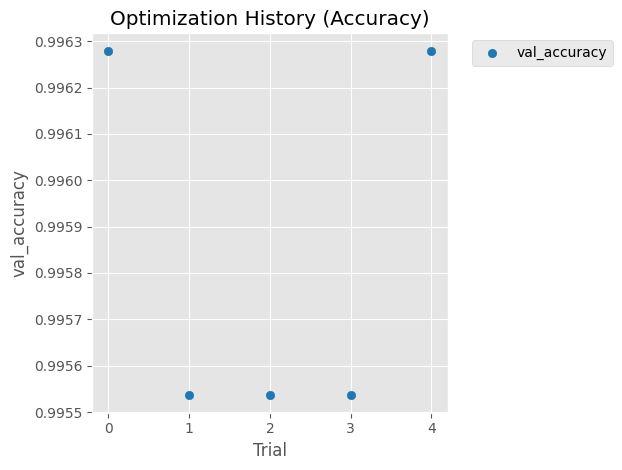

/tmp/ipykernel_29/980747374.py:146: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

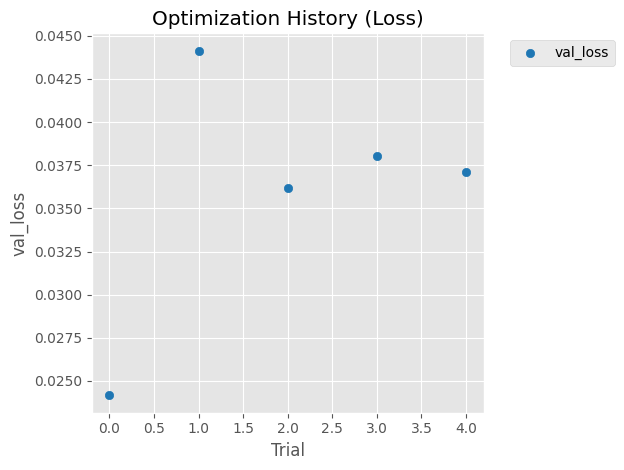

/tmp/ipykernel_29/980747374.py:184: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

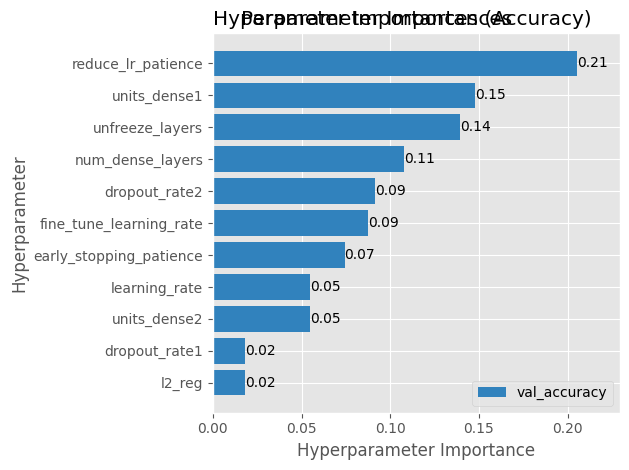


TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15006_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_22
- dense_66
- batch_normalization_22
- dropout_44
- dense_67
- dropout_45
- dense_68
Total: 13/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
196/196 [==============================] - 20s 78ms/step - loss: 0.0734 - accuracy: 0.9858 - val_loss: 0.0683 - val_accuracy: 0.9911 - lr: 2.7616e-04
Epoch 2/50
196/196 [==============================] - 15s 76ms/step - loss: 0.0467 - accuracy: 0.9936 - val_loss: 0.0731 - val_accuracy: 0.9829 - lr: 2.7616e-04
Epoch 3/50
196/196 [==============================] - 15s 76ms/step - loss: 0.0578 - accuracy: 0.9895 - val_loss: 0.0982 - val_accuracy: 0.9754 - lr: 2.7616e-04
Epoch 4/50
196/196 [====

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15006_1.pkl
197/197 [==============================] - 12s 61ms/step - loss: 0.0318 - accuracy: 0.9983
Train Accuracy: 0.9982539415359497
Train Log Loss: 0.03182565048336983
43/43 [==============================] - 3s 61ms/step - loss: 0.0562 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.056172966957092285
43/43 [==============================] - 3s 61ms/step - loss: 0.0592 - accuracy: 0.9933
Test Accuracy: 0.9933333396911621
Test Log Loss: 0.05919629707932472
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'mira': 2, 'sfone': 3, 'sillyp2p': 4, 'wabot': 5}

Matriz de Confusión:
[[225   0   0   0   0   0]
 [  0 225   0   0   0   0]
 [  0   0 225   0   0   0]
 [  0   0   0 221   0   4]
 [  0   2   0   0 223   0]
 [  0   1   0   2   0 222]]
True labels: 1350
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0

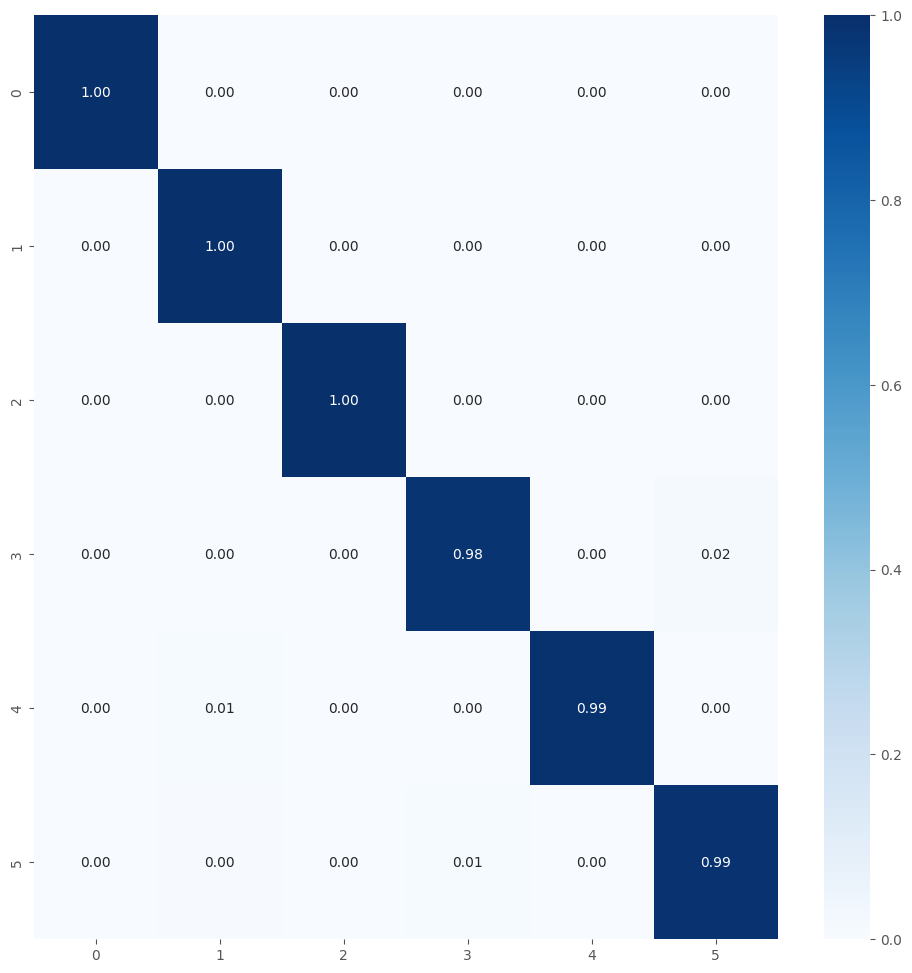


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15006_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_22
- dense_66
- batch_normalization_22
- dropout_44
- dense_67
- dropout_45
- dense_68
Total: 13/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
196/196 [==============================] - 19s 78ms/step - loss: 0.0813 - accuracy: 0.9823 - val_loss: 0.0701 - val_accuracy: 0.9888 - lr: 2.7616e-04
Epoch 2/50
196/196 [==============================] - 15s 75ms/step - loss: 0.0743 - accuracy: 0.9836 - val_loss: 0.5478 - val_accuracy: 0.8259 - lr: 2.7616e-04
Epoch 3/50
196/196 [==============================] - 15s 74ms/step - loss: 0.0508 - accuracy: 0.9915 - val_loss: 0.1040 - val_accuracy: 0.9717 - lr: 2.7616e-04
Epoch 4/50
196/196 [====

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15006_2.pkl
197/197 [==============================] - 12s 61ms/step - loss: 0.0209 - accuracy: 0.9990
Train Accuracy: 0.9990476369857788
Train Log Loss: 0.02088850736618042
43/43 [==============================] - 3s 61ms/step - loss: 0.0377 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.03766770660877228
43/43 [==============================] - 3s 60ms/step - loss: 0.0372 - accuracy: 0.9948
Test Accuracy: 0.9948148131370544
Test Log Loss: 0.03718239814043045
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'mira': 2, 'sfone': 3, 'sillyp2p': 4, 'wabot': 5}

Matriz de Confusión:
[[225   0   0   0   0   0]
 [  0 224   1   0   0   0]
 [  0   0 225   0   0   0]
 [  0   0   0 223   0   2]
 [  0   2   0   0 223   0]
 [  0   1   1   0   0 223]]
True labels: 1350
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0 

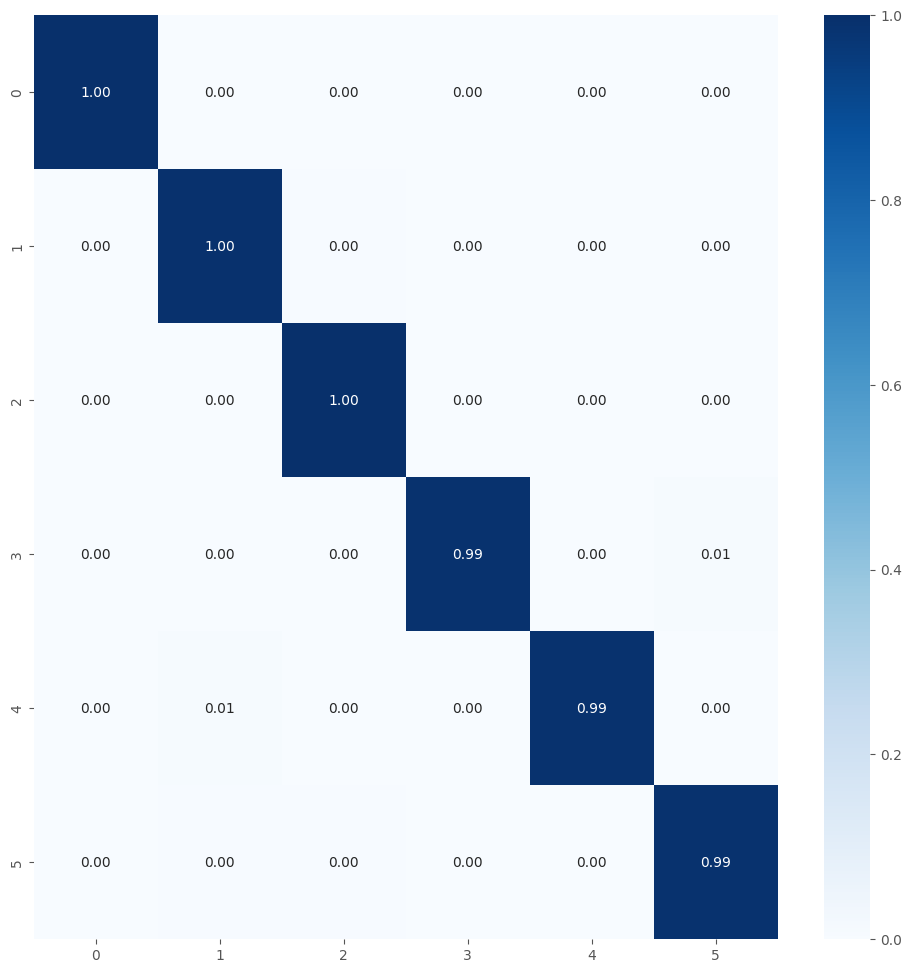


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15006_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_22
- dense_66
- batch_normalization_22
- dropout_44
- dense_67
- dropout_45
- dense_68
Total: 13/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
196/196 [==============================] - 19s 79ms/step - loss: 0.0833 - accuracy: 0.9832 - val_loss: 0.0755 - val_accuracy: 0.9866 - lr: 2.7616e-04
Epoch 2/50
196/196 [==============================] - 13s 66ms/step - loss: 0.0530 - accuracy: 0.9915 - val_loss: 0.1100 - val_accuracy: 0.9829 - lr: 2.7616e-04
Epoch 3/50
196/196 [==============================] - 14s 74ms/step - loss: 0.0527 - accuracy: 0.9930 - val_loss: 0.0698 - val_accuracy: 0.9851 - lr: 2.7616e-04
Epoch 4/50
196/196 [====

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15006_3.pkl
197/197 [==============================] - 12s 61ms/step - loss: 0.0236 - accuracy: 0.9989
Train Accuracy: 0.9988889098167419
Train Log Loss: 0.02364165522158146
43/43 [==============================] - 3s 61ms/step - loss: 0.0344 - accuracy: 0.9978
Validation Accuracy: 0.9977777600288391
Validation Log Loss: 0.034428536891937256
43/43 [==============================] - 3s 60ms/step - loss: 0.0423 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.04233277961611748
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'mira': 2, 'sfone': 3, 'sillyp2p': 4, 'wabot': 5}

Matriz de Confusión:
[[225   0   0   0   0   0]
 [  0 224   1   0   0   0]
 [  0   0 225   0   0   0]
 [  0   0   0 224   0   1]
 [  0   2   0   0 223   0]
 [  0   1   0   1   0 223]]
True labels: 1350
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0

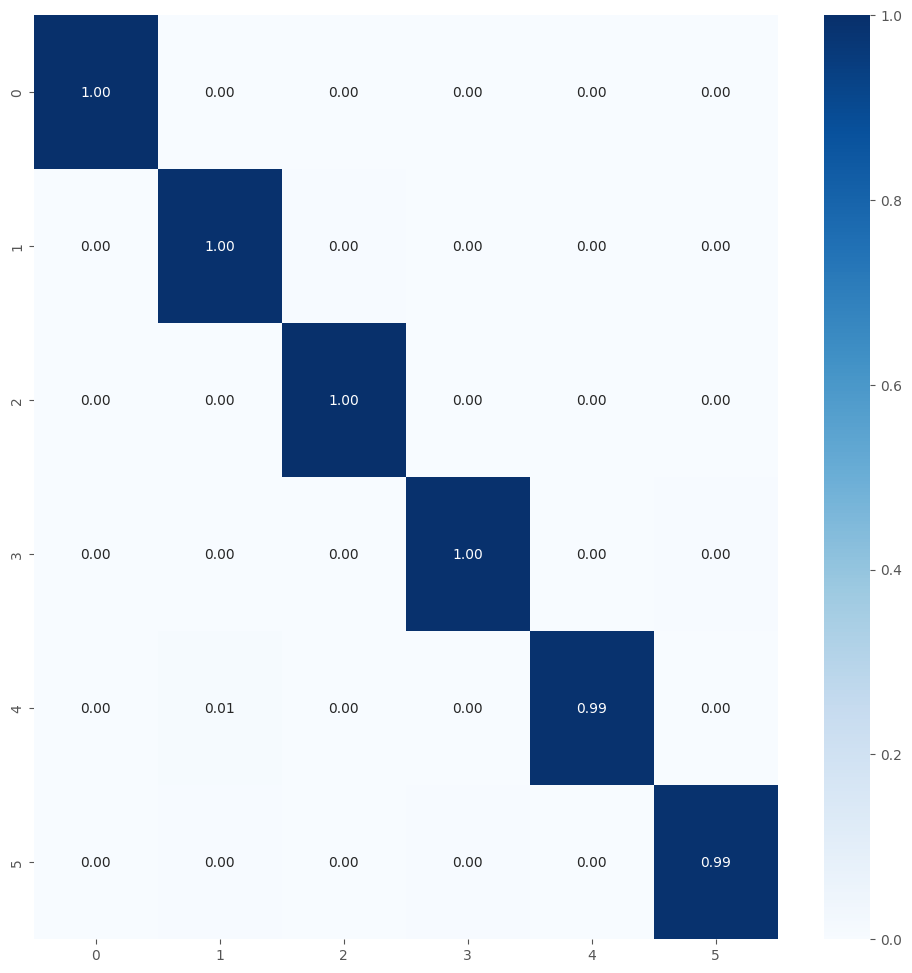


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15006_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_22
- dense_66
- batch_normalization_22
- dropout_44
- dense_67
- dropout_45
- dense_68
Total: 13/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
196/196 [==============================] - 18s 77ms/step - loss: 0.0639 - accuracy: 0.9882 - val_loss: 0.1542 - val_accuracy: 0.9673 - lr: 2.7616e-04
Epoch 2/50
196/196 [==============================] - 14s 73ms/step - loss: 0.0659 - accuracy: 0.9869 - val_loss: 0.1133 - val_accuracy: 0.9747 - lr: 2.7616e-04
Epoch 3/50
196/196 [==============================] - 15s 74ms/step - loss: 0.0459 - accuracy: 0.9943 - val_loss: 0.0988 - val_accuracy: 0.9829 - lr: 2.7616e-04
Epoch 4/50
196/196 [====

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15006_4.pkl
197/197 [==============================] - 12s 62ms/step - loss: 0.0228 - accuracy: 0.9984
Train Accuracy: 0.9984126687049866
Train Log Loss: 0.02278941497206688
43/43 [==============================] - 3s 59ms/step - loss: 0.0442 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.04421450197696686
43/43 [==============================] - 3s 61ms/step - loss: 0.0421 - accuracy: 0.9963
Test Accuracy: 0.9962962865829468
Test Log Loss: 0.042060233652591705
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'mira': 2, 'sfone': 3, 'sillyp2p': 4, 'wabot': 5}

Matriz de Confusión:
[[225   0   0   0   0   0]
 [  0 224   0   0   1   0]
 [  0   0 225   0   0   0]
 [  0   0   0 224   0   1]
 [  0   2   0   0 223   0]
 [  0   1   0   0   0 224]]
True labels: 1350
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0

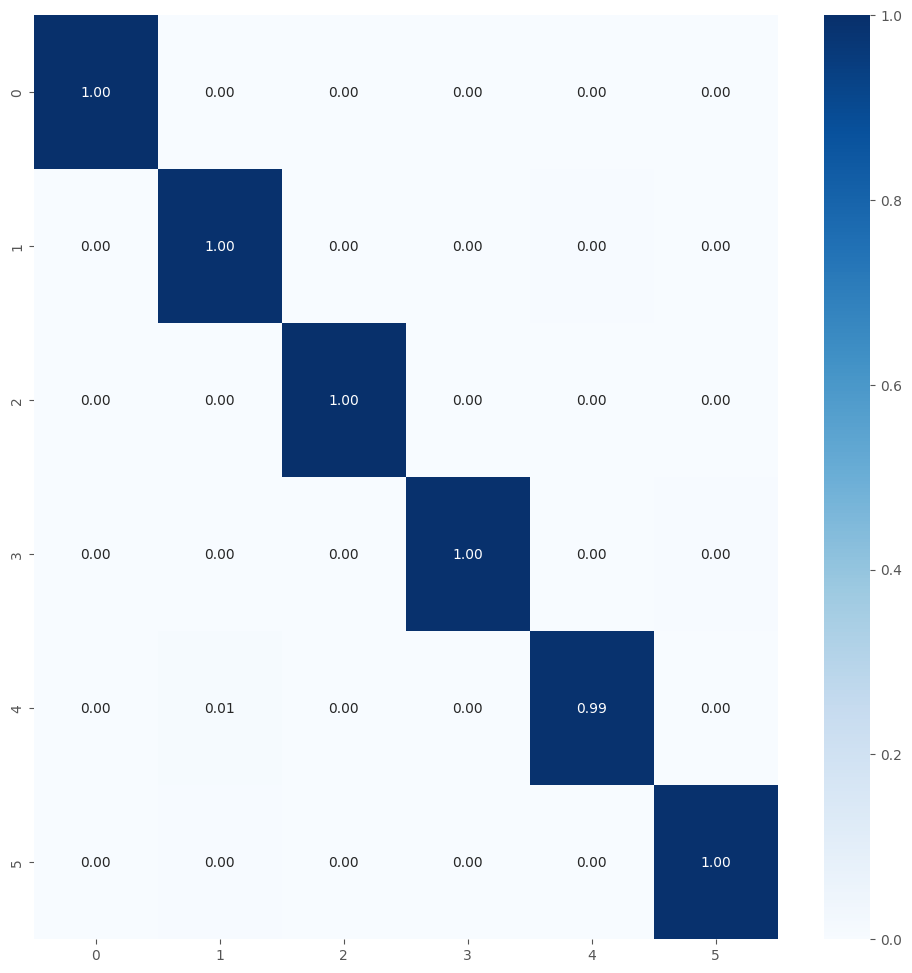


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15006_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_22
- dense_66
- batch_normalization_22
- dropout_44
- dense_67
- dropout_45
- dense_68
Total: 13/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
196/196 [==============================] - 19s 78ms/step - loss: 0.0664 - accuracy: 0.9856 - val_loss: 0.0648 - val_accuracy: 0.9911 - lr: 2.7616e-04
Epoch 2/50
196/196 [==============================] - 15s 74ms/step - loss: 0.0555 - accuracy: 0.9909 - val_loss: 0.0966 - val_accuracy: 0.9784 - lr: 2.7616e-04
Epoch 3/50
196/196 [==============================] - 15s 76ms/step - loss: 0.0597 - accuracy: 0.9906 - val_loss: 0.0531 - val_accuracy: 0.9940 - lr: 2.7616e-04
Epoch 4/50
196/196 [====

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15006_5.pkl
197/197 [==============================] - 12s 62ms/step - loss: 0.0416 - accuracy: 0.9970
Train Accuracy: 0.9969841241836548
Train Log Loss: 0.041603606194257736
43/43 [==============================] - 3s 60ms/step - loss: 0.0552 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.05524592101573944
43/43 [==============================] - 3s 60ms/step - loss: 0.0505 - accuracy: 0.9963
Test Accuracy: 0.9962962865829468
Test Log Loss: 0.05047891288995743
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'mira': 2, 'sfone': 3, 'sillyp2p': 4, 'wabot': 5}

Matriz de Confusión:
[[225   0   0   0   0   0]
 [  0 224   0   0   1   0]
 [  0   0 225   0   0   0]
 [  0   0   0 224   0   1]
 [  0   2   0   0 223   0]
 [  0   1   0   0   0 224]]
True labels: 1350
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0

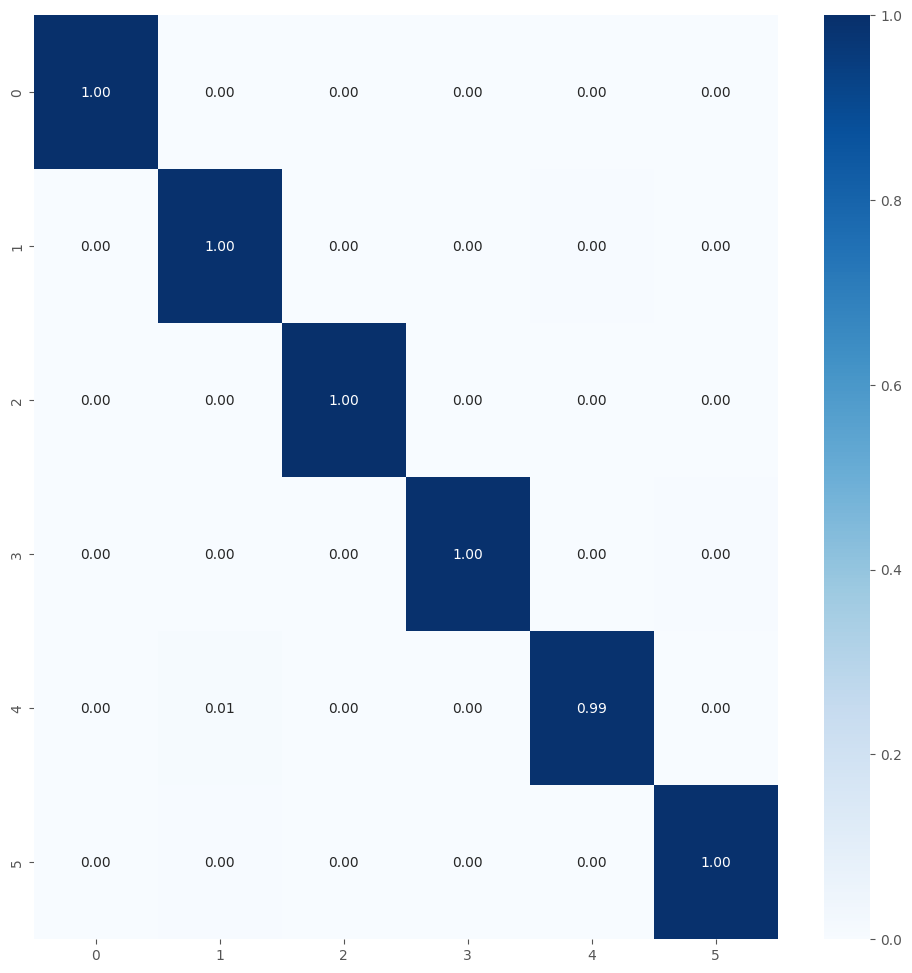


Best fold was 3 with val_accuracy: 0.9978
Average training accuracy in 5-fold: 0.99907466173172
Average validation precision in 5-fold: 0.9959821581840516

Test Metrics
test_acc_list: [0.9933333396911621, 0.9948148131370544, 0.995555579662323, 0.9962962865829468, 0.9962962865829468]
Average Test Accuracy with 5-fold: 0.9952592611312866
test_loss_list: [0.05919629707932472, 0.03718239814043045, 0.04233277961611748, 0.042060233652591705, 0.05047891288995743]
Average Test Log Loss with 5-fold: 0.046250124275684354

Precision List: [0.9933623967255732, 0.9948474465655083, 0.9955751053415618, 0.9963125684684054, 0.9963125684684054]
Average Precision List with 5-fold: 0.9952820171138909
Recall List: [0.9933333333333333, 0.9948148148148149, 0.9955555555555557, 0.9962962962962965, 0.9962962962962965]
Average Recall List with 5-fold: 0.9952592592592595
F1 Score List: [0.9933332127141689, 0.9948180338998923, 0.995557150490385, 0.9962995520107687, 0.9962995520107687]
Average F1 Score List with 5

In [26]:
%%time

num_classes = 6
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

Familias de malware copiadas
source2: /notebooks/train3/all_malware/7
name_save_model: MobileNet_tf_15007
Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15007_best.h5
Loading pre-trained model...
Model loaded successfully.

Calculating layer importance (once for all folds)...

Calculando importancia con 7350 muestras (100% confianza, ±0% error)
Incluyendo 93 capas (base + personalizadas)


100%|██████████| 7350/7350 [15:29<00:00,  7.90it/s]
[I 2025-07-16 08:05:16,955] A new study created in memory with name: malware_classification_7classes



Resultados de importancia de capas (incluyendo personalizadas):
----------------------------------------------------------------------
Pos.  | Nombre de Capa                           | Importancia    
----------------------------------------------------------------------
1     | conv_pw_1                                | 0.0000889
2     | conv_pw_3                                | 0.0000802
3     | conv_dw_1                                | 0.0000665
4     | conv_dw_1_bn                             | 0.0000557
5     | conv_pw_2                                | 0.0000463
6     | conv_dw_2_bn                             | 0.0000439
7     | conv_pw_3_bn                             | 0.0000409
8     | conv_dw_3_bn                             | 0.0000395
9     | conv_dw_4_bn                             | 0.0000380
10    | conv_pw_1_bn                             | 0.0000358
11    | conv1_bn                                 | 0.0000356
12    | conv_pw_4                                | 0.00

[I 2025-07-16 08:14:40,195] Trial 0 finished with values: [0.9942601919174194, 0.03972742334008217] and parameters: {'learning_rate': 0.0017678113158508786, 'dropout_rate1': 0.21043205427305556, 'dropout_rate2': 0.1053065709059756, 'l2_reg': 3.377306951375736e-05, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 8, 'early_stopping_patience': 14, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 9.564621005200976e-06, 'units_dense3': 32, 'dropout_rate3': 0.3553321676297415}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15007_best.h5
Successfully loaded and modified pretrained model
Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.


[I 2025-07-16 08:28:28,437] Trial 1 finished with values: [0.9936224222183228, 0.042296454310417175] and parameters: {'learning_rate': 4.269148049892666e-05, 'dropout_rate1': 0.21805784864772734, 'dropout_rate2': 0.4204506802928213, 'l2_reg': 0.0035862809310096715, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 13, 'early_stopping_patience': 19, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 4.164578938164474e-06, 'units_dense3': 32, 'dropout_rate3': 0.247589004402391}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15007_best.h5
Successfully loaded and modified pretrained model
Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.


[I 2025-07-16 08:33:45,505] Trial 2 finished with values: [0.9942601919174194, 0.04853609576821327] and parameters: {'learning_rate': 2.8087227172113505e-05, 'dropout_rate1': 0.25700073184877487, 'dropout_rate2': 0.33749450513330115, 'l2_reg': 0.001927205817027348, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 13, 'early_stopping_patience': 16, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 9.65869131964069e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15007_best.h5
Successfully loaded and modified pretrained model
Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.


[I 2025-07-16 08:37:23,951] Trial 3 finished with values: [0.9942601919174194, 0.04462140426039696] and parameters: {'learning_rate': 5.05231114621992e-05, 'dropout_rate1': 0.5761736854769539, 'dropout_rate2': 0.1679437426693861, 'l2_reg': 0.00019917019907976047, 'units_dense1': 1024, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 9, 'early_stopping_patience': 11, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 8.203438986909597e-06, 'units_dense3': 64, 'dropout_rate3': 0.16737287246691196}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15007_best.h5
Successfully loaded and modified pretrained model
Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.


[I 2025-07-16 08:44:33,791] Trial 4 finished with values: [0.9955357313156128, 0.044819820672273636] and parameters: {'learning_rate': 0.0011009386654285878, 'dropout_rate1': 0.5590306272684269, 'dropout_rate2': 0.3742157433008171, 'l2_reg': 0.0002805642478153299, 'units_dense1': 512, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 16, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 5.803608530719822e-05, 'units_dense3': 128, 'dropout_rate3': 0.15609064724281618}.


Mejores trials para cada objetivo:
  Trial 0:
    val_accuracy: 0.9943
    val_loss: 0.0397
    Parámetros: {'learning_rate': 0.0017678113158508786, 'dropout_rate1': 0.21043205427305556, 'dropout_rate2': 0.1053065709059756, 'l2_reg': 3.377306951375736e-05, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 8, 'early_stopping_patience': 14, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 9.564621005200976e-06, 'units_dense3': 32, 'dropout_rate3': 0.3553321676297415}
  Trial 4:
    val_accuracy: 0.9955
    val_loss: 0.0448
    Parámetros: {'learning_rate': 0.0011009386654285878, 'dropout_rate1': 0.5590306272684269, 'dropout_rate2': 0.3742157433008171, 'l2_reg': 0.0002805642478153299, 'units_dense1': 512, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 16, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 5.803608530719822e-05, 'units_dense3': 128, 'dropout_rate3': 0.15609064724281618}


/tmp/ipykernel_29/980747374.py:135: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

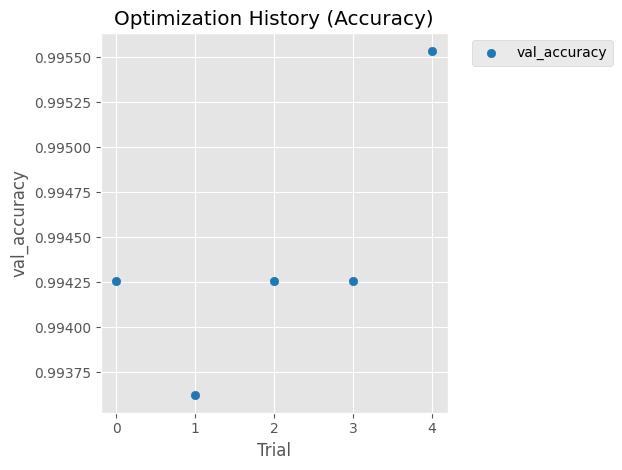

/tmp/ipykernel_29/980747374.py:146: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

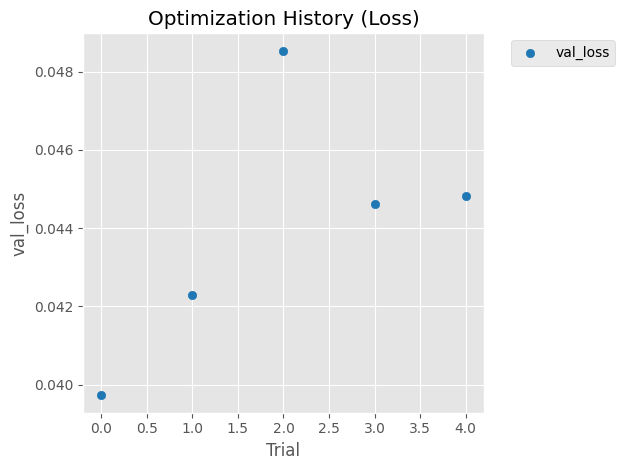

/tmp/ipykernel_29/980747374.py:184: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

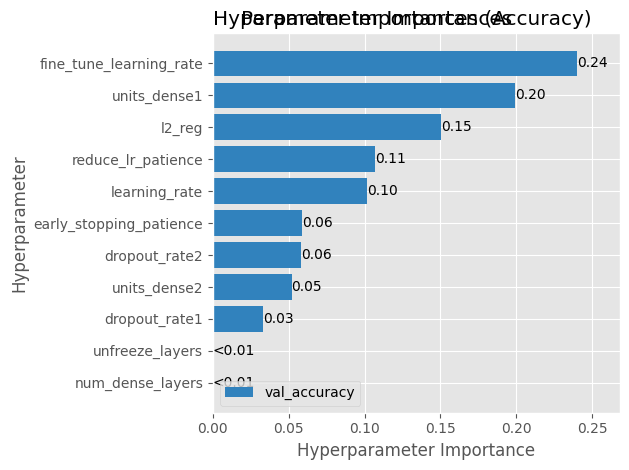


TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15007_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_relu
- global_average_pooling2d_25
- dense_75
- batch_normalization_25
- dropout_50
- dense_76
- dropout_51
- dense_77
Total: 11/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
229/229 [==============================] - 20s 76ms/step - loss: 0.0489 - accuracy: 0.9913 - val_loss: 0.0561 - val_accuracy: 0.9943 - lr: 1.7678e-04
Epoch 2/50
229/229 [==============================] - 17s 73ms/step - loss: 0.0304 - accuracy: 0.9964 - val_loss: 0.0561 - val_accuracy: 0.9930 - lr: 1.7678e-04
Epoch 3/50
229/229 [==============================] - 17s 74ms/step - loss: 0.0218 - accuracy: 0.9981 - val_loss: 0.0506 - val_accuracy: 0.9949 - lr: 1.7678e-04
Epoch 4/50
229/229 [==============================] -

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15007_1.pkl
230/230 [==============================] - 14s 59ms/step - loss: 0.0189 - accuracy: 0.9988
Train Accuracy: 0.9987754821777344
Train Log Loss: 0.018888968974351883
50/50 [==============================] - 3s 60ms/step - loss: 0.0505 - accuracy: 0.9949
Validation Accuracy: 0.9949206113815308
Validation Log Loss: 0.05045241490006447
50/50 [==============================] - 3s 61ms/step - loss: 0.0496 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.049561165273189545
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'mira': 3, 'sfone': 4, 'sillyp2p': 5, 'wabot': 6}

Matriz de Confusión:
[[225   0   0   0   0   0   0]
 [  0 224   0   1   0   0   0]
 [  0   0 224   1   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 224   0   1]
 [  0   0   2   0   0 223   0]
 [  0   0   1   0   1   0 223]]
True labels: 1575
Predicted labels: len(predicted_labels)

Classification 

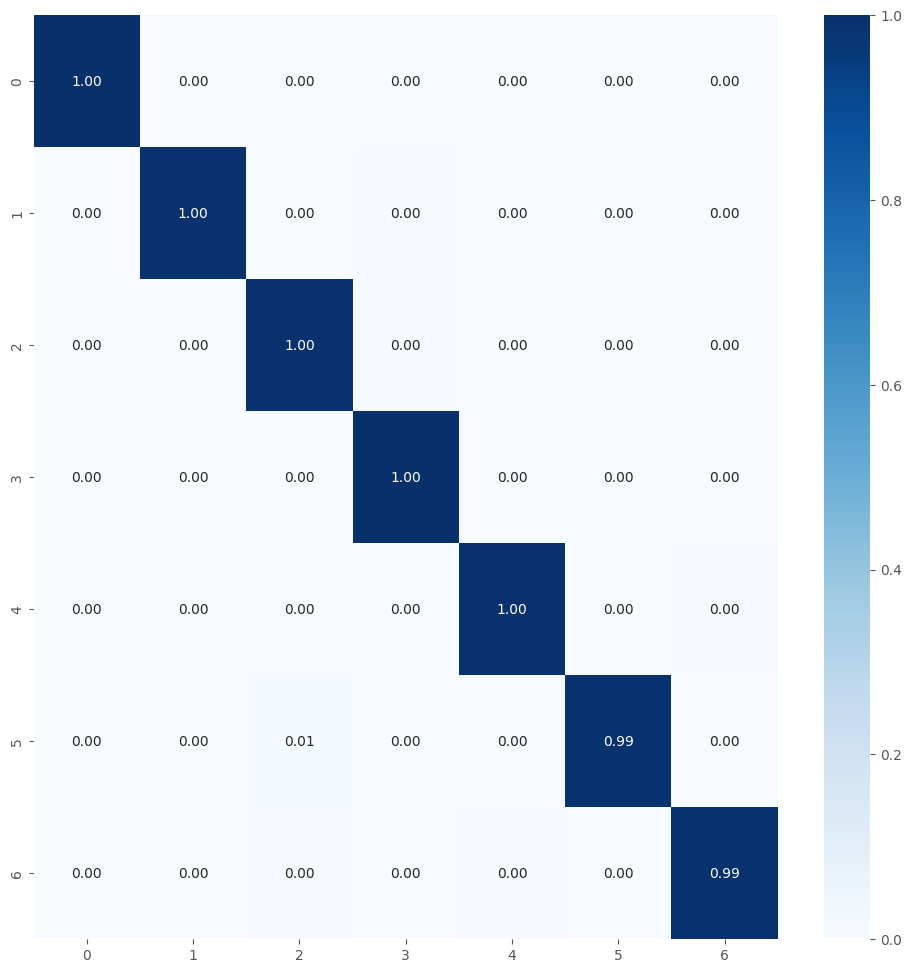


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15007_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_relu
- global_average_pooling2d_25
- dense_75
- batch_normalization_25
- dropout_50
- dense_76
- dropout_51
- dense_77
Total: 11/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
229/229 [==============================] - 20s 74ms/step - loss: 0.0479 - accuracy: 0.9906 - val_loss: 0.0920 - val_accuracy: 0.9783 - lr: 1.7678e-04
Epoch 2/50
229/229 [==============================] - 17s 74ms/step - loss: 0.0333 - accuracy: 0.9952 - val_loss: 0.1220 - val_accuracy: 0.9796 - lr: 1.7678e-04
Epoch 3/50
229/229 [==============================] - 17s 74ms/step - loss: 0.0270 - accuracy: 0.9962 - val_loss: 0.0463 - val_accuracy: 0.9949 - lr: 1.7678e-04
Epoch 4/50
229/229 [==============================] -

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15007_2.pkl
230/230 [==============================] - 14s 59ms/step - loss: 0.0261 - accuracy: 0.9988
Train Accuracy: 0.9987754821777344
Train Log Loss: 0.02613862045109272
50/50 [==============================] - 3s 58ms/step - loss: 0.0582 - accuracy: 0.9949
Validation Accuracy: 0.9949206113815308
Validation Log Loss: 0.05824318155646324
50/50 [==============================] - 3s 59ms/step - loss: 0.0613 - accuracy: 0.9949
Test Accuracy: 0.9949206113815308
Test Log Loss: 0.06130664050579071
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'mira': 3, 'sfone': 4, 'sillyp2p': 5, 'wabot': 6}

Matriz de Confusión:
[[225   0   0   0   0   0   0]
 [  0 224   0   1   0   0   0]
 [  0   0 225   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 224   0   1]
 [  0   0   2   0   0 223   0]
 [  0   0   1   0   3   0 221]]
True labels: 1575
Predicted labels: len(predicted_labels)

Classification r

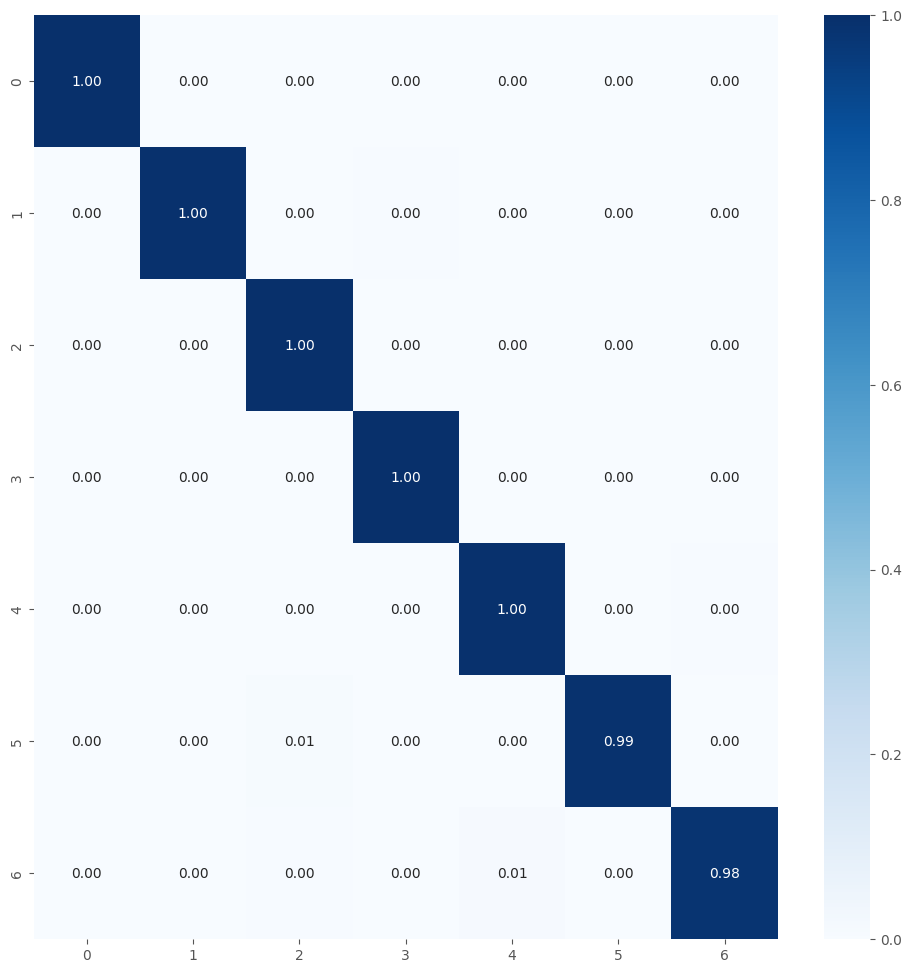


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15007_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_relu
- global_average_pooling2d_25
- dense_75
- batch_normalization_25
- dropout_50
- dense_76
- dropout_51
- dense_77
Total: 11/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
229/229 [==============================] - 20s 75ms/step - loss: 0.0353 - accuracy: 0.9939 - val_loss: 0.1323 - val_accuracy: 0.9719 - lr: 1.7678e-04
Epoch 2/50
229/229 [==============================] - 17s 73ms/step - loss: 0.0423 - accuracy: 0.9917 - val_loss: 0.1066 - val_accuracy: 0.9707 - lr: 1.7678e-04
Epoch 3/50
229/229 [==============================] - 17s 72ms/step - loss: 0.0359 - accuracy: 0.9954 - val_loss: 0.0629 - val_accuracy: 0.9898 - lr: 1.7678e-04
Epoch 4/50
229/229 [==============================] -

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15007_3.pkl
230/230 [==============================] - 14s 60ms/step - loss: 0.0225 - accuracy: 0.9990
Train Accuracy: 0.9990476369857788
Train Log Loss: 0.022511284798383713
50/50 [==============================] - 3s 59ms/step - loss: 0.0623 - accuracy: 0.9949
Validation Accuracy: 0.9949206113815308
Validation Log Loss: 0.062261343002319336
50/50 [==============================] - 3s 60ms/step - loss: 0.0562 - accuracy: 0.9943
Test Accuracy: 0.9942857027053833
Test Log Loss: 0.056205447763204575
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'mira': 3, 'sfone': 4, 'sillyp2p': 5, 'wabot': 6}

Matriz de Confusión:
[[225   0   0   0   0   0   0]
 [  0 224   0   0   0   0   1]
 [  0   0 224   0   1   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 222   0   3]
 [  0   0   2   0   0 223   0]
 [  0   0   1   0   1   0 223]]
True labels: 1575
Predicted labels: len(predicted_labels)

Classificatio

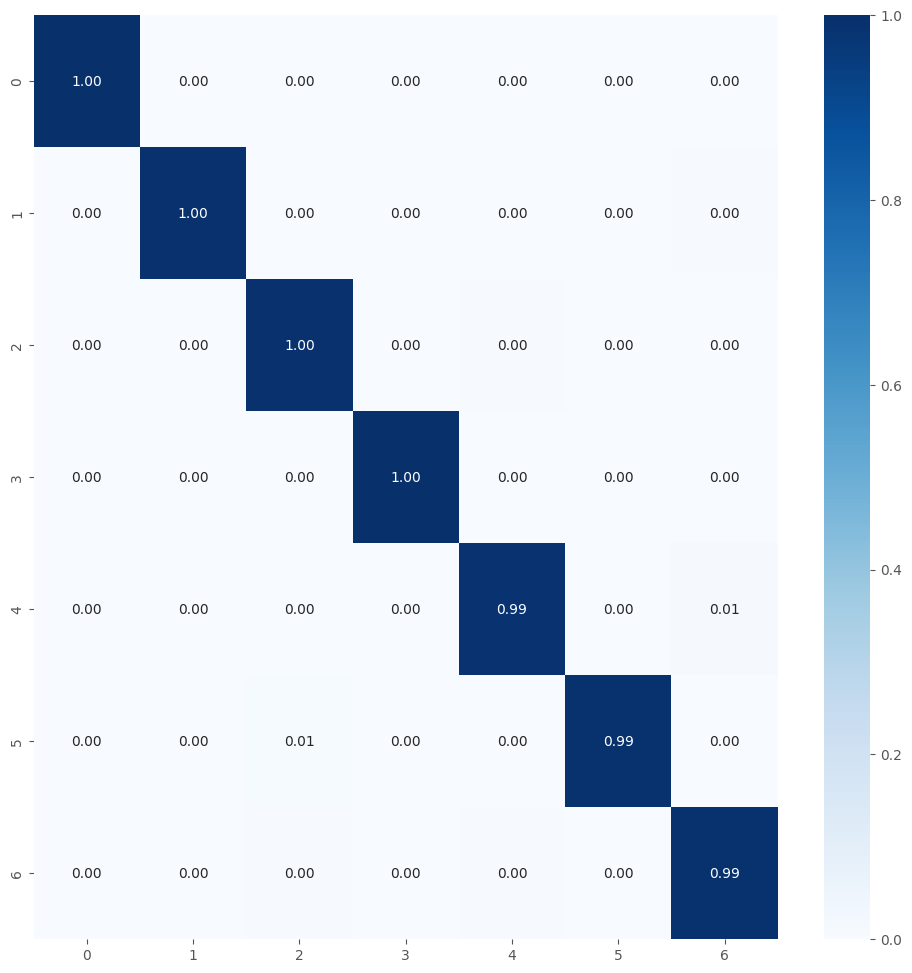


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15007_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_relu
- global_average_pooling2d_25
- dense_75
- batch_normalization_25
- dropout_50
- dense_76
- dropout_51
- dense_77
Total: 11/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
229/229 [==============================] - 20s 76ms/step - loss: 0.0468 - accuracy: 0.9874 - val_loss: 0.0487 - val_accuracy: 0.9936 - lr: 1.7678e-04
Epoch 2/50
229/229 [==============================] - 17s 73ms/step - loss: 0.0243 - accuracy: 0.9973 - val_loss: 0.1115 - val_accuracy: 0.9764 - lr: 1.7678e-04
Epoch 3/50
229/229 [==============================] - 17s 73ms/step - loss: 0.0366 - accuracy: 0.9941 - val_loss: 0.0772 - val_accuracy: 0.9885 - lr: 1.7678e-04
Epoch 4/50
229/229 [==============================] -

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15007_4.pkl
230/230 [==============================] - 14s 60ms/step - loss: 0.0181 - accuracy: 0.9990
Train Accuracy: 0.9990476369857788
Train Log Loss: 0.01813441328704357
50/50 [==============================] - 3s 58ms/step - loss: 0.0565 - accuracy: 0.9949
Validation Accuracy: 0.9949206113815308
Validation Log Loss: 0.05647170916199684
50/50 [==============================] - 3s 60ms/step - loss: 0.0502 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.050189610570669174
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'mira': 3, 'sfone': 4, 'sillyp2p': 5, 'wabot': 6}

Matriz de Confusión:
[[225   0   0   0   0   0   0]
 [  0 224   0   1   0   0   0]
 [  0   0 225   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 224   0   1]
 [  0   0   2   0   0 223   0]
 [  0   0   1   0   2   0 222]]
True labels: 1575
Predicted labels: len(predicted_labels)

Classification r

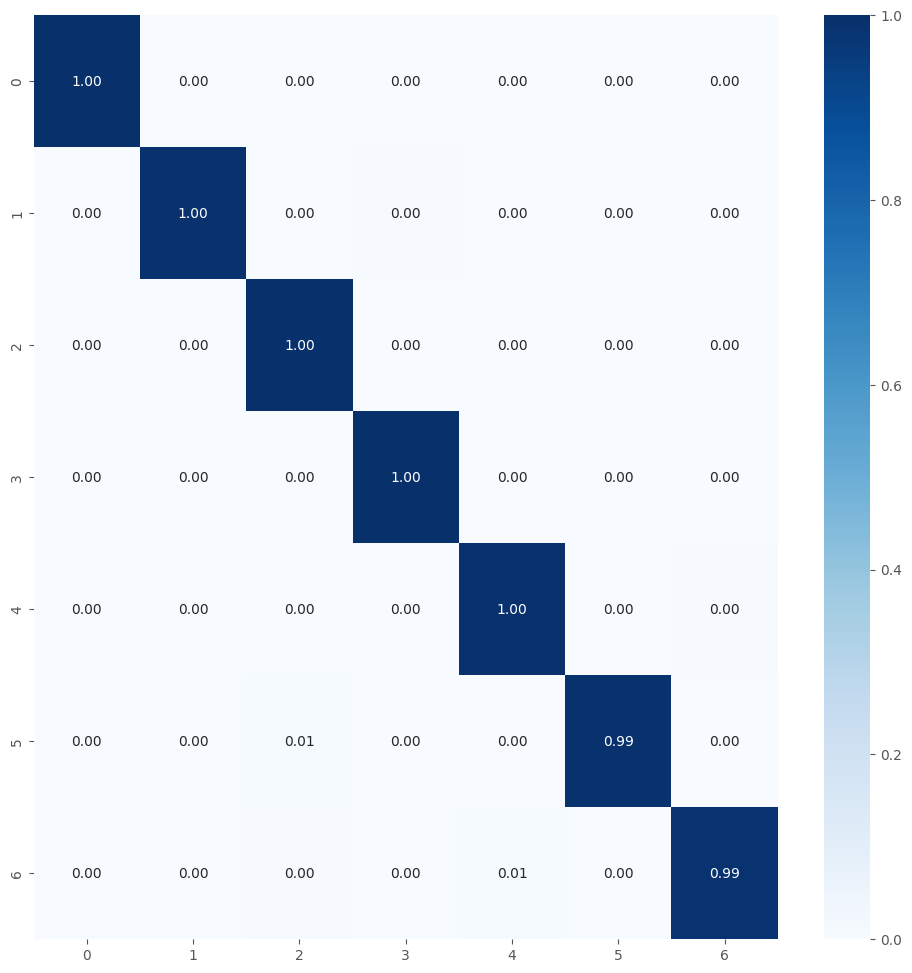


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15007_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_relu
- global_average_pooling2d_25
- dense_75
- batch_normalization_25
- dropout_50
- dense_76
- dropout_51
- dense_77
Total: 11/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
229/229 [==============================] - 22s 83ms/step - loss: 0.0309 - accuracy: 0.9959 - val_loss: 0.0615 - val_accuracy: 0.9892 - lr: 1.7678e-04
Epoch 2/50
229/229 [==============================] - 17s 73ms/step - loss: 0.0330 - accuracy: 0.9951 - val_loss: 0.0739 - val_accuracy: 0.9872 - lr: 1.7678e-04
Epoch 3/50
229/229 [==============================] - 17s 73ms/step - loss: 0.0337 - accuracy: 0.9955 - val_loss: 0.2902 - val_accuracy: 0.9037 - lr: 1.7678e-04
Epoch 4/50
229/229 [==============================] -

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15007_5.pkl
230/230 [==============================] - 14s 59ms/step - loss: 0.0243 - accuracy: 0.9986
Train Accuracy: 0.9986394643783569
Train Log Loss: 0.0242617167532444
50/50 [==============================] - 3s 60ms/step - loss: 0.0585 - accuracy: 0.9949
Validation Accuracy: 0.9949206113815308
Validation Log Loss: 0.05846196413040161
50/50 [==============================] - 3s 60ms/step - loss: 0.0663 - accuracy: 0.9917
Test Accuracy: 0.9917460083961487
Test Log Loss: 0.06625479459762573
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'mira': 3, 'sfone': 4, 'sillyp2p': 5, 'wabot': 6}

Matriz de Confusión:
[[224   0   0   1   0   0   0]
 [  0 224   0   1   0   0   0]
 [  0   0 224   1   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 224   0   1]
 [  0   0   2   0   0 223   0]
 [  0   0   2   0   5   0 218]]
True labels: 1575
Predicted labels: len(predicted_labels)

Classification re

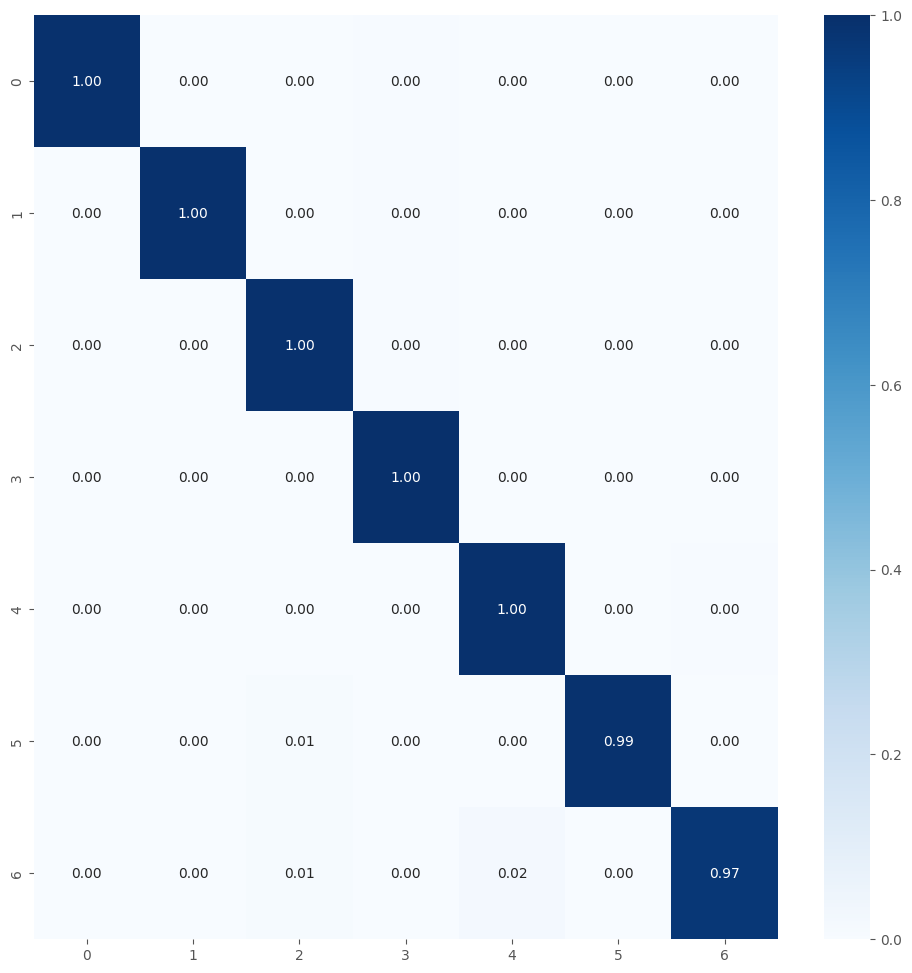


Best fold was 2 with val_accuracy: 0.9955
Average training accuracy in 5-fold: 0.9996173739433288
Average validation precision in 5-fold: 0.9950255155563354

Test Metrics
test_acc_list: [0.995555579662323, 0.9949206113815308, 0.9942857027053833, 0.995555579662323, 0.9917460083961487]
Average Test Accuracy with 5-fold: 0.9944126963615417
test_loss_list: [0.049561165273189545, 0.06130664050579071, 0.056205447763204575, 0.050189610570669174, 0.06625479459762573]
Average Test Log Loss with 5-fold: 0.05670353174209595

Precision List: [0.9955806911604583, 0.9949567089952506, 0.994319203452306, 0.9955833520067481, 0.991842567776143]
Average Precision List with 5-fold: 0.9944565046781811
Recall List: [0.9955555555555556, 0.994920634920635, 0.9942857142857144, 0.9955555555555556, 0.9917460317460317]
Average Recall List with 5-fold: 0.9944126984126985
F1 Score List: [0.9955583210841806, 0.9949190702126073, 0.9942926845038821, 0.9955554678868229, 0.9917410643003342]
Average F1 Score List with 5

In [27]:
%%time

num_classes = 7
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

Familias de malware copiadas
source2: /notebooks/train3/all_malware/8
name_save_model: MobileNet_tf_15008
Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15008_best.h5
Loading pre-trained model...
Model loaded successfully.

Calculating layer importance (once for all folds)...

Calculando importancia con 8400 muestras (100% confianza, ±0% error)
Incluyendo 93 capas (base + personalizadas)


100%|██████████| 8400/8400 [17:57<00:00,  7.80it/s]
[I 2025-07-16 09:37:05,407] A new study created in memory with name: malware_classification_8classes



Resultados de importancia de capas (incluyendo personalizadas):
----------------------------------------------------------------------
Pos.  | Nombre de Capa                           | Importancia    
----------------------------------------------------------------------
1     | conv_pw_1                                | 0.0004702
2     | conv_pw_3                                | 0.0004166
3     | conv_dw_1                                | 0.0003752
4     | conv_dw_1_bn                             | 0.0002995
5     | conv_dw_2_bn                             | 0.0002340
6     | conv_pw_2                                | 0.0002333
7     | conv_pw_3_bn                             | 0.0002112
8     | conv_dw_3_bn                             | 0.0001984
9     | conv_dw_4_bn                             | 0.0001929
10    | conv_pw_1_bn                             | 0.0001795
11    | conv_pw_4                                | 0.0001777
12    | conv1_bn                                 | 0.00

[I 2025-07-16 09:42:52,088] Trial 0 finished with values: [0.99609375, 0.03457113727927208] and parameters: {'learning_rate': 0.00042986601701045695, 'dropout_rate1': 0.40632840735366316, 'dropout_rate2': 0.3170880838239867, 'l2_reg': 0.0006178897435456639, 'units_dense1': 512, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 11, 'early_stopping_patience': 12, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 1.0845955372006083e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15008_best.h5
Successfully loaded and modified pretrained model
Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.


[I 2025-07-16 09:56:24,459] Trial 1 finished with values: [0.9949776530265808, 0.030188921838998795] and parameters: {'learning_rate': 3.5453937885266806e-05, 'dropout_rate1': 0.3033369756489043, 'dropout_rate2': 0.28534897949482807, 'l2_reg': 0.0007084779626328738, 'units_dense1': 512, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 7, 'early_stopping_patience': 11, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 4.326423243669148e-06, 'units_dense3': 128, 'dropout_rate3': 0.25887938899078466}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15008_best.h5
Successfully loaded and modified pretrained model
Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.


[I 2025-07-16 10:12:06,712] Trial 2 finished with values: [0.9955357313156128, 0.029638567939400673] and parameters: {'learning_rate': 0.0065364760192185185, 'dropout_rate1': 0.39318703137990296, 'dropout_rate2': 0.14546588622398826, 'l2_reg': 1.210216888444933e-05, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 8, 'early_stopping_patience': 20, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 3.374859566823628e-06, 'units_dense3': 128, 'dropout_rate3': 0.3726270217347635}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15008_best.h5
Successfully loaded and modified pretrained model
Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.


[I 2025-07-16 10:27:48,642] Trial 3 finished with values: [0.9949776530265808, 0.037189748138189316] and parameters: {'learning_rate': 1.800168460099097e-05, 'dropout_rate1': 0.4445411893008743, 'dropout_rate2': 0.28898911196273375, 'l2_reg': 0.00018261978969810904, 'units_dense1': 1024, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 15, 'early_stopping_patience': 17, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 6.351796316103089e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15008_best.h5
Successfully loaded and modified pretrained model
Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.


[I 2025-07-16 10:35:59,507] Trial 4 finished with values: [0.99609375, 0.030815893784165382] and parameters: {'learning_rate': 0.008257595694663653, 'dropout_rate1': 0.44607049756018524, 'dropout_rate2': 0.10336782472399642, 'l2_reg': 0.00010713279989979032, 'units_dense1': 512, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 14, 'early_stopping_patience': 11, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 8.258860890331624e-06, 'units_dense3': 128, 'dropout_rate3': 0.3182870235874514}.


Mejores trials para cada objetivo:
  Trial 2:
    val_accuracy: 0.9955
    val_loss: 0.0296
    Parámetros: {'learning_rate': 0.0065364760192185185, 'dropout_rate1': 0.39318703137990296, 'dropout_rate2': 0.14546588622398826, 'l2_reg': 1.210216888444933e-05, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 8, 'early_stopping_patience': 20, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 3.374859566823628e-06, 'units_dense3': 128, 'dropout_rate3': 0.3726270217347635}
  Trial 4:
    val_accuracy: 0.9961
    val_loss: 0.0308
    Parámetros: {'learning_rate': 0.008257595694663653, 'dropout_rate1': 0.44607049756018524, 'dropout_rate2': 0.10336782472399642, 'l2_reg': 0.00010713279989979032, 'units_dense1': 512, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 14, 'early_stopping_patience': 11, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 8.258860890331624e-06, 'units_dense3': 128, 'dropout_rate3': 0.3182870235874514}


/tmp/ipykernel_29/980747374.py:135: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

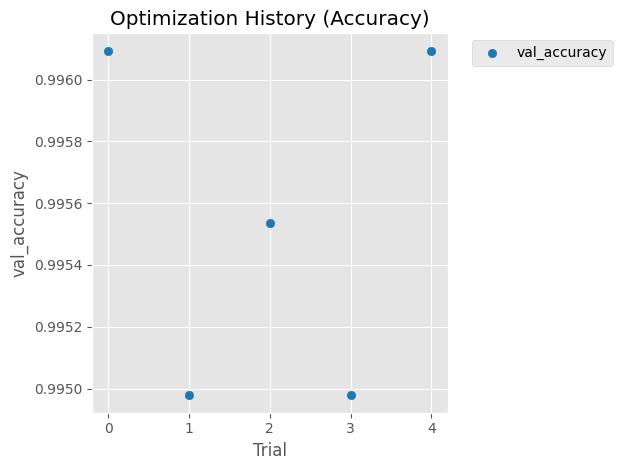

/tmp/ipykernel_29/980747374.py:146: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

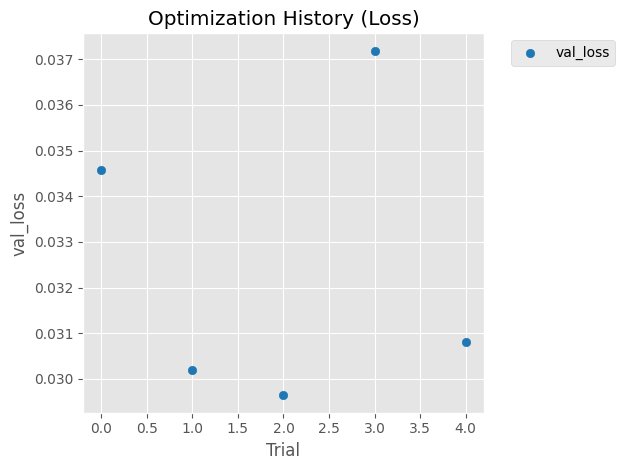

/tmp/ipykernel_29/980747374.py:184: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

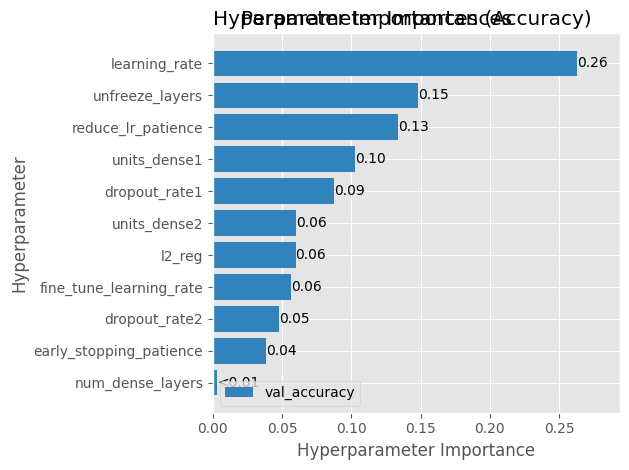


TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15008_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_relu
- global_average_pooling2d_30
- dense_90
- batch_normalization_30
- dropout_60
- dense_91
- dropout_61
- dense_92
Total: 11/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
262/262 [==============================] - 23s 75ms/step - loss: 0.1284 - accuracy: 0.9657 - val_loss: 0.4536 - val_accuracy: 0.8650 - lr: 6.5365e-04
Epoch 2/50
262/262 [==============================] - 19s 74ms/step - loss: 0.1361 - accuracy: 0.9724 - val_loss: 0.0990 - val_accuracy: 0.9916 - lr: 6.5365e-04
Epoch 3/50
262/262 [==============================] - 19s 73ms/step - loss: 0.1024 - accuracy: 0.9853 - val_loss: 0.2170 - val_accuracy: 0.9347 - lr: 6.5365e-04
Epoch 4/50
262/262 [==============================] -

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15008_1.pkl
263/263 [==============================] - 16s 60ms/step - loss: 0.0089 - accuracy: 0.9998
Train Accuracy: 0.9997618794441223
Train Log Loss: 0.008894995786249638
57/57 [==============================] - 3s 59ms/step - loss: 0.0464 - accuracy: 0.9950
Validation Accuracy: 0.9950000047683716
Validation Log Loss: 0.04642469435930252
57/57 [==============================] - 3s 59ms/step - loss: 0.0314 - accuracy: 0.9967
Test Accuracy: 0.996666669845581
Test Log Loss: 0.03143801912665367
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   1   0   0   0]
 [  0   0 225   0   0   0   0   0]
 [  0   0   0 225   0   0   0   0]
 [  0   0   0   0 225   0   0   0]
 [  0   0   0   0   0 224   0   1]
 [  0   0   2   0   0   0 223   0]
 [  0   0   1   0   0   1   0 223]]

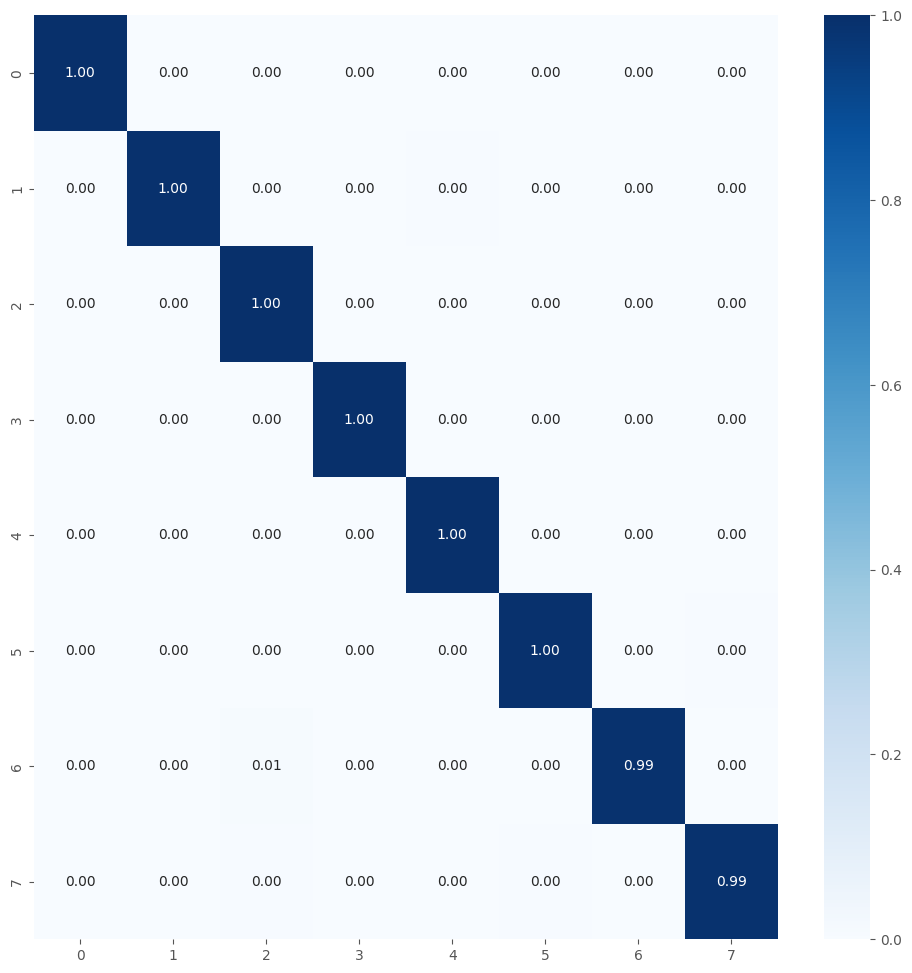


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15008_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_relu
- global_average_pooling2d_30
- dense_90
- batch_normalization_30
- dropout_60
- dense_91
- dropout_61
- dense_92
Total: 11/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
262/262 [==============================] - 23s 75ms/step - loss: 0.1093 - accuracy: 0.9745 - val_loss: 0.4663 - val_accuracy: 0.8811 - lr: 6.5365e-04
Epoch 2/50
262/262 [==============================] - 19s 73ms/step - loss: 0.1160 - accuracy: 0.9777 - val_loss: 0.5505 - val_accuracy: 0.9029 - lr: 6.5365e-04
Epoch 3/50
262/262 [==============================] - 19s 74ms/step - loss: 0.1155 - accuracy: 0.9816 - val_loss: 0.2668 - val_accuracy: 0.9347 - lr: 6.5365e-04
Epoch 4/50
262/262 [==============================] -

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15008_2.pkl
263/263 [==============================] - 16s 59ms/step - loss: 0.0641 - accuracy: 0.9976
Train Accuracy: 0.9976190328598022
Train Log Loss: 0.06410090625286102
57/57 [==============================] - 4s 61ms/step - loss: 0.0930 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.09303191304206848
57/57 [==============================] - 3s 59ms/step - loss: 0.0914 - accuracy: 0.9928
Test Accuracy: 0.9927777647972107
Test Log Loss: 0.09141818434000015
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   1   0   0   0]
 [  0   0 223   0   0   0   0   2]
 [  0   0   1 223   0   0   0   1]
 [  0   0   0   0 224   0   0   1]
 [  0   0   0   0   0 223   0   2]
 [  0   0   2   0   0   0 223   0]
 [  0   0   1   0   0   2   0 222]]


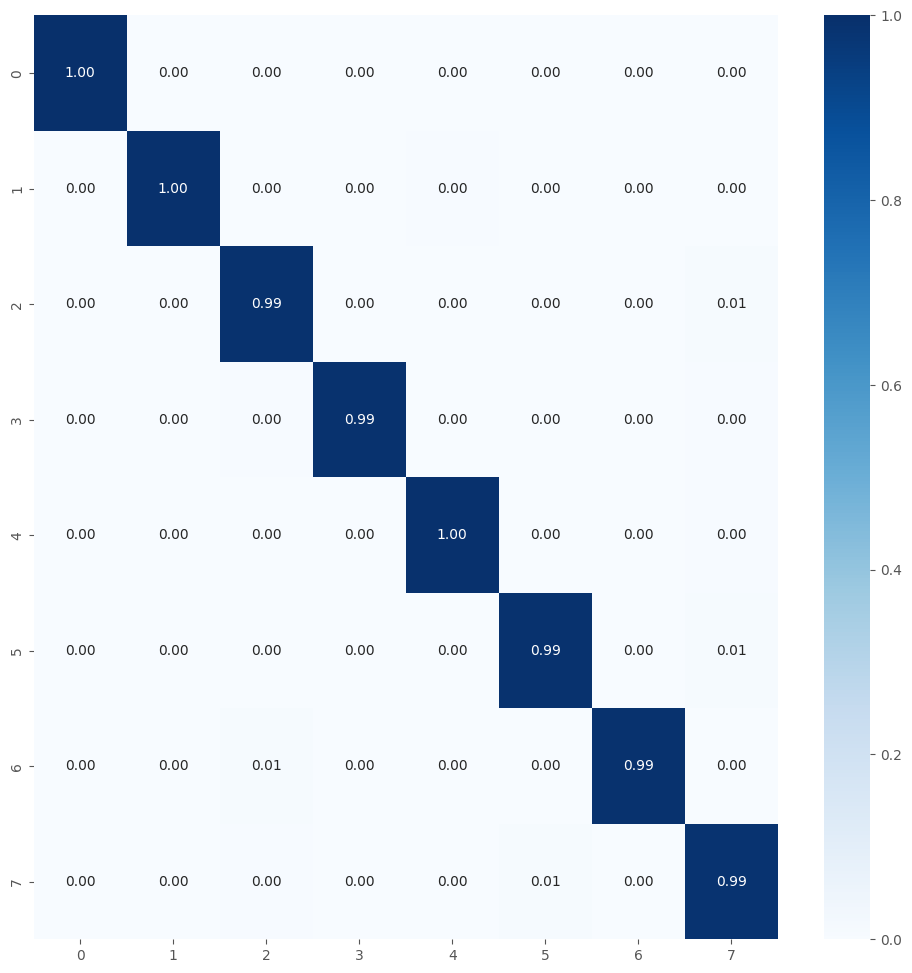


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15008_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_relu
- global_average_pooling2d_30
- dense_90
- batch_normalization_30
- dropout_60
- dense_91
- dropout_61
- dense_92
Total: 11/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
262/262 [==============================] - 23s 74ms/step - loss: 0.1376 - accuracy: 0.9621 - val_loss: 0.1434 - val_accuracy: 0.9621 - lr: 6.5365e-04
Epoch 2/50
262/262 [==============================] - 19s 72ms/step - loss: 0.0693 - accuracy: 0.9903 - val_loss: 0.0776 - val_accuracy: 0.9905 - lr: 6.5365e-04
Epoch 3/50
262/262 [==============================] - 19s 73ms/step - loss: 0.0711 - accuracy: 0.9904 - val_loss: 0.1306 - val_accuracy: 0.9693 - lr: 6.5365e-04
Epoch 4/50
262/262 [==============================] -

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15008_3.pkl
263/263 [==============================] - 16s 59ms/step - loss: 0.0671 - accuracy: 0.9983
Train Accuracy: 0.9983333349227905
Train Log Loss: 0.0671461820602417
57/57 [==============================] - 4s 60ms/step - loss: 0.0970 - accuracy: 0.9944
Validation Accuracy: 0.9944444298744202
Validation Log Loss: 0.09698653966188431
57/57 [==============================] - 4s 60ms/step - loss: 0.0889 - accuracy: 0.9939
Test Accuracy: 0.9938889145851135
Test Log Loss: 0.0889136865735054
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   1   0   0   0]
 [  0   0 225   0   0   0   0   0]
 [  0   0   0 225   0   0   0   0]
 [  0   0   0   0 225   0   0   0]
 [  0   0   0   0   0 224   0   1]
 [  0   0   2   0   0   0 223   0]
 [  0   0   1   0   0   6   0 218]]
T

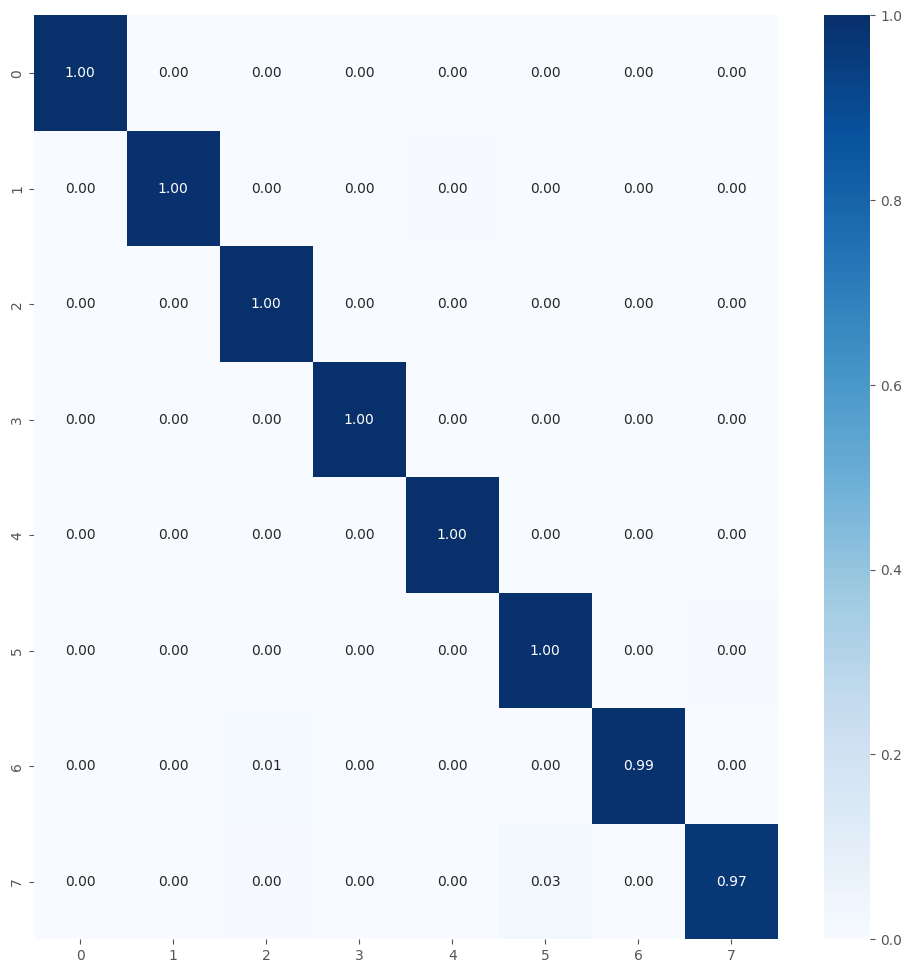


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15008_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_relu
- global_average_pooling2d_30
- dense_90
- batch_normalization_30
- dropout_60
- dense_91
- dropout_61
- dense_92
Total: 11/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
262/262 [==============================] - 23s 76ms/step - loss: 0.1066 - accuracy: 0.9760 - val_loss: 0.1114 - val_accuracy: 0.9810 - lr: 6.5365e-04
Epoch 2/50
262/262 [==============================] - 19s 73ms/step - loss: 0.0928 - accuracy: 0.9853 - val_loss: 0.2131 - val_accuracy: 0.9626 - lr: 6.5365e-04
Epoch 3/50
262/262 [==============================] - 19s 72ms/step - loss: 0.1300 - accuracy: 0.9779 - val_loss: 0.1429 - val_accuracy: 0.9816 - lr: 6.5365e-04
Epoch 4/50
262/262 [==============================] -

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15008_4.pkl
263/263 [==============================] - 16s 59ms/step - loss: 0.0554 - accuracy: 0.9992
Train Accuracy: 0.9991666674613953
Train Log Loss: 0.05536479130387306
57/57 [==============================] - 4s 60ms/step - loss: 0.0823 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.08226441591978073
57/57 [==============================] - 4s 59ms/step - loss: 0.0804 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.08043603599071503
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   1   0   0   0]
 [  0   0 225   0   0   0   0   0]
 [  0   0   0 225   0   0   0   0]
 [  0   0   0   0 225   0   0   0]
 [  0   0   0   0   0 224   0   1]
 [  0   0   2   0   0   0 223   0]
 [  0   0   1   0   0   3   0 221]]
T

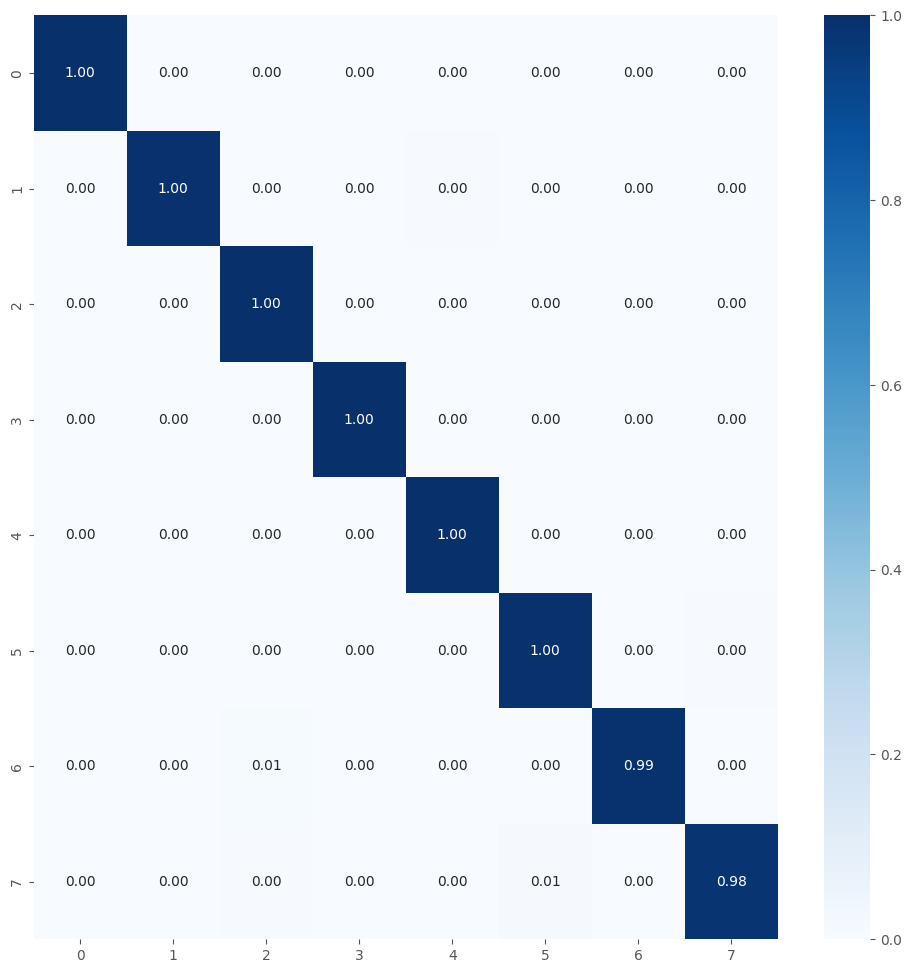


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15008_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_relu
- global_average_pooling2d_30
- dense_90
- batch_normalization_30
- dropout_60
- dense_91
- dropout_61
- dense_92
Total: 11/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
262/262 [==============================] - 23s 76ms/step - loss: 0.1292 - accuracy: 0.9647 - val_loss: 0.1522 - val_accuracy: 0.9643 - lr: 6.5365e-04
Epoch 2/50
262/262 [==============================] - 20s 75ms/step - loss: 0.0808 - accuracy: 0.9858 - val_loss: 0.1292 - val_accuracy: 0.9693 - lr: 6.5365e-04
Epoch 3/50
262/262 [==============================] - 19s 74ms/step - loss: 0.0857 - accuracy: 0.9884 - val_loss: 0.0904 - val_accuracy: 0.9927 - lr: 6.5365e-04
Epoch 4/50
262/262 [==============================] -

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15008_5.pkl
263/263 [==============================] - 16s 60ms/step - loss: 0.0602 - accuracy: 0.9988
Train Accuracy: 0.9988095164299011
Train Log Loss: 0.06018650531768799
57/57 [==============================] - 4s 61ms/step - loss: 0.0837 - accuracy: 0.9961
Validation Accuracy: 0.9961110949516296
Validation Log Loss: 0.08370809257030487
57/57 [==============================] - 4s 62ms/step - loss: 0.0866 - accuracy: 0.9967
Test Accuracy: 0.996666669845581
Test Log Loss: 0.08664710074663162
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   1   0   0   0]
 [  0   0 225   0   0   0   0   0]
 [  0   0   0 225   0   0   0   0]
 [  0   0   0   0 225   0   0   0]
 [  0   0   0   0   0 224   0   1]
 [  0   0   2   0   0   0 223   0]
 [  0   0   1   0   0   1   0 223]]


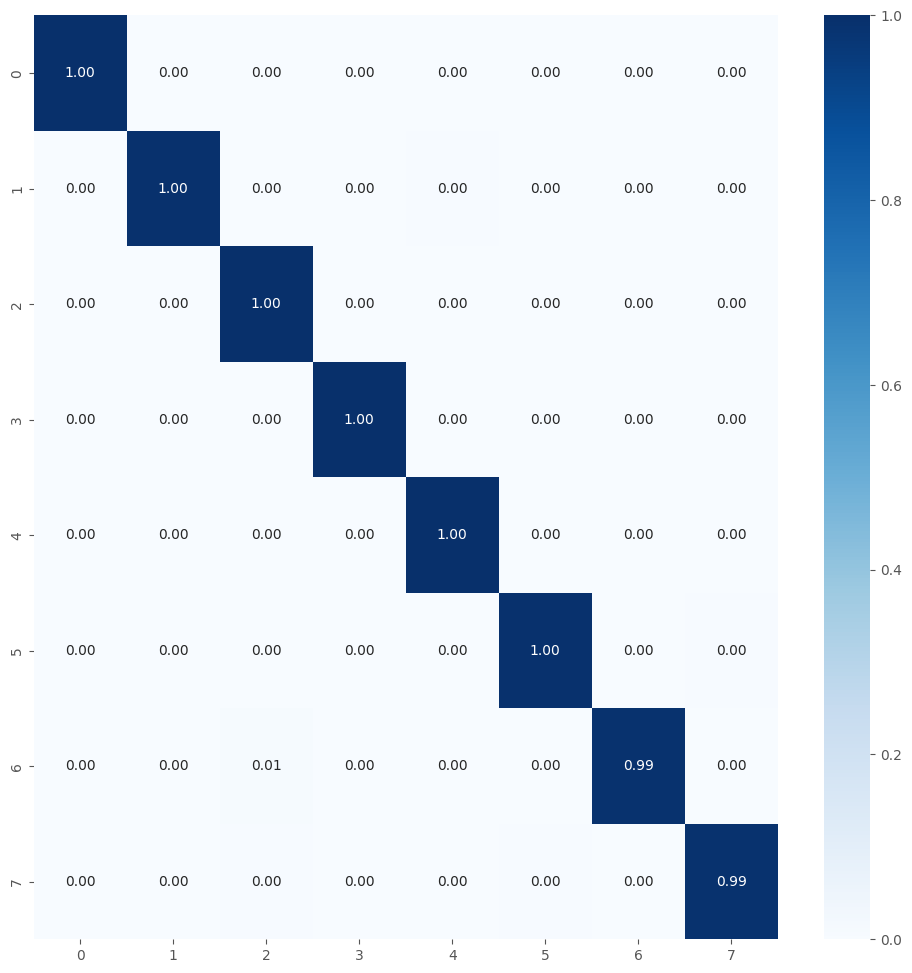


Best fold was 2 with val_accuracy: 0.9961
Average training accuracy in 5-fold: 0.9991159081459046
Average validation precision in 5-fold: 0.9955357193946839

Test Metrics
test_acc_list: [0.996666669845581, 0.9927777647972107, 0.9938889145851135, 0.995555579662323, 0.996666669845581]
Average Test Accuracy with 5-fold: 0.9951111197471618
test_loss_list: [0.03143801912665367, 0.09141818434000015, 0.0889136865735054, 0.08043603599071503, 0.08664710074663162]
Average Test Log Loss with 5-fold: 0.07577060535550117

Precision List: [0.9966885745429208, 0.9928412164773166, 0.9939705199918368, 0.9955871203708444, 0.9966885745429208]
Average Precision List with 5-fold: 0.9951552011851679
Recall List: [0.9966666666666667, 0.9927777777777778, 0.9938888888888889, 0.9955555555555555, 0.9966666666666667]
Average Recall List with 5-fold: 0.9951111111111113
F1 Score List: [0.9966678465519921, 0.9927961297242288, 0.9938832622417954, 0.9955541864360313, 0.9966678465519921]
Average F1 Score List with 5-f

In [28]:
%%time

num_classes = 8
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

Familias de malware copiadas
source2: /notebooks/train3/all_malware/9
name_save_model: MobileNet_tf_15009
Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
- Allaple.L
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15009_best.h5
Loading pre-trained model...
Model loaded successfully.

Calculating layer importance (once for all folds)...

Calculando importancia con 9450 muestras (100% confianza, ±0% error)
Incluyendo 93 capas (base + personalizadas)


100%|██████████| 9450/9450 [20:02<00:00,  7.86it/s]
[I 2025-07-16 12:04:29,371] A new study created in memory with name: malware_classification_9classes



Resultados de importancia de capas (incluyendo personalizadas):
----------------------------------------------------------------------
Pos.  | Nombre de Capa                           | Importancia    
----------------------------------------------------------------------
1     | conv_pw_1                                | 0.0008404
2     | conv_dw_1                                | 0.0007927
3     | conv_pw_3                                | 0.0007436
4     | conv_dw_1_bn                             | 0.0006340
5     | conv_pw_2                                | 0.0003988
6     | conv_dw_2_bn                             | 0.0003907
7     | conv_pw_3_bn                             | 0.0003873
8     | conv_dw_4_bn                             | 0.0003580
9     | conv_dw_3_bn                             | 0.0003479
10    | conv1_bn                                 | 0.0003380
11    | conv_pw_4                                | 0.0003310
12    | conv_pw_1_bn                             | 0.00

[I 2025-07-16 12:22:08,671] Trial 0 finished with values: [0.9965277910232544, 0.02898748405277729] and parameters: {'learning_rate': 2.7217573991707897e-05, 'dropout_rate1': 0.5464247983767629, 'dropout_rate2': 0.444432555648276, 'l2_reg': 0.00045139429381650995, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 14, 'early_stopping_patience': 20, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 3.831969497595012e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15009_best.h5
Successfully loaded and modified pretrained model
Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.


[I 2025-07-16 12:31:21,640] Trial 1 finished with values: [0.9965277910232544, 0.02624567039310932] and parameters: {'learning_rate': 0.008192574550126088, 'dropout_rate1': 0.44178108621131684, 'dropout_rate2': 0.47413305218766433, 'l2_reg': 0.0017647126607443038, 'units_dense1': 512, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 19, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 2.1837494418685735e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15009_best.h5
Successfully loaded and modified pretrained model
Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.


[I 2025-07-16 12:36:58,856] Trial 2 finished with values: [0.9960317611694336, 0.03362812101840973] and parameters: {'learning_rate': 0.0001261515748310974, 'dropout_rate1': 0.277748568017556, 'dropout_rate2': 0.2434787037095787, 'l2_reg': 0.003980875697269579, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 10, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 8.891935089810152e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15009_best.h5
Successfully loaded and modified pretrained model
Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.


[I 2025-07-16 12:47:56,786] Trial 3 finished with values: [0.9965277910232544, 0.031588952988386154] and parameters: {'learning_rate': 0.0003863802229803717, 'dropout_rate1': 0.48182929041856376, 'dropout_rate2': 0.44020858324928025, 'l2_reg': 0.0001535066010011815, 'units_dense1': 1024, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 9, 'early_stopping_patience': 15, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 7.234922509659588e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15009_best.h5
Successfully loaded and modified pretrained model
Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.


[I 2025-07-16 12:55:24,240] Trial 4 finished with values: [0.9960317611694336, 0.03293519839644432] and parameters: {'learning_rate': 2.8898873492270776e-05, 'dropout_rate1': 0.5811591035482586, 'dropout_rate2': 0.4001908860163841, 'l2_reg': 0.001442553391679043, 'units_dense1': 512, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 7, 'early_stopping_patience': 20, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 2.876208457640934e-05, 'units_dense3': 128, 'dropout_rate3': 0.28266127940045654}.


Mejores trials para cada objetivo:
  Trial 1:
    val_accuracy: 0.9965
    val_loss: 0.0262
    Parámetros: {'learning_rate': 0.008192574550126088, 'dropout_rate1': 0.44178108621131684, 'dropout_rate2': 0.47413305218766433, 'l2_reg': 0.0017647126607443038, 'units_dense1': 512, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 19, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 2.1837494418685735e-06}


/tmp/ipykernel_29/980747374.py:135: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

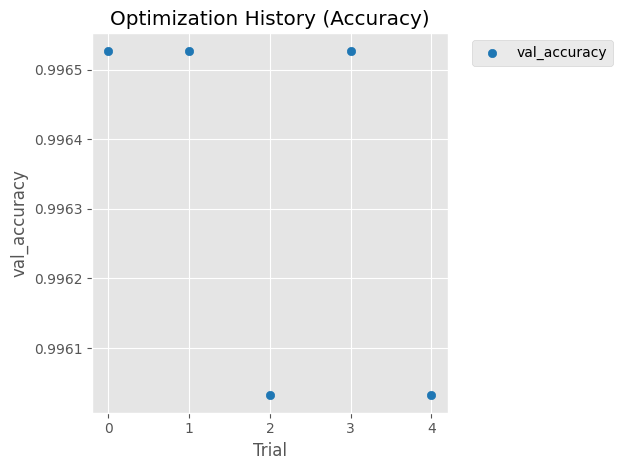

/tmp/ipykernel_29/980747374.py:146: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

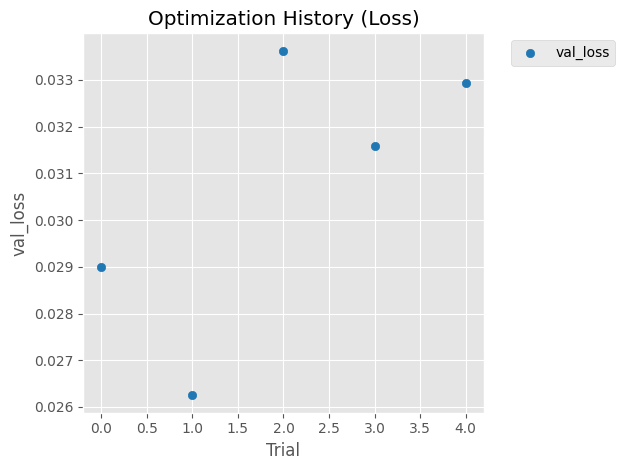

/tmp/ipykernel_29/980747374.py:184: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

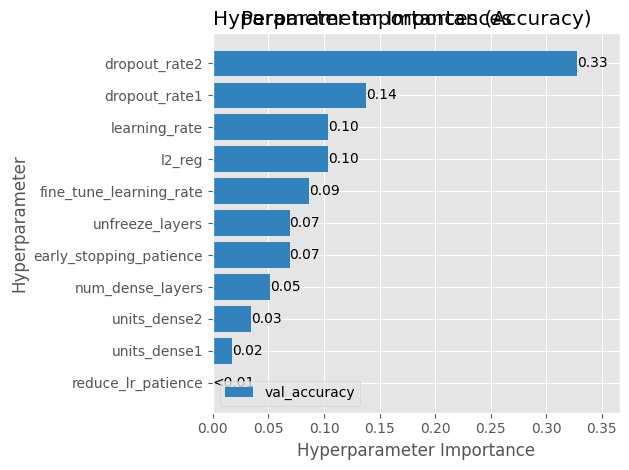


TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15009_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- dense_114
- batch_normalization_38
- dropout_76
- dense_115
- dropout_77
- dense_116
Total: 9/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
295/295 [==============================] - 25s 74ms/step - loss: 0.1613 - accuracy: 0.9582 - val_loss: 0.1426 - val_accuracy: 0.9772 - lr: 8.1926e-04
Epoch 2/50
295/295 [==============================] - 21s 72ms/step - loss: 0.1166 - accuracy: 0.9813 - val_loss: 0.1299 - val_accuracy: 0.9812 - lr: 8.1926e-04
Epoch 3/50
295/295 [==============================] - 21s 73ms/step - loss: 0.1591 - accuracy: 0.9737 - val_loss: 0.2869 - val_accuracy: 0.9097 - lr: 8.1926e-04
Epoch 4/50
295/295 [==============================] - 22s 74ms/step - loss: 0.1250 - accuracy: 0.98

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15009_1.pkl
296/296 [==============================] - 17s 59ms/step - loss: 0.0604 - accuracy: 0.9982
Train Accuracy: 0.9982010722160339
Train Log Loss: 0.06041371449828148
64/64 [==============================] - 4s 61ms/step - loss: 0.0874 - accuracy: 0.9951
Validation Accuracy: 0.9950617551803589
Validation Log Loss: 0.08738692849874496
64/64 [==============================] - 4s 59ms/step - loss: 0.0831 - accuracy: 0.9960
Test Accuracy: 0.9960494041442871
Test Log Loss: 0.08305120468139648
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0]
 [  0   0 224   0   0   1   0   0   0]
 [  0   0   0 225   0   0   0   0   0]
 [  0   0   0   0 225   0   0   0   0]
 [  0   0   0   0   0 225   0   0   0]
 [  0   0   0   0   0   0 223 

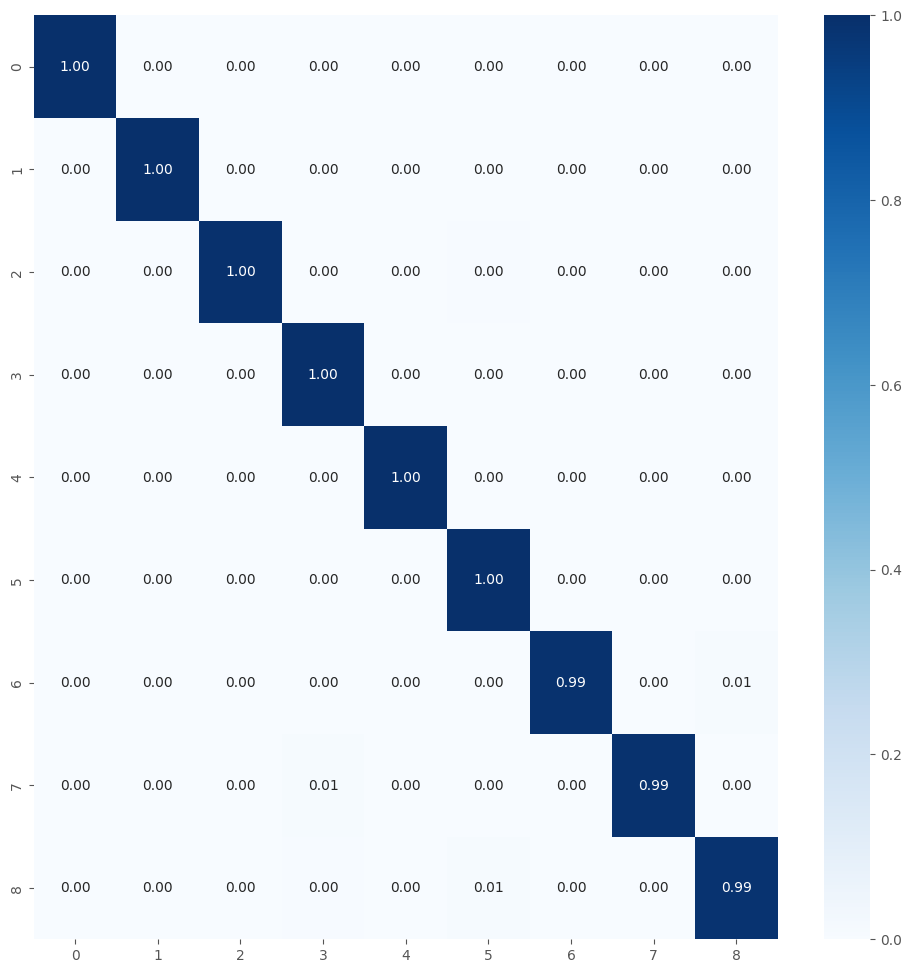


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15009_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- dense_114
- batch_normalization_38
- dropout_76
- dense_115
- dropout_77
- dense_116
Total: 9/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
295/295 [==============================] - 25s 74ms/step - loss: 0.1638 - accuracy: 0.9588 - val_loss: 0.1368 - val_accuracy: 0.9757 - lr: 8.1926e-04
Epoch 2/50
295/295 [==============================] - 22s 74ms/step - loss: 0.1278 - accuracy: 0.9773 - val_loss: 0.1421 - val_accuracy: 0.9836 - lr: 8.1926e-04
Epoch 3/50
295/295 [==============================] - 21s 72ms/step - loss: 0.1117 - accuracy: 0.9857 - val_loss: 0.1637 - val_accuracy: 0.9732 - lr: 8.1926e-04
Epoch 4/50
295/295 [==============================] - 21s 72ms/step - loss: 0.1216 - accuracy: 0.98

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15009_2.pkl
296/296 [==============================] - 18s 61ms/step - loss: 0.0710 - accuracy: 0.9979
Train Accuracy: 0.9978836178779602
Train Log Loss: 0.07097653299570084
64/64 [==============================] - 4s 60ms/step - loss: 0.0914 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.09142911434173584
64/64 [==============================] - 4s 58ms/step - loss: 0.0879 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.08787388354539871
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0]
 [  0   0 224   0   0   1   0   0   0]
 [  0   0   0 223   0   1   1   0   0]
 [  0   0   0   0 225   0   0   0   0]
 [  0   0   0   0   0 224   1   0   0]
 [  0   0   0   0   0   0 224   

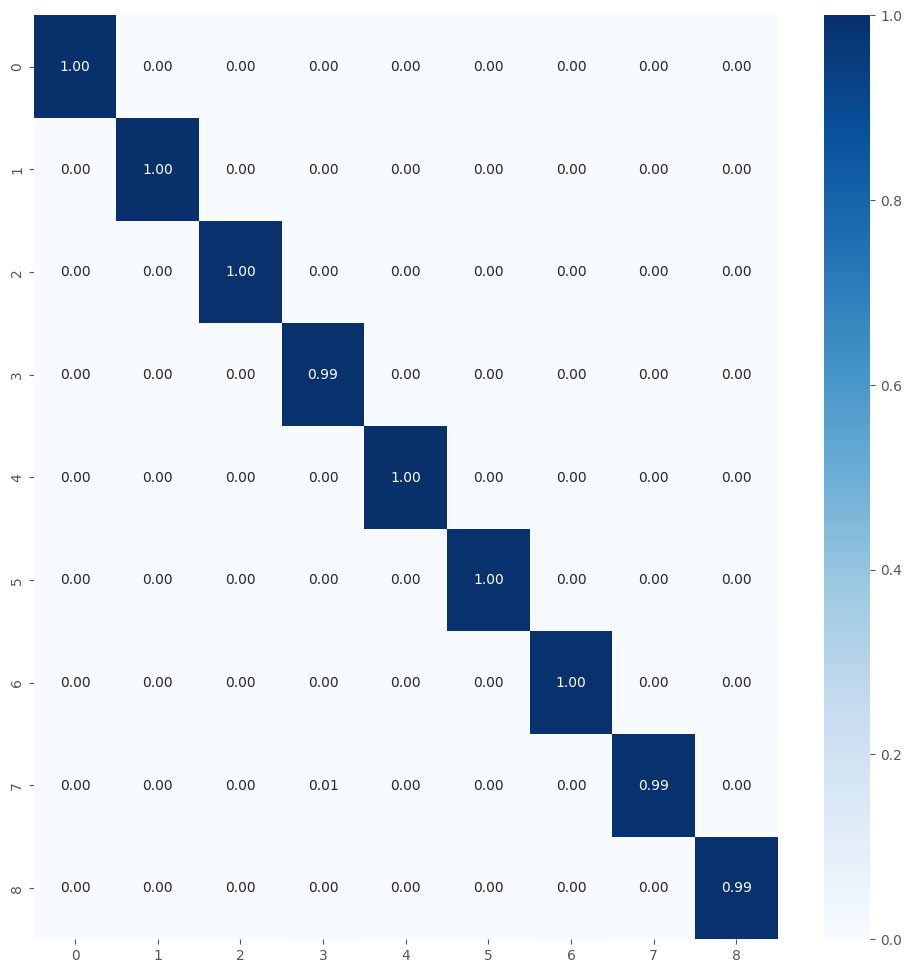


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15009_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- dense_114
- batch_normalization_38
- dropout_76
- dense_115
- dropout_77
- dense_116
Total: 9/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
295/295 [==============================] - 25s 75ms/step - loss: 0.1646 - accuracy: 0.9566 - val_loss: 0.1218 - val_accuracy: 0.9871 - lr: 8.1926e-04
Epoch 2/50
295/295 [==============================] - 21s 73ms/step - loss: 0.1233 - accuracy: 0.9777 - val_loss: 0.6567 - val_accuracy: 0.8254 - lr: 8.1926e-04
Epoch 3/50
295/295 [==============================] - 21s 71ms/step - loss: 0.1190 - accuracy: 0.9827 - val_loss: 0.1554 - val_accuracy: 0.9772 - lr: 8.1926e-04
Epoch 4/50
295/295 [==============================] - 22s 73ms/step - loss: 0.1496 - accuracy: 0.97

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15009_3.pkl
296/296 [==============================] - 18s 61ms/step - loss: 0.0445 - accuracy: 0.9989
Train Accuracy: 0.9989417791366577
Train Log Loss: 0.044534433633089066
64/64 [==============================] - 4s 59ms/step - loss: 0.0723 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.07227222621440887
64/64 [==============================] - 4s 61ms/step - loss: 0.0652 - accuracy: 0.9970
Test Accuracy: 0.9970370531082153
Test Log Loss: 0.0652046948671341
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0]
 [  0   0 224   0   0   1   0   0   0]
 [  0   0   0 225   0   0   0   0   0]
 [  0   0   0   0 225   0   0   0   0]
 [  0   0   0   0   0 225   0   0   0]
 [  0   0   0   0   0   0 224  

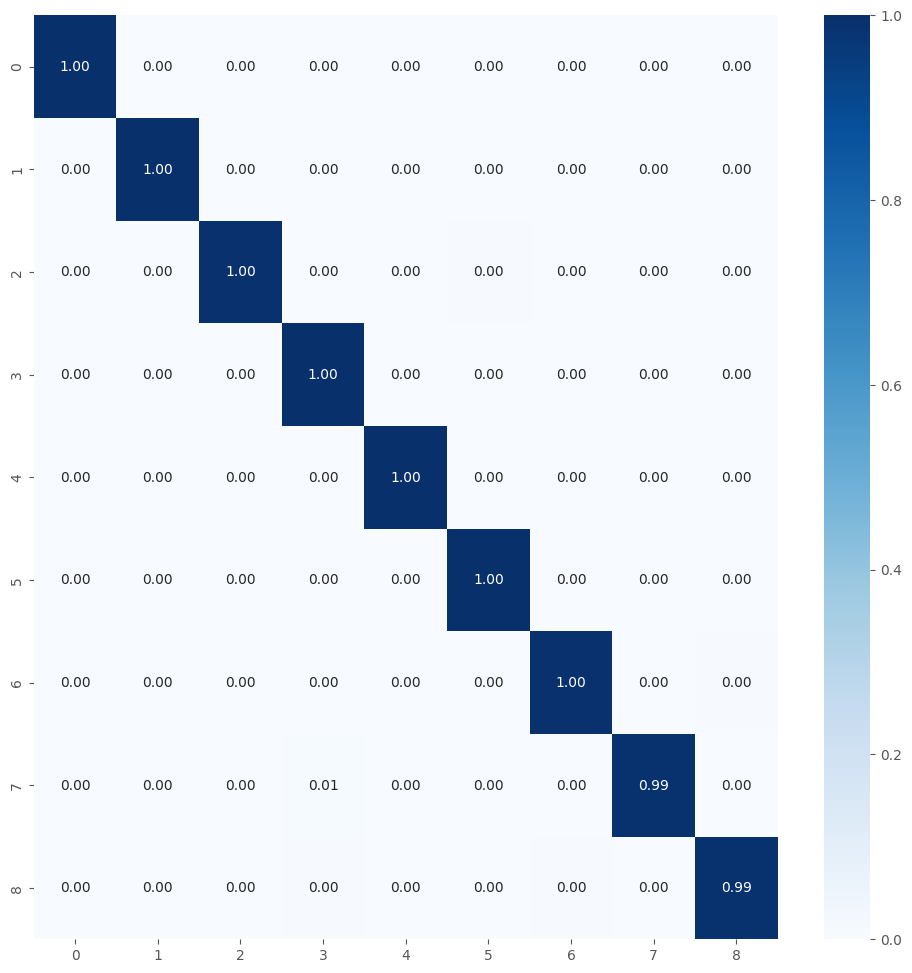


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15009_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- dense_114
- batch_normalization_38
- dropout_76
- dense_115
- dropout_77
- dense_116
Total: 9/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
295/295 [==============================] - 25s 76ms/step - loss: 0.1424 - accuracy: 0.9634 - val_loss: 0.1119 - val_accuracy: 0.9846 - lr: 8.1926e-04
Epoch 2/50
295/295 [==============================] - 22s 74ms/step - loss: 0.2099 - accuracy: 0.9539 - val_loss: 0.2248 - val_accuracy: 0.9578 - lr: 8.1926e-04
Epoch 3/50
295/295 [==============================] - 22s 74ms/step - loss: 0.1563 - accuracy: 0.9770 - val_loss: 0.1790 - val_accuracy: 0.9692 - lr: 8.1926e-04
Epoch 4/50
295/295 [==============================] - 21s 70ms/step - loss: 0.1228 - accuracy: 0.98

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15009_4.pkl
296/296 [==============================] - 18s 59ms/step - loss: 0.0647 - accuracy: 0.9982
Train Accuracy: 0.9982010722160339
Train Log Loss: 0.06465163826942444
64/64 [==============================] - 4s 58ms/step - loss: 0.0921 - accuracy: 0.9951
Validation Accuracy: 0.9950617551803589
Validation Log Loss: 0.09206441044807434
64/64 [==============================] - 4s 60ms/step - loss: 0.0898 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.0897575318813324
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0]
 [  0   0 224   0   0   1   0   0   0]
 [  0   0   0 223   0   2   0   0   0]
 [  0   0   0   0 225   0   0   0   0]
 [  0   0   0   0   0 225   0   0   0]
 [  0   0   0   0   0   0 224   

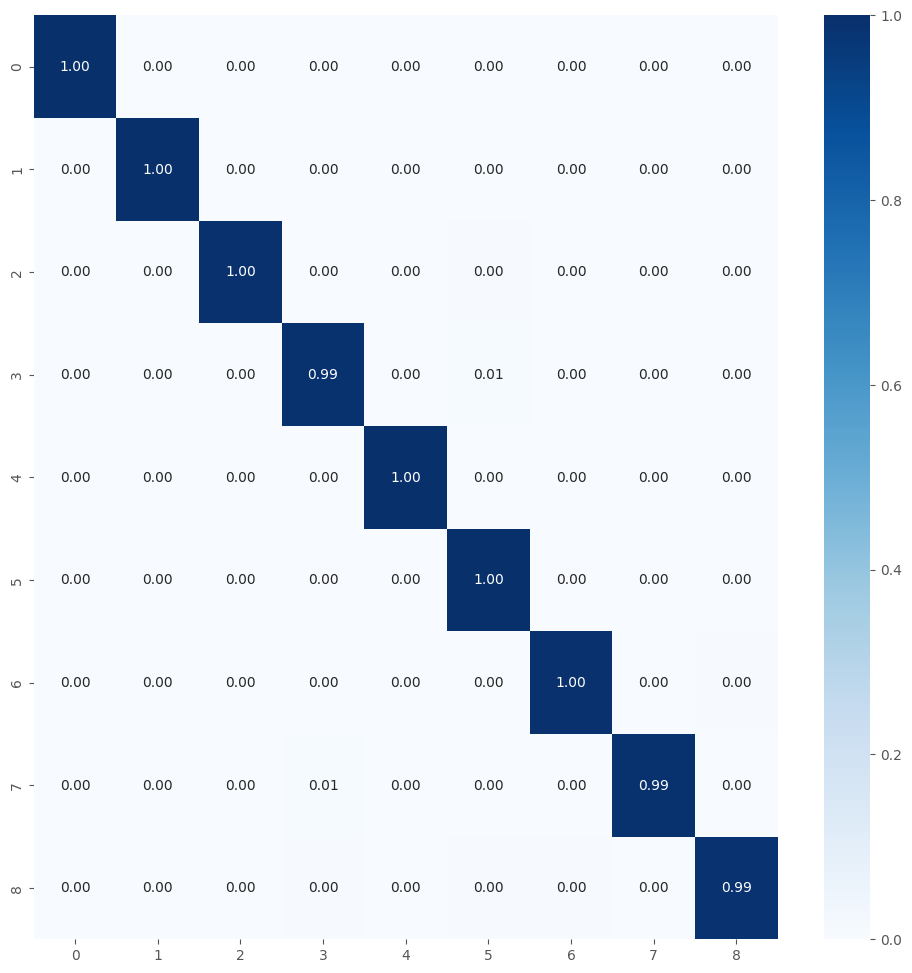


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15009_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- dense_114
- batch_normalization_38
- dropout_76
- dense_115
- dropout_77
- dense_116
Total: 9/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
295/295 [==============================] - 25s 74ms/step - loss: 0.1390 - accuracy: 0.9636 - val_loss: 0.1048 - val_accuracy: 0.9876 - lr: 8.1926e-04
Epoch 2/50
295/295 [==============================] - 22s 73ms/step - loss: 0.0910 - accuracy: 0.9861 - val_loss: 0.1086 - val_accuracy: 0.9886 - lr: 8.1926e-04
Epoch 3/50
295/295 [==============================] - 21s 72ms/step - loss: 0.1664 - accuracy: 0.9714 - val_loss: 0.2360 - val_accuracy: 0.9539 - lr: 8.1926e-04
Epoch 4/50
295/295 [==============================] - 22s 73ms/step - loss: 0.1749 - accuracy: 0.97

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15009_5.pkl
296/296 [==============================] - 18s 60ms/step - loss: 0.0823 - accuracy: 0.9971
Train Accuracy: 0.9971428513526917
Train Log Loss: 0.08228600770235062
64/64 [==============================] - 4s 61ms/step - loss: 0.1095 - accuracy: 0.9941
Validation Accuracy: 0.9940740466117859
Validation Log Loss: 0.10953124612569809
64/64 [==============================] - 4s 59ms/step - loss: 0.1005 - accuracy: 0.9946
Test Accuracy: 0.9945679306983948
Test Log Loss: 0.10046546906232834
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0]
 [  0   0 224   0   0   1   0   0   0]
 [  0   0   0 222   0   1   0   0   2]
 [  0   0   0   0 225   0   0   0   0]
 [  0   0   0   0   0 225   0   0   0]
 [  0   0   0   0   0   0 224 

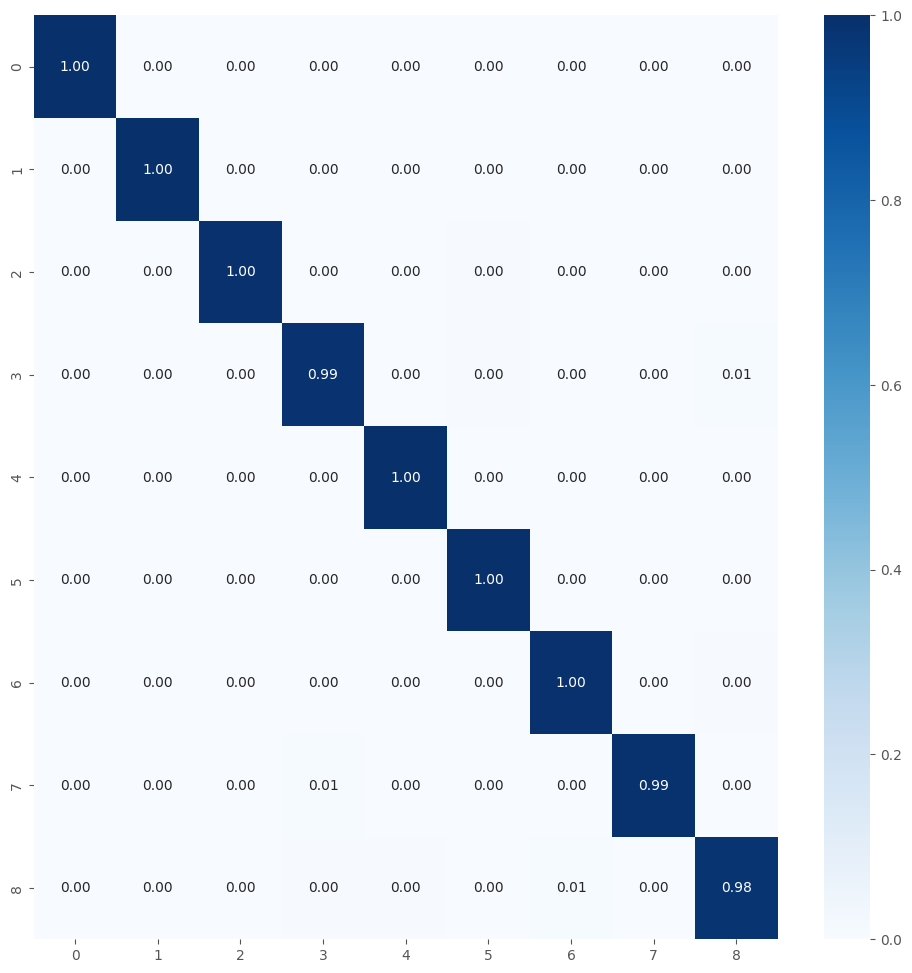


Best fold was 2 with val_accuracy: 0.9955
Average training accuracy in 5-fold: 0.9977489829063415
Average validation precision in 5-fold: 0.9952381134033204

Test Metrics
test_acc_list: [0.9960494041442871, 0.995555579662323, 0.9970370531082153, 0.995555579662323, 0.9945679306983948]
Average Test Accuracy with 5-fold: 0.9957531094551086
test_loss_list: [0.08305120468139648, 0.08787388354539871, 0.0652046948671341, 0.0897575318813324, 0.10046546906232834]
Average Test Log Loss with 5-fold: 0.08527055680751801

Precision List: [0.9960839598997493, 0.995577329049952, 0.9970565107048183, 0.9955921850479265, 0.9945765445059332]
Average Precision List with 5-fold: 0.9957773058416759
Recall List: [0.9960493827160494, 0.9955555555555556, 0.9970370370370372, 0.9955555555555556, 0.9945679012345681]
Average Recall List with 5-fold: 0.9957530864197531
F1 Score List: [0.9960514851672908, 0.9955599012881107, 0.9970380858239929, 0.9955598310813512, 0.9945656722947549]
Average F1 Score List with 5-fo

In [29]:
%%time

num_classes = 9
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

Familias de malware copiadas
source2: /notebooks/train3/all_malware/10
name_save_model: MobileNet_tf_150010
Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
- Allaple.L
- wacatac
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150010_best.h5
Loading pre-trained model...
Model loaded successfully.

Calculating layer importance (once for all folds)...

Calculando importancia con 10500 muestras (100% confianza, ±0% error)
Incluyendo 93 capas (base + personalizadas)


100%|██████████| 10500/10500 [22:13<00:00,  7.87it/s]
[I 2025-07-16 14:29:11,981] A new study created in memory with name: malware_classification_10classes



Resultados de importancia de capas (incluyendo personalizadas):
----------------------------------------------------------------------
Pos.  | Nombre de Capa                           | Importancia    
----------------------------------------------------------------------
1     | conv_pw_1                                | 0.0643220
2     | conv_pw_3                                | 0.0559791
3     | conv_dw_1                                | 0.0475976
4     | conv_dw_1_bn                             | 0.0398559
5     | conv_pw_2                                | 0.0359689
6     | conv_dw_2_bn                             | 0.0313630
7     | conv_pw_3_bn                             | 0.0277420
8     | conv_dw_3_bn                             | 0.0262378
9     | conv1_bn                                 | 0.0261003
10    | conv_dw_4_bn                             | 0.0260812
11    | conv_pw_1_bn                             | 0.0255630
12    | conv_pw_4                                | 0.02

[I 2025-07-16 14:48:48,099] Trial 0 finished with values: [0.9736607074737549, 0.17556889355182648] and parameters: {'learning_rate': 1.0868073587075025e-05, 'dropout_rate1': 0.5312915845486534, 'dropout_rate2': 0.2519932018669958, 'l2_reg': 0.00021707754392246922, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 13, 'early_stopping_patience': 19, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 1.0147927828661794e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150010_best.h5
Successfully loaded and modified pretrained model
Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.


[I 2025-07-16 14:59:21,290] Trial 1 finished with values: [0.9750000238418579, 0.18830539286136627] and parameters: {'learning_rate': 1.6100945177526305e-05, 'dropout_rate1': 0.26256119357157215, 'dropout_rate2': 0.13103678324569024, 'l2_reg': 0.0002300908285619597, 'units_dense1': 512, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 12, 'early_stopping_patience': 19, 'reduce_lr_patience': 14, 'fine_tune_learning_rate': 1.92643188879559e-06, 'units_dense3': 32, 'dropout_rate3': 0.27669786357264814}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150010_best.h5
Successfully loaded and modified pretrained model
Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.


[I 2025-07-16 15:09:56,349] Trial 2 finished with values: [0.9741071462631226, 0.19170346856117249] and parameters: {'learning_rate': 1.4118804492485937e-05, 'dropout_rate1': 0.46922929419361314, 'dropout_rate2': 0.330587698601941, 'l2_reg': 0.000800688870038724, 'units_dense1': 512, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 9, 'early_stopping_patience': 18, 'reduce_lr_patience': 14, 'fine_tune_learning_rate': 3.765254061143892e-06, 'units_dense3': 32, 'dropout_rate3': 0.33363502615561236}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150010_best.h5
Successfully loaded and modified pretrained model
Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.


[I 2025-07-16 15:17:01,286] Trial 3 finished with values: [0.9732142686843872, 0.19125261902809143] and parameters: {'learning_rate': 0.0014395711979875503, 'dropout_rate1': 0.5143740565499734, 'dropout_rate2': 0.1539507716808407, 'l2_reg': 1.5169322835988641e-05, 'units_dense1': 512, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 12, 'reduce_lr_patience': 15, 'fine_tune_learning_rate': 1.9962385669240152e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150010_best.h5
Successfully loaded and modified pretrained model
Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.


[I 2025-07-16 15:36:41,309] Trial 4 finished with values: [0.9736607074737549, 0.1391252726316452] and parameters: {'learning_rate': 0.0027838606400195616, 'dropout_rate1': 0.4814063405305516, 'dropout_rate2': 0.22247768787351793, 'l2_reg': 0.0009750670159158417, 'units_dense1': 1024, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 11, 'early_stopping_patience': 13, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 7.733426507590894e-05}.


Mejores trials para cada objetivo:
  Trial 1:
    val_accuracy: 0.9750
    val_loss: 0.1883
    Parámetros: {'learning_rate': 1.6100945177526305e-05, 'dropout_rate1': 0.26256119357157215, 'dropout_rate2': 0.13103678324569024, 'l2_reg': 0.0002300908285619597, 'units_dense1': 512, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 12, 'early_stopping_patience': 19, 'reduce_lr_patience': 14, 'fine_tune_learning_rate': 1.92643188879559e-06, 'units_dense3': 32, 'dropout_rate3': 0.27669786357264814}
  Trial 4:
    val_accuracy: 0.9737
    val_loss: 0.1391
    Parámetros: {'learning_rate': 0.0027838606400195616, 'dropout_rate1': 0.4814063405305516, 'dropout_rate2': 0.22247768787351793, 'l2_reg': 0.0009750670159158417, 'units_dense1': 1024, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 11, 'early_stopping_patience': 13, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 7.733426507590894e-05}


/tmp/ipykernel_29/980747374.py:135: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

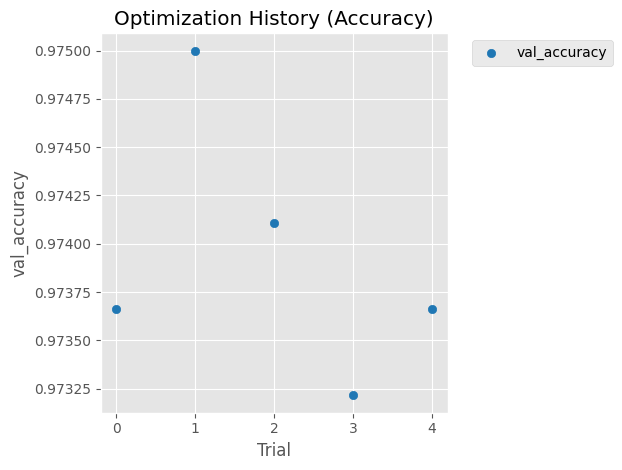

/tmp/ipykernel_29/980747374.py:146: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

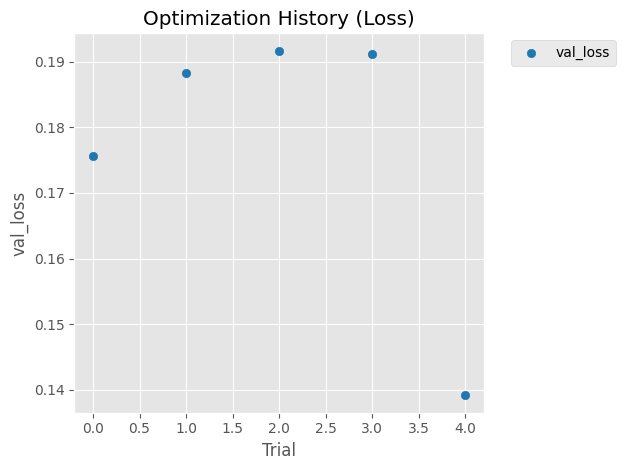

/tmp/ipykernel_29/980747374.py:184: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

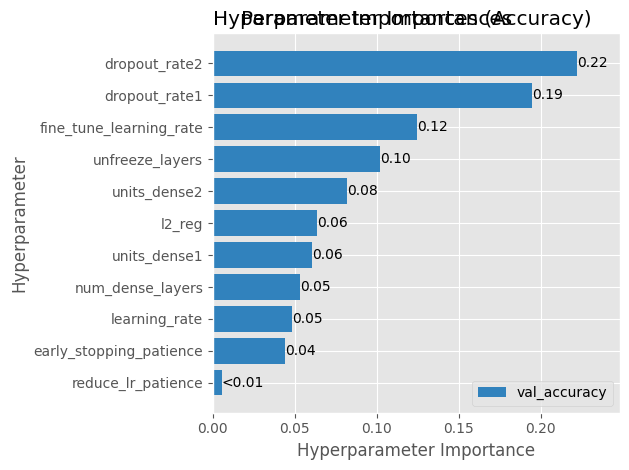


TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150010_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d
- dense
- batch_normalization
- dropout
- dense_1
- dropout_1
- dense_2
Total: 15/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
328/328 [==============================] - 29s 76ms/step - loss: 0.0430 - accuracy: 0.9992 - val_loss: 0.1954 - val_accuracy: 0.9719 - lr: 1.6101e-06
Epoch 2/50
328/328 [==============================] - 24s 74ms/step - loss: 0.0420 - accuracy: 0.9993 - val_loss: 0.1948 - val_accuracy: 0.9741 - lr: 1.6101e-06
Epoch 3/50
328/328 [==============================] - 25s 75ms/step - loss: 0.0419 - accuracy: 0.9993 - val_loss: 0.1932 - val_accuracy: 0.9746 - lr: 1.6101e-06
Epoc

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150010_1.pkl
329/329 [==============================] - 20s 61ms/step - loss: 0.0388 - accuracy: 0.9999
Train Accuracy: 0.9999047517776489
Train Log Loss: 0.0388386994600296
71/71 [==============================] - 4s 59ms/step - loss: 0.1933 - accuracy: 0.9742
Validation Accuracy: 0.9742222428321838
Validation Log Loss: 0.19333003461360931
71/71 [==============================] - 4s 62ms/step - loss: 0.1785 - accuracy: 0.9742
Test Accuracy: 0.9742222428321838
Test Log Loss: 0.1785125583410263
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8, 'wacatac': 9}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   1]
 [  0   0   0 223   0   0   0   0   0   2]
 [  0   0   0   0 219   0   0   0   0   6]
 [  0   0   0   0   0 225   0   0   

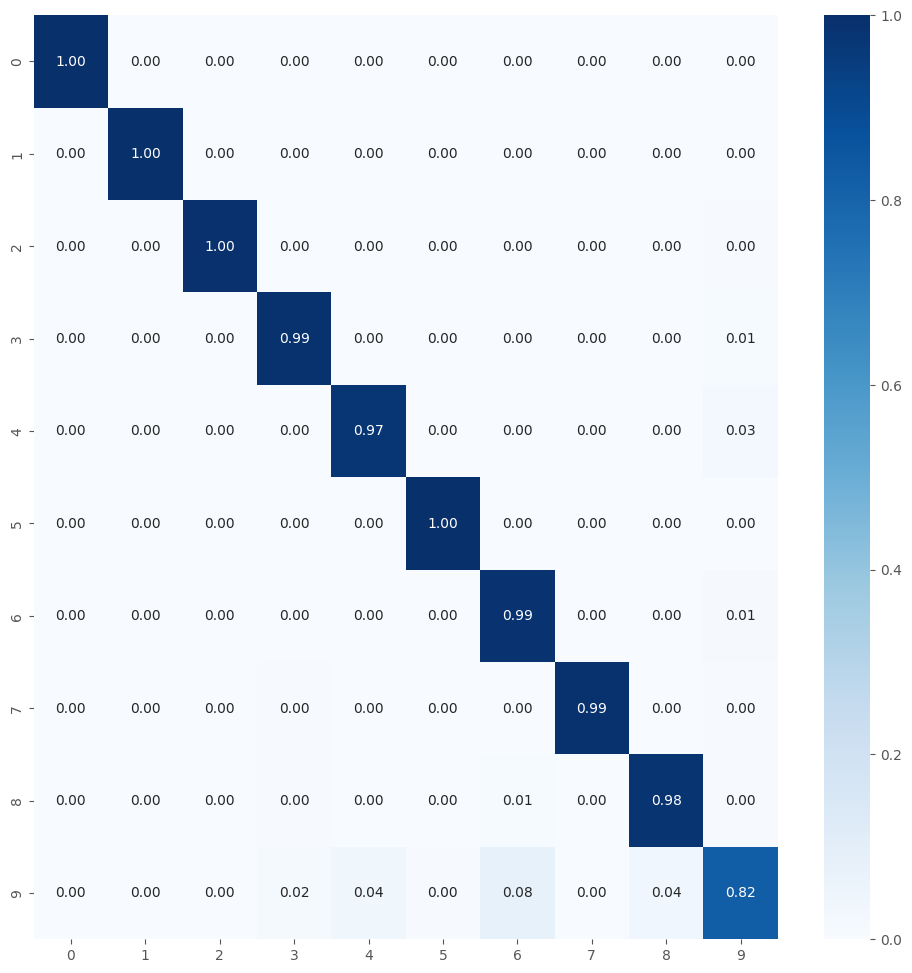


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150010_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d
- dense
- batch_normalization
- dropout
- dense_1
- dropout_1
- dense_2
Total: 15/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
328/328 [==============================] - 28s 75ms/step - loss: 0.0439 - accuracy: 0.9989 - val_loss: 0.1966 - val_accuracy: 0.9723 - lr: 1.6101e-06
Epoch 2/50
328/328 [==============================] - 24s 72ms/step - loss: 0.0420 - accuracy: 0.9992 - val_loss: 0.1951 - val_accuracy: 0.9719 - lr: 1.6101e-06
Epoch 3/50
328/328 [==============================] - 24s 74ms/step - loss: 0.0415 - accuracy: 0.9994 - val_loss: 0.1949 - val_accuracy: 0.9728 - lr: 1.6101e-06
Epoc

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150010_2.pkl
329/329 [==============================] - 19s 59ms/step - loss: 0.0378 - accuracy: 0.9999
Train Accuracy: 0.9999047517776489
Train Log Loss: 0.03775767609477043
71/71 [==============================] - 4s 60ms/step - loss: 0.1927 - accuracy: 0.9742
Validation Accuracy: 0.9742222428321838
Validation Log Loss: 0.19267068803310394
71/71 [==============================] - 4s 59ms/step - loss: 0.1803 - accuracy: 0.9747
Test Accuracy: 0.9746666550636292
Test Log Loss: 0.1802695393562317
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8, 'wacatac': 9}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   1]
 [  0   0   0 223   0   0   0   0   0   2]
 [  0   0   0   0 219   0   0   0   0   6]
 [  0   0   0   0   0 225   0   0  

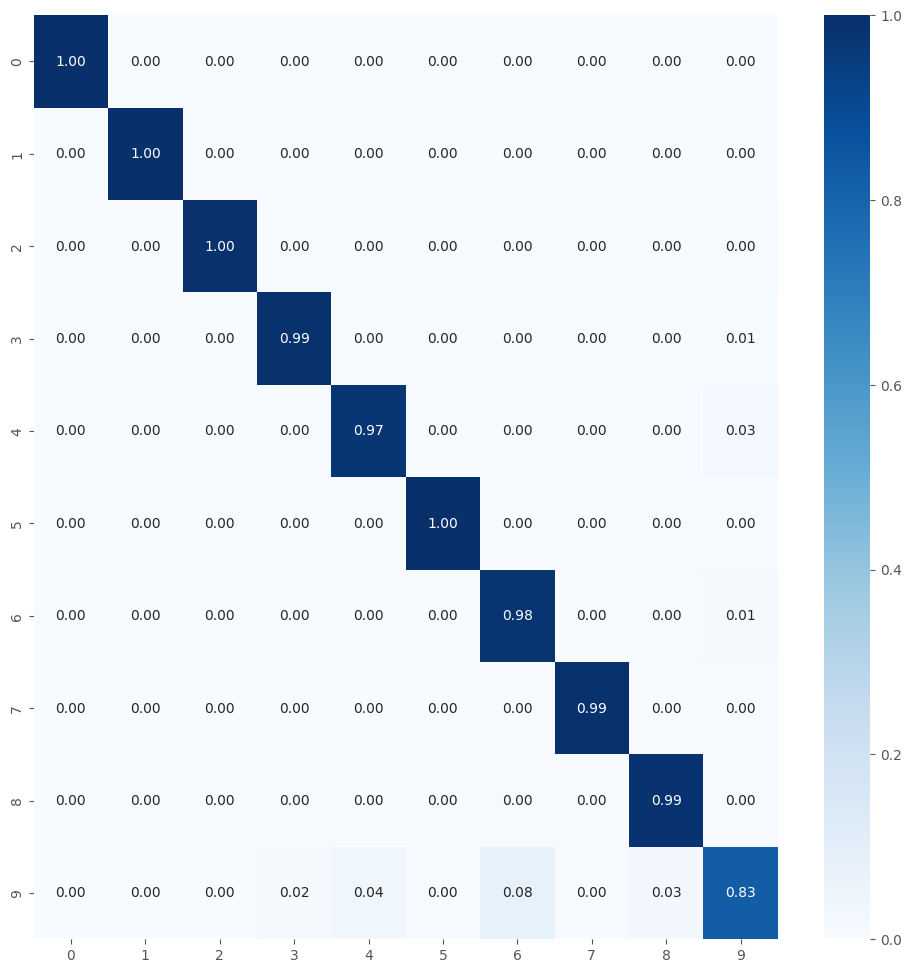


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150010_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d
- dense
- batch_normalization
- dropout
- dense_1
- dropout_1
- dense_2
Total: 15/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
328/328 [==============================] - 29s 76ms/step - loss: 0.0428 - accuracy: 0.9990 - val_loss: 0.1915 - val_accuracy: 0.9741 - lr: 1.6101e-06
Epoch 2/50
328/328 [==============================] - 24s 74ms/step - loss: 0.0420 - accuracy: 0.9994 - val_loss: 0.1959 - val_accuracy: 0.9728 - lr: 1.6101e-06
Epoch 3/50
328/328 [==============================] - 24s 73ms/step - loss: 0.0414 - accuracy: 0.9994 - val_loss: 0.1983 - val_accuracy: 0.9728 - lr: 1.6101e-06
Epoc

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150010_3.pkl
329/329 [==============================] - 20s 60ms/step - loss: 0.0395 - accuracy: 0.9998
Train Accuracy: 0.9998095035552979
Train Log Loss: 0.03952091559767723
71/71 [==============================] - 4s 59ms/step - loss: 0.1967 - accuracy: 0.9733
Validation Accuracy: 0.9733333587646484
Validation Log Loss: 0.19665193557739258
71/71 [==============================] - 4s 60ms/step - loss: 0.1759 - accuracy: 0.9747
Test Accuracy: 0.9746666550636292
Test Log Loss: 0.17590990662574768
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8, 'wacatac': 9}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   1]
 [  0   0   0 223   0   0   0   0   0   2]
 [  0   0   0   0 219   0   0   0   0   6]
 [  0   0   0   0   0 225   0   0 

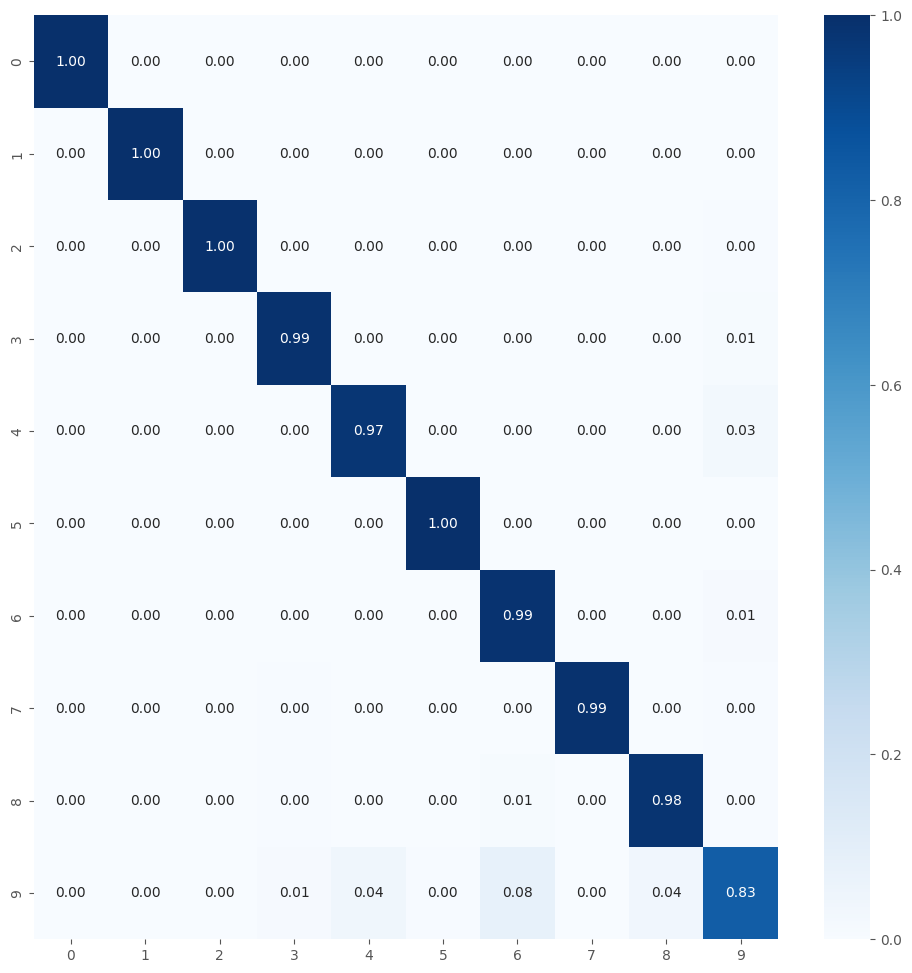


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150010_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d
- dense
- batch_normalization
- dropout
- dense_1
- dropout_1
- dense_2
Total: 15/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
328/328 [==============================] - 29s 77ms/step - loss: 0.0437 - accuracy: 0.9987 - val_loss: 0.1942 - val_accuracy: 0.9719 - lr: 1.6101e-06
Epoch 2/50
328/328 [==============================] - 23s 71ms/step - loss: 0.0422 - accuracy: 0.9993 - val_loss: 0.1950 - val_accuracy: 0.9723 - lr: 1.6101e-06
Epoch 3/50
328/328 [==============================] - 23s 71ms/step - loss: 0.0417 - accuracy: 0.9991 - val_loss: 0.1905 - val_accuracy: 0.9732 - lr: 1.6101e-06
Epoc

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150010_4.pkl
329/329 [==============================] - 20s 61ms/step - loss: 0.0359 - accuracy: 0.9999
Train Accuracy: 0.9999047517776489
Train Log Loss: 0.0359378382563591
71/71 [==============================] - 4s 60ms/step - loss: 0.1956 - accuracy: 0.9742
Validation Accuracy: 0.9742222428321838
Validation Log Loss: 0.19560962915420532
71/71 [==============================] - 4s 61ms/step - loss: 0.1855 - accuracy: 0.9751
Test Accuracy: 0.9751111268997192
Test Log Loss: 0.18547190725803375
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8, 'wacatac': 9}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   1   0]
 [  0   0   0 223   0   0   0   0   0   2]
 [  0   0   0   0 219   0   0   0   0   6]
 [  0   0   0   0   0 225   0   0  

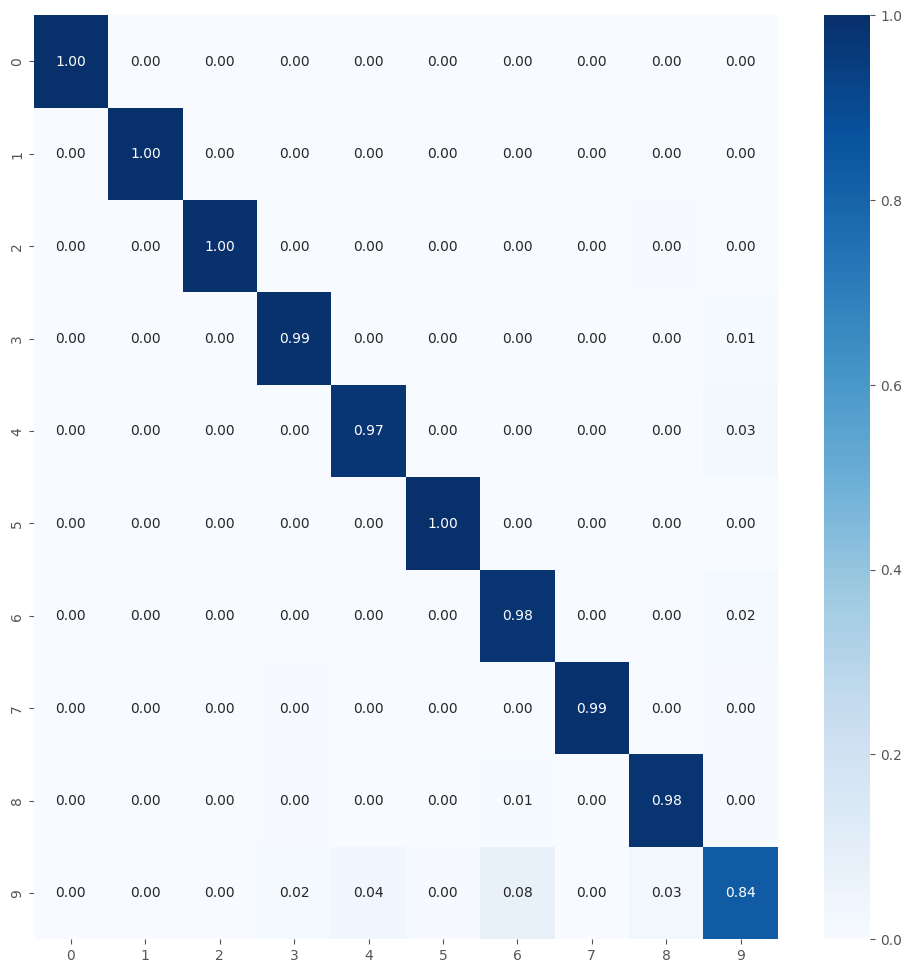


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150010_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d
- dense
- batch_normalization
- dropout
- dense_1
- dropout_1
- dense_2
Total: 15/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
328/328 [==============================] - 28s 74ms/step - loss: 0.0435 - accuracy: 0.9990 - val_loss: 0.1948 - val_accuracy: 0.9723 - lr: 1.6101e-06
Epoch 2/50
328/328 [==============================] - 24s 72ms/step - loss: 0.0427 - accuracy: 0.9991 - val_loss: 0.1949 - val_accuracy: 0.9719 - lr: 1.6101e-06
Epoch 3/50
328/328 [==============================] - 24s 72ms/step - loss: 0.0414 - accuracy: 0.9995 - val_loss: 0.1938 - val_accuracy: 0.9732 - lr: 1.6101e-06
Epoc

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150010_5.pkl
329/329 [==============================] - 20s 59ms/step - loss: 0.0377 - accuracy: 0.9999
Train Accuracy: 0.9999047517776489
Train Log Loss: 0.0376783050596714
71/71 [==============================] - 4s 61ms/step - loss: 0.1951 - accuracy: 0.9738
Validation Accuracy: 0.9737777709960938
Validation Log Loss: 0.19505445659160614
71/71 [==============================] - 4s 60ms/step - loss: 0.1797 - accuracy: 0.9742
Test Accuracy: 0.9742222428321838
Test Log Loss: 0.1797410547733307
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8, 'wacatac': 9}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   1]
 [  0   0   0 223   0   0   0   0   0   2]
 [  0   0   0   0 219   0   0   0   0   6]
 [  0   0   0   0   0 225   0   0   

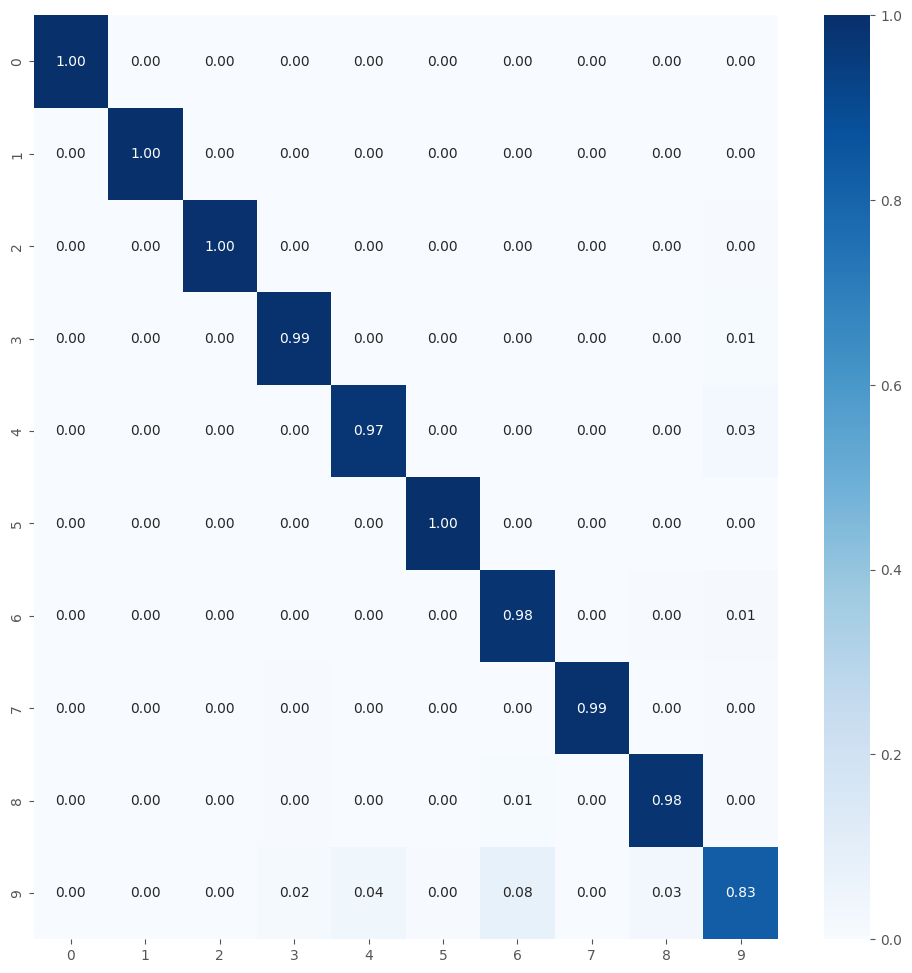


Best fold was 4 with val_accuracy: 0.9750
Average training accuracy in 5-fold: 0.999904453754425
Average validation precision in 5-fold: 0.9743750095367432

Test Metrics
test_acc_list: [0.9742222428321838, 0.9746666550636292, 0.9746666550636292, 0.9751111268997192, 0.9742222428321838]
Average Test Accuracy with 5-fold: 0.974577784538269
test_loss_list: [0.1785125583410263, 0.1802695393562317, 0.17590990662574768, 0.18547190725803375, 0.1797410547733307]
Average Test Log Loss with 5-fold: 0.17998099327087402

Precision List: [0.974196977895623, 0.9745951388303646, 0.9746592586551241, 0.9750723961951266, 0.9741978613982154]
Average Precision List with 5-fold: 0.9745443265948908
Recall List: [0.9742222222222224, 0.9746666666666666, 0.9746666666666668, 0.9751111111111112, 0.9742222222222223]
Average Recall List with 5-fold: 0.9745777777777779
F1 Score List: [0.9737316775777762, 0.9742013447617218, 0.9742137990733962, 0.9747164628428262, 0.973771777340002]
Average F1 Score List with 5-fold

In [30]:
%%time

num_classes = 10
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

Familias de malware copiadas
source2: /notebooks/train3/all_malware/11
name_save_model: MobileNet_tf_150011
Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
- Allaple.L
- wacatac
- dinwod
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150011_best.h5
Loading pre-trained model...
Model loaded successfully.

Calculating layer importance (once for all folds)...

Calculando importancia con 11550 muestras (100% confianza, ±0% error)
Incluyendo 93 capas (base + personalizadas)


100%|██████████| 11550/11550 [24:35<00:00,  7.83it/s]
[I 2025-07-16 16:58:49,825] A new study created in memory with name: malware_classification_11classes



Resultados de importancia de capas (incluyendo personalizadas):
----------------------------------------------------------------------
Pos.  | Nombre de Capa                           | Importancia    
----------------------------------------------------------------------
1     | conv_pw_1                                | 0.0278747
2     | conv_dw_1                                | 0.0229879
3     | conv_pw_3                                | 0.0221918
4     | conv_dw_1_bn                             | 0.0166152
5     | conv_pw_2                                | 0.0142917
6     | conv_dw_2_bn                             | 0.0131785
7     | conv_pw_3_bn                             | 0.0108678
8     | conv_pw_1_bn                             | 0.0106764
9     | conv_dw_3_bn                             | 0.0106455
10    | conv1_bn                                 | 0.0106372
11    | conv_dw_4_bn                             | 0.0099390
12    | conv_pw_4                                | 0.00

[I 2025-07-16 17:08:00,532] Trial 0 finished with values: [0.9492694735527039, 0.2969365119934082] and parameters: {'learning_rate': 7.541936660952925e-05, 'dropout_rate1': 0.3387029526742051, 'dropout_rate2': 0.4725150667483409, 'l2_reg': 0.0015869149986441225, 'units_dense1': 1024, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 13, 'early_stopping_patience': 20, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 2.8055442830724596e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150011_best.h5
Successfully loaded and modified pretrained model
Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.


[I 2025-07-16 17:15:52,517] Trial 1 finished with values: [0.9504870176315308, 0.2804097831249237] and parameters: {'learning_rate': 0.0009367444798366093, 'dropout_rate1': 0.27417607909161673, 'dropout_rate2': 0.3841660186363963, 'l2_reg': 6.818607607461667e-05, 'units_dense1': 1024, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 9, 'early_stopping_patience': 17, 'reduce_lr_patience': 14, 'fine_tune_learning_rate': 3.3443923866727816e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150011_best.h5
Successfully loaded and modified pretrained model
Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.


[I 2025-07-16 17:24:38,421] Trial 2 finished with values: [0.9496753215789795, 0.27937600016593933] and parameters: {'learning_rate': 1.3067143396153201e-05, 'dropout_rate1': 0.5762670977283961, 'dropout_rate2': 0.486323486586436, 'l2_reg': 0.0023813961318971373, 'units_dense1': 512, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 9, 'early_stopping_patience': 19, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 8.095577525566769e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150011_best.h5
Successfully loaded and modified pretrained model
Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.


[I 2025-07-16 17:30:21,840] Trial 3 finished with values: [0.951298713684082, 0.28927960991859436] and parameters: {'learning_rate': 1.9030627369357527e-05, 'dropout_rate1': 0.35513900663372067, 'dropout_rate2': 0.2696341031657564, 'l2_reg': 0.009293814433567697, 'units_dense1': 1024, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 12, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 9.90185205511182e-06, 'units_dense3': 32, 'dropout_rate3': 0.22317341409219504}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150011_best.h5
Successfully loaded and modified pretrained model
Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.


[I 2025-07-16 17:38:14,596] Trial 4 finished with values: [0.9517045617103577, 0.30555298924446106] and parameters: {'learning_rate': 0.0015319923217736254, 'dropout_rate1': 0.5657755351630398, 'dropout_rate2': 0.21953197108105027, 'l2_reg': 5.349746403986373e-05, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 16, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 2.157350522364329e-05}.


Mejores trials para cada objetivo:
  Trial 1:
    val_accuracy: 0.9505
    val_loss: 0.2804
    Parámetros: {'learning_rate': 0.0009367444798366093, 'dropout_rate1': 0.27417607909161673, 'dropout_rate2': 0.3841660186363963, 'l2_reg': 6.818607607461667e-05, 'units_dense1': 1024, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 9, 'early_stopping_patience': 17, 'reduce_lr_patience': 14, 'fine_tune_learning_rate': 3.3443923866727816e-06}
  Trial 2:
    val_accuracy: 0.9497
    val_loss: 0.2794
    Parámetros: {'learning_rate': 1.3067143396153201e-05, 'dropout_rate1': 0.5762670977283961, 'dropout_rate2': 0.486323486586436, 'l2_reg': 0.0023813961318971373, 'units_dense1': 512, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 9, 'early_stopping_patience': 19, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 8.095577525566769e-06}
  Trial 3:
    val_accuracy: 0.9513
    val_loss: 0.2893
    Parámetros: {'learning_rate': 1.9030627369357527e-05, 'dropout_rate1': 0

/tmp/ipykernel_29/980747374.py:135: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

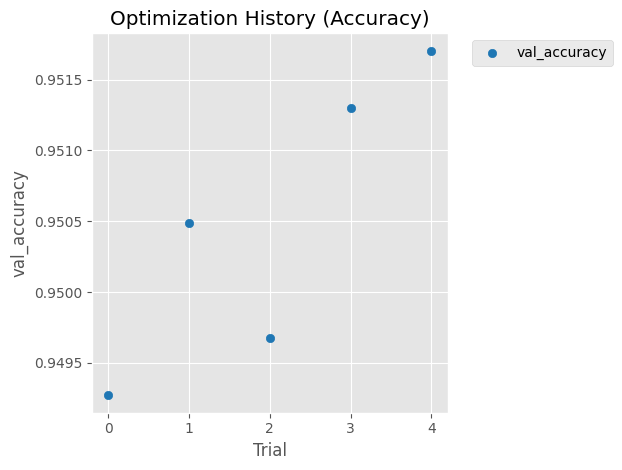

/tmp/ipykernel_29/980747374.py:146: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

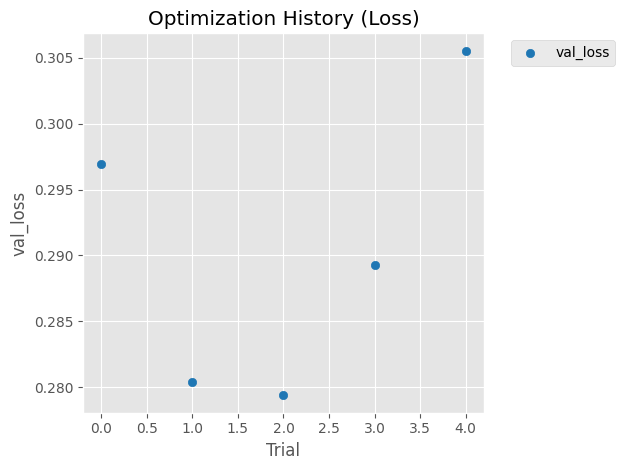

/tmp/ipykernel_29/980747374.py:184: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

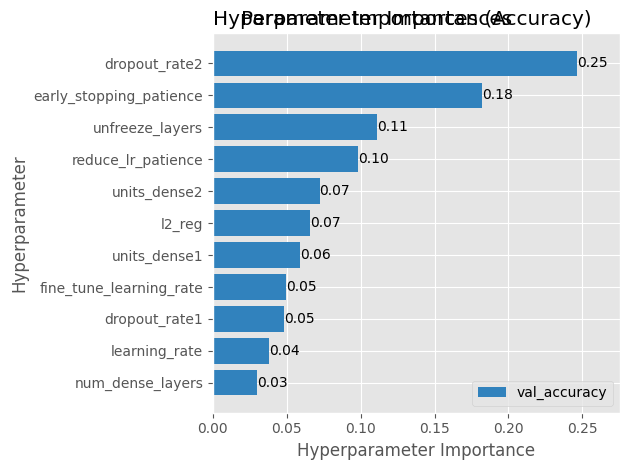


TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150011_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_7
- dense_21
- batch_normalization_7
- dropout_14
- dense_22
- dropout_15
- dense_23
Total: 12/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
360/360 [==============================] - 30s 75ms/step - loss: 0.0883 - accuracy: 0.9851 - val_loss: 0.3025 - val_accuracy: 0.9379 - lr: 9.3674e-05
Epoch 2/50
360/360 [==============================] - 26s 73ms/step - loss: 0.0886 - accuracy: 0.9848 - val_loss: 0.2896 - val_accuracy: 0.9501 - lr: 9.3674e-05
Epoch 3/50
360/360 [==============================] - 27s 75ms/step - loss: 0.0815 - accuracy: 0.9866 - val_loss: 0.2899 - val_accuracy: 0.9424 - lr: 9.3674e-05
Epoch 4/50
360/360 [==================

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150011_1.pkl
361/361 [==============================] - 22s 61ms/step - loss: 0.0648 - accuracy: 0.9932
Train Accuracy: 0.9931601881980896
Train Log Loss: 0.0648450255393982
78/78 [==============================] - 5s 60ms/step - loss: 0.2889 - accuracy: 0.9499
Validation Accuracy: 0.9498990178108215
Validation Log Loss: 0.2888960838317871
78/78 [==============================] - 5s 61ms/step - loss: 0.2669 - accuracy: 0.9519
Test Accuracy: 0.9519191980361938
Test Log Loss: 0.26689237356185913
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'dinwod': 4, 'ganelp': 5, 'mira': 6, 'sfone': 7, 'sillyp2p': 8, 'wabot': 9, 'wacatac': 10}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   1]
 [  0   0   0 221   1   0   0   1   0   0   2]
 [  0   0   0   0 200   8   0   0   0   0  17]
 [

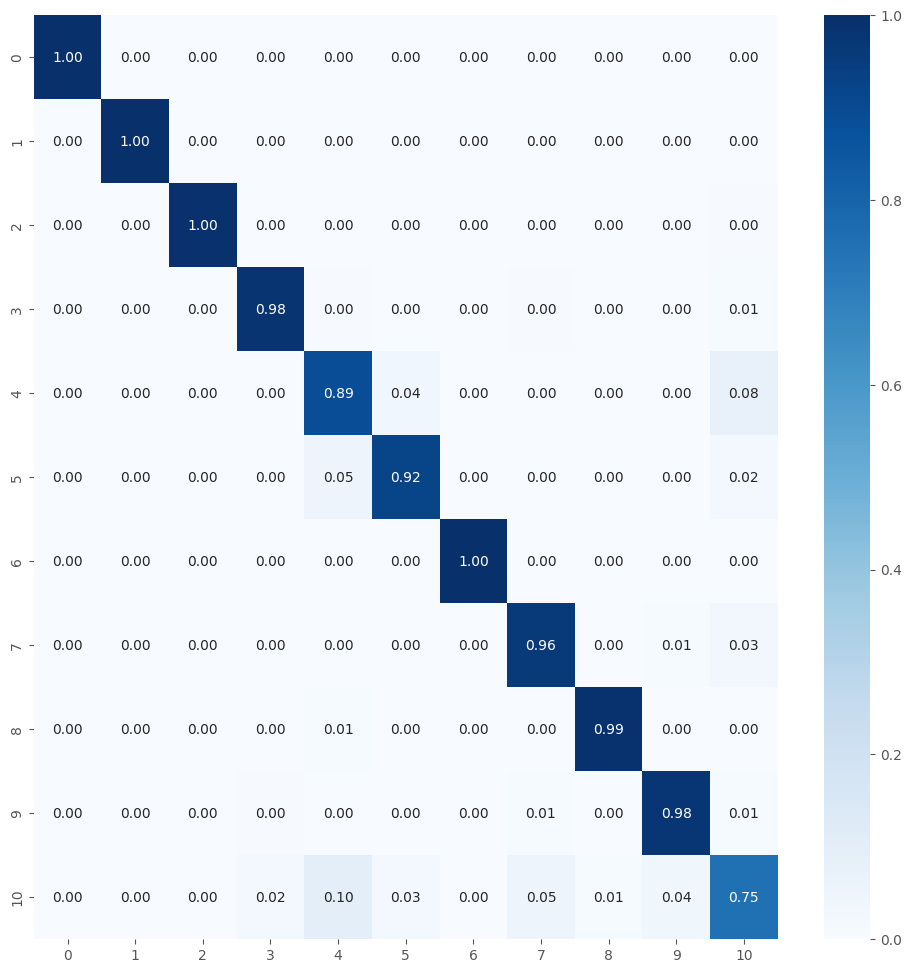


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150011_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_7
- dense_21
- batch_normalization_7
- dropout_14
- dense_22
- dropout_15
- dense_23
Total: 12/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
360/360 [==============================] - 30s 74ms/step - loss: 0.0910 - accuracy: 0.9865 - val_loss: 0.2864 - val_accuracy: 0.9432 - lr: 9.3674e-05
Epoch 2/50
360/360 [==============================] - 27s 74ms/step - loss: 0.0780 - accuracy: 0.9885 - val_loss: 0.3131 - val_accuracy: 0.9383 - lr: 9.3674e-05
Epoch 3/50
360/360 [==============================] - 24s 66ms/step - loss: 0.0785 - accuracy: 0.9881 - val_loss: 0.2966 - val_accuracy: 0.9420 - lr: 9.3674e-05
Epoch 4/50
360/360 [==================

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150011_2.pkl
361/361 [==============================] - 22s 61ms/step - loss: 0.0334 - accuracy: 0.9975
Train Accuracy: 0.9974891543388367
Train Log Loss: 0.03337539732456207
78/78 [==============================] - 5s 61ms/step - loss: 0.3239 - accuracy: 0.9515
Validation Accuracy: 0.9515151381492615
Validation Log Loss: 0.32392778992652893
78/78 [==============================] - 5s 60ms/step - loss: 0.2956 - accuracy: 0.9499
Test Accuracy: 0.9498990178108215
Test Log Loss: 0.29562413692474365
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'dinwod': 4, 'ganelp': 5, 'mira': 6, 'sfone': 7, 'sillyp2p': 8, 'wabot': 9, 'wacatac': 10}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   1   0]
 [  0   0   0 221   1   0   0   1   0   0   2]
 [  0   0   0   0 194  10   0   0   0   0  21]


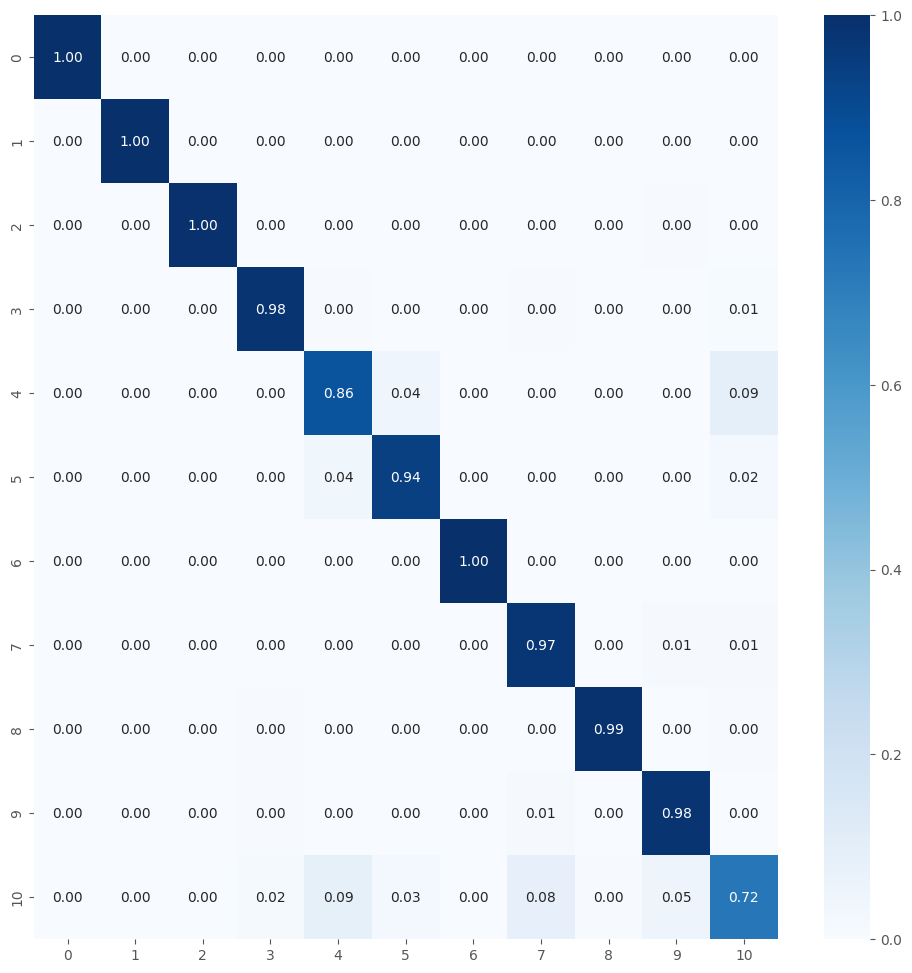


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150011_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_7
- dense_21
- batch_normalization_7
- dropout_14
- dense_22
- dropout_15
- dense_23
Total: 12/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
360/360 [==============================] - 30s 67ms/step - loss: 0.0879 - accuracy: 0.9848 - val_loss: 0.2953 - val_accuracy: 0.9432 - lr: 9.3674e-05
Epoch 2/50
360/360 [==============================] - 26s 72ms/step - loss: 0.0831 - accuracy: 0.9876 - val_loss: 0.2780 - val_accuracy: 0.9432 - lr: 9.3674e-05
Epoch 3/50
360/360 [==============================] - 27s 74ms/step - loss: 0.0886 - accuracy: 0.9850 - val_loss: 0.3001 - val_accuracy: 0.9403 - lr: 9.3674e-05
Epoch 4/50
360/360 [==================

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150011_3.pkl
361/361 [==============================] - 22s 62ms/step - loss: 0.0430 - accuracy: 0.9961
Train Accuracy: 0.9961038827896118
Train Log Loss: 0.04298286512494087
78/78 [==============================] - 5s 61ms/step - loss: 0.2687 - accuracy: 0.9479
Validation Accuracy: 0.9478787779808044
Validation Log Loss: 0.2686919867992401
78/78 [==============================] - 5s 60ms/step - loss: 0.2492 - accuracy: 0.9535
Test Accuracy: 0.9535353779792786
Test Log Loss: 0.24920135736465454
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'dinwod': 4, 'ganelp': 5, 'mira': 6, 'sfone': 7, 'sillyp2p': 8, 'wabot': 9, 'wacatac': 10}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   1   0]
 [  0   0   0 221   1   0   1   1   0   0   1]
 [  0   0   0   0 196   9   0   0   0   0  20]
 

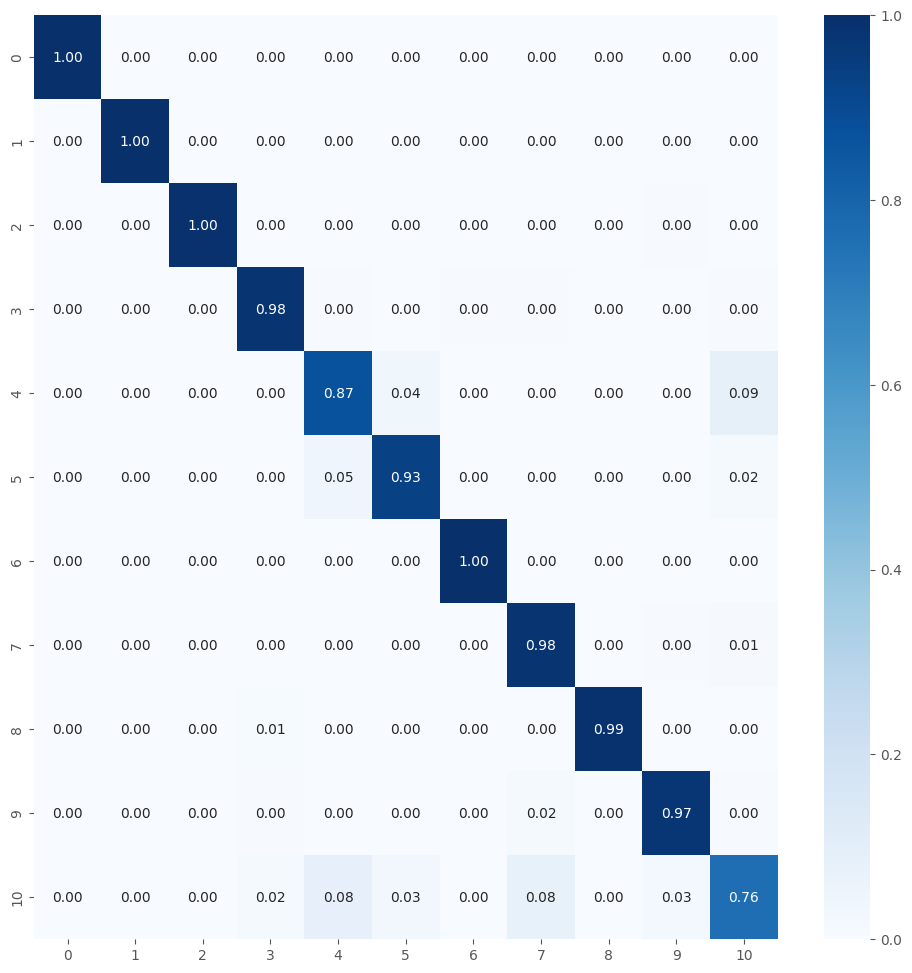


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150011_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_7
- dense_21
- batch_normalization_7
- dropout_14
- dense_22
- dropout_15
- dense_23
Total: 12/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
360/360 [==============================] - 31s 77ms/step - loss: 0.0887 - accuracy: 0.9872 - val_loss: 0.3028 - val_accuracy: 0.9440 - lr: 9.3674e-05
Epoch 2/50
360/360 [==============================] - 26s 73ms/step - loss: 0.0827 - accuracy: 0.9860 - val_loss: 0.2906 - val_accuracy: 0.9444 - lr: 9.3674e-05
Epoch 3/50
360/360 [==============================] - 27s 75ms/step - loss: 0.0762 - accuracy: 0.9891 - val_loss: 0.3076 - val_accuracy: 0.9440 - lr: 9.3674e-05
Epoch 4/50
360/360 [==================

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150011_4.pkl
361/361 [==============================] - 22s 62ms/step - loss: 0.0420 - accuracy: 0.9952
Train Accuracy: 0.9952380657196045
Train Log Loss: 0.04196819290518761
78/78 [==============================] - 5s 62ms/step - loss: 0.2696 - accuracy: 0.9487
Validation Accuracy: 0.9486868977546692
Validation Log Loss: 0.269643098115921
78/78 [==============================] - 5s 61ms/step - loss: 0.2501 - accuracy: 0.9515
Test Accuracy: 0.9515151381492615
Test Log Loss: 0.2501041293144226
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'dinwod': 4, 'ganelp': 5, 'mira': 6, 'sfone': 7, 'sillyp2p': 8, 'wabot': 9, 'wacatac': 10}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   1   0]
 [  0   0   0 222   1   0   0   1   0   0   1]
 [  0   0   0   0 195  11   0   0   0   0  19]
 [ 

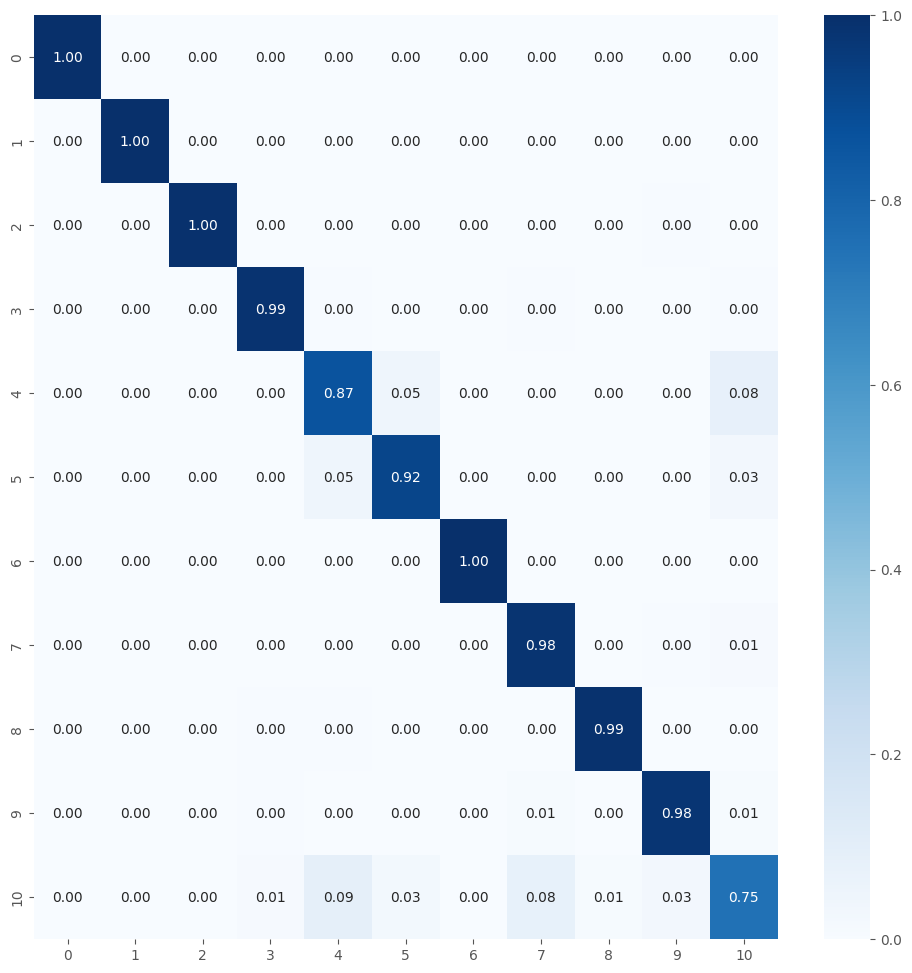


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150011_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_7
- dense_21
- batch_normalization_7
- dropout_14
- dense_22
- dropout_15
- dense_23
Total: 12/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
360/360 [==============================] - 30s 75ms/step - loss: 0.0903 - accuracy: 0.9859 - val_loss: 0.2986 - val_accuracy: 0.9432 - lr: 9.3674e-05
Epoch 2/50
360/360 [==============================] - 27s 75ms/step - loss: 0.0940 - accuracy: 0.9830 - val_loss: 0.2939 - val_accuracy: 0.9383 - lr: 9.3674e-05
Epoch 3/50
360/360 [==============================] - 26s 73ms/step - loss: 0.0777 - accuracy: 0.9895 - val_loss: 0.2944 - val_accuracy: 0.9363 - lr: 9.3674e-05
Epoch 4/50
360/360 [==================

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150011_5.pkl
361/361 [==============================] - 22s 61ms/step - loss: 0.0266 - accuracy: 0.9980
Train Accuracy: 0.998008668422699
Train Log Loss: 0.02662845514714718
78/78 [==============================] - 5s 61ms/step - loss: 0.3409 - accuracy: 0.9495
Validation Accuracy: 0.9494949579238892
Validation Log Loss: 0.3408660292625427
78/78 [==============================] - 5s 63ms/step - loss: 0.2971 - accuracy: 0.9527
Test Accuracy: 0.9527272582054138
Test Log Loss: 0.29707127809524536
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'dinwod': 4, 'ganelp': 5, 'mira': 6, 'sfone': 7, 'sillyp2p': 8, 'wabot': 9, 'wacatac': 10}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   1   0]
 [  0   0   0 222   1   0   0   1   0   0   1]
 [  0   0   0   0 198   9   0   0   0   0  18]
 [

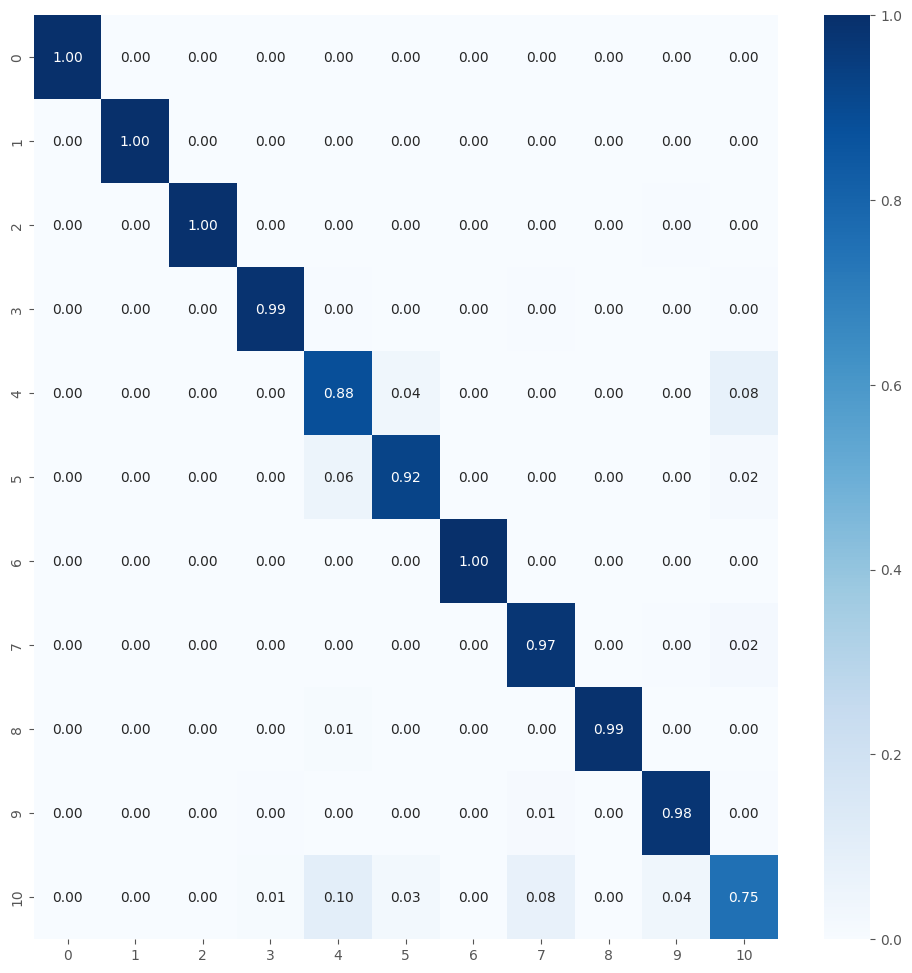


Best fold was 2 with val_accuracy: 0.9513
Average training accuracy in 5-fold: 0.9962493419647217
Average validation precision in 5-fold: 0.9497564911842347

Test Metrics
test_acc_list: [0.9519191980361938, 0.9498990178108215, 0.9535353779792786, 0.9515151381492615, 0.9527272582054138]
Average Test Accuracy with 5-fold: 0.9519191980361938
test_loss_list: [0.26689237356185913, 0.29562413692474365, 0.24920135736465454, 0.2501041293144226, 0.29707127809524536]
Average Test Log Loss with 5-fold: 0.27177865505218507

Precision List: [0.9514051262948439, 0.9489124007598048, 0.9530007767448304, 0.9507856397256244, 0.9524364954035818]
Average Precision List with 5-fold: 0.9513080877857369
Recall List: [0.9519191919191919, 0.94989898989899, 0.9535353535353536, 0.9515151515151515, 0.9527272727272728]
Average Recall List with 5-fold: 0.951919191919192
F1 Score List: [0.9513827281010925, 0.9488672917832012, 0.9528629379180359, 0.9507711545147788, 0.9521319041203803]
Average F1 Score List with 5-f

In [31]:
%%time

num_classes = 11
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

Familias de malware copiadas
source2: /notebooks/train3/all_malware/12
name_save_model: MobileNet_tf_150012
Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
- Allaple.L
- wacatac
- dinwod
- Lollipop
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150012_best.h5
Loading pre-trained model...
Model loaded successfully.

Calculating layer importance (once for all folds)...

Calculando importancia con 12600 muestras (100% confianza, ±0% error)
Incluyendo 93 capas (base + personalizadas)


100%|██████████| 12600/12600 [26:47<00:00,  7.84it/s]
[I 2025-07-16 19:34:20,247] A new study created in memory with name: malware_classification_12classes



Resultados de importancia de capas (incluyendo personalizadas):
----------------------------------------------------------------------
Pos.  | Nombre de Capa                           | Importancia    
----------------------------------------------------------------------
1     | conv_pw_1                                | 0.0142388
2     | conv_dw_1                                | 0.0122774
3     | conv_pw_3                                | 0.0109312
4     | conv_dw_1_bn                             | 0.0081946
5     | conv_pw_2                                | 0.0072423
6     | conv_dw_2_bn                             | 0.0068098
7     | conv_pw_1_bn                             | 0.0054163
8     | conv_pw_3_bn                             | 0.0054019
9     | conv_dw_3_bn                             | 0.0053301
10    | conv1_bn                                 | 0.0052664
11    | conv_dw_4_bn                             | 0.0049497
12    | conv_pw_4                                | 0.00

[I 2025-07-16 19:49:04,771] Trial 0 finished with values: [0.9520089030265808, 0.23838576674461365] and parameters: {'learning_rate': 0.00024032481714224619, 'dropout_rate1': 0.273327840585563, 'dropout_rate2': 0.4587252932149617, 'l2_reg': 0.00015241098105401695, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 15, 'early_stopping_patience': 15, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 2.025665451846637e-06, 'units_dense3': 64, 'dropout_rate3': 0.2887579425329158}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150012_best.h5
Successfully loaded and modified pretrained model
Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.


[I 2025-07-16 19:58:08,152] Trial 1 finished with values: [0.9546130895614624, 0.28033575415611267] and parameters: {'learning_rate': 0.00033517436479803383, 'dropout_rate1': 0.36159852510686863, 'dropout_rate2': 0.46944581223421855, 'l2_reg': 0.00016232555516319694, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 13, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 2.8642235855113968e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150012_best.h5
Successfully loaded and modified pretrained model
Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.


[I 2025-07-16 20:07:40,318] Trial 2 finished with values: [0.953125, 0.2755873501300812] and parameters: {'learning_rate': 0.0012968643423172336, 'dropout_rate1': 0.36927571076648275, 'dropout_rate2': 0.3793665417214359, 'l2_reg': 0.008516689277898578, 'units_dense1': 1024, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 10, 'early_stopping_patience': 19, 'reduce_lr_patience': 15, 'fine_tune_learning_rate': 1.7748867566565644e-06, 'units_dense3': 64, 'dropout_rate3': 0.3337224690604148}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150012_best.h5
Successfully loaded and modified pretrained model
Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.


[I 2025-07-16 20:20:56,362] Trial 3 finished with values: [0.953125, 0.2735184133052826] and parameters: {'learning_rate': 3.5133199431502146e-05, 'dropout_rate1': 0.5453921046307776, 'dropout_rate2': 0.13155635881825042, 'l2_reg': 0.00022007425270110598, 'units_dense1': 1024, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 7, 'early_stopping_patience': 17, 'reduce_lr_patience': 15, 'fine_tune_learning_rate': 3.113053383970806e-05, 'units_dense3': 128, 'dropout_rate3': 0.13689265244489285}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150012_best.h5
Successfully loaded and modified pretrained model
Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.


[I 2025-07-16 20:31:25,872] Trial 4 finished with values: [0.953497052192688, 0.27578285336494446] and parameters: {'learning_rate': 0.0003658315982005448, 'dropout_rate1': 0.3143661806568968, 'dropout_rate2': 0.3563610737751107, 'l2_reg': 2.0867836983959457e-05, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 11, 'early_stopping_patience': 20, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 2.0977152483726683e-06}.


Mejores trials para cada objetivo:
  Trial 0:
    val_accuracy: 0.9520
    val_loss: 0.2384
    Parámetros: {'learning_rate': 0.00024032481714224619, 'dropout_rate1': 0.273327840585563, 'dropout_rate2': 0.4587252932149617, 'l2_reg': 0.00015241098105401695, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 15, 'early_stopping_patience': 15, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 2.025665451846637e-06, 'units_dense3': 64, 'dropout_rate3': 0.2887579425329158}
  Trial 1:
    val_accuracy: 0.9546
    val_loss: 0.2803
    Parámetros: {'learning_rate': 0.00033517436479803383, 'dropout_rate1': 0.36159852510686863, 'dropout_rate2': 0.46944581223421855, 'l2_reg': 0.00016232555516319694, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 13, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 2.8642235855113968e-05}
  Trial 3:
    val_accuracy: 0.9531
    val_loss: 0.2735
    Parámetro

/tmp/ipykernel_29/980747374.py:135: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

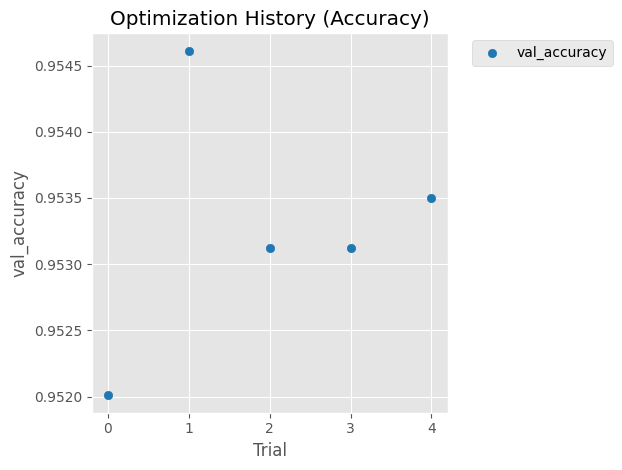

/tmp/ipykernel_29/980747374.py:146: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

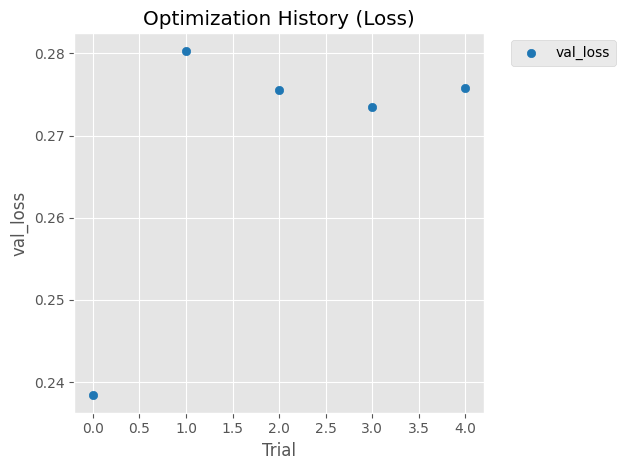

/tmp/ipykernel_29/980747374.py:184: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

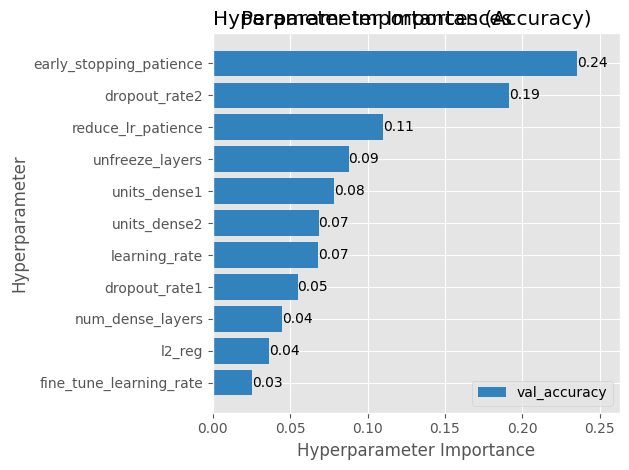


TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150012_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_12_bn
- conv_pw_12_relu
- conv_dw_13
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_13
- dense_39
- batch_normalization_13
- dropout_26
- dense_40
- dropout_27
- dense_41
Total: 18/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
393/393 [==============================] - 34s 77ms/step - loss: 0.1591 - accuracy: 0.9591 - val_loss: 0.2445 - val_accuracy: 0.9382 - lr: 2.4032e-05
Epoch 2/50
393/393 [==============================] - 29s 73ms/step - loss: 0.1172 - accuracy: 0.9710 - val_loss: 0.2419 - val_accuracy: 0.9416 - lr: 2.4032e-05
Epoch 3/50
393/393 [==============================] - 29s 75ms/step - loss: 0.1042 - accuracy: 0.9750 -

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150012_1.pkl
394/394 [==============================] - 24s 59ms/step - loss: 0.0400 - accuracy: 0.9975
Train Accuracy: 0.9974603056907654
Train Log Loss: 0.040042173117399216
85/85 [==============================] - 5s 61ms/step - loss: 0.2875 - accuracy: 0.9544
Validation Accuracy: 0.9544444680213928
Validation Log Loss: 0.28748297691345215
85/85 [==============================] - 5s 60ms/step - loss: 0.2781 - accuracy: 0.9548
Test Accuracy: 0.9548147916793823
Test Log Loss: 0.27805644273757935
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'dinwod': 5, 'ganelp': 6, 'mira': 7, 'sfone': 8, 'sillyp2p': 9, 'wabot': 10, 'wacatac': 11}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   1]
 [  0   0   0 222   2   0   0   0   0   0   0   1]
 [  0   0   0 

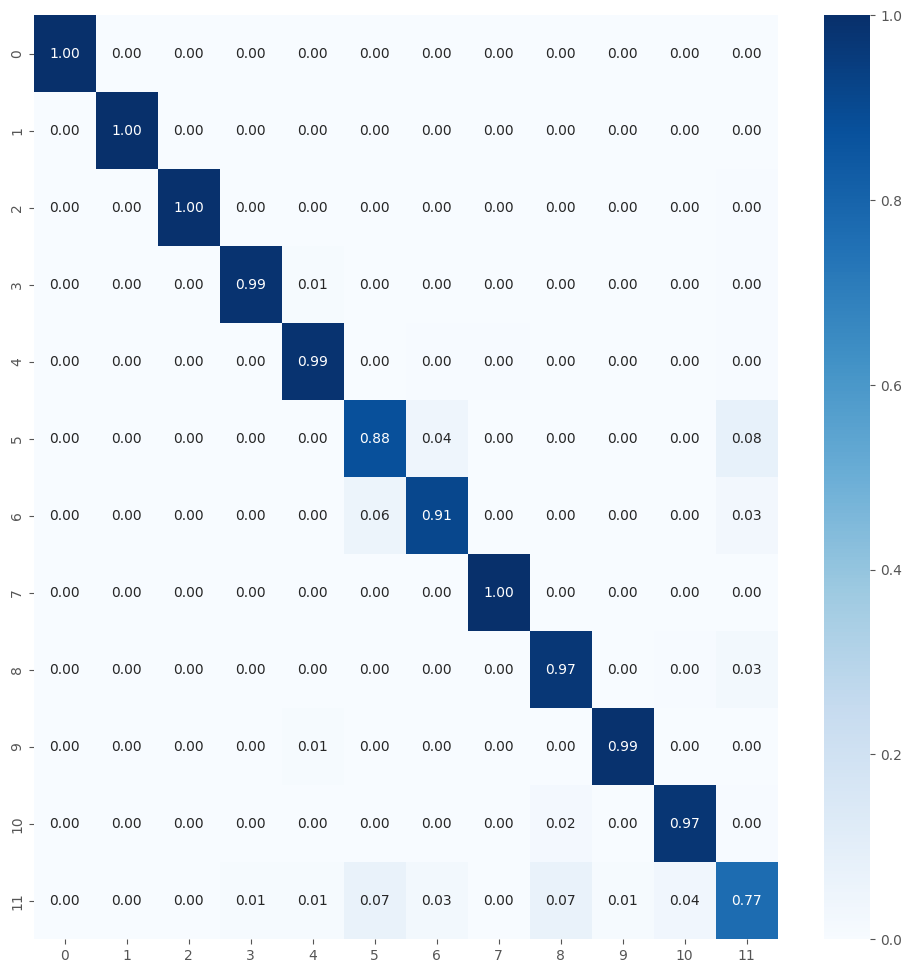


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150012_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_12_bn
- conv_pw_12_relu
- conv_dw_13
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_13
- dense_39
- batch_normalization_13
- dropout_26
- dense_40
- dropout_27
- dense_41
Total: 18/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
393/393 [==============================] - 33s 75ms/step - loss: 0.1494 - accuracy: 0.9608 - val_loss: 0.2484 - val_accuracy: 0.9427 - lr: 2.4032e-05
Epoch 2/50
393/393 [==============================] - 29s 73ms/step - loss: 0.1112 - accuracy: 0.9739 - val_loss: 0.2415 - val_accuracy: 0.9461 - lr: 2.4032e-05
Epoch 3/50
393/393 [==============================] - 29s 73ms/step - loss: 0.0978 - accuracy: 0.9769 -

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150012_2.pkl
394/394 [==============================] - 24s 60ms/step - loss: 0.0383 - accuracy: 0.9976
Train Accuracy: 0.9976190328598022
Train Log Loss: 0.038271814584732056
85/85 [==============================] - 5s 62ms/step - loss: 0.2892 - accuracy: 0.9544
Validation Accuracy: 0.9544444680213928
Validation Log Loss: 0.28916046023368835
85/85 [==============================] - 5s 60ms/step - loss: 0.2859 - accuracy: 0.9533
Test Accuracy: 0.95333331823349
Test Log Loss: 0.28589603304862976
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'dinwod': 5, 'ganelp': 6, 'mira': 7, 'sfone': 8, 'sillyp2p': 9, 'wabot': 10, 'wacatac': 11}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   1]
 [  0   0   0 221   2   0   0   0   0   0   0   2]
 [  0   0   0   

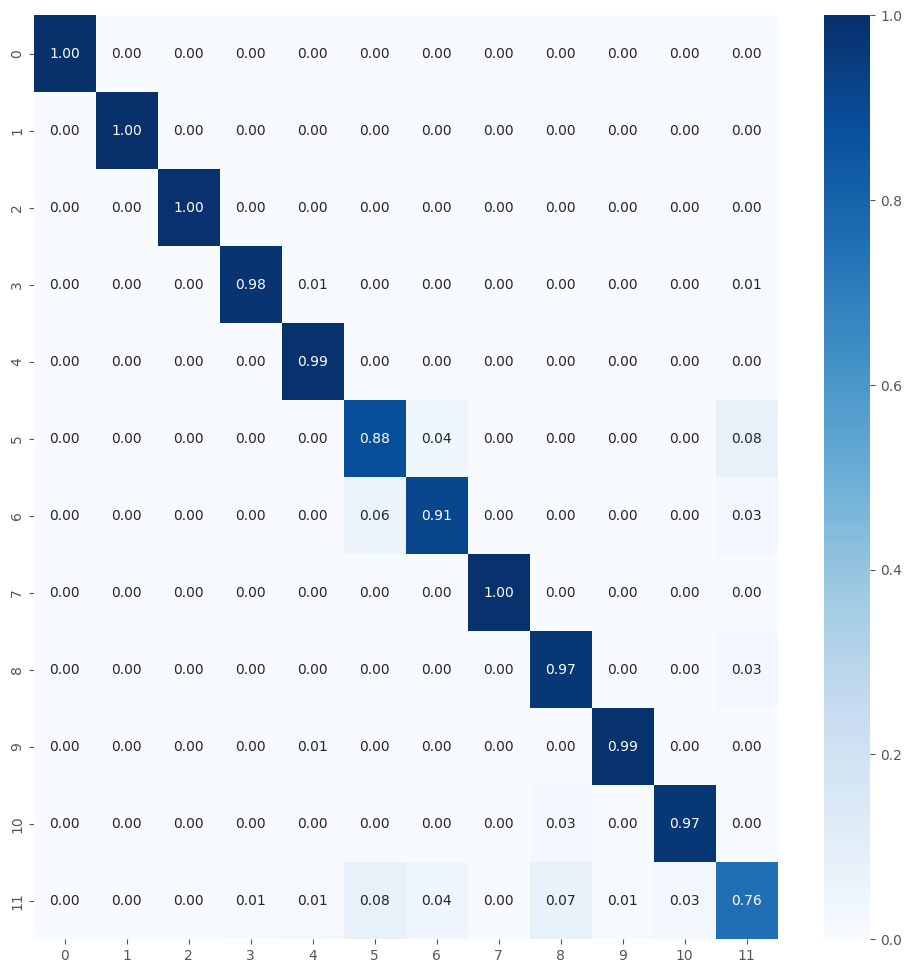


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150012_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_12_bn
- conv_pw_12_relu
- conv_dw_13
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_13
- dense_39
- batch_normalization_13
- dropout_26
- dense_40
- dropout_27
- dense_41
Total: 18/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
393/393 [==============================] - 34s 76ms/step - loss: 0.1592 - accuracy: 0.9582 - val_loss: 0.2564 - val_accuracy: 0.9390 - lr: 2.4032e-05
Epoch 2/50
393/393 [==============================] - 29s 74ms/step - loss: 0.1066 - accuracy: 0.9753 - val_loss: 0.2434 - val_accuracy: 0.9446 - lr: 2.4032e-05
Epoch 3/50
393/393 [==============================] - 28s 72ms/step - loss: 0.1009 - accuracy: 0.9781 -

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150012_3.pkl
394/394 [==============================] - 25s 62ms/step - loss: 0.0418 - accuracy: 0.9970
Train Accuracy: 0.9969841241836548
Train Log Loss: 0.041844554245471954
85/85 [==============================] - 5s 60ms/step - loss: 0.2749 - accuracy: 0.9563
Validation Accuracy: 0.9562963247299194
Validation Log Loss: 0.27492234110832214
85/85 [==============================] - 5s 60ms/step - loss: 0.2823 - accuracy: 0.9567
Test Accuracy: 0.9566666483879089
Test Log Loss: 0.28225019574165344
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'dinwod': 5, 'ganelp': 6, 'mira': 7, 'sfone': 8, 'sillyp2p': 9, 'wabot': 10, 'wacatac': 11}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   1]
 [  0   0   0 222   2   0   0   0   0   0   0   1]
 [  0   0   0 

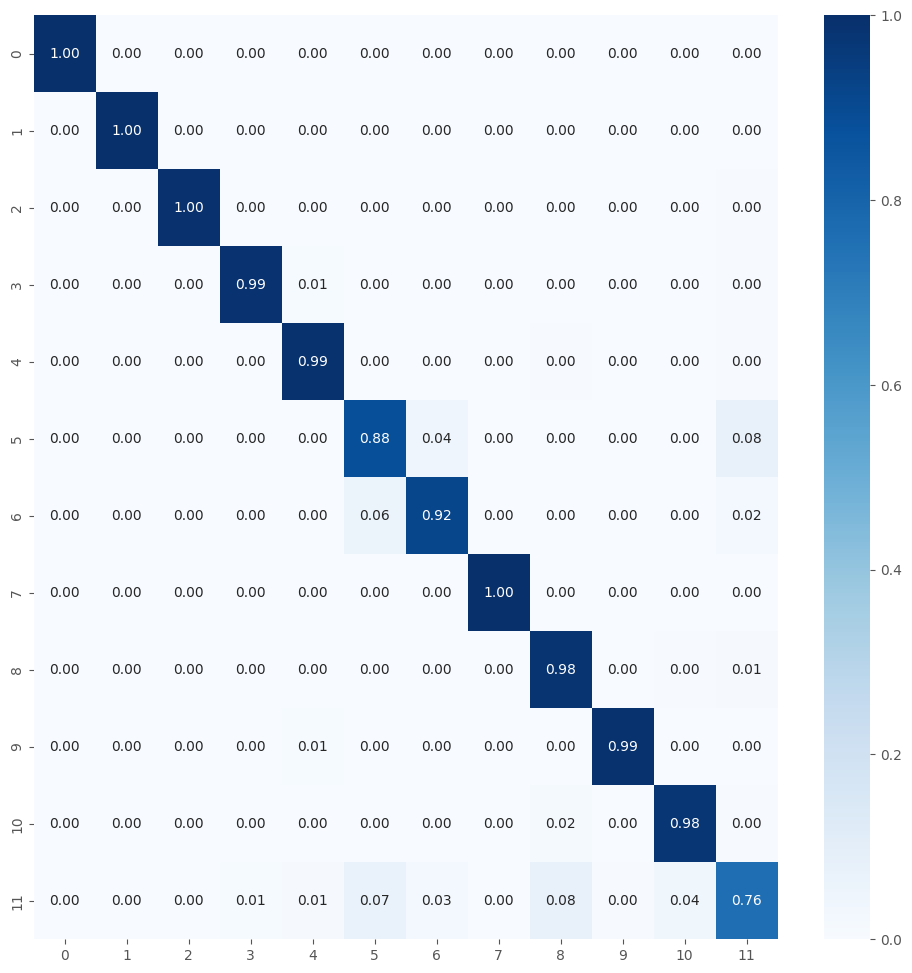


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150012_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_12_bn
- conv_pw_12_relu
- conv_dw_13
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_13
- dense_39
- batch_normalization_13
- dropout_26
- dense_40
- dropout_27
- dense_41
Total: 18/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
393/393 [==============================] - 36s 83ms/step - loss: 0.1640 - accuracy: 0.9567 - val_loss: 0.2660 - val_accuracy: 0.9356 - lr: 2.4032e-05
Epoch 2/50
393/393 [==============================] - 29s 73ms/step - loss: 0.1122 - accuracy: 0.9740 - val_loss: 0.2613 - val_accuracy: 0.9390 - lr: 2.4032e-05
Epoch 3/50
393/393 [==============================] - 29s 73ms/step - loss: 0.1030 - accuracy: 0.9774 -

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150012_4.pkl
394/394 [==============================] - 24s 60ms/step - loss: 0.0476 - accuracy: 0.9954
Train Accuracy: 0.9953968524932861
Train Log Loss: 0.04763286933302879
85/85 [==============================] - 5s 60ms/step - loss: 0.2505 - accuracy: 0.9541
Validation Accuracy: 0.9540740847587585
Validation Log Loss: 0.2504650354385376
85/85 [==============================] - 5s 61ms/step - loss: 0.2470 - accuracy: 0.9537
Test Accuracy: 0.9537037014961243
Test Log Loss: 0.24696271121501923
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'dinwod': 5, 'ganelp': 6, 'mira': 7, 'sfone': 8, 'sillyp2p': 9, 'wabot': 10, 'wacatac': 11}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   1]
 [  0   0   0 222   2   0   0   0   0   0   0   1]
 [  0   0   0   

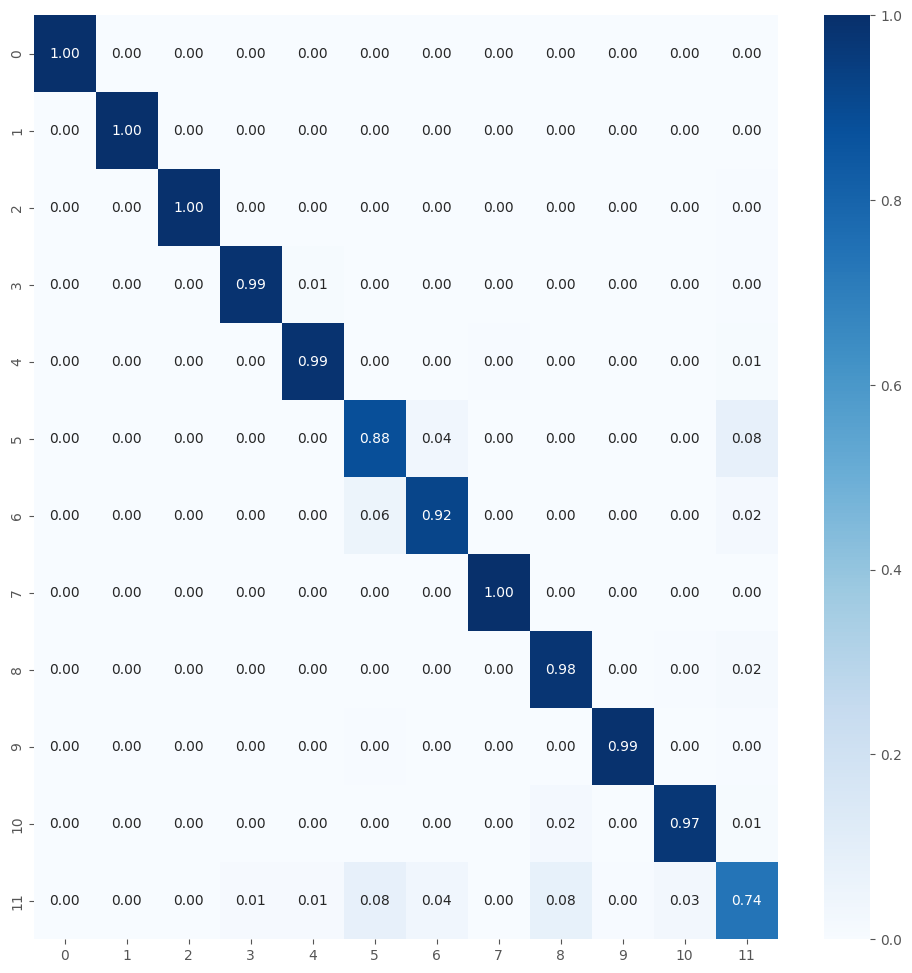


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150012_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_12_bn
- conv_pw_12_relu
- conv_dw_13
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_13
- dense_39
- batch_normalization_13
- dropout_26
- dense_40
- dropout_27
- dense_41
Total: 18/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
393/393 [==============================] - 34s 76ms/step - loss: 0.1569 - accuracy: 0.9600 - val_loss: 0.2527 - val_accuracy: 0.9416 - lr: 2.4032e-05
Epoch 2/50
393/393 [==============================] - 30s 76ms/step - loss: 0.1123 - accuracy: 0.9729 - val_loss: 0.2353 - val_accuracy: 0.9405 - lr: 2.4032e-05
Epoch 3/50
393/393 [==============================] - 29s 73ms/step - loss: 0.1027 - accuracy: 0.9772 -

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150012_5.pkl
394/394 [==============================] - 20s 51ms/step - loss: 0.0404 - accuracy: 0.9971
Train Accuracy: 0.9971428513526917
Train Log Loss: 0.04039870575070381
85/85 [==============================] - 5s 58ms/step - loss: 0.2893 - accuracy: 0.9552
Validation Accuracy: 0.9551851749420166
Validation Log Loss: 0.2893153727054596
85/85 [==============================] - 5s 60ms/step - loss: 0.2803 - accuracy: 0.9552
Test Accuracy: 0.9551851749420166
Test Log Loss: 0.28029921650886536
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'dinwod': 5, 'ganelp': 6, 'mira': 7, 'sfone': 8, 'sillyp2p': 9, 'wabot': 10, 'wacatac': 11}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   1]
 [  0   0   0 222   1   0   0   0   0   0   1   1]
 [  0   0   0   

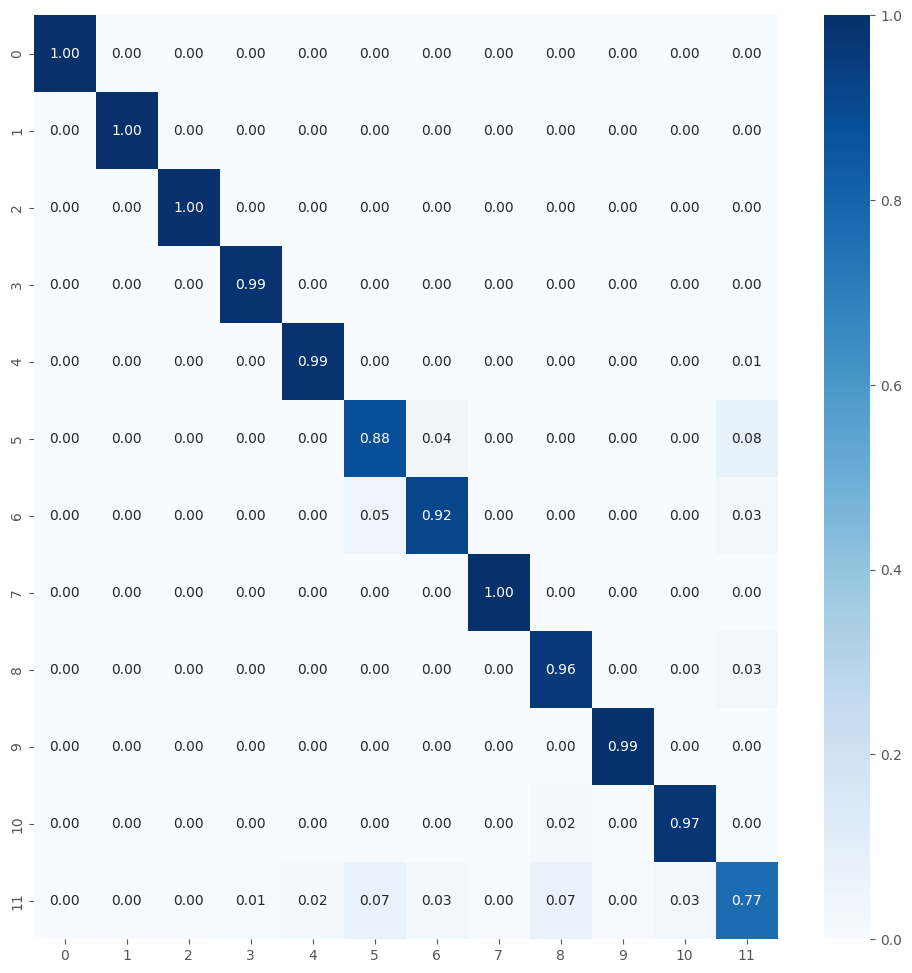


Best fold was 3 with val_accuracy: 0.9568
Average training accuracy in 5-fold: 0.9960216403007507
Average validation precision in 5-fold: 0.9554315447807312

Test Metrics
test_acc_list: [0.9548147916793823, 0.95333331823349, 0.9566666483879089, 0.9537037014961243, 0.9551851749420166]
Average Test Accuracy with 5-fold: 0.9547407269477844
test_loss_list: [0.27805644273757935, 0.28589603304862976, 0.28225019574165344, 0.24696271121501923, 0.28029921650886536]
Average Test Log Loss with 5-fold: 0.27469291985034944

Precision List: [0.9542448155861711, 0.9528031387314514, 0.9561256750428767, 0.9530806133007254, 0.9546950427476308]
Average Precision List with 5-fold: 0.9541898570817711
Recall List: [0.9548148148148147, 0.9533333333333335, 0.9566666666666667, 0.9537037037037037, 0.9551851851851851]
Average Recall List with 5-fold: 0.9547407407407407
F1 Score List: [0.9543435150968845, 0.9528672709578329, 0.9560192449803666, 0.9530520004928674, 0.9547831958085897]
Average F1 Score List with 5

In [32]:
%%time

num_classes = 12
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

Familias de malware copiadas
source2: /notebooks/train3/all_malware/13
name_save_model: MobileNet_tf_150013
Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
- Allaple.L
- wacatac
- dinwod
- Lollipop
- berbew
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150013_best.h5
Loading pre-trained model...
Model loaded successfully.

Calculating layer importance (once for all folds)...

Calculando importancia con 13650 muestras (100% confianza, ±0% error)
Incluyendo 93 capas (base + personalizadas)


100%|██████████| 13650/13650 [28:53<00:00,  7.88it/s]
[I 2025-07-16 22:42:08,111] A new study created in memory with name: malware_classification_13classes



Resultados de importancia de capas (incluyendo personalizadas):
----------------------------------------------------------------------
Pos.  | Nombre de Capa                           | Importancia    
----------------------------------------------------------------------
1     | conv_pw_1                                | 0.0374167
2     | conv_dw_1                                | 0.0317258
3     | conv_pw_3                                | 0.0286020
4     | conv_dw_1_bn                             | 0.0250338
5     | conv_pw_2                                | 0.0179710
6     | conv_dw_2_bn                             | 0.0174885
7     | conv_pw_3_bn                             | 0.0146201
8     | conv1_bn                                 | 0.0144599
9     | conv_pw_1_bn                             | 0.0142756
10    | conv_dw_3_bn                             | 0.0142040
11    | conv_dw_4_bn                             | 0.0130742
12    | conv_pw_4                                | 0.01

[I 2025-07-16 22:54:05,237] Trial 0 finished with values: [0.9543269276618958, 0.2408047616481781] and parameters: {'learning_rate': 8.478932130038288e-05, 'dropout_rate1': 0.3457656627048279, 'dropout_rate2': 0.10939622785262465, 'l2_reg': 0.00016172155602648213, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 12, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 7.859385201203179e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150013_best.h5
Successfully loaded and modified pretrained model
Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.


[I 2025-07-16 23:02:26,281] Trial 1 finished with values: [0.9567307829856873, 0.25041234493255615] and parameters: {'learning_rate': 0.0014914274544390654, 'dropout_rate1': 0.5879745967338147, 'dropout_rate2': 0.2807305219336351, 'l2_reg': 0.003626065246690795, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 8, 'early_stopping_patience': 13, 'reduce_lr_patience': 14, 'fine_tune_learning_rate': 1.4437150340991168e-06, 'units_dense3': 128, 'dropout_rate3': 0.24717419276029262}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150013_best.h5
Successfully loaded and modified pretrained model
Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.


[I 2025-07-16 23:14:18,368] Trial 2 finished with values: [0.9543269276618958, 0.22638987004756927] and parameters: {'learning_rate': 0.0023489584950440907, 'dropout_rate1': 0.33588536778780953, 'dropout_rate2': 0.12823202443673473, 'l2_reg': 0.0001639035145473606, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 11, 'early_stopping_patience': 11, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 9.778448278672126e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150013_best.h5
Successfully loaded and modified pretrained model
Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.


[I 2025-07-16 23:24:13,060] Trial 3 finished with values: [0.9567307829856873, 0.24829347431659698] and parameters: {'learning_rate': 0.00957098451244334, 'dropout_rate1': 0.46022519347835905, 'dropout_rate2': 0.49994628555114573, 'l2_reg': 0.000680423303730494, 'units_dense1': 1024, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 5, 'early_stopping_patience': 15, 'reduce_lr_patience': 15, 'fine_tune_learning_rate': 4.155788601463034e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150013_best.h5
Successfully loaded and modified pretrained model
Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.


[I 2025-07-16 23:35:06,531] Trial 4 finished with values: [0.9570741653442383, 0.2555695176124573] and parameters: {'learning_rate': 2.8033161080810848e-05, 'dropout_rate1': 0.3443253324147196, 'dropout_rate2': 0.1771046742400452, 'l2_reg': 0.00023715331187726456, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 19, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 1.5402433136557892e-06}.


Mejores trials para cada objetivo:
  Trial 2:
    val_accuracy: 0.9543
    val_loss: 0.2264
    Parámetros: {'learning_rate': 0.0023489584950440907, 'dropout_rate1': 0.33588536778780953, 'dropout_rate2': 0.12823202443673473, 'l2_reg': 0.0001639035145473606, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 11, 'early_stopping_patience': 11, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 9.778448278672126e-05}
  Trial 3:
    val_accuracy: 0.9567
    val_loss: 0.2483
    Parámetros: {'learning_rate': 0.00957098451244334, 'dropout_rate1': 0.46022519347835905, 'dropout_rate2': 0.49994628555114573, 'l2_reg': 0.000680423303730494, 'units_dense1': 1024, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 5, 'early_stopping_patience': 15, 'reduce_lr_patience': 15, 'fine_tune_learning_rate': 4.155788601463034e-06}
  Trial 4:
    val_accuracy: 0.9571
    val_loss: 0.2556
    Parámetros: {'learning_rate': 2.8033161080810848e-05, 'dropout_rate1': 

/tmp/ipykernel_29/980747374.py:135: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

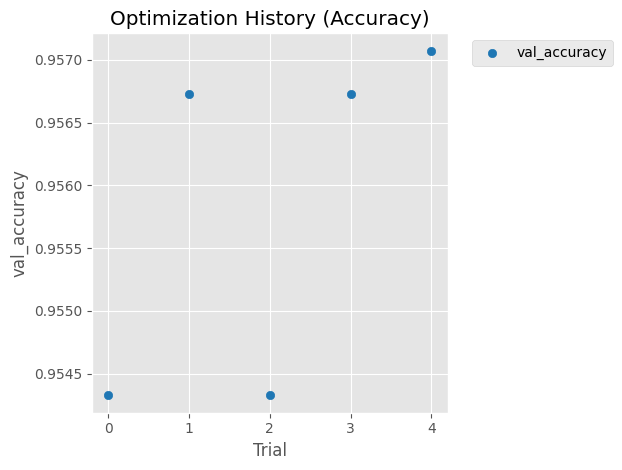

/tmp/ipykernel_29/980747374.py:146: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

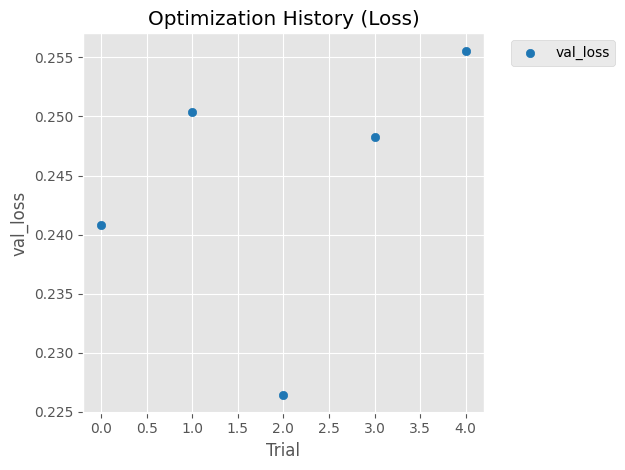

/tmp/ipykernel_29/980747374.py:184: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

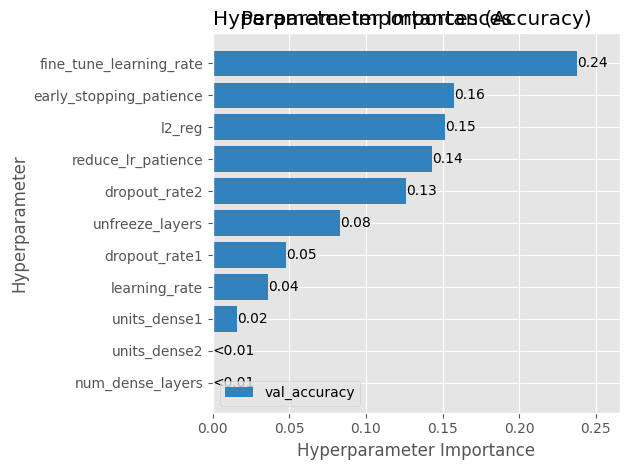


TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150013_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_15
- dense_45
- batch_normalization_15
- dropout_30
- dense_46
- dropout_31
- dense_47
Total: 14/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
426/426 [==============================] - 36s 77ms/step - loss: 0.1573 - accuracy: 0.9587 - val_loss: 0.2647 - val_accuracy: 0.9382 - lr: 2.3490e-04
Epoch 2/50
426/426 [==============================] - 31s 72ms/step - loss: 0.1656 - accuracy: 0.9532 - val_loss: 0.2205 - val_accuracy: 0.9396 - lr: 2.3490e-04
Epoch 3/50
426/426 [==============================] - 32s 76ms/step - loss: 0.1369 - accuracy: 0.9662 - val_loss: 0.2206 - val_accuracy: 0.9430 - lr: 2.3490e-04
Epoch

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150013_1.pkl
427/427 [==============================] - 26s 61ms/step - loss: 0.0283 - accuracy: 0.9974
Train Accuracy: 0.9973626136779785
Train Log Loss: 0.028271842747926712
92/92 [==============================] - 6s 63ms/step - loss: 0.2626 - accuracy: 0.9562
Validation Accuracy: 0.9562393426895142
Validation Log Loss: 0.2625982165336609
92/92 [==============================] - 6s 61ms/step - loss: 0.2381 - accuracy: 0.9559
Test Accuracy: 0.9558974504470825
Test Log Loss: 0.23806524276733398
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'wabot': 11, 'wacatac': 12}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   1   0]
 [  0   0   0 222   1   0   1   0   0   

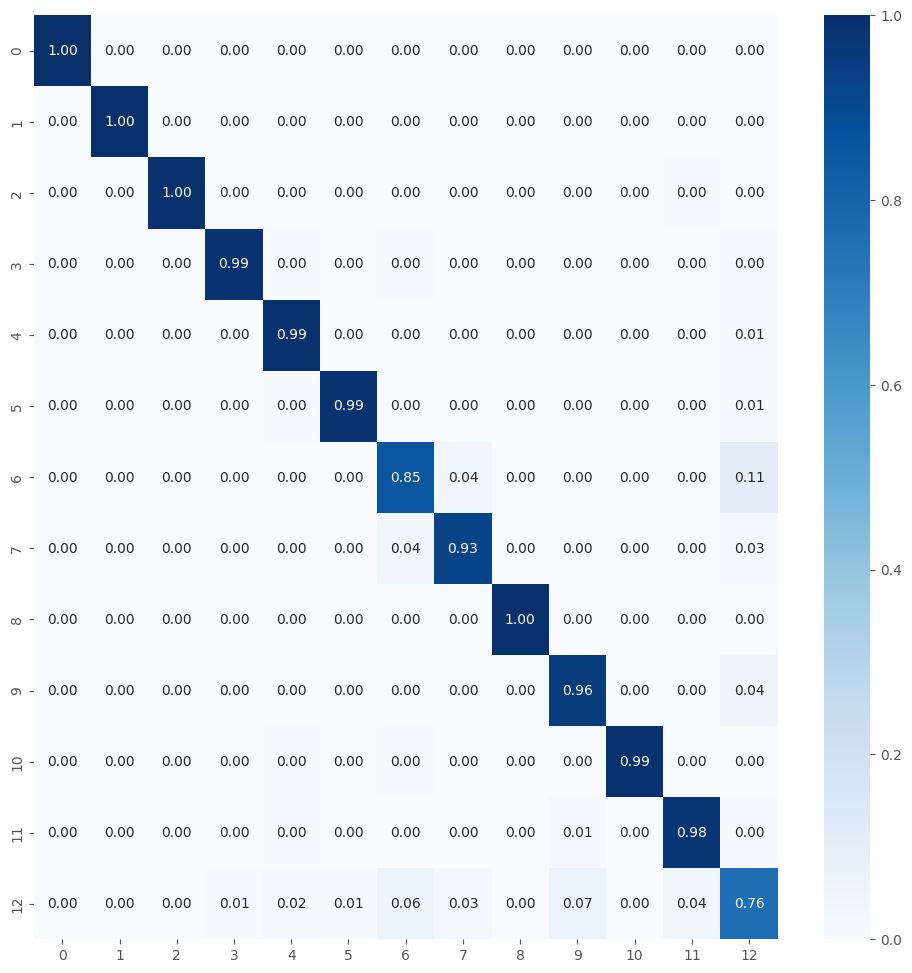


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150013_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_15
- dense_45
- batch_normalization_15
- dropout_30
- dense_46
- dropout_31
- dense_47
Total: 14/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
426/426 [==============================] - 36s 76ms/step - loss: 0.1505 - accuracy: 0.9617 - val_loss: 0.2793 - val_accuracy: 0.9375 - lr: 2.3490e-04
Epoch 2/50
426/426 [==============================] - 32s 74ms/step - loss: 0.1466 - accuracy: 0.9609 - val_loss: 0.2993 - val_accuracy: 0.9128 - lr: 2.3490e-04
Epoch 3/50
426/426 [==============================] - 31s 74ms/step - loss: 0.1427 - accuracy: 0.9641 - val_loss: 0.2447 - val_accuracy: 0.9416 - lr: 2.3490e-04
Epoch

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150013_2.pkl
427/427 [==============================] - 26s 60ms/step - loss: 0.0491 - accuracy: 0.9924
Train Accuracy: 0.9923809766769409
Train Log Loss: 0.049138519912958145
92/92 [==============================] - 6s 61ms/step - loss: 0.2391 - accuracy: 0.9586
Validation Accuracy: 0.9586324691772461
Validation Log Loss: 0.23906216025352478
92/92 [==============================] - 6s 61ms/step - loss: 0.2280 - accuracy: 0.9579
Test Accuracy: 0.9579487442970276
Test Log Loss: 0.22799080610275269
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'wabot': 11, 'wacatac': 12}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   1   0]
 [  0   0   0 221   1   0   0   0   0  

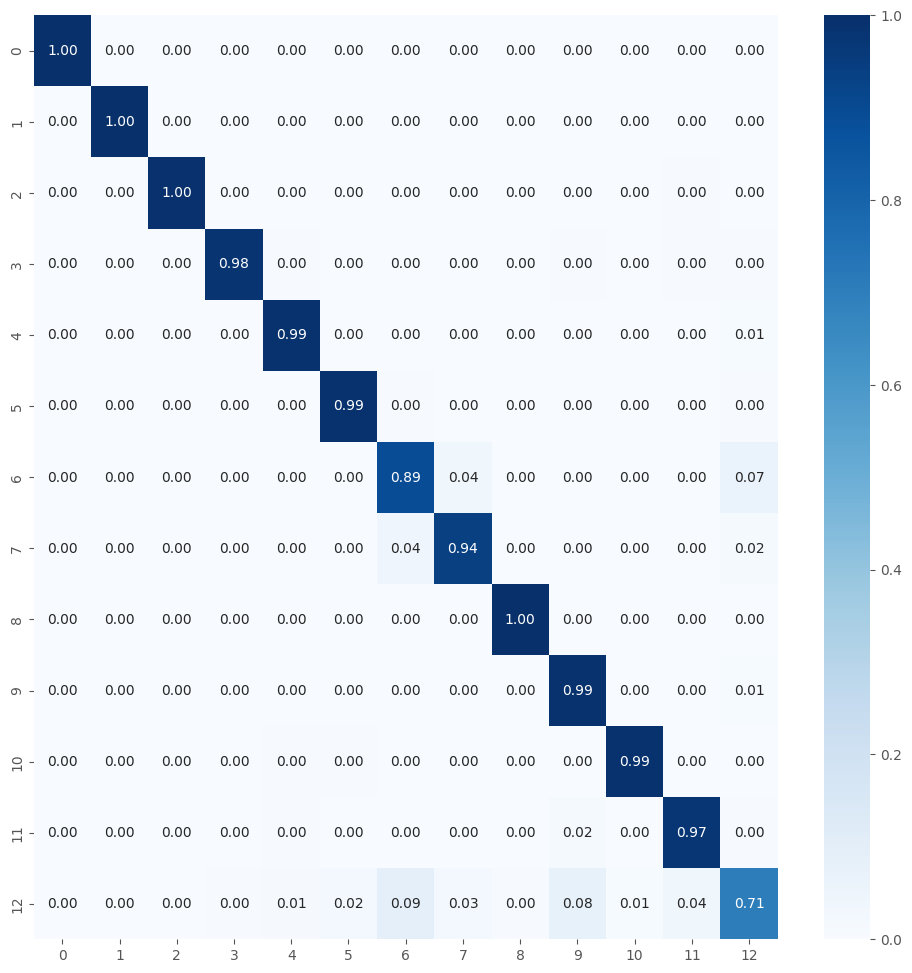


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150013_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_15
- dense_45
- batch_normalization_15
- dropout_30
- dense_46
- dropout_31
- dense_47
Total: 14/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
426/426 [==============================] - 35s 75ms/step - loss: 0.1657 - accuracy: 0.9559 - val_loss: 0.2796 - val_accuracy: 0.9193 - lr: 2.3490e-04
Epoch 2/50
426/426 [==============================] - 31s 73ms/step - loss: 0.1434 - accuracy: 0.9611 - val_loss: 0.3112 - val_accuracy: 0.9135 - lr: 2.3490e-04
Epoch 3/50
426/426 [==============================] - 31s 73ms/step - loss: 0.1446 - accuracy: 0.9625 - val_loss: 0.2531 - val_accuracy: 0.9361 - lr: 2.3490e-04
Epoch

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150013_3.pkl
427/427 [==============================] - 26s 60ms/step - loss: 0.1002 - accuracy: 0.9796
Train Accuracy: 0.9795604348182678
Train Log Loss: 0.10019497573375702
92/92 [==============================] - 6s 59ms/step - loss: 0.2304 - accuracy: 0.9456
Validation Accuracy: 0.945641040802002
Validation Log Loss: 0.23040422797203064
92/92 [==============================] - 6s 62ms/step - loss: 0.2164 - accuracy: 0.9446
Test Accuracy: 0.944615364074707
Test Log Loss: 0.2164124846458435
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'wabot': 11, 'wacatac': 12}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   1   0]
 [  0   0   1 222   1   0   0   0   0   0  

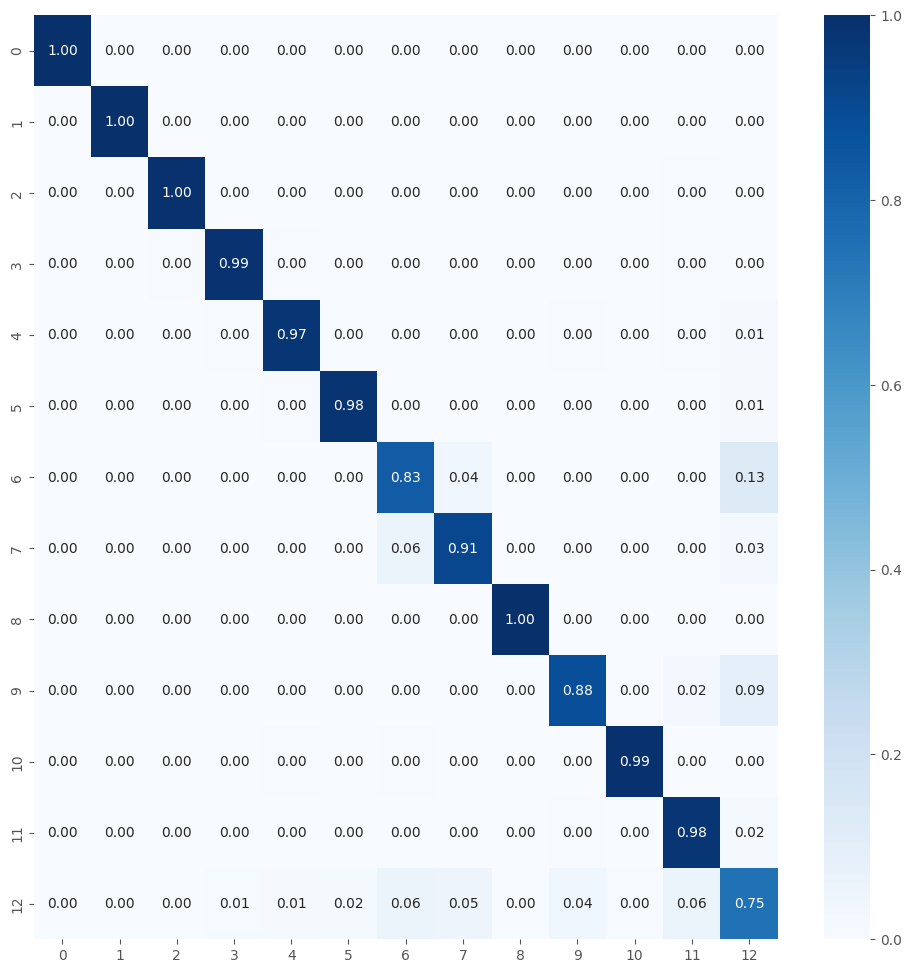


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150013_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_15
- dense_45
- batch_normalization_15
- dropout_30
- dense_46
- dropout_31
- dense_47
Total: 14/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
426/426 [==============================] - 35s 75ms/step - loss: 0.1627 - accuracy: 0.9562 - val_loss: 0.2353 - val_accuracy: 0.9378 - lr: 2.3490e-04
Epoch 2/50
426/426 [==============================] - 32s 76ms/step - loss: 0.1453 - accuracy: 0.9626 - val_loss: 0.2879 - val_accuracy: 0.9334 - lr: 2.3490e-04
Epoch 3/50
426/426 [==============================] - 31s 73ms/step - loss: 0.1409 - accuracy: 0.9641 - val_loss: 0.2490 - val_accuracy: 0.9358 - lr: 2.3490e-04
Epoch

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150013_4.pkl
427/427 [==============================] - 26s 61ms/step - loss: 0.0289 - accuracy: 0.9976
Train Accuracy: 0.9975824356079102
Train Log Loss: 0.028917381539940834
92/92 [==============================] - 6s 60ms/step - loss: 0.2512 - accuracy: 0.9579
Validation Accuracy: 0.9579487442970276
Validation Log Loss: 0.25124070048332214
92/92 [==============================] - 6s 61ms/step - loss: 0.2432 - accuracy: 0.9552
Test Accuracy: 0.9552136659622192
Test Log Loss: 0.24319544434547424
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'wabot': 11, 'wacatac': 12}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   1   0]
 [  0   0   0 222   2   0   0   0   0  

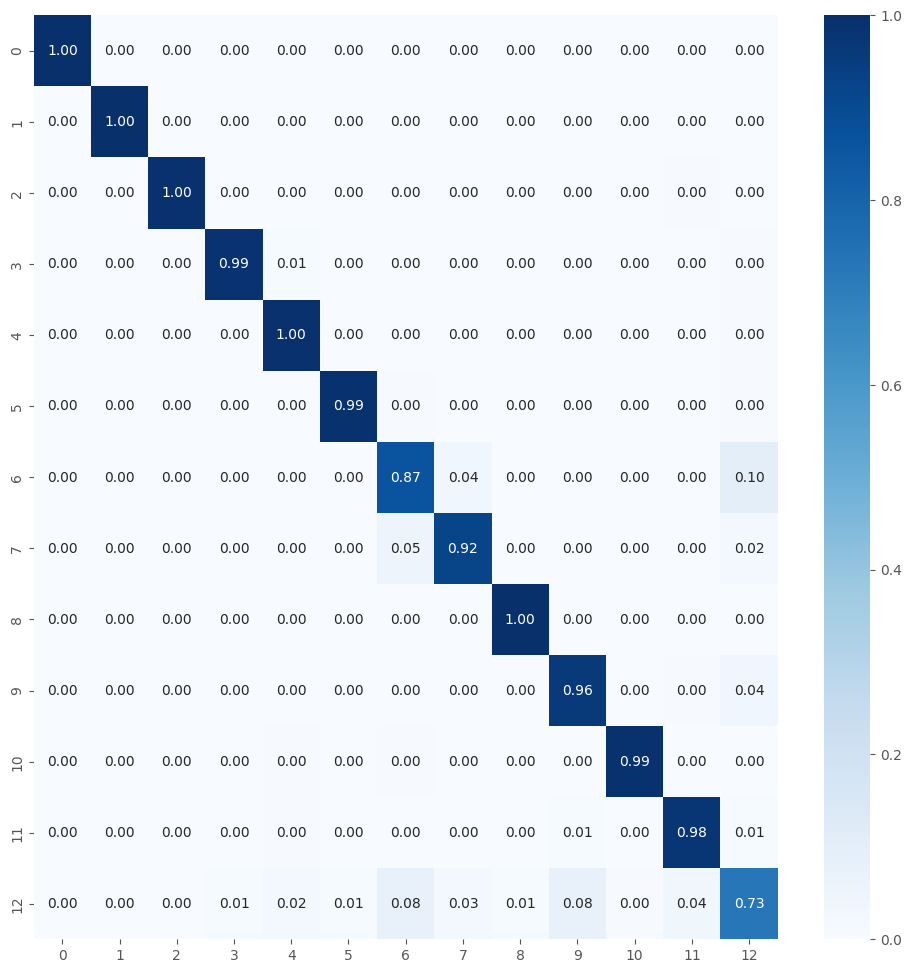


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150013_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_15
- dense_45
- batch_normalization_15
- dropout_30
- dense_46
- dropout_31
- dense_47
Total: 14/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
426/426 [==============================] - 36s 77ms/step - loss: 0.1734 - accuracy: 0.9540 - val_loss: 0.2724 - val_accuracy: 0.9203 - lr: 2.3490e-04
Epoch 2/50
426/426 [==============================] - 32s 74ms/step - loss: 0.1437 - accuracy: 0.9626 - val_loss: 0.3873 - val_accuracy: 0.8771 - lr: 2.3490e-04
Epoch 3/50
426/426 [==============================] - 32s 75ms/step - loss: 0.1379 - accuracy: 0.9659 - val_loss: 0.2238 - val_accuracy: 0.9389 - lr: 2.3490e-04
Epoch

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150013_5.pkl
427/427 [==============================] - 26s 62ms/step - loss: 0.0504 - accuracy: 0.9935
Train Accuracy: 0.99347984790802
Train Log Loss: 0.05035766214132309
92/92 [==============================] - 6s 62ms/step - loss: 0.2023 - accuracy: 0.9590
Validation Accuracy: 0.9589743614196777
Validation Log Loss: 0.20227603614330292
92/92 [==============================] - 6s 59ms/step - loss: 0.1910 - accuracy: 0.9566
Test Accuracy: 0.956581175327301
Test Log Loss: 0.19101938605308533
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'wabot': 11, 'wacatac': 12}

Matriz de Confusión:
[[224   0   0   0   0   0   0   0   0   0   0   0   1]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   1]
 [  0   0   0 221   2   0   0   0   0   0  

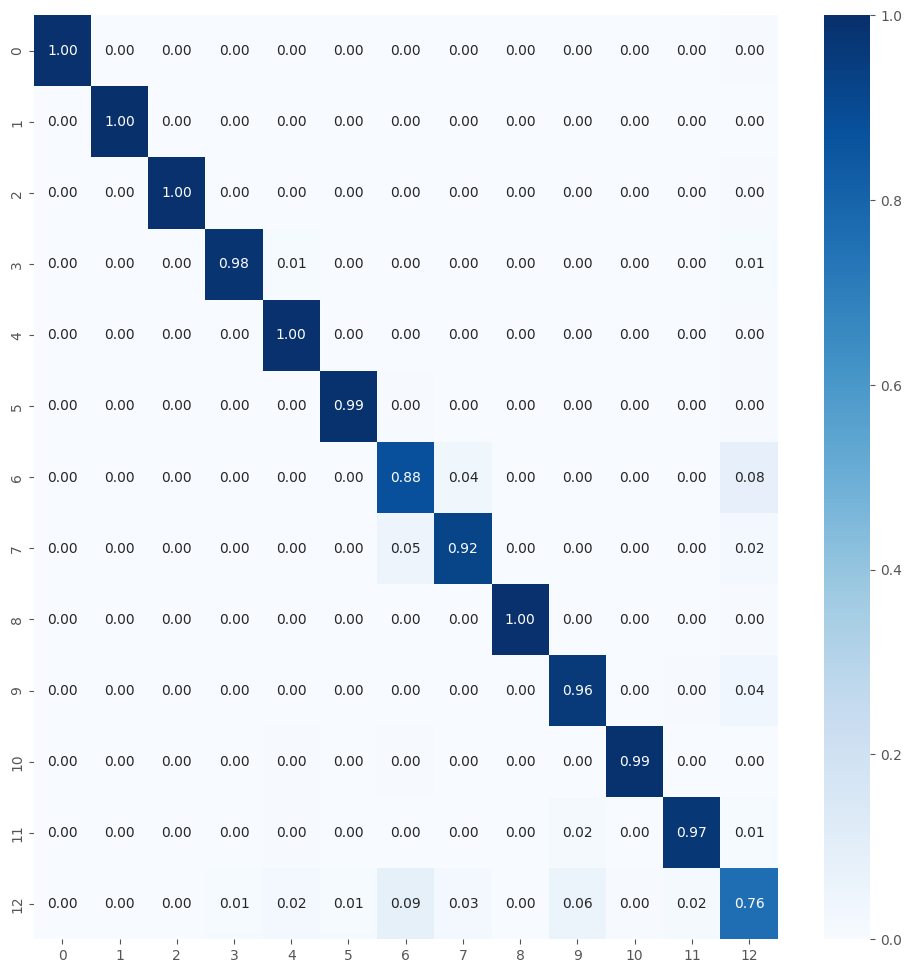


Best fold was 5 with val_accuracy: 0.9595
Average training accuracy in 5-fold: 0.9930386066436767
Average validation precision in 5-fold: 0.9556318640708923

Test Metrics
test_acc_list: [0.9558974504470825, 0.9579487442970276, 0.944615364074707, 0.9552136659622192, 0.956581175327301]
Average Test Accuracy with 5-fold: 0.9540512800216675
test_loss_list: [0.23806524276733398, 0.22799080610275269, 0.2164124846458435, 0.24319544434547424, 0.19101938605308533]
Average Test Log Loss with 5-fold: 0.22333667278289795

Precision List: [0.9554387276371282, 0.9572466754964862, 0.9454099754765461, 0.9542693326432002, 0.9562969274546359]
Average Precision List with 5-fold: 0.9537323277415993
Recall List: [0.9558974358974359, 0.9579487179487179, 0.9446153846153845, 0.9552136752136752, 0.9565811965811964]
Average Recall List with 5-fold: 0.954051282051282
F1 Score List: [0.9555800462015998, 0.9568334568961776, 0.9447597694185229, 0.9545240760384139, 0.9563174717019289]
Average F1 Score List with 5-f

In [33]:
%%time

num_classes = 13
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

Familias de malware copiadas
source2: /notebooks/train3/all_malware/14
name_save_model: MobileNet_tf_150014
Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
- Allaple.L
- wacatac
- dinwod
- Lollipop
- berbew
- small
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150014_best.h5
Loading pre-trained model...
Model loaded successfully.

Calculating layer importance (once for all folds)...

Calculando importancia con 14700 muestras (100% confianza, ±0% error)
Incluyendo 93 capas (base + personalizadas)


100%|██████████| 14700/14700 [31:17<00:00,  7.83it/s] 
[I 2025-07-17 01:43:00,057] A new study created in memory with name: malware_classification_14classes



Resultados de importancia de capas (incluyendo personalizadas):
----------------------------------------------------------------------
Pos.  | Nombre de Capa                           | Importancia    
----------------------------------------------------------------------
1     | conv_pw_1                                | 0.3384278
2     | conv_dw_1                                | 0.2658257
3     | conv_pw_3                                | 0.2067931
4     | conv_dw_1_bn                             | 0.1919769
5     | conv_dw_2_bn                             | 0.1703174
6     | conv_pw_2                                | 0.1510016
7     | conv_dw_3_bn                             | 0.1175689
8     | conv_pw_1_bn                             | 0.1091792
9     | conv_pw_3_bn                             | 0.0972512
10    | conv1_bn                                 | 0.0930273
11    | conv_dw_3                                | 0.0909520
12    | conv_dw_4_bn                             | 0.08

[I 2025-07-17 01:52:29,316] Trial 0 finished with values: [0.9269770383834839, 0.3218305706977844] and parameters: {'learning_rate': 0.001357081956355976, 'dropout_rate1': 0.23251193194712538, 'dropout_rate2': 0.1081233953208157, 'l2_reg': 0.007342444865748599, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 12, 'early_stopping_patience': 14, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 3.0110313211752194e-06, 'units_dense3': 128, 'dropout_rate3': 0.2715606190297604}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150014_best.h5
Successfully loaded and modified pretrained model
Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.


[I 2025-07-17 02:00:17,232] Trial 1 finished with values: [0.9247449040412903, 0.316841185092926] and parameters: {'learning_rate': 0.0017409450011125224, 'dropout_rate1': 0.40928348399911746, 'dropout_rate2': 0.3090865819130771, 'l2_reg': 0.0003361244909843696, 'units_dense1': 512, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 7, 'early_stopping_patience': 13, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 5.6357565924692245e-06, 'units_dense3': 64, 'dropout_rate3': 0.37391391110627914}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150014_best.h5
Successfully loaded and modified pretrained model
Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.


[I 2025-07-17 02:11:20,743] Trial 2 finished with values: [0.925382673740387, 0.318649023771286] and parameters: {'learning_rate': 0.00038780870462583225, 'dropout_rate1': 0.2135835738175818, 'dropout_rate2': 0.18366251135835576, 'l2_reg': 3.129261772581673e-05, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 18, 'reduce_lr_patience': 8, 'fine_tune_learning_rate': 2.495988039775251e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150014_best.h5
Successfully loaded and modified pretrained model
Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.


[I 2025-07-17 02:26:15,696] Trial 3 finished with values: [0.9247449040412903, 0.28882303833961487] and parameters: {'learning_rate': 2.2210996020543636e-05, 'dropout_rate1': 0.5012866885190064, 'dropout_rate2': 0.4660772173503519, 'l2_reg': 0.0001690521574378454, 'units_dense1': 1024, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 15, 'early_stopping_patience': 16, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 2.446614418173738e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150014_best.h5
Successfully loaded and modified pretrained model
Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.


[I 2025-07-17 02:38:59,034] Trial 4 finished with values: [0.9237882494926453, 0.302756667137146] and parameters: {'learning_rate': 0.000789959758772895, 'dropout_rate1': 0.5412477199184997, 'dropout_rate2': 0.32307274924135176, 'l2_reg': 0.0017180942627382685, 'units_dense1': 1024, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 14, 'early_stopping_patience': 10, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 4.98783723742942e-05, 'units_dense3': 32, 'dropout_rate3': 0.3282329466948419}.


Mejores trials para cada objetivo:
  Trial 0:
    val_accuracy: 0.9270
    val_loss: 0.3218
    Parámetros: {'learning_rate': 0.001357081956355976, 'dropout_rate1': 0.23251193194712538, 'dropout_rate2': 0.1081233953208157, 'l2_reg': 0.007342444865748599, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 12, 'early_stopping_patience': 14, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 3.0110313211752194e-06, 'units_dense3': 128, 'dropout_rate3': 0.2715606190297604}
  Trial 2:
    val_accuracy: 0.9254
    val_loss: 0.3186
    Parámetros: {'learning_rate': 0.00038780870462583225, 'dropout_rate1': 0.2135835738175818, 'dropout_rate2': 0.18366251135835576, 'l2_reg': 3.129261772581673e-05, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 18, 'reduce_lr_patience': 8, 'fine_tune_learning_rate': 2.495988039775251e-06}
  Trial 3:
    val_accuracy: 0.9247
    val_loss: 0.2888
    Parámetros: {

/tmp/ipykernel_29/980747374.py:135: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

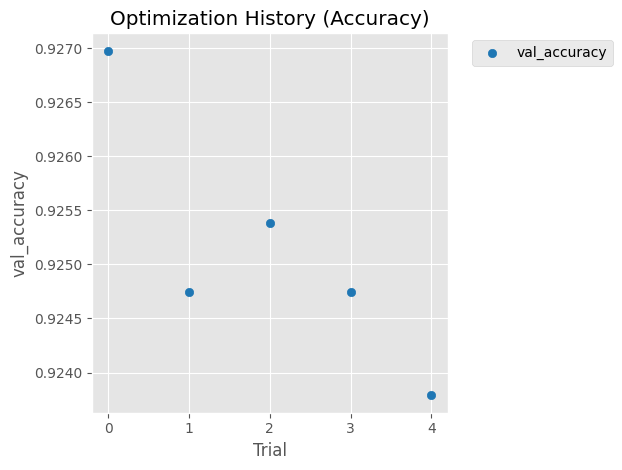

/tmp/ipykernel_29/980747374.py:146: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

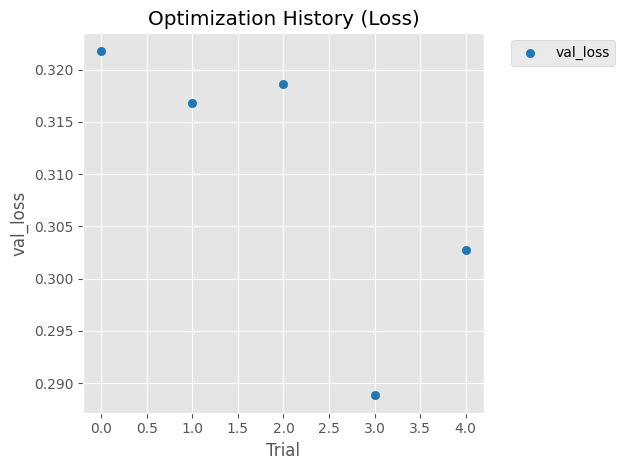

/tmp/ipykernel_29/980747374.py:184: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

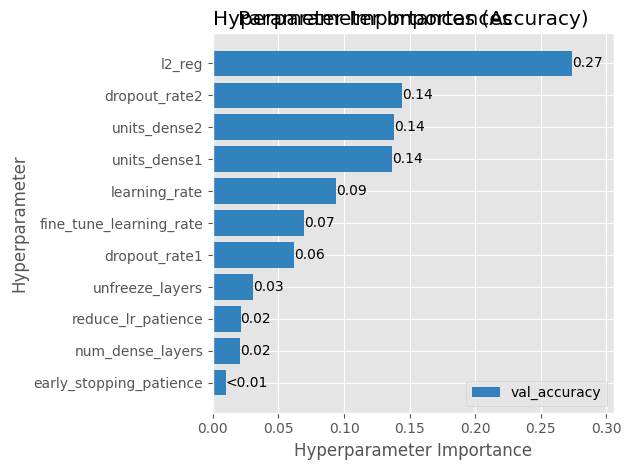


TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150014_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_23
- dense_69
- batch_normalization_23
- dropout_46
- dense_70
- dropout_47
- dense_71
Total: 15/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
459/459 [==============================] - 37s 74ms/step - loss: 0.1966 - accuracy: 0.9243 - val_loss: 0.3877 - val_accuracy: 0.8779 - lr: 1.3571e-04
Epoch 2/50
459/459 [==============================] - 33s 73ms/step - loss: 0.1732 - accuracy: 0.9341 - val_loss: 0.2992 - val_accuracy: 0.9005 - lr: 1.3571e-04
Epoch 3/50
459/459 [==============================] - 33s 72ms/step - loss: 0.1758 - accuracy: 0.9328 - val_loss: 0.3887 - val_accuracy: 0.8862 - lr: 

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150014_1.pkl
460/460 [==============================] - 27s 58ms/step - loss: 0.1428 - accuracy: 0.9531
Train Accuracy: 0.9530612230300903
Train Log Loss: 0.1427619606256485
99/99 [==============================] - 6s 59ms/step - loss: 0.2888 - accuracy: 0.9165
Validation Accuracy: 0.9165079593658447
Validation Log Loss: 0.2888057231903076
99/99 [==============================] - 6s 61ms/step - loss: 0.2781 - accuracy: 0.9156
Test Accuracy: 0.9155555367469788
Test Log Loss: 0.2781275510787964
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'wabot': 12, 'wacatac': 13}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   0   1]
 [  0   0   0 218 

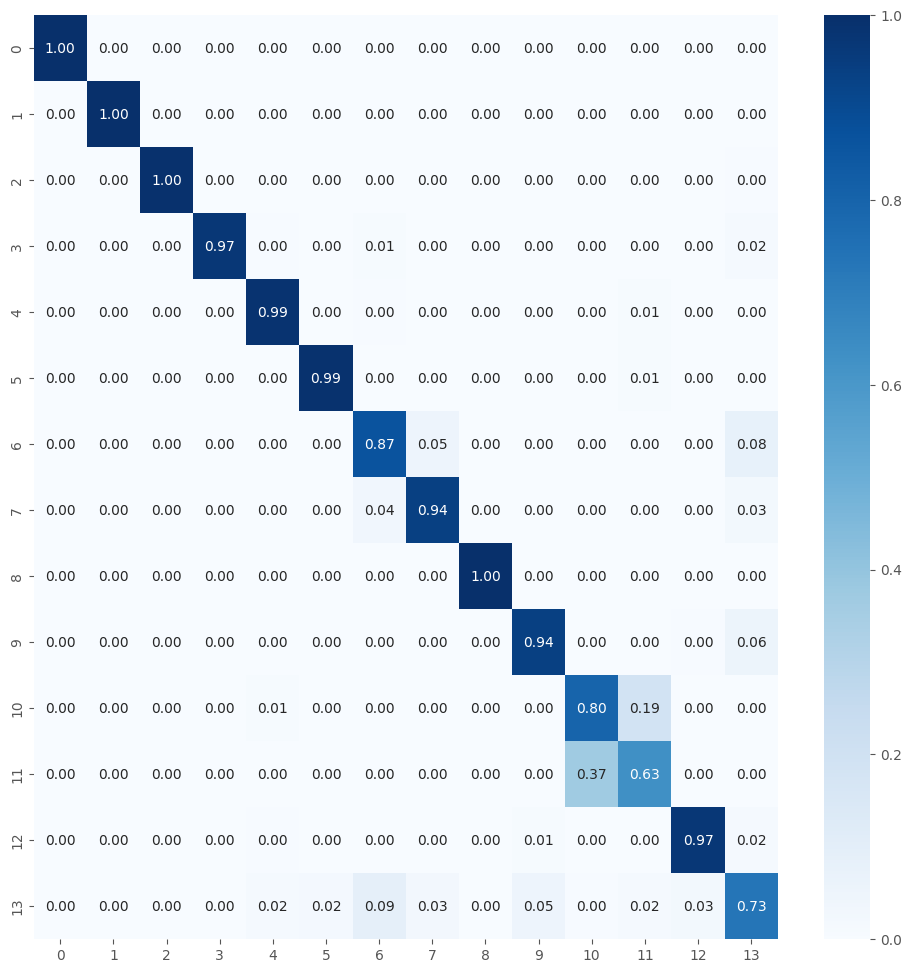


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150014_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_23
- dense_69
- batch_normalization_23
- dropout_46
- dense_70
- dropout_47
- dense_71
Total: 15/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
459/459 [==============================] - 37s 73ms/step - loss: 0.1886 - accuracy: 0.9296 - val_loss: 0.3905 - val_accuracy: 0.8763 - lr: 1.3571e-04
Epoch 2/50
459/459 [==============================] - 35s 75ms/step - loss: 0.1760 - accuracy: 0.9341 - val_loss: 0.3059 - val_accuracy: 0.9101 - lr: 1.3571e-04
Epoch 3/50
459/459 [==============================] - 34s 74ms/step - loss: 0.1788 - accuracy: 0.9324 - val_loss: 0.3290 - val_accuracy: 0.8893 - lr: 

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150014_2.pkl
460/460 [==============================] - 28s 61ms/step - loss: 0.0754 - accuracy: 0.9730
Train Accuracy: 0.9729931950569153
Train Log Loss: 0.07538880407810211
99/99 [==============================] - 6s 55ms/step - loss: 0.3260 - accuracy: 0.9283
Validation Accuracy: 0.9282539486885071
Validation Log Loss: 0.3259906768798828
99/99 [==============================] - 6s 62ms/step - loss: 0.3075 - accuracy: 0.9359
Test Accuracy: 0.9358730316162109
Test Log Loss: 0.30753111839294434
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'wabot': 12, 'wacatac': 13}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   1   0]
 [  0   0   0 22

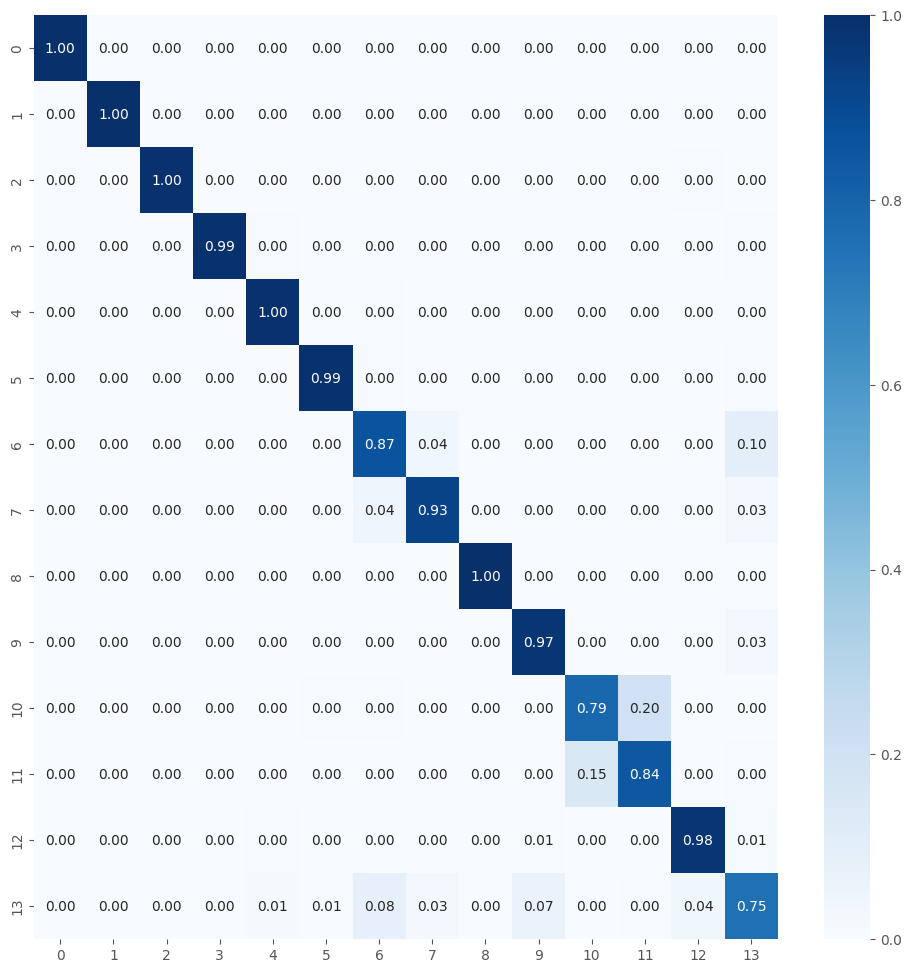


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150014_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_23
- dense_69
- batch_normalization_23
- dropout_46
- dense_70
- dropout_47
- dense_71
Total: 15/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
459/459 [==============================] - 38s 75ms/step - loss: 0.1949 - accuracy: 0.9268 - val_loss: 0.3094 - val_accuracy: 0.8925 - lr: 1.3571e-04
Epoch 2/50
459/459 [==============================] - 34s 74ms/step - loss: 0.1699 - accuracy: 0.9343 - val_loss: 0.3854 - val_accuracy: 0.9011 - lr: 1.3571e-04
Epoch 3/50
459/459 [==============================] - 33s 72ms/step - loss: 0.1747 - accuracy: 0.9340 - val_loss: 0.3474 - val_accuracy: 0.8760 - lr: 

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150014_3.pkl
460/460 [==============================] - 27s 59ms/step - loss: 0.0741 - accuracy: 0.9750
Train Accuracy: 0.9749659895896912
Train Log Loss: 0.07414954155683517
99/99 [==============================] - 6s 60ms/step - loss: 0.3236 - accuracy: 0.9283
Validation Accuracy: 0.9282539486885071
Validation Log Loss: 0.32359254360198975
99/99 [==============================] - 6s 62ms/step - loss: 0.3171 - accuracy: 0.9314
Test Accuracy: 0.9314285516738892
Test Log Loss: 0.3170526623725891
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'wabot': 12, 'wacatac': 13}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   1   0]
 [  0   0   0 22

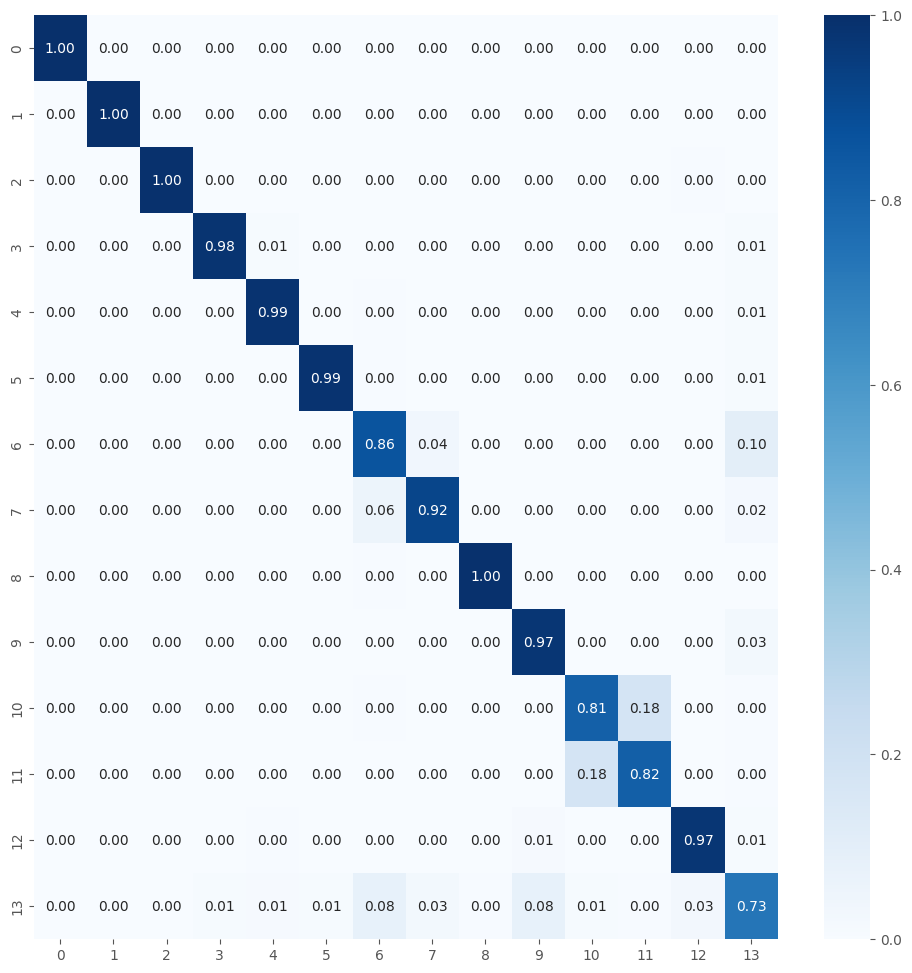


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150014_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_23
- dense_69
- batch_normalization_23
- dropout_46
- dense_70
- dropout_47
- dense_71
Total: 15/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
459/459 [==============================] - 36s 72ms/step - loss: 0.1912 - accuracy: 0.9255 - val_loss: 0.3377 - val_accuracy: 0.8922 - lr: 1.3571e-04
Epoch 2/50
459/459 [==============================] - 33s 72ms/step - loss: 0.1785 - accuracy: 0.9333 - val_loss: 0.3236 - val_accuracy: 0.8903 - lr: 1.3571e-04
Epoch 3/50
459/459 [==============================] - 34s 73ms/step - loss: 0.1732 - accuracy: 0.9340 - val_loss: 0.3077 - val_accuracy: 0.9037 - lr: 

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150014_4.pkl
460/460 [==============================] - 28s 61ms/step - loss: 0.0931 - accuracy: 0.9652
Train Accuracy: 0.9651700854301453
Train Log Loss: 0.09308061748743057
99/99 [==============================] - 6s 58ms/step - loss: 0.3062 - accuracy: 0.9273
Validation Accuracy: 0.9273015856742859
Validation Log Loss: 0.306247740983963
99/99 [==============================] - 6s 58ms/step - loss: 0.3036 - accuracy: 0.9235
Test Accuracy: 0.9234920740127563
Test Log Loss: 0.3036133348941803
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'wabot': 12, 'wacatac': 13}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   1   0]
 [  0   0   0 221 

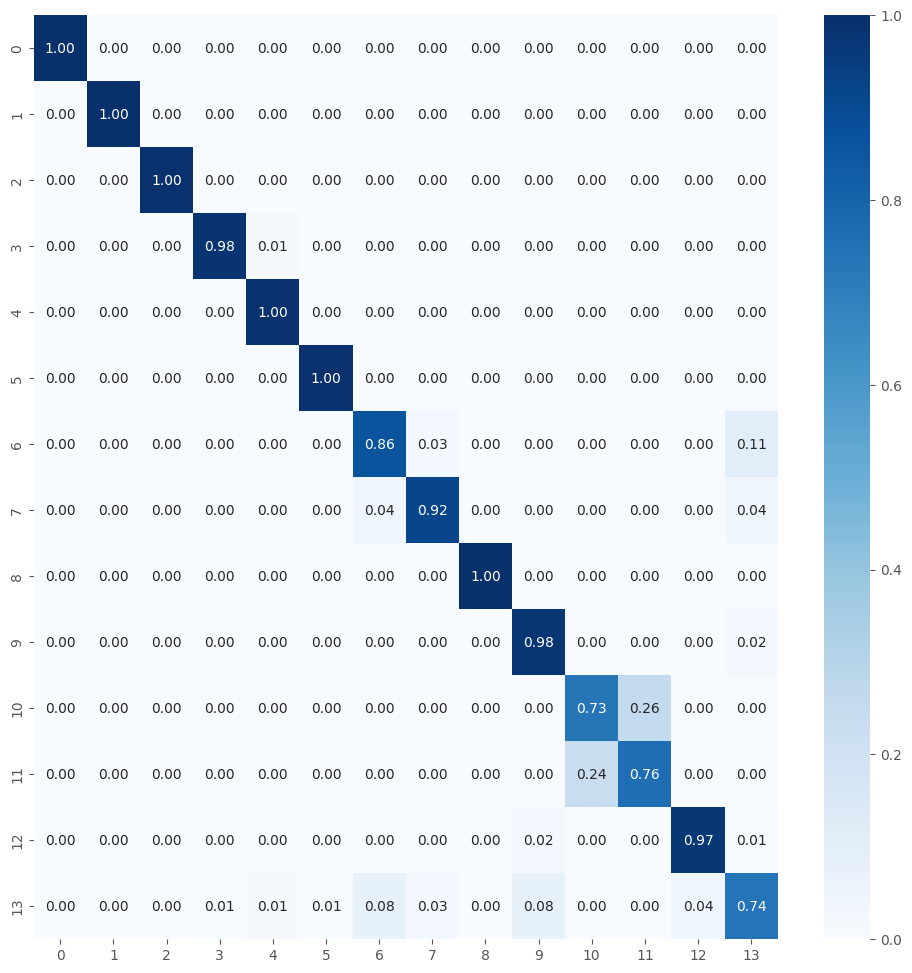


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150014_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_23
- dense_69
- batch_normalization_23
- dropout_46
- dense_70
- dropout_47
- dense_71
Total: 15/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
459/459 [==============================] - 38s 75ms/step - loss: 0.1878 - accuracy: 0.9263 - val_loss: 0.3435 - val_accuracy: 0.8871 - lr: 1.3571e-04
Epoch 2/50
459/459 [==============================] - 34s 74ms/step - loss: 0.1784 - accuracy: 0.9303 - val_loss: 0.3063 - val_accuracy: 0.8941 - lr: 1.3571e-04
Epoch 3/50
459/459 [==============================] - 34s 74ms/step - loss: 0.1867 - accuracy: 0.9292 - val_loss: 0.3533 - val_accuracy: 0.8916 - lr: 

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150014_5.pkl
460/460 [==============================] - 28s 60ms/step - loss: 0.1418 - accuracy: 0.9494
Train Accuracy: 0.9493877291679382
Train Log Loss: 0.1417866051197052
99/99 [==============================] - 6s 60ms/step - loss: 0.2928 - accuracy: 0.9175
Validation Accuracy: 0.9174603223800659
Validation Log Loss: 0.2928241789340973
99/99 [==============================] - 6s 61ms/step - loss: 0.2838 - accuracy: 0.9178
Test Accuracy: 0.9177777767181396
Test Log Loss: 0.2838098108768463
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'wabot': 12, 'wacatac': 13}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   0   1]
 [  0   0   0 221 

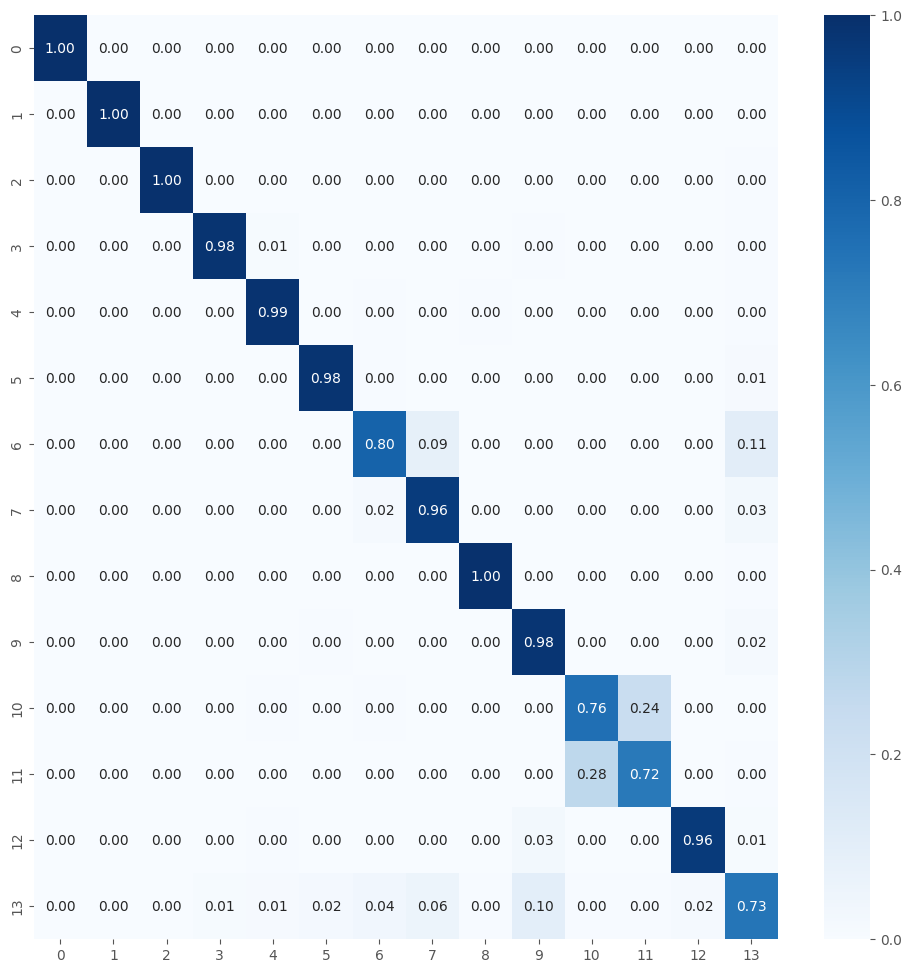


Best fold was 2 with val_accuracy: 0.9302
Average training accuracy in 5-fold: 0.960008180141449
Average validation precision in 5-fold: 0.9239158153533935

Test Metrics
test_acc_list: [0.9155555367469788, 0.9358730316162109, 0.9314285516738892, 0.9234920740127563, 0.9177777767181396]
Average Test Accuracy with 5-fold: 0.924825394153595
test_loss_list: [0.2781275510787964, 0.30753111839294434, 0.3170526623725891, 0.3036133348941803, 0.2838098108768463]
Average Test Log Loss with 5-fold: 0.29802689552307127

Precision List: [0.916138312374559, 0.9353011463281004, 0.930928446080241, 0.9228117692227634, 0.917859074076268]
Average Precision List with 5-fold: 0.9246077496163864
Recall List: [0.9155555555555556, 0.9358730158730159, 0.9314285714285713, 0.9234920634920635, 0.9177777777777777]
Average Recall List with 5-fold: 0.9248253968253968
F1 Score List: [0.9151297895806447, 0.9353454192860012, 0.9310178999126238, 0.9229370835751362, 0.91707166651523]
Average F1 Score List with 5-fold: 0.

In [34]:
%%time

num_classes = 14
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

Familias de malware copiadas
source2: /notebooks/train3/all_malware/15
name_save_model: MobileNet_tf_150015
Found 15750 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
- Allaple.L
- wacatac
- dinwod
- Lollipop
- berbew
- small
- upatre
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150015_best.h5
Loading pre-trained model...
Model loaded successfully.

Calculating layer importance (once for all folds)...

Calculando importancia con 15750 muestras (100% confianza, ±0% error)
Incluyendo 93 capas (base + personalizadas)


100%|██████████| 15750/15750 [33:01<00:00,  7.95it/s]
[I 2025-07-17 05:06:58,442] A new study created in memory with name: malware_classification_15classes



Resultados de importancia de capas (incluyendo personalizadas):
----------------------------------------------------------------------
Pos.  | Nombre de Capa                           | Importancia    
----------------------------------------------------------------------
1     | conv_pw_1                                | 0.1733577
2     | conv_dw_1                                | 0.1510274
3     | conv_pw_3                                | 0.1109991
4     | conv_dw_1_bn                             | 0.1011790
5     | conv_dw_2_bn                             | 0.0839061
6     | conv_pw_2                                | 0.0798875
7     | conv_dw_3_bn                             | 0.0624766
8     | conv_pw_1_bn                             | 0.0553409
9     | conv_pw_3_bn                             | 0.0531230
10    | conv_dw_3                                | 0.0494123
11    | conv1_bn                                 | 0.0481109
12    | conv_dw_4_bn                             | 0.04

[I 2025-07-17 05:36:39,483] Trial 0 finished with values: [0.9190475940704346, 0.29099640250205994] and parameters: {'learning_rate': 0.0003572601783380591, 'dropout_rate1': 0.44371512908228683, 'dropout_rate2': 0.14949446306302458, 'l2_reg': 0.0025154424331665115, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 15, 'early_stopping_patience': 20, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 1.4244333115368794e-06, 'units_dense3': 64, 'dropout_rate3': 0.2841607320498747}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150015_best.h5
Successfully loaded and modified pretrained model
Found 15750 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.


[I 2025-07-17 05:48:31,317] Trial 1 finished with values: [0.9288690686225891, 0.3271782398223877] and parameters: {'learning_rate': 0.0005048732576835213, 'dropout_rate1': 0.20715628938505662, 'dropout_rate2': 0.3317434652686896, 'l2_reg': 1.39838153625056e-05, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 5, 'early_stopping_patience': 18, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 1.6043935287298905e-05, 'units_dense3': 128, 'dropout_rate3': 0.24807145999348054}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150015_best.h5
Successfully loaded and modified pretrained model
Found 15750 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.


[I 2025-07-17 05:58:02,762] Trial 2 finished with values: [0.930654764175415, 0.31907087564468384] and parameters: {'learning_rate': 4.2352857020524464e-05, 'dropout_rate1': 0.23352068206140766, 'dropout_rate2': 0.16534381265578882, 'l2_reg': 0.0062494004772988745, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 13, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 2.039818584511696e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150015_best.h5
Successfully loaded and modified pretrained model
Found 15750 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.


[I 2025-07-17 06:06:15,859] Trial 3 finished with values: [0.9291666746139526, 0.3160114586353302] and parameters: {'learning_rate': 0.0004532410874527388, 'dropout_rate1': 0.4027165834112751, 'dropout_rate2': 0.3777152109054166, 'l2_reg': 0.000596364653085392, 'units_dense1': 1024, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 8, 'early_stopping_patience': 10, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 2.4834360385709617e-05, 'units_dense3': 128, 'dropout_rate3': 0.1623699419825625}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150015_best.h5
Successfully loaded and modified pretrained model
Found 15750 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.


[I 2025-07-17 06:14:37,814] Trial 4 finished with values: [0.9205357432365417, 0.3130011558532715] and parameters: {'learning_rate': 0.00423936355196085, 'dropout_rate1': 0.29172902583853905, 'dropout_rate2': 0.4837871961579705, 'l2_reg': 0.00024515369547008795, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 10, 'early_stopping_patience': 13, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 2.9685628310806115e-05, 'units_dense3': 32, 'dropout_rate3': 0.15560963987778798}.


Mejores trials para cada objetivo:
  Trial 0:
    val_accuracy: 0.9190
    val_loss: 0.2910
    Parámetros: {'learning_rate': 0.0003572601783380591, 'dropout_rate1': 0.44371512908228683, 'dropout_rate2': 0.14949446306302458, 'l2_reg': 0.0025154424331665115, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 15, 'early_stopping_patience': 20, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 1.4244333115368794e-06, 'units_dense3': 64, 'dropout_rate3': 0.2841607320498747}
  Trial 2:
    val_accuracy: 0.9307
    val_loss: 0.3191
    Parámetros: {'learning_rate': 4.2352857020524464e-05, 'dropout_rate1': 0.23352068206140766, 'dropout_rate2': 0.16534381265578882, 'l2_reg': 0.0062494004772988745, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 13, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 2.039818584511696e-06}
  Trial 3:
    val_accuracy: 0.9292
    val_loss: 0.3160
    Parámetros

/tmp/ipykernel_29/980747374.py:135: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

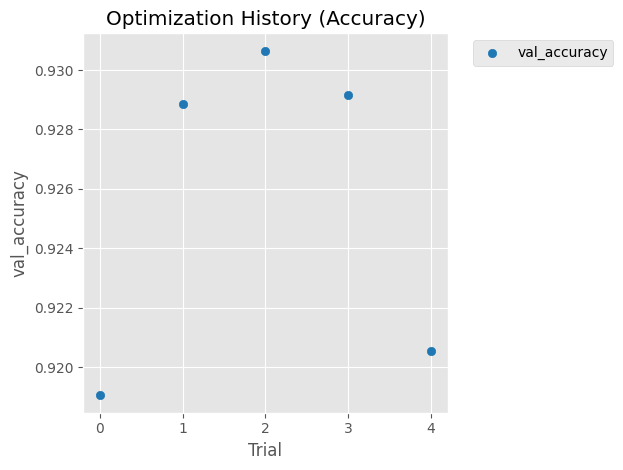

/tmp/ipykernel_29/980747374.py:146: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

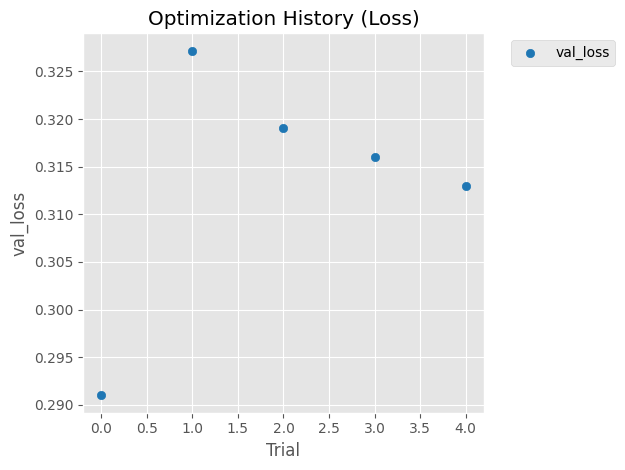

/tmp/ipykernel_29/980747374.py:184: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

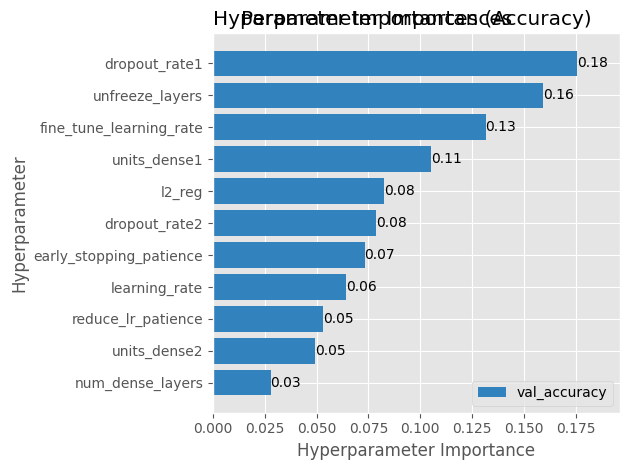


TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150015_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_12_bn
- conv_pw_12_relu
- conv_dw_13
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_28
- dense_84
- batch_normalization_28
- dropout_56
- dense_85
- dropout_57
- dense_86
Total: 18/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
492/492 [==============================] - 42s 76ms/step - loss: 0.2117 - accuracy: 0.9223 - val_loss: 0.2998 - val_accuracy: 0.9128 - lr: 3.5726e-05
Epoch 2/50
492/492 [==============================] - 33s 68ms/step - loss: 0.1687 - accuracy: 0.9349 - val_loss: 0.2981 - val_accuracy: 0.9003 - lr: 3.5726e-05
Epoch 3/50
492/492 [==============================] - 36s 72ms/step - loss: 0.1565 - accuracy: 0.9412 -

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150015_1.pkl
493/493 [==============================] - 30s 61ms/step - loss: 0.0843 - accuracy: 0.9685
Train Accuracy: 0.9685079455375671
Train Log Loss: 0.08427271246910095
106/106 [==============================] - 7s 61ms/step - loss: 0.3290 - accuracy: 0.9253
Validation Accuracy: 0.9253333210945129
Validation Log Loss: 0.3290102779865265
106/106 [==============================] - 7s 62ms/step - loss: 0.3107 - accuracy: 0.9321
Test Accuracy: 0.9321481585502625
Test Log Loss: 0.31072843074798584
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'upatre': 12, 'wabot': 13, 'wacatac': 14}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0

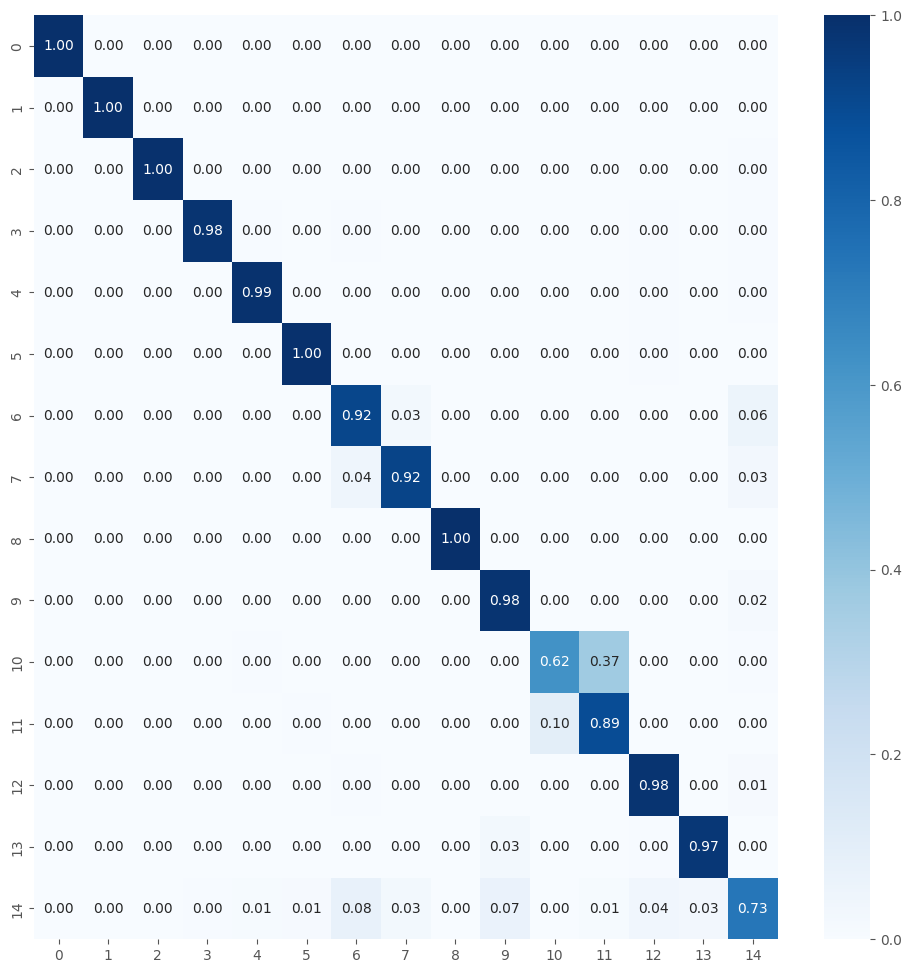


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150015_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_12_bn
- conv_pw_12_relu
- conv_dw_13
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_28
- dense_84
- batch_normalization_28
- dropout_56
- dense_85
- dropout_57
- dense_86
Total: 18/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
492/492 [==============================] - 40s 74ms/step - loss: 0.2175 - accuracy: 0.9202 - val_loss: 0.2990 - val_accuracy: 0.8982 - lr: 3.5726e-05
Epoch 2/50
492/492 [==============================] - 37s 74ms/step - loss: 0.1740 - accuracy: 0.9347 - val_loss: 0.2902 - val_accuracy: 0.9119 - lr: 3.5726e-05
Epoch 3/50
492/492 [==============================] - 37s 75ms/step - loss: 0.1560 - accuracy: 0.9422 -

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150015_2.pkl
493/493 [==============================] - 30s 61ms/step - loss: 0.0844 - accuracy: 0.9700
Train Accuracy: 0.9699682593345642
Train Log Loss: 0.08443392813205719
106/106 [==============================] - 7s 64ms/step - loss: 0.3215 - accuracy: 0.9274
Validation Accuracy: 0.9274073839187622
Validation Log Loss: 0.32151931524276733
106/106 [==============================] - 7s 60ms/step - loss: 0.3139 - accuracy: 0.9324
Test Accuracy: 0.9324444532394409
Test Log Loss: 0.31387680768966675
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'upatre': 12, 'wabot': 13, 'wacatac': 14}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   

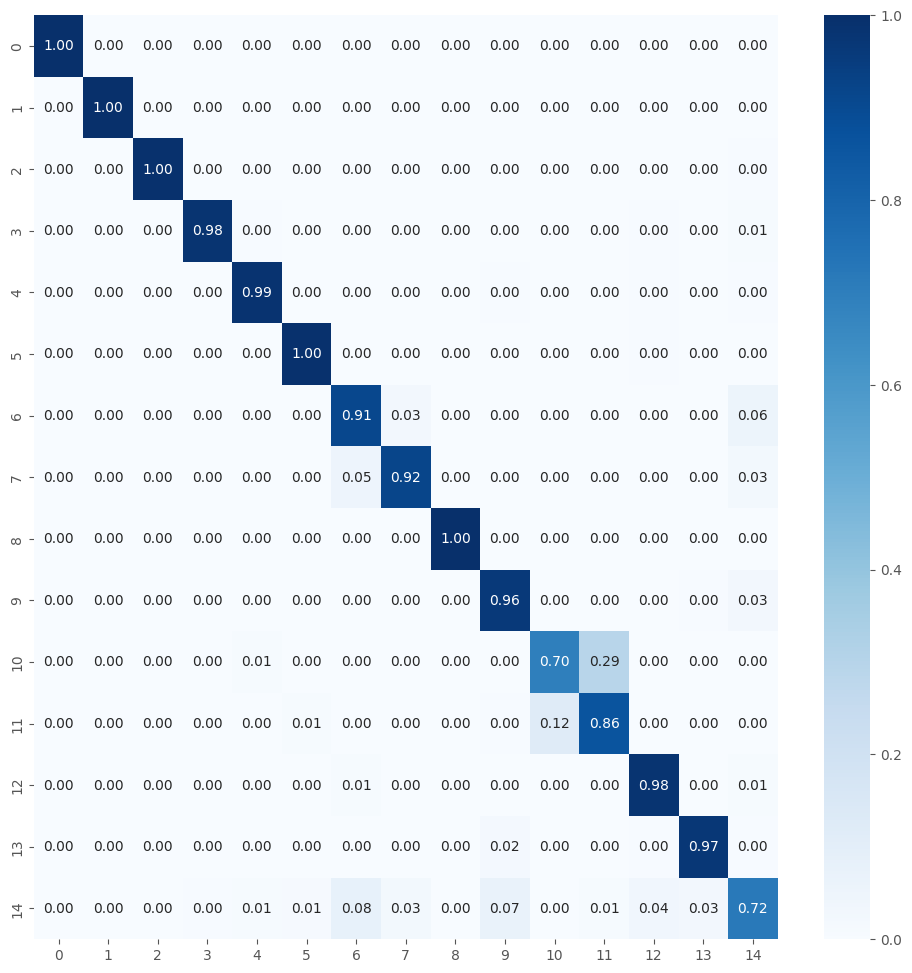


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150015_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_12_bn
- conv_pw_12_relu
- conv_dw_13
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_28
- dense_84
- batch_normalization_28
- dropout_56
- dense_85
- dropout_57
- dense_86
Total: 18/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
492/492 [==============================] - 42s 77ms/step - loss: 0.2162 - accuracy: 0.9198 - val_loss: 0.2950 - val_accuracy: 0.9119 - lr: 3.5726e-05
Epoch 2/50
492/492 [==============================] - 36s 73ms/step - loss: 0.1696 - accuracy: 0.9381 - val_loss: 0.2989 - val_accuracy: 0.9012 - lr: 3.5726e-05
Epoch 3/50
492/492 [==============================] - 37s 74ms/step - loss: 0.1607 - accuracy: 0.9398 -

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150015_3.pkl
493/493 [==============================] - 30s 60ms/step - loss: 0.0853 - accuracy: 0.9706
Train Accuracy: 0.9706031680107117
Train Log Loss: 0.08532755821943283
106/106 [==============================] - 7s 62ms/step - loss: 0.3231 - accuracy: 0.9256
Validation Accuracy: 0.9256296157836914
Validation Log Loss: 0.32308998703956604
106/106 [==============================] - 6s 59ms/step - loss: 0.3129 - accuracy: 0.9348
Test Accuracy: 0.9348148107528687
Test Log Loss: 0.3129251003265381
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'upatre': 12, 'wabot': 13, 'wacatac': 14}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0

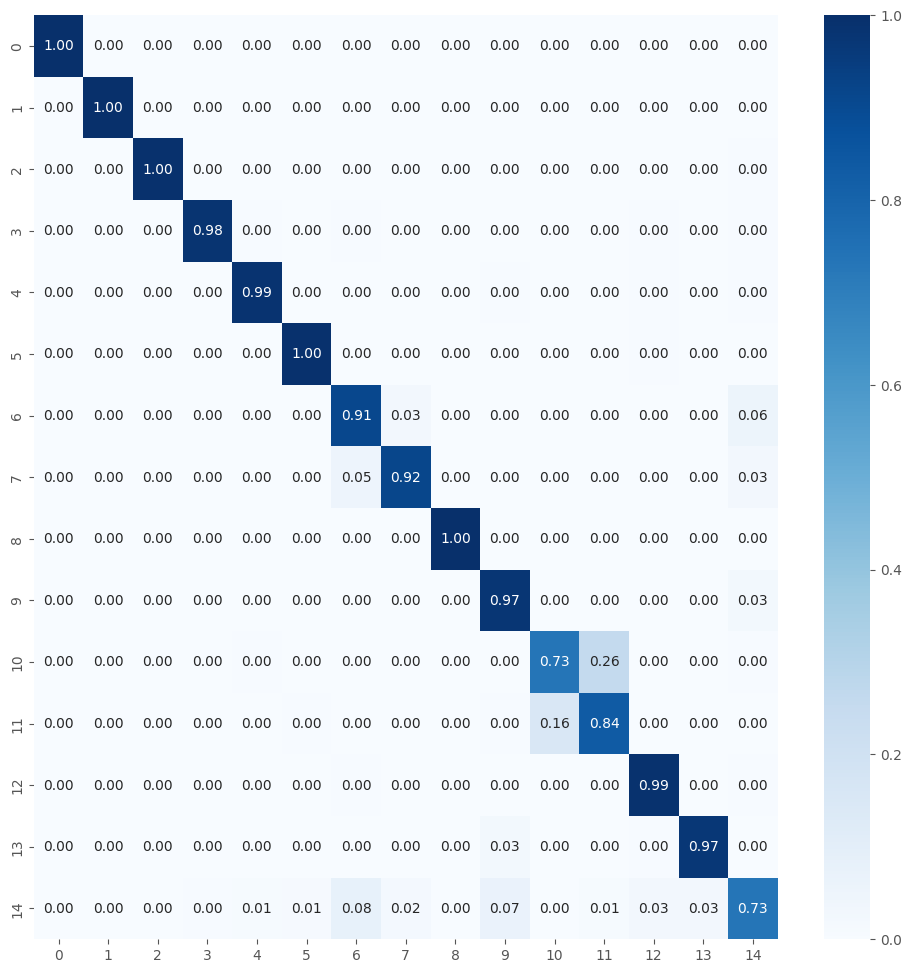


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150015_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_12_bn
- conv_pw_12_relu
- conv_dw_13
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_28
- dense_84
- batch_normalization_28
- dropout_56
- dense_85
- dropout_57
- dense_86
Total: 18/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
492/492 [==============================] - 40s 74ms/step - loss: 0.2106 - accuracy: 0.9233 - val_loss: 0.3059 - val_accuracy: 0.9125 - lr: 3.5726e-05
Epoch 2/50
492/492 [==============================] - 36s 72ms/step - loss: 0.1749 - accuracy: 0.9332 - val_loss: 0.3011 - val_accuracy: 0.9107 - lr: 3.5726e-05
Epoch 3/50
492/492 [==============================] - 36s 73ms/step - loss: 0.1595 - accuracy: 0.9396 -

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150015_4.pkl
493/493 [==============================] - 30s 60ms/step - loss: 0.0824 - accuracy: 0.9726
Train Accuracy: 0.9725714325904846
Train Log Loss: 0.08237199485301971
106/106 [==============================] - 6s 60ms/step - loss: 0.3281 - accuracy: 0.9280
Validation Accuracy: 0.9279999732971191
Validation Log Loss: 0.32810166478157043
106/106 [==============================] - 6s 60ms/step - loss: 0.3157 - accuracy: 0.9354
Test Accuracy: 0.9354074001312256
Test Log Loss: 0.31574100255966187
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'upatre': 12, 'wabot': 13, 'wacatac': 14}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   

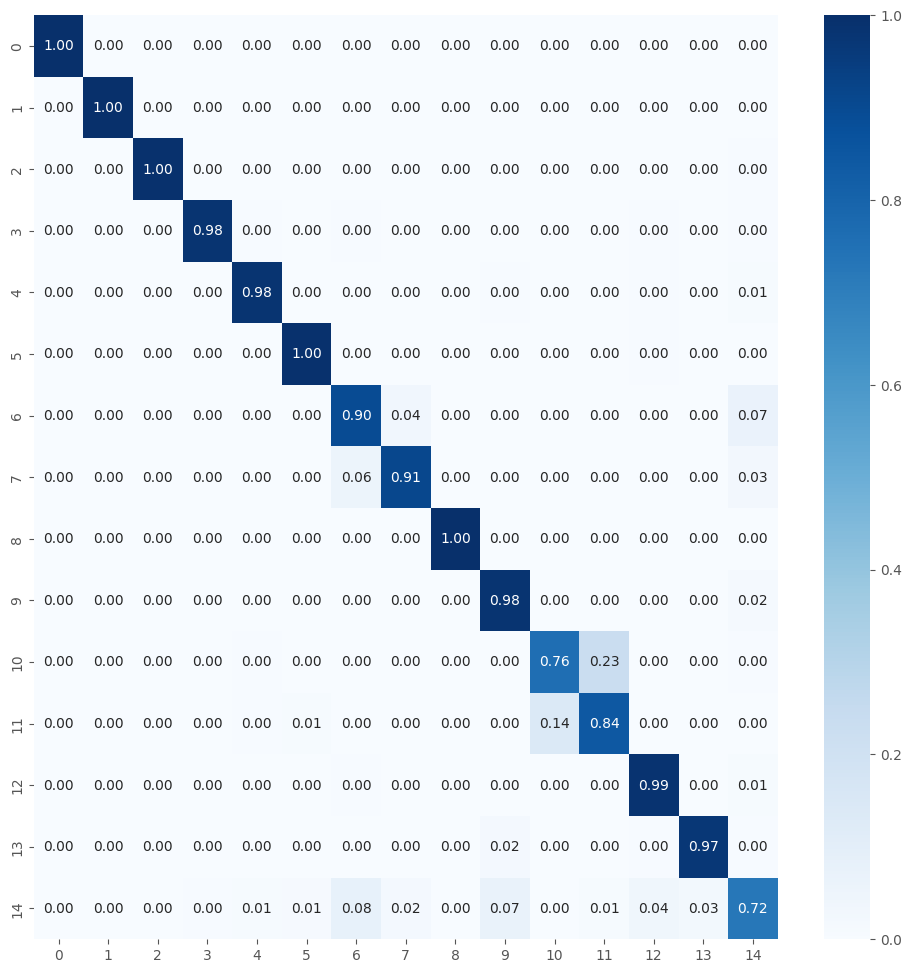


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150015_best.h5
Model loaded successfully.

Capas configuradas como entrenables:
- conv_dw_1
- conv_pw_1
- conv_pw_3
- conv_pw_12_bn
- conv_pw_12_relu
- conv_dw_13
- conv_dw_13_bn
- conv_dw_13_relu
- conv_pw_13
- conv_pw_13_bn
- conv_pw_13_relu
- global_average_pooling2d_28
- dense_84
- batch_normalization_28
- dropout_56
- dense_85
- dropout_57
- dense_86
Total: 18/93 capas entrenables
Model loaded and recompiled for fine-tuning
Epoch 1/50
492/492 [==============================] - 40s 74ms/step - loss: 0.2126 - accuracy: 0.9220 - val_loss: 0.3004 - val_accuracy: 0.9068 - lr: 3.5726e-05
Epoch 2/50
492/492 [==============================] - 34s 69ms/step - loss: 0.1670 - accuracy: 0.9358 - val_loss: 0.2825 - val_accuracy: 0.9187 - lr: 3.5726e-05
Epoch 3/50
492/492 [==============================] - 35s 71ms/step - loss: 0.1568 - accuracy: 0.9407 -

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150015_5.pkl
493/493 [==============================] - 31s 62ms/step - loss: 0.0922 - accuracy: 0.9700
Train Accuracy: 0.9699682593345642
Train Log Loss: 0.09215137362480164
106/106 [==============================] - 6s 60ms/step - loss: 0.3100 - accuracy: 0.9259
Validation Accuracy: 0.9259259104728699
Validation Log Loss: 0.30995264649391174
106/106 [==============================] - 6s 60ms/step - loss: 0.3032 - accuracy: 0.9304
Test Accuracy: 0.9303703904151917
Test Log Loss: 0.30324169993400574
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'upatre': 12, 'wabot': 13, 'wacatac': 14}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   

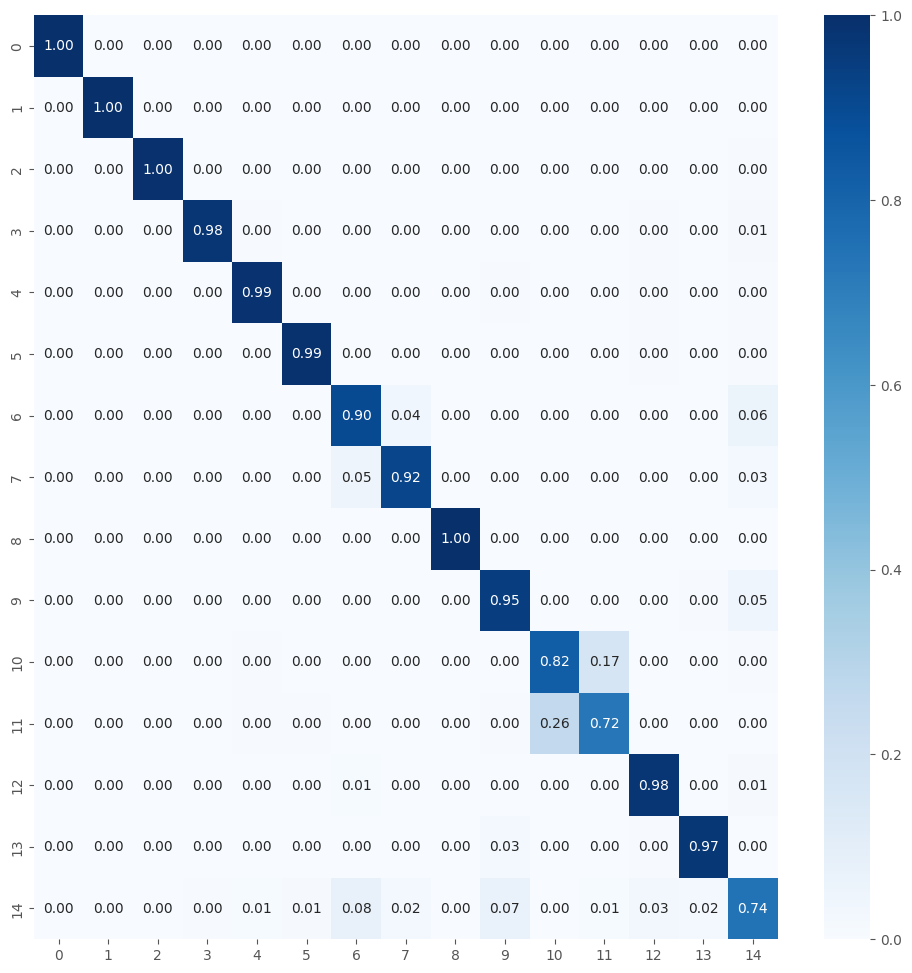


Best fold was 1 with val_accuracy: 0.9312
Average training accuracy in 5-fold: 0.9693345189094543
Average validation precision in 5-fold: 0.9280357122421264

Test Metrics
test_acc_list: [0.9321481585502625, 0.9324444532394409, 0.9348148107528687, 0.9354074001312256, 0.9303703904151917]
Average Test Accuracy with 5-fold: 0.9330370426177979
test_loss_list: [0.31072843074798584, 0.31387680768966675, 0.3129251003265381, 0.31574100255966187, 0.30324169993400574]
Average Test Log Loss with 5-fold: 0.31130260825157163

Precision List: [0.9343806142275765, 0.9329776787896814, 0.9347950548390187, 0.9351535575062527, 0.9301749607660846]
Average Precision List with 5-fold: 0.9334963732257229
Recall List: [0.9321481481481482, 0.9324444444444445, 0.9348148148148147, 0.9354074074074075, 0.9303703703703705]
Average Recall List with 5-fold: 0.9330370370370371
F1 Score List: [0.9308316494779647, 0.931506090615845, 0.9340806357524966, 0.9346469880080461, 0.9298806342921259]
Average F1 Score List with 5

In [35]:
%%time

num_classes = 15
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, 
    precision_list_all, recall_list_all, f1_score_list_all)

In [36]:
print(f"test_acc_list_all = {test_acc_list_all}")
print(f"test_loss_list_all = {test_loss_list_all}")
print(f"precision_list_all = {precision_list_all}")
print(f"recall_list_all = {recall_list_all}")
print(f"f1_score_list_all = {f1_score_list_all}")

test_acc_list_all = [1.0, 1.0, 0.9977777600288391, 0.9935999989509583, 0.9952592611312866, 0.9944126963615417, 0.9951111197471618, 0.9957531094551086, 0.974577784538269, 0.9519191980361938, 0.9547407269477844, 0.9540512800216675, 0.924825394153595, 0.9330370426177979]
test_loss_list_all = [0.07376733571290969, 0.03088051825761795, 0.032088705152273175, 0.12257016003131867, 0.046250124275684354, 0.05670353174209595, 0.07577060535550117, 0.08527055680751801, 0.17998099327087402, 0.27177865505218507, 0.27469291985034944, 0.22333667278289795, 0.29802689552307127, 0.31130260825157163]
precision_list_all = [1.0, 1.0, 0.9977973568281937, 0.9936348830856725, 0.9952820171138909, 0.9944565046781811, 0.9951552011851679, 0.9957773058416759, 0.9745443265948908, 0.9513080877857369, 0.9541898570817711, 0.9537323277415993, 0.9246077496163864, 0.9334963732257229]
recall_list_all = [1.0, 1.0, 0.9977777777777778, 0.9936, 0.9952592592592595, 0.9944126984126985, 0.9951111111111113, 0.9957530864197531, 0.97

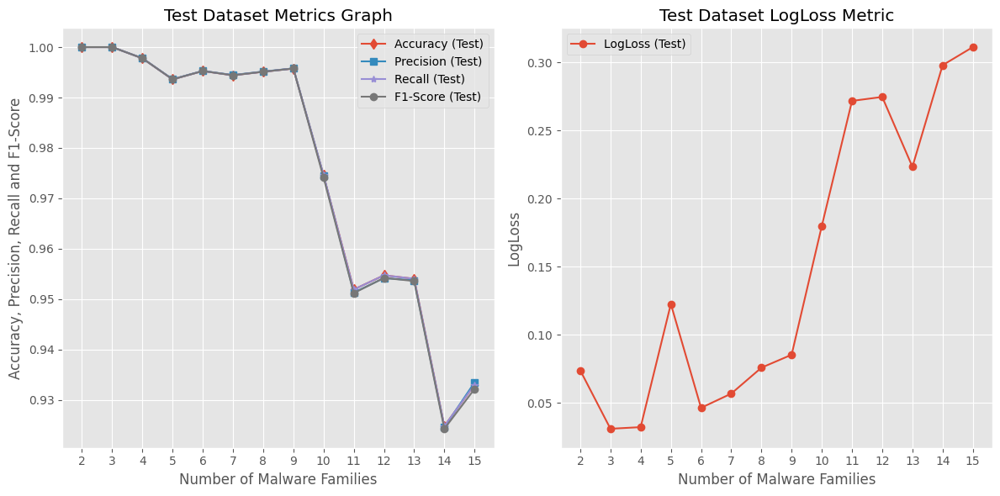

In [37]:
import matplotlib.pyplot as plt

# Datos históricos
strategies = [str(i) for i in range(2, len(test_acc_list_all) + 2)]

# Crear gráfico para Test Accuracy y Test LogLoss en una fila con dos columnas
fig, axes = plt.subplots(1, 2, figsize=(12, 6))


# Gráfico para Test Accuracy, Precision, Recall and F1-Score
axes[0].plot(strategies, test_acc_list_all, marker='d', label='Accuracy (Test)')
axes[0].plot(strategies, precision_list_all, marker='s', label='Precision (Test)')
axes[0].plot(strategies, recall_list_all, marker='*', label='Recall (Test)')
axes[0].plot(strategies, f1_score_list_all, marker='o', label='F1-Score (Test)')
axes[0].set_title('Test Dataset Metrics Graph')
axes[0].set_xlabel('Number of Malware Families')
axes[0].set_ylabel('Accuracy, Precision, Recall and F1-Score')
axes[0].legend()
axes[0].grid(True)

# Gráfico para Test LogLoss
axes[1].plot(strategies, test_loss_list_all, marker='o', label='LogLoss (Test)')
axes[1].set_title('Test Dataset LogLoss Metric')
axes[1].set_xlabel('Number of Malware Families')
axes[1].set_ylabel('LogLoss')
axes[1].legend()
axes[1].grid(True)

plt.tight_layout()
plt.show()
